In [1]:
import time
import os
import numpy as np
import matplotlib.pyplot as plt
import qcodes as qc
import qcodes.instrument_drivers.nplab_drivers as npd

# Instrument initialization

In [2]:
npd.triton_init('lockin865', 'lockin830', 'srframe')
station = qc.Station(triton, lockin865, lockin830, srframe)

Connected to: OXFORD INSTRUMENTS Triton (serial:N/A, firmware:2.449) in 0.07s
Connected to: Stanford_Research_Systems SR865A (serial:003538, firmware:V1.51) in 0.46s
Connected to: Stanford_Research_Systems SR830 (serial:s/n49840, firmware:ver1.07) in 0.04s
Connected to: Stanford_Research_Systems SIM900 (serial:s/n152150, firmware:ver3.6) in 0.75s


In [294]:
lockin865.close()
lockin830.close()
srframe.close()
triton.close()

# Fridge cooldown 1/24/2020

Pumping out fridge started Friday evening at ~5:00 pm. Fridge cooldown started in the morning when pressure reading on the pump was 1.7e-3 torr. Pressure in the fridge OVC is supposedly at ~1.45e-2 torr. Cooled down to 1.5K by Sunday evening at 11pm (likely just an hour more till base temperature). Then we had to warm it up since we forgot to put the shield that goes between the magnet and the sample puck.

In [56]:
triton.read_temps()

MC - on:  107.773 K
MC_cernox - on:  289.705 K
still - on:  238.264 K
cold_plate - on:  238.264 K
magnet - off:  293.418 K
PT2h - on:  293.672 K
PT2p - on:  293.5 K
PT1h - on:  295.306 K
PT1p - on:  295.177 K


In [45]:
triton.read_pressures()

P1:  745.32
P2:  393.708
P3:  6.7
P4:  6.9
P5:  41.8247
POVC:  0.00055


In [46]:
triton.read_pumps()

Turbo: 0,  speed: 0.0 Hz
KNF: 0
Forepump: 0


In [47]:
triton.read_valves()

V1:  CLOSE
V2:  CLOSE
V3:  CLOSE
V4:  CLOSE
V5:  CLOSE
V6:  CLOSE
V7:  CLOSE
V8:  CLOSE
V9:  CLOSE


In [37]:
triton.status()

'OK'

# Cooldown number 2: 1/29/2020

Starting at 2.65e-2 mbar OVC pressure, at 5:30 pm, after pumping down ~5 hours.

In [3]:
triton.read_temps()

MC - on:  0.0297459 K
MC_cernox - off:  1.21336 K
still - off:  0.766062 K
cold_plate - off:  0.260684 K
magnet - off:  3.90164 K
PT2h - off:  3.2002 K
PT2p - off:  3.42827 K
PT1h - off:  47.0749 K
PT1p - off:  59.1463 K


In [7]:
triton.read_pressures()

P1:  -0.20133
P2:  406.679
P3:  0.0609
P4:  1.57
P5:  81.7753
POVC:  0.0003


# M26, W3, and W5 setup and initial measurements

## Setup

**Instrument setup**

Just a 100 M$\Omega$ resistor that limits the current. Excitation supplied by the lockin865, fed into the srframe summing amplifier. srframe.volt_p1 controls the gate (1 G$\Omega$ limiting resistor), and srframe.volt_p5 controls the DC offset going into the summing amplifier

**M26: two hallbars with 8 contacts, both on the same gate. Single-sided WSe2, aligned hBN**

Gate 12 (PPMS->fridge 14->12)

Device 1: 25-30, 2, 13 (13 doesn't work)<br>
PPMS->Fridge contacts: x->25, 7->26, 6->27, 5->28, 4->29, 3->30, x->13, x->2 (x means not connected on the PPMS)<br>
Source/drain are 30, 26

Device 2: 3-10 (looks like 3, 4 are shorted somehow)<br>
PPMS->Fridge contacts: x->3, x->4, 8->5, 9->6, 10->7, 11(not good contact)->8, 12->9, 13->10<br>
Source/drain are 9, 5

**W3: double sided WSe2, 12-contact hallbar**

Gate 22 (PPMS->Fridge 9->22)

Lines used: 14, 16, 17, 19-21, (14-21 all seem bad, except perhaps 14 is useable) 23, 24, 44-48 (47 requires 45 to be floating)

It looks like we should use 23, 44 as source/drain, though perhaps 14 will work instead of 44.

PPMS->Fridge contacts: 4->14, x->16, 5->17, 6->19, 7->20, 8->21, 10->23, 11->24, 12->48, 13->47, 14->46, 3->44

**W5: same setup as W3, same basic design**

Gate 36 (PPMS->Fridge 6->36)

Lines used: 31-35, 37-42 (one contact not bonded because N-grease got on the pad)

PPMS->Fridge contacts: 12->31, 11->32, 10->33, 9->34, 8->x, 7->35, 5->37, 4->38, 3->39, 14->40, x->41, 13->42

31-34 seem like bad contacts (and 8 on the PPMS too). High resistance. Perhaps 32 is good. 34 is perhaps marginally good, but measurements taken with it show large fluctuations. 42 also has high resistance, though it may work.

It seems best to use 41, 35 as source/drain.

## Initial measurements

In [8]:
srframe.volt_p1.step = 0.08
srframe.volt_p1.inter_delay = 0.1
srframe.volt_p5.step = 0.08
srframe.volt_p5.inter_delay = 0.1

In [119]:
# M26 test

In [120]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data1, plot1 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='M26_basetemp_1nA_28-27_865')
srframe.volt_p1(0)

Started at 2020-02-01 14:13:17
DataSet:
   location = 'data/2020-02-01/#001_M26_basetemp_1nA_28-27_865_14-13-07'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
Finished at 2020-02-01 14:20:08


In [9]:
%matplotlib notebook

<IPython.core.display.Javascript object>


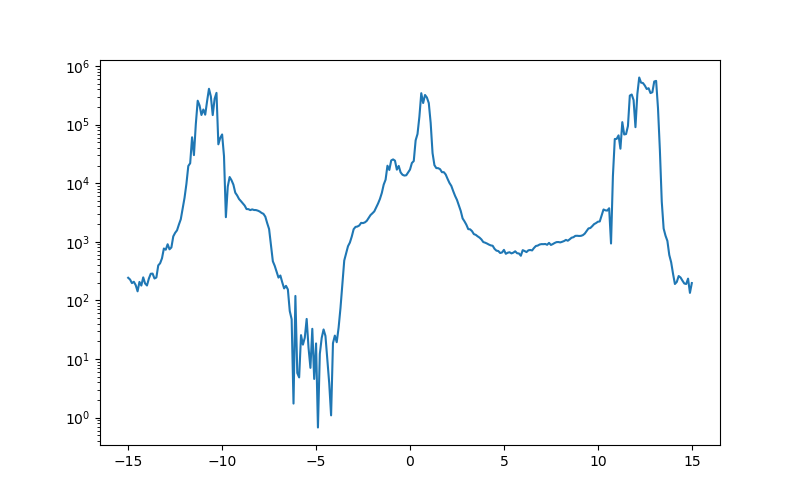

In [122]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, np.abs(data1.lockin865_X[:]/1e-9), label='M26 28-27')

In [123]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data2, plot2 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='M26_basetemp_1nA_28-27_865_repeat')
srframe.volt_p1(0)

Started at 2020-02-01 14:23:11
DataSet:
   location = 'data/2020-02-01/#002_M26_basetemp_1nA_28-27_865_repeat_14-23-10'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
Finished at 2020-02-01 14:30:03


<IPython.core.display.Javascript object>


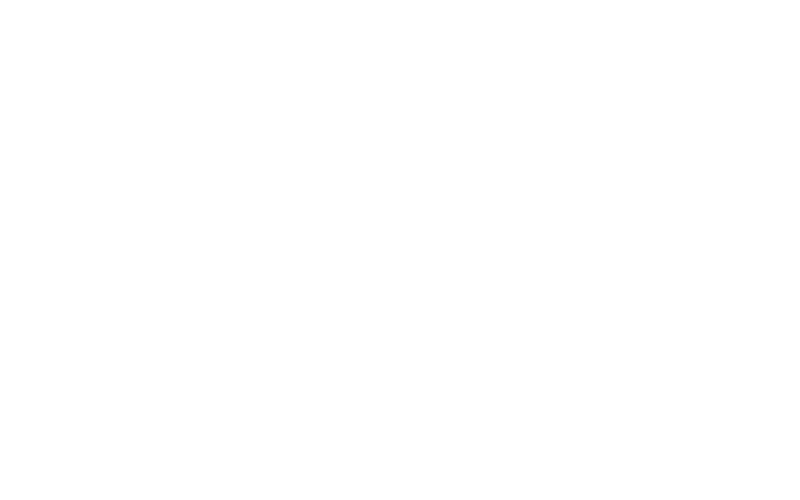

In [125]:
plt.figure(figsize=(8, 5))
#plt.semilogy(gvals, np.abs(data1.lockin865_X[:]/1e-9), label='M26 28-27 source 26')
plt.semilogy(gvals, np.abs(data2.lockin865_X[:]/1e-9), label='M26 28-27 source 29')

In [126]:
bvals = np.linspace(0, 4, 41)
gvals = np.linspace(-12, 13, 401)
data3, plot3 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=10, SetDelay2=1.1, Param2_SetBetween=0, DataName='M26_865_28-27_830_25-27_2nA_0to4T')

Started at 2020-02-01 15:18:46
Are you sure you want to use the magnet? [y/n]: y
Please wait 10.594 seconds for the field sweep, plus the time required for operating the switch...
Please wait 69.988 seconds for the field sweep, plus the time required for operating the switch...
Please wait 69.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 69.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 70.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 70.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 69.988 seconds for the field sweep, plus the time required for operating the switch...
Please wait 69.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 69.988 seconds for the field sweep, plus the time required for operating the switch...
Please wait 69.994 seconds f

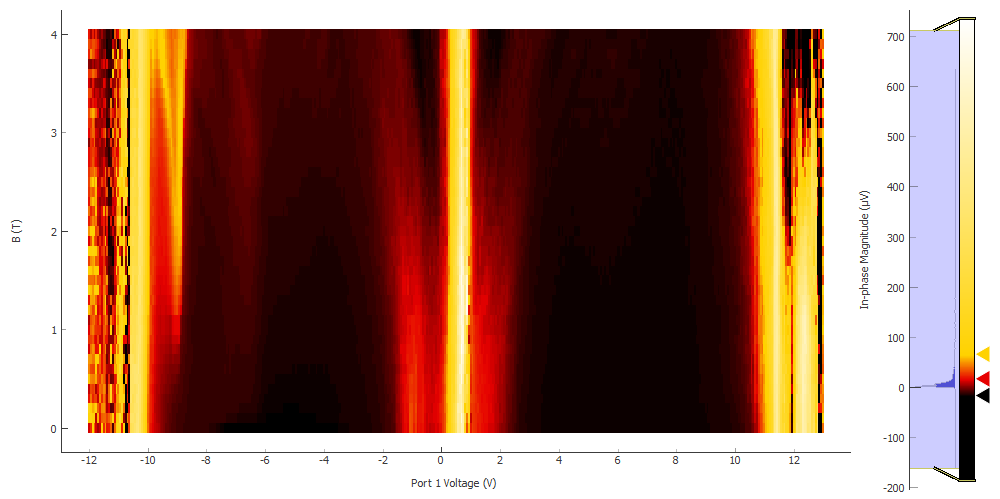

In [348]:
plot3[0]

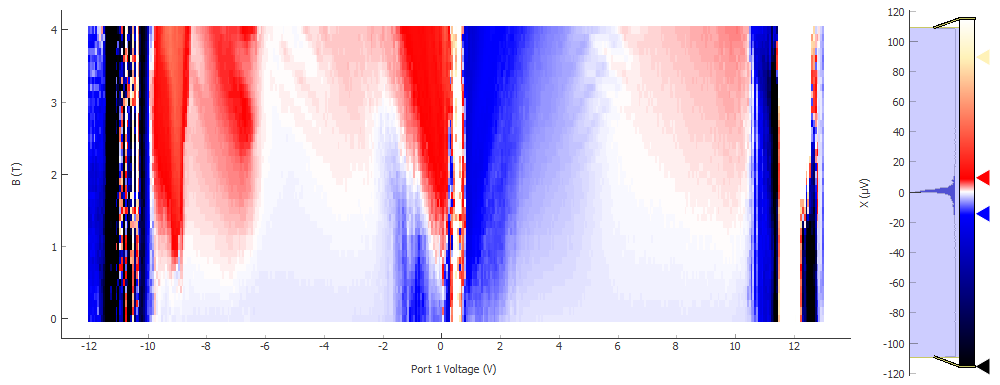

In [349]:
plot3[2]

In [127]:
bvals = np.linspace(4.1, 6, 20)
gvals = np.linspace(-12, 13, 401)
data4, plot4 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=10, SetDelay2=1.1, Param2_SetBetween=0, DataName='M26_865_28-27_830_25-27_2nA_4p1to6T')

Started at 2020-02-02 06:21:57
Please wait 69.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 69.988 seconds for the field sweep, plus the time required for operating the switch...
Please wait 70.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 69.988 seconds for the field sweep, plus the time required for operating the switch...
Please wait 70.012 seconds for the field sweep, plus the time required for operating the switch...
Please wait 69.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 70.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 70.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 70.012 seconds for the field sweep, plus the time required for operating the switch...
Please wait 69.994 seconds for the field sweep, plus the time required for opera

In [128]:
lockin865.amplitude(0)

In [129]:
#now go to W5

In [130]:
srframe.volt_p1(-8)
time.sleep(10)
gvals = np.linspace(-8, 8, 321)
data5, plot5 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='W5_basetemp_1nA_I41-35_V37-38_865')
srframe.volt_p1(0)

Started at 2020-02-03 10:55:48
DataSet:
   location = 'data/2020-02-03/#001_W5_basetemp_1nA_I41-35_V37-38_865_10-55-48'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (321,)
   Measured | lockin865_X         | X            | (321,)
   Measured | lockin865_Y         | Y            | (321,)
Finished at 2020-02-03 11:02:17


In [131]:
srframe.volt_p1(8)
time.sleep(10)
gvals = np.linspace(8, -8, 321)
data6, plot6 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='W5_basetemp_1nA_I41-35_V39-38_865')
srframe.volt_p1(0)

Started at 2020-02-03 11:05:15
DataSet:
   location = 'data/2020-02-03/#002_W5_basetemp_1nA_I41-35_V39-38_865_11-05-14'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (321,)
   Measured | lockin865_X         | X            | (321,)
   Measured | lockin865_Y         | Y            | (321,)
Finished at 2020-02-03 11:11:44


In [132]:
srframe.volt_p1(8)
time.sleep(10)
gvals = np.linspace(8, -8, 321)
data7, plot7 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='W5_basetemp_1nA_I41-35_V40-39_865')
srframe.volt_p1(0)

Started at 2020-02-03 11:14:56
DataSet:
   location = 'data/2020-02-03/#003_W5_basetemp_1nA_I41-35_V40-39_865_11-14-55'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (321,)
   Measured | lockin865_X         | X            | (321,)
   Measured | lockin865_Y         | Y            | (321,)
Finished at 2020-02-03 11:21:25


<IPython.core.display.Javascript object>


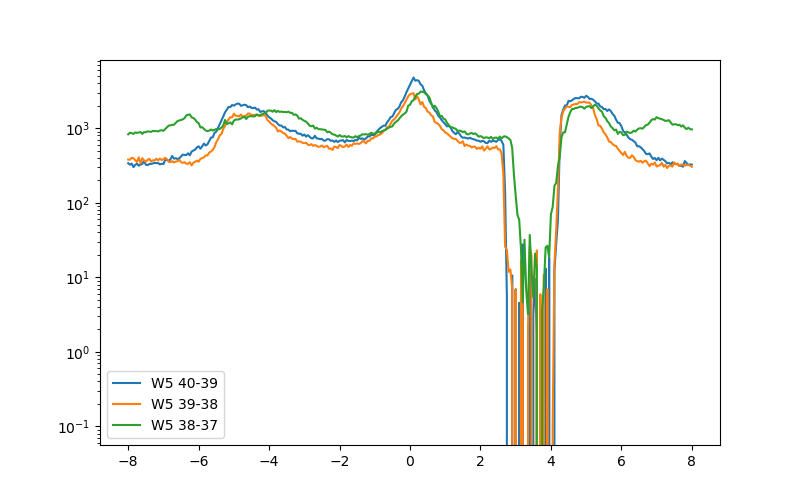

In [139]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, data7.lockin865_X[:]/1e-9, label='W5 40-39')
plt.semilogy(gvals, data6.lockin865_X[:]/1e-9, label='W5 39-38')
plt.semilogy(-gvals, data5.lockin865_X[:]/1e-9, label='W5 38-37')
plt.legend()

In [140]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data8, plot8 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='M26_basetemp_1nA_29-28_865_source30')
srframe.volt_p1(0)

Started at 2020-02-03 12:38:40
DataSet:
   location = 'data/2020-02-03/#004_M26_basetemp_1nA_29-28_865_source30_12-38-39'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
Finished at 2020-02-03 12:45:44


<IPython.core.display.Javascript object>


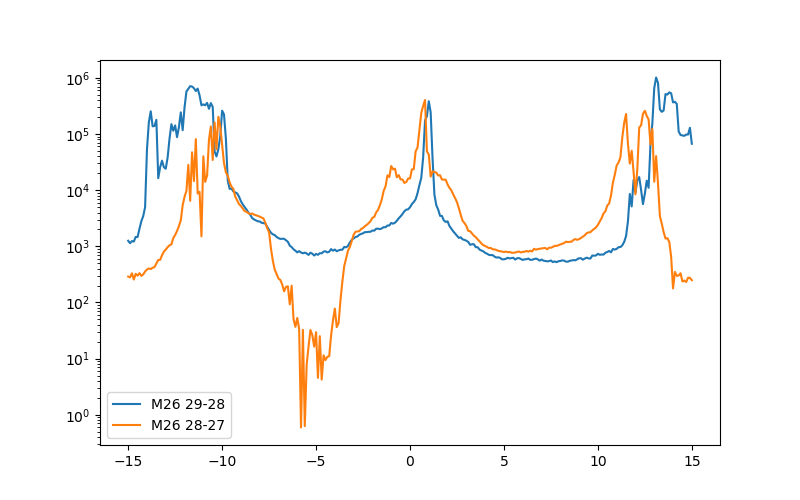

In [141]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, np.abs(data8.lockin865_X[:]/1e-9), label='M26 29-28')
plt.semilogy(gvals, np.abs(data2.lockin865_X[:]/1e-9), label='M26 28-27')
plt.legend()

In [143]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data9, plot9 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_basetemp_0.5nA_29-28_865_28-2_830_source30')
srframe.volt_p1(0)

Started at 2020-02-03 12:53:43
DataSet:
   location = 'data/2020-02-03/#005_M26_basetemp_0.5nA_29-28_865_28-2_830_source30_12-53-41'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
Finished at 2020-02-03 13:00:56


In [144]:
triton.field(-0.5)

Sweep time approximately 159.70000000000002 seconds


In [147]:
triton.field(0)

Sweep time approximately 160.0 seconds


In [146]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data10, plot10 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_basetemp_0.5nA_29-28_865_28-2_830_source30_after-0.5T')
srframe.volt_p1(0)

Started at 2020-02-03 13:02:16
DataSet:
   location = 'data/2020-02-03/#006_M26_basetemp_0.5nA_29-28_865_28-2_830_source30_after-0.5T_13-02-15'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
Finished at 2020-02-03 13:09:30


In [148]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data11, plot11 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_basetemp_0.5nA_29-28_865_28-2_830_source30_after-0.5T')
srframe.volt_p1(0)

Started at 2020-02-03 13:15:20
DataSet:
   location = 'data/2020-02-03/#007_M26_basetemp_0.5nA_29-28_865_28-2_830_source30_after-0.5T_13-15-18'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
Finished at 2020-02-03 13:22:34


<IPython.core.display.Javascript object>


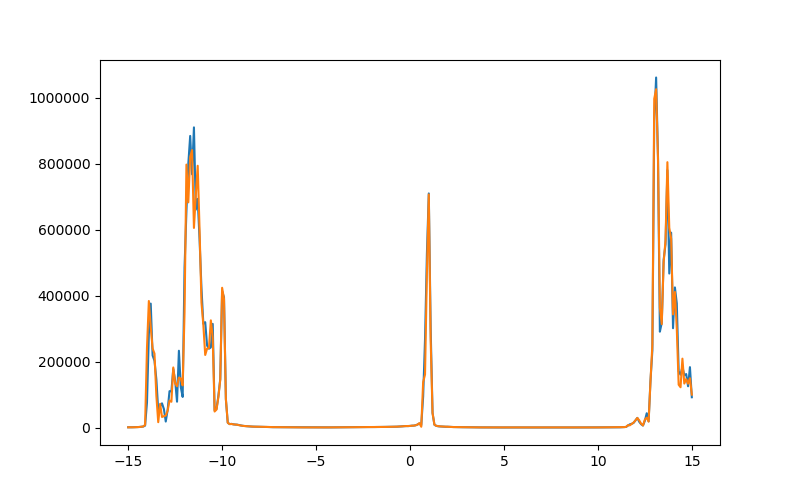

In [158]:
plt.figure(figsize=(8, 5))
plt.plot(gvals, (data9.lockin865_X[:]/0.5e-9), label='M26 before')
plt.plot(gvals, (data11.lockin865_X[:]/0.5e-9), label='M26 after')
#plt.legend()

In [159]:
triton.field()

0.389215

In [160]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data12, plot12 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_basetemp_0.5nA_29-28_865_28-2_830_source30_after+0.5T')
srframe.volt_p1(0)

Started at 2020-02-03 13:52:14
DataSet:
   location = 'data/2020-02-03/#008_M26_basetemp_0.5nA_29-28_865_28-2_830_source30_after+0.5T_13-52-13'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
Finished at 2020-02-03 13:59:28


<IPython.core.display.Javascript object>


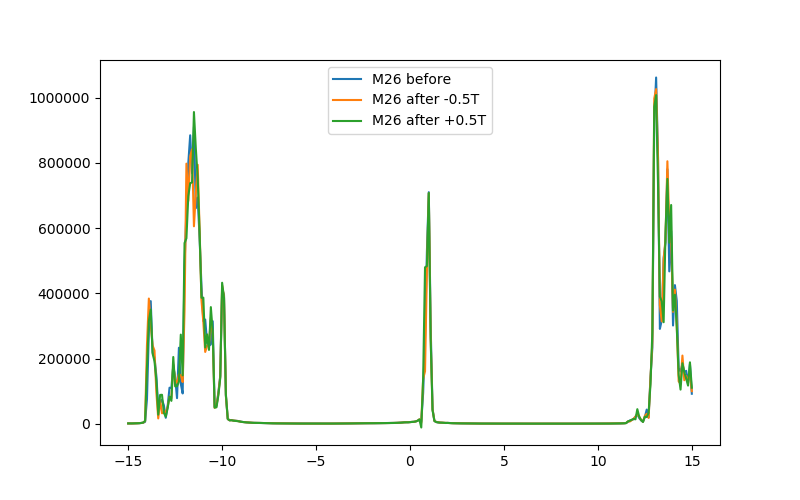

In [162]:
plt.figure(figsize=(8, 5))
plt.plot(gvals, (data9.lockin865_X[:]/0.5e-9), label='M26 before')
plt.plot(gvals, (data11.lockin865_X[:]/0.5e-9), label='M26 after -0.5T')
plt.plot(gvals, (data12.lockin865_X[:]/0.5e-9), label='M26 after +0.5T')
plt.legend()

In [163]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data13, plot13 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='M26_basetemp_0.5nA_28-27_865_source30_after+0.5T')
srframe.volt_p1(0)

Started at 2020-02-03 14:54:31
DataSet:
   location = 'data/2020-02-03/#009_M26_basetemp_0.5nA_28-27_865_source30_after+0.5T_14-54-30'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
Finished at 2020-02-03 15:01:22


In [164]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data14, plot14 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='M26_basetemp_0.5nA_28-27_865_source30_after+0.5T_repeat')
srframe.volt_p1(0)

Started at 2020-02-03 15:02:31
DataSet:
   location = 'data/2020-02-03/#010_M26_basetemp_0.5nA_28-27_865_source30_after+0.5T_repeat_15-02-30'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
Finished at 2020-02-03 15:09:23


In [165]:
triton.field(-0.5)

Sweep time approximately 160.006 seconds


<IPython.core.display.Javascript object>


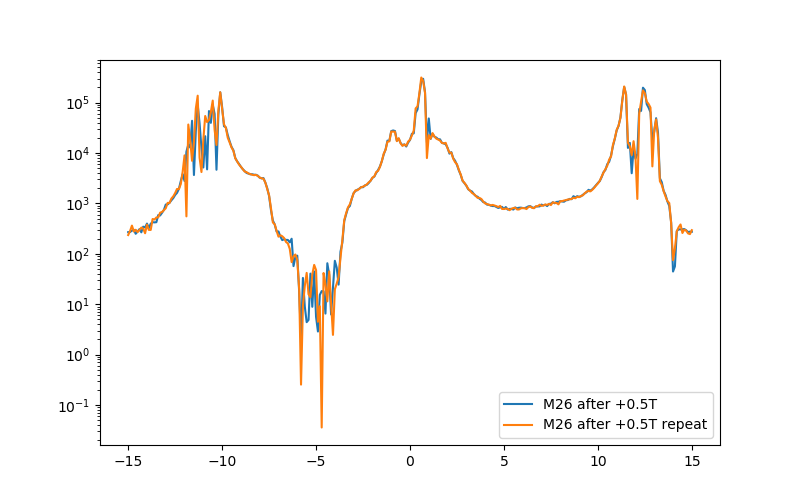

In [167]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, np.abs(data13.lockin865_X[:]/0.5e-9), label='M26 after +0.5T')
plt.semilogy(gvals, np.abs(data14.lockin865_X[:]/0.5e-9), label='M26 after +0.5T repeat')
plt.legend()

In [169]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data15, plot15 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='M26_basetemp_0.5nA_28-27_865_source30_after-0.7T')
srframe.volt_p1(0)

Started at 2020-02-03 15:18:09
DataSet:
   location = 'data/2020-02-03/#012_M26_basetemp_0.5nA_28-27_865_source30_after-0.7T_15-18-09'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
Finished at 2020-02-03 15:25:01


<IPython.core.display.Javascript object>


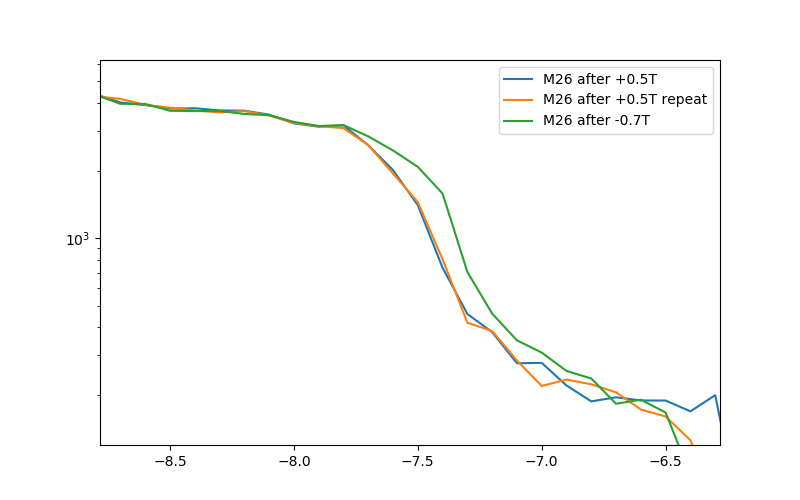

In [170]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, np.abs(data13.lockin865_X[:]/0.5e-9), label='M26 after +0.5T')
plt.semilogy(gvals, np.abs(data14.lockin865_X[:]/0.5e-9), label='M26 after +0.5T repeat')
plt.semilogy(gvals, np.abs(data15.lockin865_X[:]/0.5e-9), label='M26 after -0.7T')
plt.legend()

In [171]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data16, plot16 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='M26_basetemp_0.5nA_28-27_865_source30_after-0.7T_repeat')
srframe.volt_p1(0)

Started at 2020-02-03 15:27:57
DataSet:
   location = 'data/2020-02-03/#013_M26_basetemp_0.5nA_28-27_865_source30_after-0.7T_repeat_15-27-56'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
Finished at 2020-02-03 15:34:48


<IPython.core.display.Javascript object>


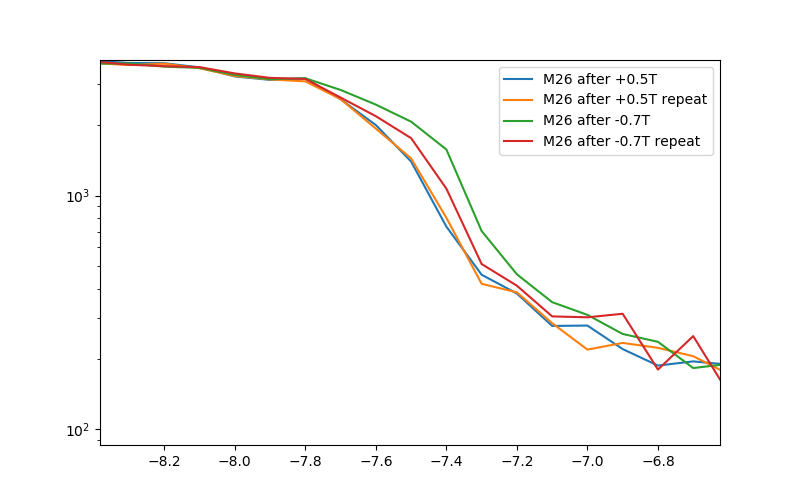

In [172]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, np.abs(data13.lockin865_X[:]/0.5e-9), label='M26 after +0.5T')
plt.semilogy(gvals, np.abs(data14.lockin865_X[:]/0.5e-9), label='M26 after +0.5T repeat')
plt.semilogy(gvals, np.abs(data15.lockin865_X[:]/0.5e-9), label='M26 after -0.7T')
plt.semilogy(gvals, np.abs(data16.lockin865_X[:]/0.5e-9), label='M26 after -0.7T repeat')
plt.legend()

# W5 fan diagram

In [173]:
srframe.volt_p1(-8)
time.sleep(15)
gvals = np.linspace(-8, 8, 401)
data17, plot17 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin865.R, lockin830.X, lockin830.Y, lockin830.R, DataName='W5_865_39-38_830_38-37_baseT_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-02-03 17:21:21
DataSet:
   location = 'data/2020-02-03/#014_W5_865_39-38_830_38-37_baseT_1nA_gatesweep_17-21-18'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (401,)
   Measured | lockin865_X         | X            | (401,)
   Measured | lockin865_Y         | Y            | (401,)
   Measured | lockin865_R         | R            | (401,)
   Measured | lockin830_X         | X            | (401,)
   Measured | lockin830_Y         | Y            | (401,)
   Measured | lockin830_R         | R            | (401,)
Finished at 2020-02-03 17:30:22


In [174]:
triton.magnet_sweeprate(0.1)

In [175]:
triton.magnet_POC(0)

In [176]:
triton.magnet_swh()

1

In [177]:
srframe.volt_p1(-7)
time.sleep(15)
gvals = np.linspace(-7, 7, 701)
bvals = np.linspace(0, 7, 141)
data18, plot18 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=15, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_865_39-38Rxx_830_38-37Rxx_baseT_2nA_B-Vgsweep')

Started at 2020-02-03 17:50:10
Please wait 10.018 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.988 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.006 seconds for the field sweep, plus the time required for operating

In [185]:
srframe.volt_p1(0)

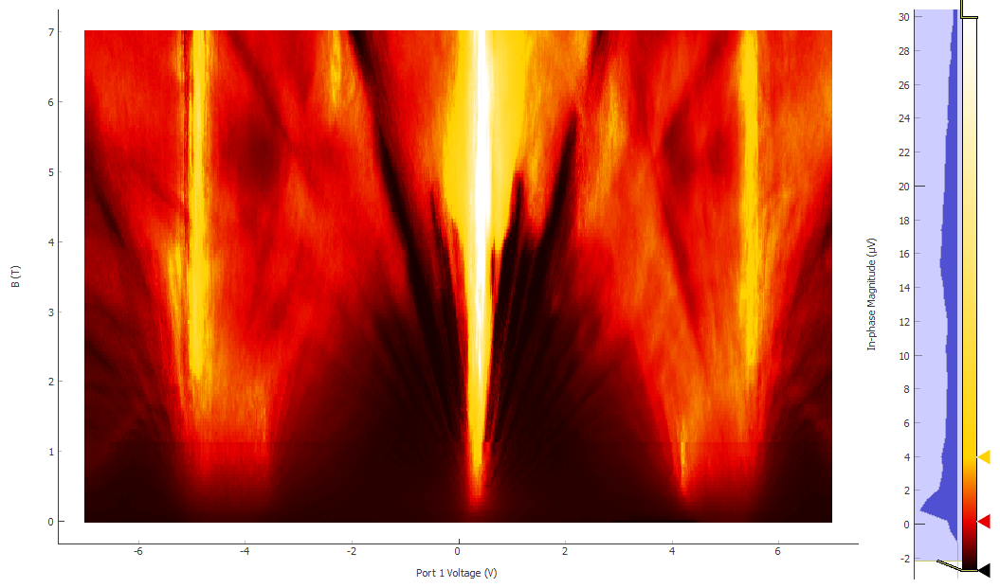

In [181]:
plot18[0]#39-38Rxx

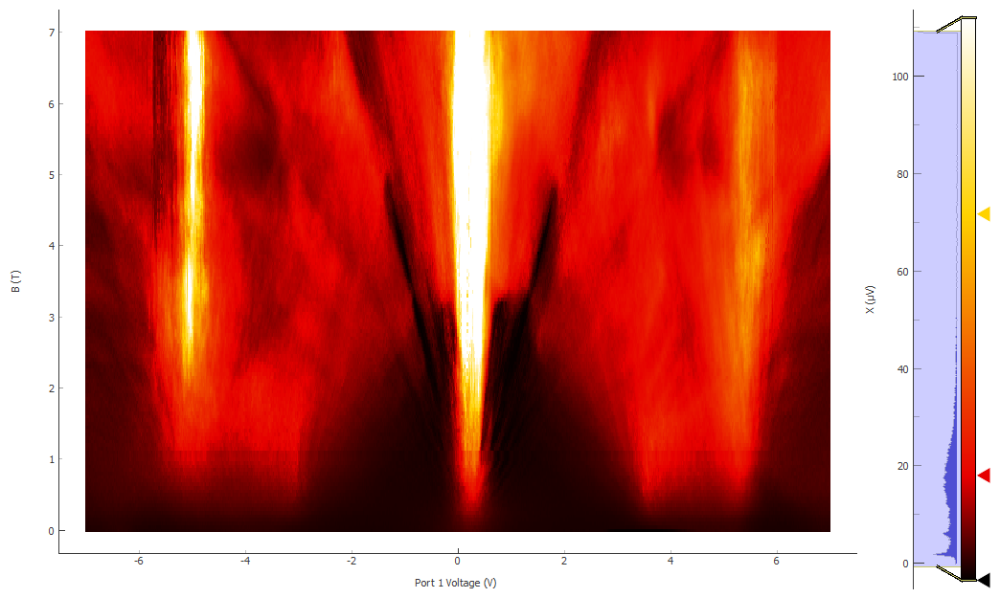

In [182]:
plot18[2]#38-37Rxx

In [183]:
srframe.volt_p1(-8)
time.sleep(15)
gvals = np.linspace(-8, 8, 401)
data19, plot19 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin865.R, lockin830.X, lockin830.Y, lockin830.R, DataName='W5_865_40-39Rxx_830_40-32Rxy_baseT_2nA_B=7T_gatesweep')
srframe.volt_p1(0)

Started at 2020-02-05 09:22:27
DataSet:
   location = 'data/2020-02-05/#001_W5_865_40-39Rxx_830_40-32Rxy_baseT_2nA_B=7T_gatesweep_09-22-25'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (401,)
   Measured | lockin865_X         | X            | (401,)
   Measured | lockin865_Y         | Y            | (401,)
   Measured | lockin865_R         | R            | (401,)
   Measured | lockin830_X         | X            | (401,)
   Measured | lockin830_Y         | Y            | (401,)
   Measured | lockin830_R         | R            | (401,)
Finished at 2020-02-05 09:31:29


In [186]:
srframe.volt_p1(-7)
time.sleep(15)
gvals = np.linspace(-7, 7, 701)
bvals = np.linspace(7, 0, 141)
data20, plot20 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=15, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_865_40-39Rxx_830_40-32Rxy_baseT_2nA_B-Vgsweep')

Started at 2020-02-05 09:38:53
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.988 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.006 seconds for the field sweep, plus the time required for opera

In [188]:
srframe.volt_p1(0)

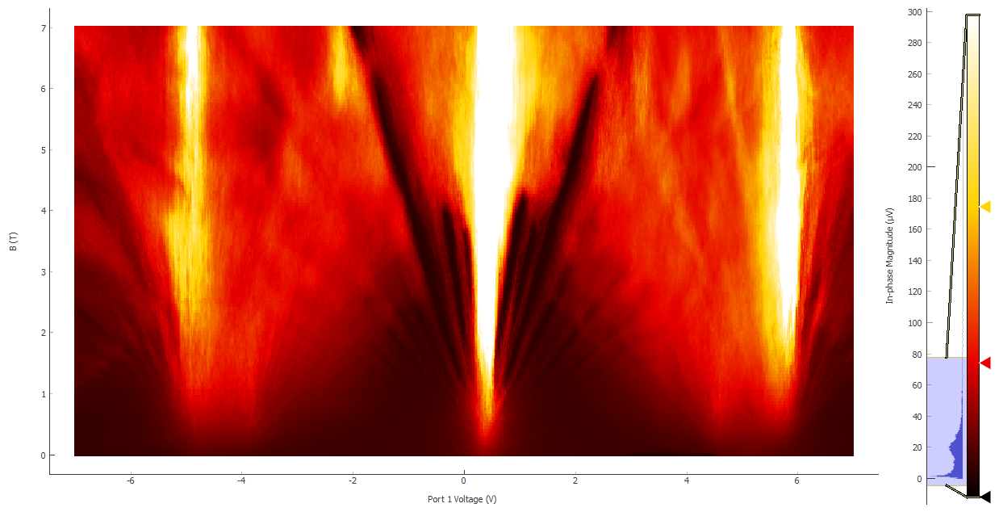

In [189]:
plot20[0]

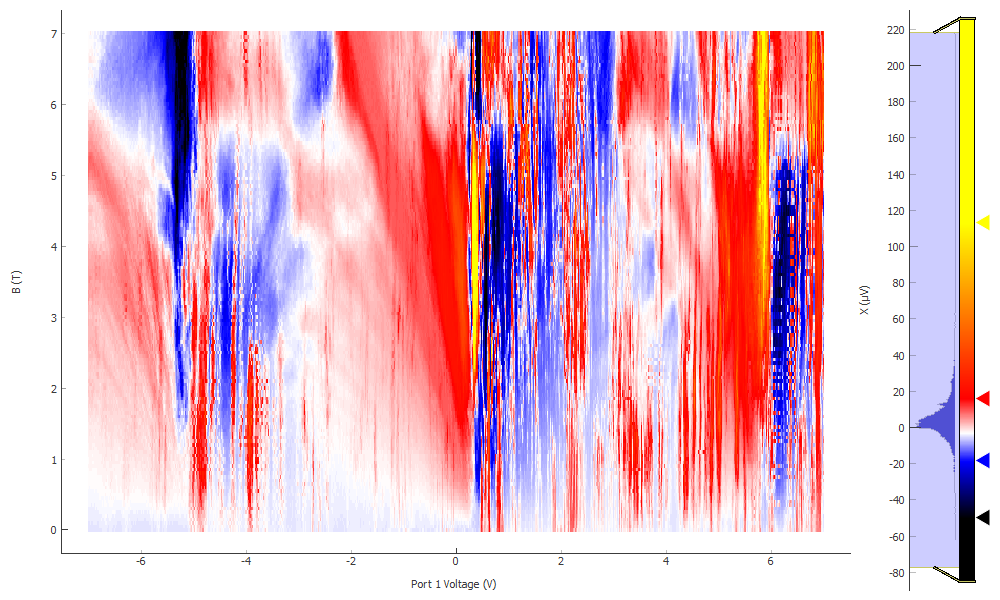

In [190]:
# Rxy was really messy, but it showed a few things on the hole side. Contact 32 is bad, so that's why
plot20[2]

In [191]:
triton.field()

7e-06

# W5 fraunhofer patterns

Unplugged the magnet temperature cable since the temperature is rather low.

First 40-39 on lockin830, 38-37 on lockin865 (lockin865 doesn't seem to zero out as well, for some reason, so this measurement may not work), 0.5 nA excitation (50 mV on a 100 MOhm resistor)

16.777 Hz, 3.3 V on the back gate seems to optimize it.

Take a course sweep first

In [192]:
triton.magnet_sweeprate(0.15)

In [195]:
triton.field(-0.05)

Sweep time approximately 15.994 seconds


In [194]:
triton.field()

-0.039981

In [209]:
# tried removing the ground connection from the breakout boxes and gate to SR865 right before the -40 mT sweep.
# Then tried floating the shields on the 865 (only the input) for the next sweep (-37.5 mT)
# Then I switched it back to the original configuration, with the braid connected to the ground on the back, and the shields grounded too
# It doesn't seem like any of these changes make any difference above the noise floor. Perhaps the only other thing to try would be to unground all shields, get rid of all possible ground loops

bvals = np.linspace(-0.05, 0.05, 41)
offvals = np.linspace(-5, 5, 101)
data21, plot21 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p5, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_830_49-39_865_38-37_vbg3p3V_FraunhoferbaseT_0p5nA_course')

Started at 2020-02-07 10:51:25
Please wait 10.018 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.488 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.542 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.488 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.506 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.482 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.5 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.5 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.488 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.494 seconds for the field sweep, plus the time required for operati

In [210]:
srframe.volt_p1(0)

# Back to M26 briefly

In [214]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data22, plot22 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_basetemp_0.2nA_29-28_865_29-2_830_source30_after+0.7T')
srframe.volt_p1(0)

Started at 2020-02-07 13:28:14
DataSet:
   location = 'data/2020-02-07/#004_M26_basetemp_0.2nA_29-28_865_29-2_830_source30_after+0.7T_13-28-12'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
Finished at 2020-02-07 13:35:27


In [215]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data23, plot23 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_basetemp_0.2nA_29-28_865_29-2_830_source30_after-0.7T')
srframe.volt_p1(0)

Started at 2020-02-07 14:05:50
DataSet:
   location = 'data/2020-02-07/#005_M26_basetemp_0.2nA_29-28_865_29-2_830_source30_after-0.7T_14-05-48'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
Finished at 2020-02-07 14:13:03


<IPython.core.display.Javascript object>


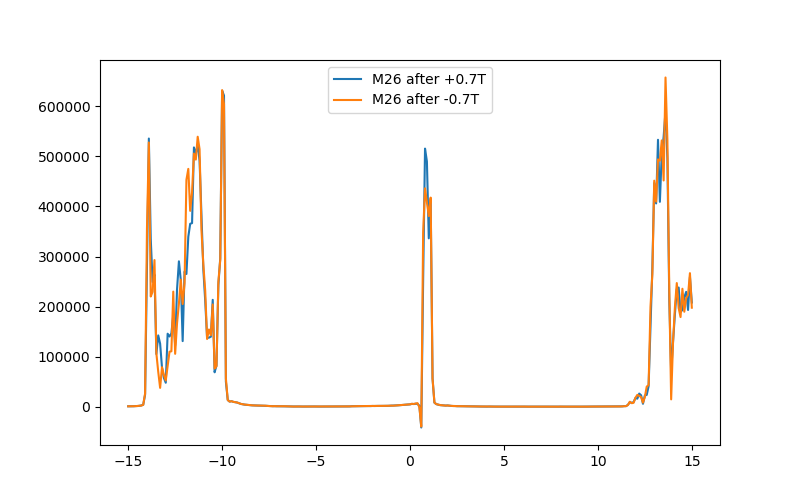

In [225]:
plt.figure(figsize=(8, 5))
plt.plot(data23.srframe_volt_p1_set[:], (data22.lockin865_X[:]/0.2e-9), label='M26 after +0.7T')
plt.plot(data23.srframe_volt_p1_set[:], (data23.lockin865_X[:]/0.2e-9), label='M26 after -0.7T')
plt.legend()

<IPython.core.display.Javascript object>


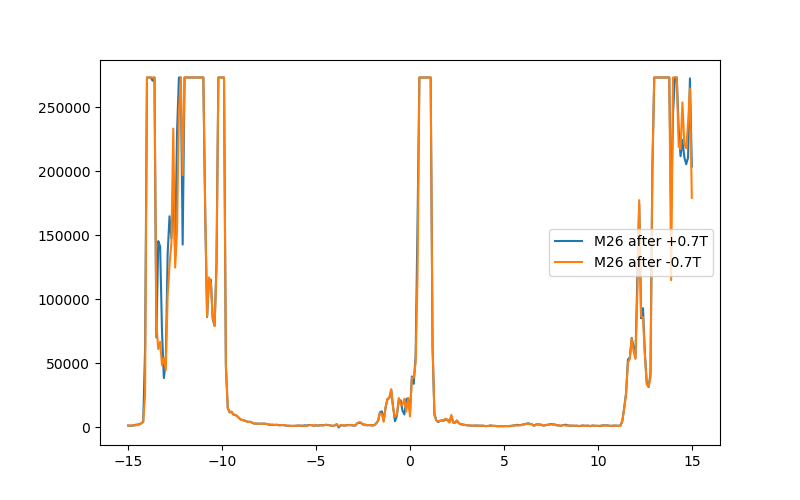

In [224]:
plt.figure(figsize=(8, 5))
plt.plot(data22.srframe_volt_p1_set[:], (data22.lockin830_X[:]/0.2e-9), label='M26 after +0.7T')
plt.plot(data23.srframe_volt_p1_set[:], (data23.lockin830_X[:]/0.2e-9), label='M26 after -0.7T')
plt.legend()

In [218]:
srframe.volt_p1(11.7)
time.sleep(10)
gvals = np.linspace(11.7, 13, 131)
data24, plot24 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_basetemp_0.2nA_29-28_865_28-2_830_source30_after-0.7T_zoom1')
srframe.volt_p1(0)

Started at 2020-02-07 14:21:38
DataSet:
   location = 'data/2020-02-07/#006_M26_basetemp_0.2nA_29-28_865_28-2_830_source30_after-0.7T_zoom1_14-21-36'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (131,)
   Measured | lockin865_X         | X            | (131,)
   Measured | lockin865_Y         | Y            | (131,)
   Measured | lockin830_X         | X            | (131,)
   Measured | lockin830_Y         | Y            | (131,)
Finished at 2020-02-07 14:24:27


<IPython.core.display.Javascript object>


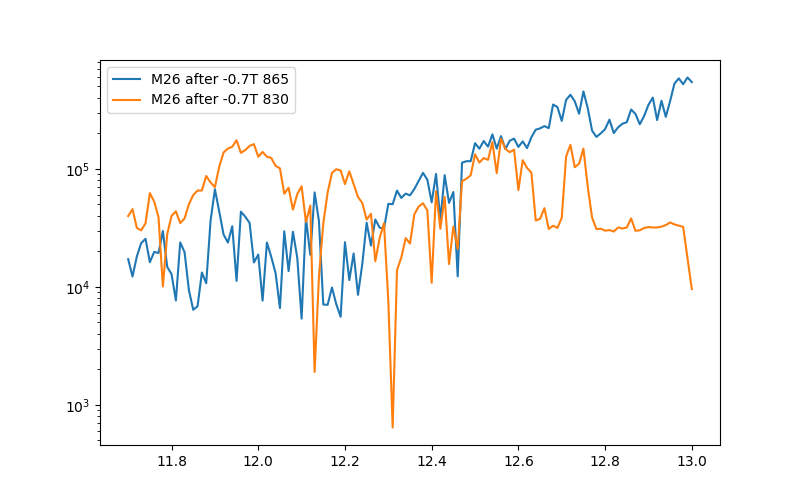

In [219]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, np.abs(data24.lockin865_X[:]/0.2e-9), label='M26 after -0.7T 865')
plt.semilogy(gvals, np.abs(data24.lockin830_X[:]/0.2e-9), label='M26 after -0.7T 830')
plt.legend()

In [226]:
srframe.volt_p1(11.7)
time.sleep(10)
gvals = np.linspace(2, 13, 111)
data25, plot25 = npd.single_param_sweep(srframe.volt_p1, gvals, 3.05, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_basetemp_2nA_29-28_865_28-2_830_source30_after-0.7T_zoom2')
srframe.volt_p1(0)

Started at 2020-02-07 14:39:03
DataSet:
   location = 'data/2020-02-07/#007_M26_basetemp_2nA_29-28_865_28-2_830_source30_after-0.7T_zoom2_14-39-01'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (111,)
   Measured | lockin865_X         | X            | (111,)
   Measured | lockin865_Y         | Y            | (111,)
   Measured | lockin830_X         | X            | (111,)
   Measured | lockin830_Y         | Y            | (111,)
Finished at 2020-02-07 14:45:38


In [261]:
triton.field(0)

Sweep time approximately 410.00199999999995 seconds


In [262]:
srframe.volt_p1(-10)
time.sleep(10)
gvals = np.linspace(-10, 10, 101)
data27, plot27 = npd.single_param_sweep(srframe.volt_p1, gvals, 3.05, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_basetemp_1nA_28-27_865_27-25_830_source30_after-1T_zoom1')
srframe.volt_p1(0)

Started at 2020-02-07 15:34:08
DataSet:
   location = 'data/2020-02-07/#009_M26_basetemp_1nA_28-27_865_27-25_830_source30_after-1T_zoom1_15-34-07'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (101,)
   Measured | lockin865_X         | X            | (101,)
   Measured | lockin865_Y         | Y            | (101,)
   Measured | lockin830_X         | X            | (101,)
   Measured | lockin830_Y         | Y            | (101,)
Finished at 2020-02-07 15:40:20


In [263]:
srframe.volt_p1(-10)
time.sleep(10)
gvals = np.linspace(-10, 10, 101)
data28, plot28 = npd.single_param_sweep(srframe.volt_p1, gvals, 3.05, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_basetemp_1nA_28-27_865_27-25_830_source30_after+1T_zoom1')
srframe.volt_p1(0)

Started at 2020-02-07 16:08:10
DataSet:
   location = 'data/2020-02-07/#010_M26_basetemp_1nA_28-27_865_27-25_830_source30_after+1T_zoom1_16-08-08'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (101,)
   Measured | lockin865_X         | X            | (101,)
   Measured | lockin865_Y         | Y            | (101,)
   Measured | lockin830_X         | X            | (101,)
   Measured | lockin830_Y         | Y            | (101,)
Finished at 2020-02-07 16:14:07


<IPython.core.display.Javascript object>


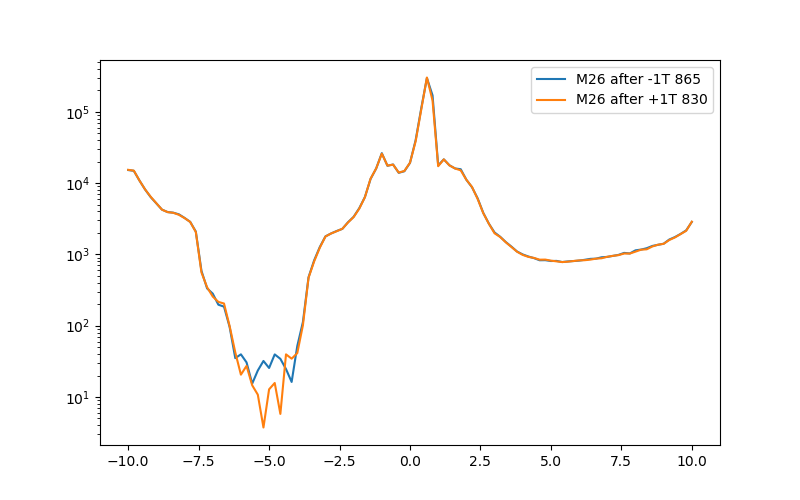

In [265]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, np.abs(data27.lockin865_X[:]/1e-9), label='M26 after -1T 865')
plt.semilogy(gvals, np.abs(data28.lockin865_X[:]/1e-9), label='M26 after +1T 830')
plt.legend()

In [266]:
lockin865.amplitude(0)

# Back to W5 fraunhofer

In [267]:
srframe.volt_p5()

0.0

In [268]:
srframe.volt_p1()

0.0

In [269]:
srframe.volt_p1(3.3)

In [272]:
# same as last fraunhofer but finer
bvals = np.linspace(-0.02, 0.02, 161)
offvals = np.linspace(-5, 5, 201)
data22, plot22 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p5, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_830_49-39_865_38-37_vbg3p3V_FraunhoferbaseT_0p5nA')

Started at 2020-02-07 17:18:16
Please wait 10.018 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.09 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.09 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.096 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.114 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.102 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.114 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.108 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.096 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.09 seconds for the field sweep, plus the time required for operat

In [273]:
srframe.volt_p5(0)
srframe.volt_p1(0)

In [274]:
triton.field(-0.0008)

Sweep time approximately 18.322 seconds


In [275]:
offvals = np.linspace(8000e-3, -8000e-3, 201)
gvals = np.linspace(2.5, 4.4, 39)
data23, plot23 = npd.twod_param_sweep(srframe.volt_p1, gvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=6, SetDelay2=1.1, DataName='W5_830_40-39_865_38-37_vbgsweep_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-02-08 06:49:05
DataSet:
   location = 'data/2020-02-08/#001_W5_830_40-39_865_38-37_vbgsweep_AC0.5nAdvdi_baseT_b=-0.8mT_06-49-03'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (39,)
   Setpoint | srframe_volt_p5_set | volt_p5      | (39, 201)
   Measured | lockin865_X         | X            | (39, 201)
   Measured | lockin865_Y         | Y            | (39, 201)
   Measured | lockin830_X         | X            | (39, 201)
   Measured | lockin830_Y         | Y            | (39, 201)
Finished at 2020-02-08 09:50:14


In [276]:
srframe.volt_p1(3.3)

In [278]:
#the above measurement the resistance is not zero
#now reconnect the ground to SRS865

In [279]:
srframe.volt_p1(-8)
time.sleep(15)
gvals = np.linspace(-8, 8, 401)
data24, plot24 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin865.R, lockin830.X, lockin830.Y, lockin830.R, DataName='W5_865_39-38_830_40-39_baseT_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-02-08 10:48:09
DataSet:
   location = 'data/2020-02-08/#002_W5_865_39-38_830_40-39_baseT_1nA_gatesweep_10-48-06'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (401,)
   Measured | lockin865_X         | X            | (401,)
   Measured | lockin865_Y         | Y            | (401,)
   Measured | lockin865_R         | R            | (401,)
   Measured | lockin830_X         | X            | (401,)
   Measured | lockin830_Y         | Y            | (401,)
   Measured | lockin830_R         | R            | (401,)
Finished at 2020-02-08 10:57:11


In [281]:
srframe.volt_p1(-8)
time.sleep(15)
gvals = np.linspace(-8, 8, 401)
data25, plot25 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin830.X, lockin830.Y, lockin830.R, DataName='W5_830_40-39_baseT_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-02-08 11:04:05
DataSet:
   location = 'data/2020-02-08/#003_W5_830_40-39_baseT_1nA_gatesweep_11-04-04'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (401,)
   Measured | lockin830_X         | X            | (401,)
   Measured | lockin830_Y         | Y            | (401,)
   Measured | lockin830_R         | R            | (401,)
Finished at 2020-02-08 11:12:32


In [282]:
srframe.volt_p1(-8)
time.sleep(15)
gvals = np.linspace(-8, 8, 401)
data26, plot26 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin830.X, lockin830.Y, lockin830.R, DataName='W5_830_40-39_baseT_1nA_gatesweep_0T')
srframe.volt_p1(0)

Started at 2020-02-08 11:14:57
DataSet:
   location = 'data/2020-02-08/#004_W5_830_40-39_baseT_1nA_gatesweep_0T_11-14-56'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (401,)
   Measured | lockin830_X         | X            | (401,)
   Measured | lockin830_Y         | Y            | (401,)
   Measured | lockin830_R         | R            | (401,)
Finished at 2020-02-08 11:23:24


<IPython.core.display.Javascript object>


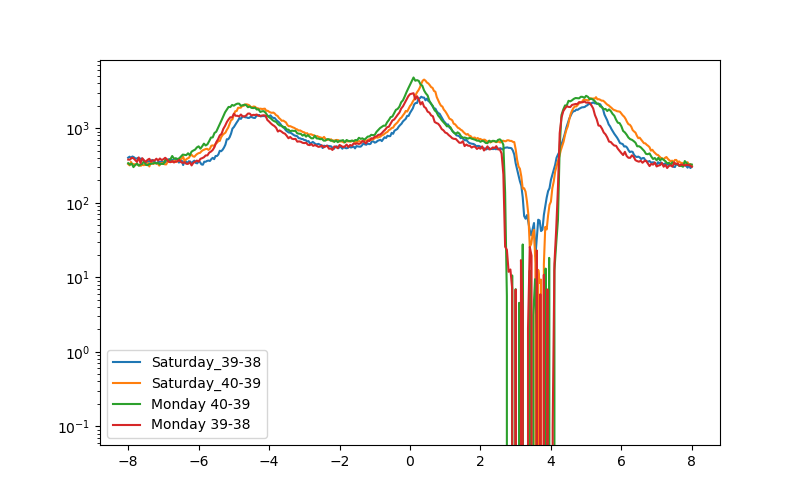

In [288]:
gvals2 = data7.srframe_volt_p1_set[:]
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, data24.lockin865_X[:]/1e-9, label='Saturday_39-38')
plt.semilogy(gvals, data24.lockin830_X[:]/1e-9, label='Saturday_40-39')
plt.semilogy(gvals2, data7.lockin865_X[:]/1e-9, label='Monday 40-39')
plt.semilogy(gvals2, data6.lockin865_X[:]/1e-9, label='Monday 39-38')
plt.legend()

In [287]:
#either the device changes or the measurement ground changes

In [289]:
offvals = np.linspace(8000e-3, -8000e-3, 201)
gvals = np.linspace(2.5, 4.4, 39)
data27, plot27 = npd.twod_param_sweep(srframe.volt_p1, gvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=6, SetDelay2=1.1, DataName='W5_830_40-39_865_39-38_vbgsweep_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-02-08 11:38:06
DataSet:
   location = 'data/2020-02-08/#005_W5_830_40-39_865_39-38_vbgsweep_AC0.5nAdvdi_baseT_b=-0.8mT_11-38-04'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (39,)
   Setpoint | srframe_volt_p5_set | volt_p5      | (39, 201)
   Measured | lockin865_X         | X            | (39, 201)
   Measured | lockin865_Y         | Y            | (39, 201)
   Measured | lockin830_X         | X            | (39, 201)
   Measured | lockin830_Y         | Y            | (39, 201)
Finished at 2020-02-08 14:39:28


In [292]:
srframe.volt_p1(-8)#865 and 830 both grounded
time.sleep(15)
gvals = np.linspace(-8, 8, 321)
data28, plot28 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_830_40-39_865_39-38_baseT_1nA_gatesweep_0T')
srframe.volt_p1(0)

Started at 2020-02-08 15:02:04
DataSet:
   location = 'data/2020-02-08/#006_W5_830_40-39_865_39-38_baseT_1nA_gatesweep_0T_15-02-02'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (321,)
   Measured | lockin865_X         | X            | (321,)
   Measured | lockin865_Y         | Y            | (321,)
   Measured | lockin830_X         | X            | (321,)
   Measured | lockin830_Y         | Y            | (321,)
Finished at 2020-02-08 15:08:57


In [293]:
srframe.volt_p1(-8)#865 grounded, disconnect 830 ground screw
time.sleep(15)
gvals = np.linspace(-8, 8, 321)
data29, plot29 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_830_40-39_865_39-38_baseT_1nA_gatesweep_0T')
srframe.volt_p1(0)

Started at 2020-02-08 15:15:51
DataSet:
   location = 'data/2020-02-08/#007_W5_830_40-39_865_39-38_baseT_1nA_gatesweep_0T_15-15-49'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (321,)
   Measured | lockin865_X         | X            | (321,)
   Measured | lockin865_Y         | Y            | (321,)
   Measured | lockin830_X         | X            | (321,)
   Measured | lockin830_Y         | Y            | (321,)
Finished at 2020-02-08 15:22:43


<IPython.core.display.Javascript object>


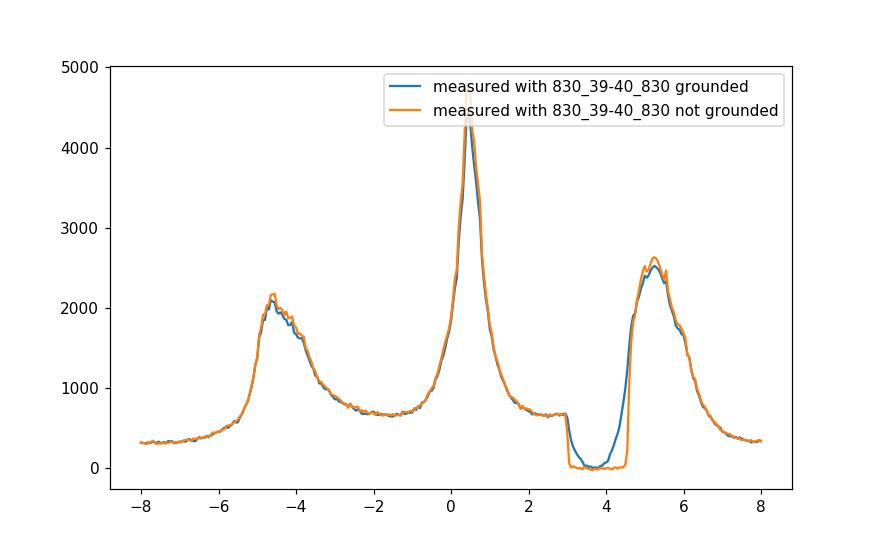

In [298]:
plt.figure(figsize=(8, 5))
plt.plot(gvals, data28.lockin830_X[:]/1e-9, label='measured with 830_39-40_830 grounded')
plt.plot(gvals, data29.lockin830_X[:]/1e-9, label='measured with 830_39-40_830 not grounded')
plt.legend()

<IPython.core.display.Javascript object>


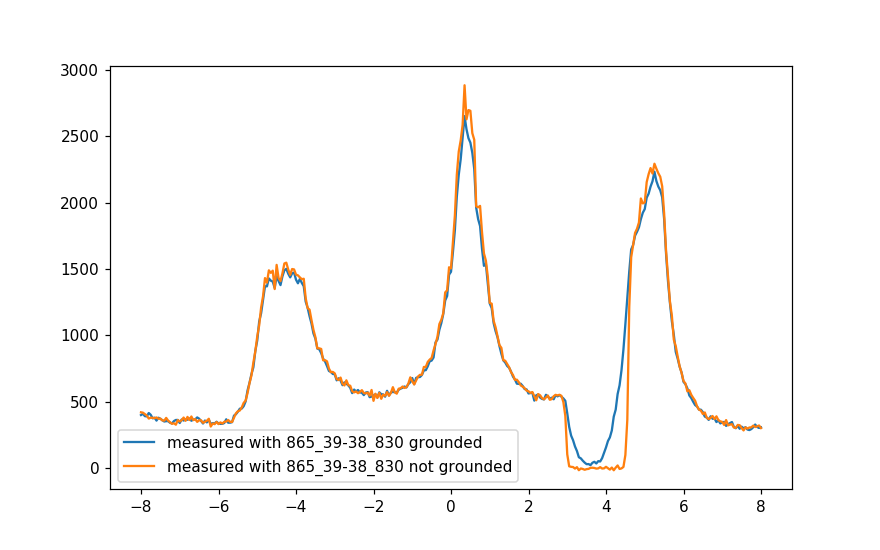

In [299]:
plt.figure(figsize=(8, 5))
plt.plot(gvals, data28.lockin865_X[:]/1e-9, label='measured with 865_39-38_830 grounded')
plt.plot(gvals, data29.lockin865_X[:]/1e-9, label='measured with 865_39-38_830 not grounded')
plt.legend()

In [301]:
srframe.volt_p1(3.4)#830 not grounded
srframe.volt_p5(8)
time.sleep(15)
offvals = np.linspace(8000e-3, -8000e-3, 201)
data30, plot30 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_830_40-39_865_39-38_baseT_0.5nA_dvdi_-0.8mT')
srframe.volt_p1(0)
srframe.volt_p5(0)

Started at 2020-02-08 15:41:07
DataSet:
   location = 'data/2020-02-08/#008_W5_830_40-39_865_39-38_baseT_0.5nA_dvdi_-0.8mT_15-41-05'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-02-08 15:45:25


In [302]:
offvals = np.linspace(8000e-3, -8000e-3, 201)# 865grounded 830 not grounded
gvals = np.linspace(2.5, 4.4, 39)
data31, plot31 = npd.twod_param_sweep(srframe.volt_p1, gvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=6, SetDelay2=1.1, DataName='W5_830_40-39_865_39-38_vbgsweep_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-02-08 15:46:40
DataSet:
   location = 'data/2020-02-08/#009_W5_830_40-39_865_39-38_vbgsweep_AC0.5nAdvdi_baseT_b=-0.8mT_15-46-38'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (39,)
   Setpoint | srframe_volt_p5_set | volt_p5      | (39, 201)
   Measured | lockin865_X         | X            | (39, 201)
   Measured | lockin865_Y         | Y            | (39, 201)
   Measured | lockin830_X         | X            | (39, 201)
   Measured | lockin830_Y         | Y            | (39, 201)
Finished at 2020-02-08 18:47:52


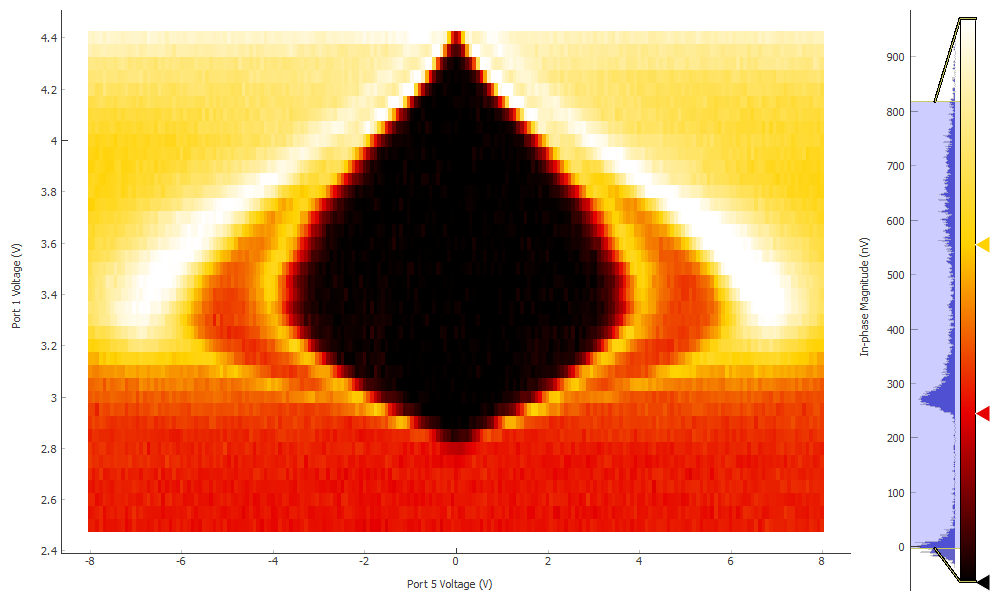

In [303]:
plot31[0]#38-39 dvdi gate dependence

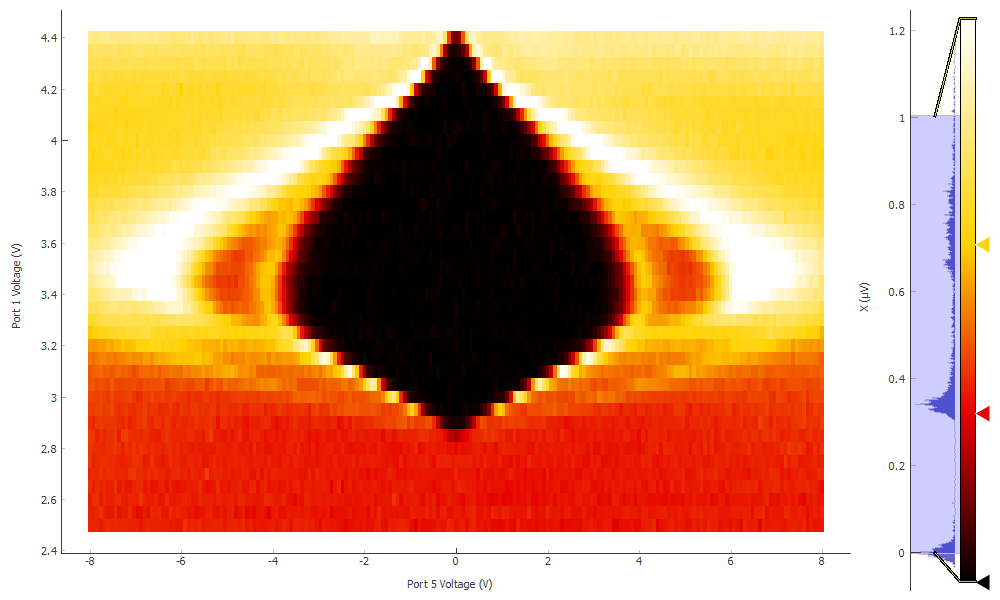

In [304]:
plot31[2]#39-40 dvdi gate dependence

In [306]:
srframe.volt_p1(3.4)#830 not grounded
srframe.volt_p5(-10)
time.sleep(15)
bvals = np.linspace(-0.025, 0.025, 51)
offvals = np.linspace(-10, 10, 101)
data32, plot32 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p5, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_830_40-39_865_39-38_vbg3p4V_FraunhoferbaseT_0p5nA_course')

Started at 2020-02-08 19:03:29
Please wait 10.018 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.402 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.426 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.378 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.402 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.408 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.414 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.408 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.384 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.396 seconds for the field sweep, plus the time required for ope

In [307]:
srframe.volt_p5(0)

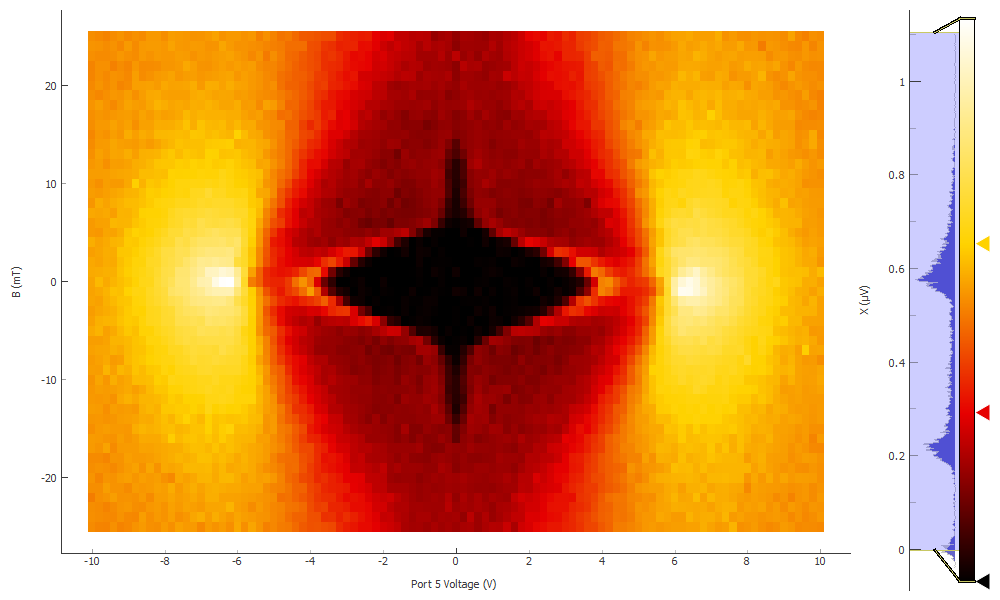

In [308]:
plot32[0]#40-39 Vg=3.4V

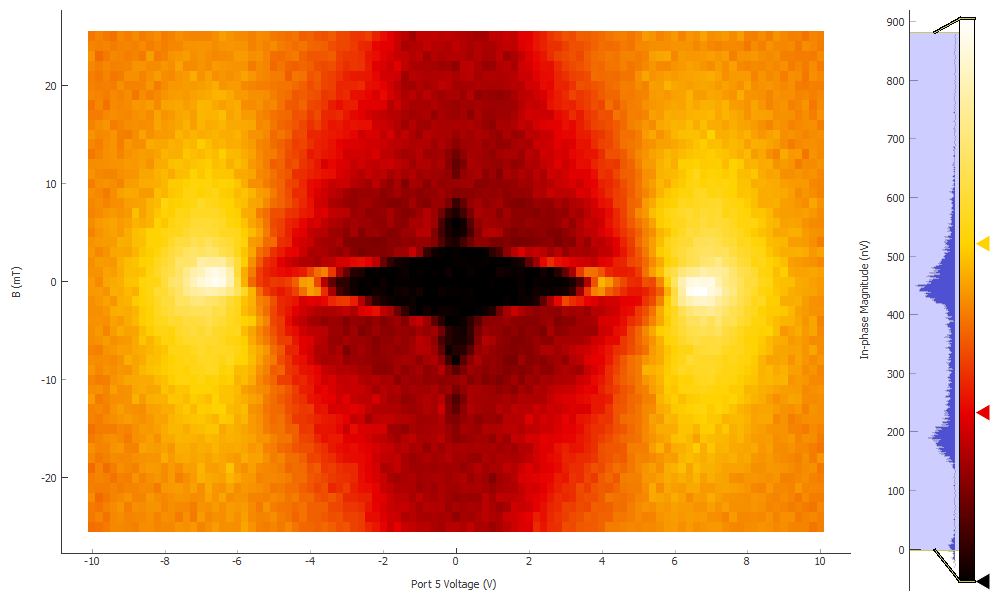

In [309]:
plot32[2]#39-38 Vg=3.4V

In [311]:
srframe.volt_p1()

3.4

In [312]:
lockin865.amplitude()

0.04999999702

In [313]:
# same as last fraunhofer but finer
bvals = np.linspace(-0.02, 0.02, 161)
offvals = np.linspace(-6, 6, 241)
data33, plot33 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p5, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_830_40-39_865_39-38_vbg3p4V_FraunhoferbaseT_0p5nA')

Started at 2020-02-08 22:13:41
Please wait 28.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.078 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.108 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.09 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.096 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.108 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.06 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.096 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.102 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.096 seconds for the field sweep, plus the time required for operati

In [314]:
srframe.volt_p5(0)
srframe.volt_p1(0)

In [315]:
triton.field(-0.0008)

Sweep time approximately 18.322 seconds


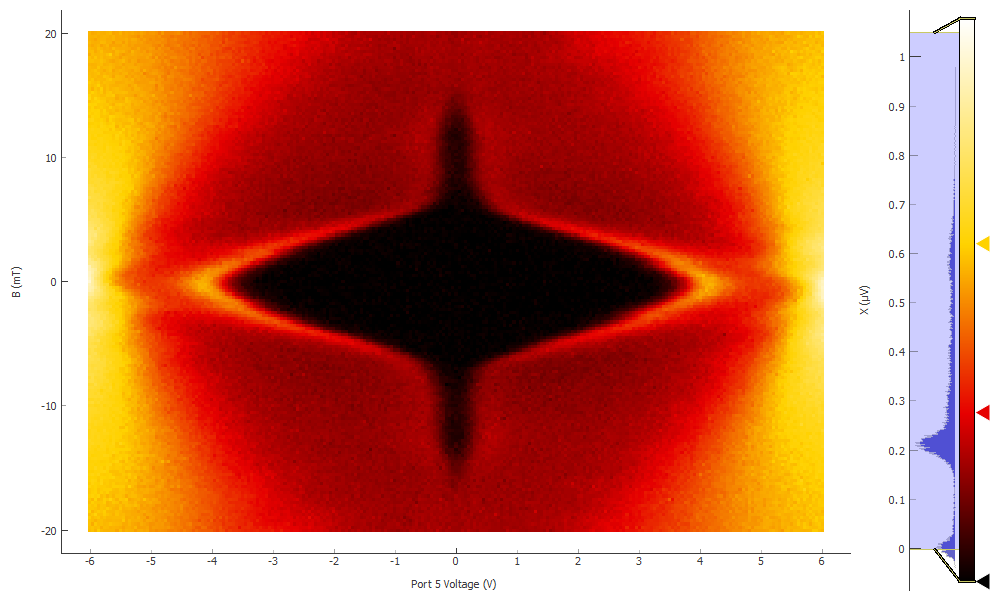

In [316]:
plot33[0]#40-39 Vg=3.4V

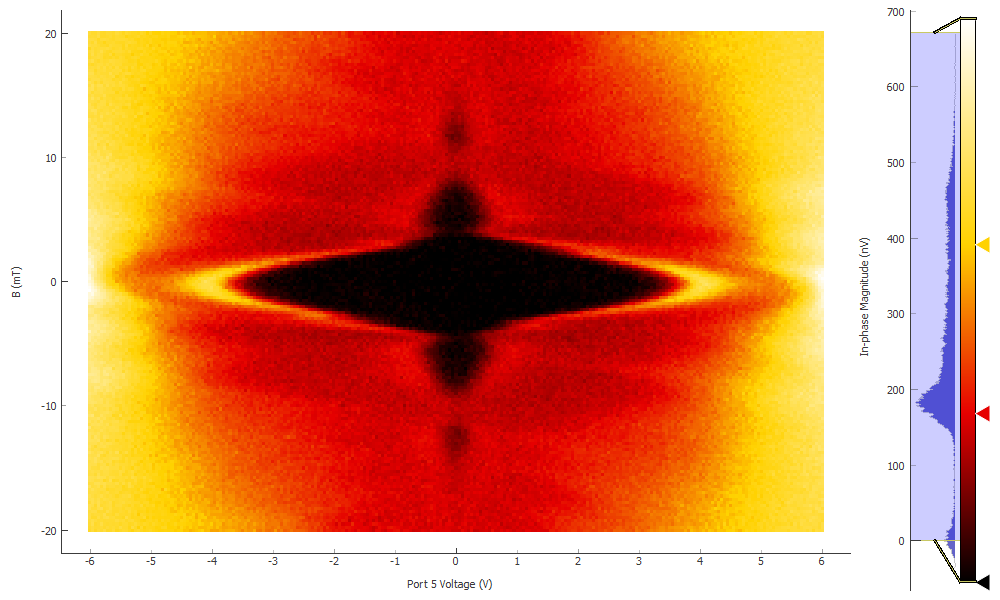

In [317]:
plot33[2]#39-38 Vg=3.4V

In [318]:
#now 865 to 38-37, 830 stays 40-39

In [319]:
srframe.volt_p1(-8)#865 grounded, disconnect 830 ground screw
time.sleep(15)
gvals = np.linspace(-8, 8, 321)
data34, plot34 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_830_40-39_865_38-37_baseT_1nA_gatesweep_-0.8mT')
srframe.volt_p1(0)

Started at 2020-02-09 14:32:50
DataSet:
   location = 'data/2020-02-09/#001_W5_830_40-39_865_38-37_baseT_1nA_gatesweep_-0.8mT_14-32-48'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (321,)
   Measured | lockin865_X         | X            | (321,)
   Measured | lockin865_Y         | Y            | (321,)
   Measured | lockin830_X         | X            | (321,)
   Measured | lockin830_Y         | Y            | (321,)
Finished at 2020-02-09 14:39:55


In [320]:
offvals = np.linspace(6000e-3, -6000e-3, 151)# 865grounded 830 not grounded
gvals = np.linspace(2.6, 4.4, 37)
data35, plot35 = npd.twod_param_sweep(srframe.volt_p1, gvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=6, SetDelay2=1.1, DataName='W5_830_40-39_865_38-37_vbgsweep_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-02-09 14:47:29
DataSet:
   location = 'data/2020-02-09/#002_W5_830_40-39_865_38-37_vbgsweep_AC0.5nAdvdi_baseT_b=-0.8mT_14-47-27'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (37,)
   Setpoint | srframe_volt_p5_set | volt_p5      | (37, 151)
   Measured | lockin865_X         | X            | (37, 151)
   Measured | lockin865_Y         | Y            | (37, 151)
   Measured | lockin830_X         | X            | (37, 151)
   Measured | lockin830_Y         | Y            | (37, 151)
Finished at 2020-02-09 16:57:28


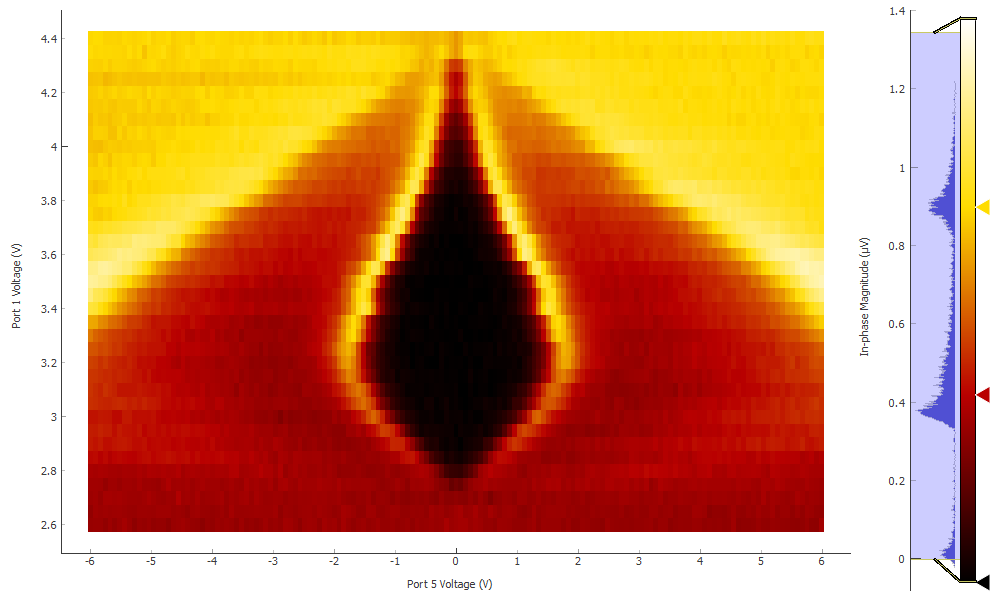

In [321]:
plot35[0]#38-37 dvdi gate dependence

In [322]:
srframe.volt_p1(3.2)#830 not grounded
srframe.volt_p5(-5)
time.sleep(15)
bvals = np.linspace(-0.025, 0.025, 41)
offvals = np.linspace(-5, 5, 101)
data36, plot36 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p5, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_830_40-39_865_38-37_vbg3p2V_FraunhoferbaseT_0p5nA_course')

Started at 2020-02-09 17:06:49
Please wait 19.683999999999997 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.534 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.504 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.456 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.504 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.492 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.504 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.498 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.498 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.486 seconds for the field sweep, plus the time requ

In [323]:
# same as last fraunhofer but finer
srframe.volt_p1(3.2)
srframe.volt_p5(-5)
time.sleep(15)
bvals = np.linspace(-0.02, 0.02, 161)
offvals = np.linspace(-5, 5, 201)
data37, plot37 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p5, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_830_40-39_865_38-37_vbg3p2V_FraunhoferbaseT_0p5nA')

Started at 2020-02-09 18:54:47
Please wait 25.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.06 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.096 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.09 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.096 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.06 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.096 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.108 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.096 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.102 seconds for the field sweep, plus the time required for operat

In [324]:
srframe.volt_p1(0)
srframe.volt_p5(0)

In [325]:
triton.field(-0.0008)

Sweep time approximately 18.310000000000002 seconds


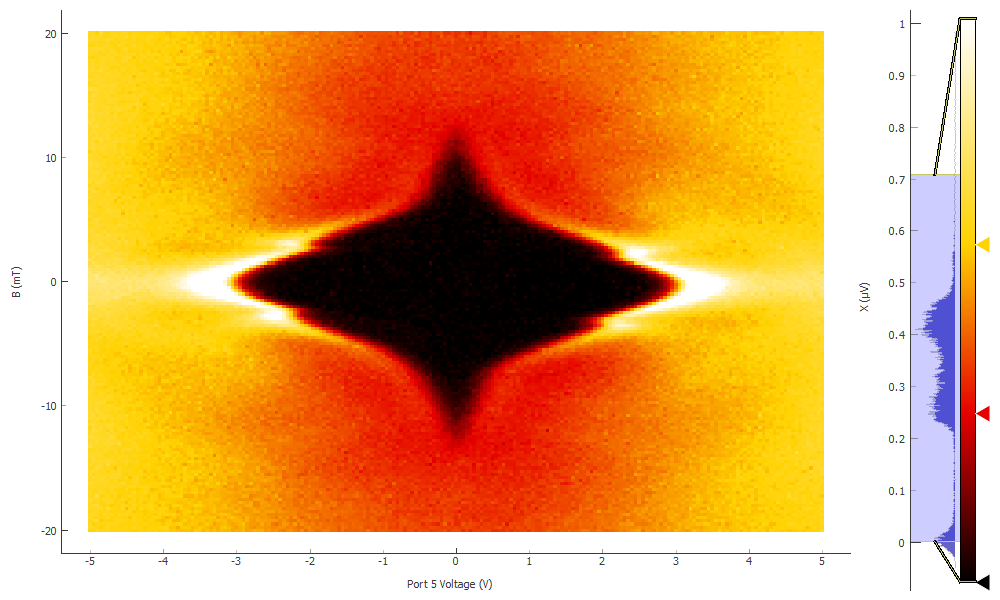

In [326]:
plot37[0]#40-39Vg=3.2V

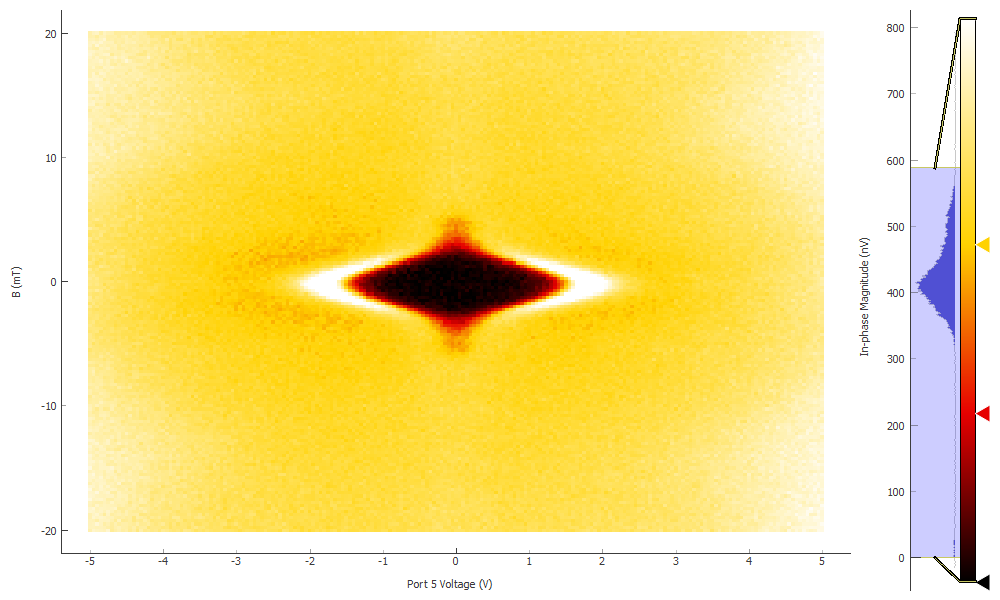

In [328]:
plot37[2]#38-37 Vg=3.2V

In [329]:
srframe.volt_p1(-8)#865 grounded, disconnect 830 ground screw
time.sleep(15)
gvals = np.linspace(-8, 8, 321)
data38, plot38 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_830_40-39_865_38-37_baseT_1nA_gatesweep_-0.8mT')
srframe.volt_p1(0)

Started at 2020-02-10 09:51:18
DataSet:
   location = 'data/2020-02-10/#001_W5_830_40-39_865_38-37_baseT_1nA_gatesweep_-0.8mT_09-51-16'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (321,)
   Measured | lockin865_X         | X            | (321,)
   Measured | lockin865_Y         | Y            | (321,)
   Measured | lockin830_X         | X            | (321,)
   Measured | lockin830_Y         | Y            | (321,)
Finished at 2020-02-10 09:58:10


# initial check on W3

In [330]:
srframe.volt_p1(-9)#865 grounded, disconnect 830 ground screw
time.sleep(15)
gvals = np.linspace(-9, 9, 361)
data39, plot39 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='W5_865_47-48_baseT_1nA_gatesweep_-0.8mT')
srframe.volt_p1(0)

Started at 2020-02-10 10:23:35
DataSet:
   location = 'data/2020-02-10/#002_W5_865_47-48_baseT_1nA_gatesweep_-0.8mT_10-23-34'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (361,)
   Measured | lockin865_X         | X            | (361,)
   Measured | lockin865_Y         | Y            | (361,)
Finished at 2020-02-10 10:30:53


In [332]:
srframe.volt_p1(-9)#865 grounded, disconnect 830 ground screw
time.sleep(15)
gvals = np.linspace(-9, 9, 361)
data40, plot40 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='W5_865_48-24_baseT_1nA_gatesweep_-0.8mT')
srframe.volt_p1(0)

Started at 2020-02-10 10:35:06
DataSet:
   location = 'data/2020-02-10/#003_W5_865_48-24_baseT_1nA_gatesweep_-0.8mT_10-35-05'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (361,)
   Measured | lockin865_X         | X            | (361,)
   Measured | lockin865_Y         | Y            | (361,)
Finished at 2020-02-10 10:42:38


<IPython.core.display.Javascript object>


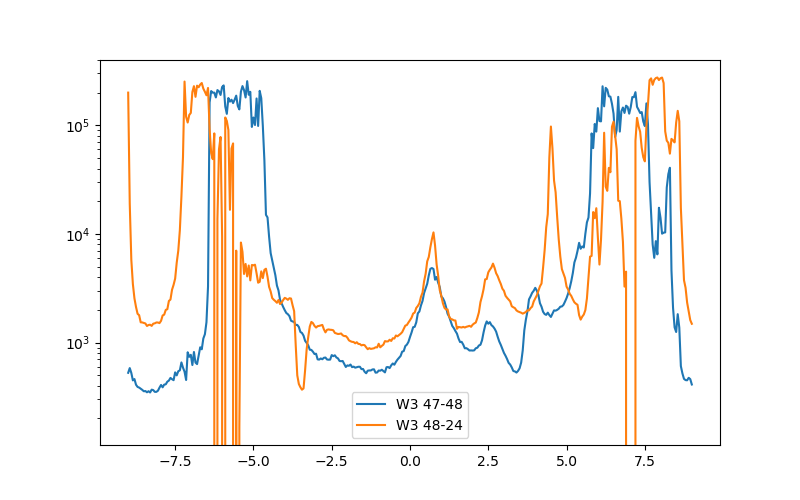

In [381]:
gvals3= data39.srframe_volt_p1_set[:]
plt.figure(figsize=(8, 5))
plt.semilogy(gvals3, data39.lockin865_X[:]/1e-9, label='W3 47-48')
plt.semilogy(gvals3, data40.lockin865_X[:]/1e-9, label='W3 48-24')
plt.legend()

In [337]:
srframe.volt_p1(-4)

In [338]:
srframe.volt_p1(-4)#830 not grounded
srframe.volt_p5(5)
time.sleep(30)
offvals = np.linspace(5000e-3, -5000e-3, 201)
data41, plot41 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.1, lockin865.X, lockin865.Y, DataName='W3_865_48-24_baseT_0.5nA_dvdi_-0.8mT')

Started at 2020-02-10 11:06:19
DataSet:
   location = 'data/2020-02-10/#005_W3_865_48-24_baseT_0.5nA_dvdi_-0.8mT_11-06-18'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
Finished at 2020-02-10 11:10:23


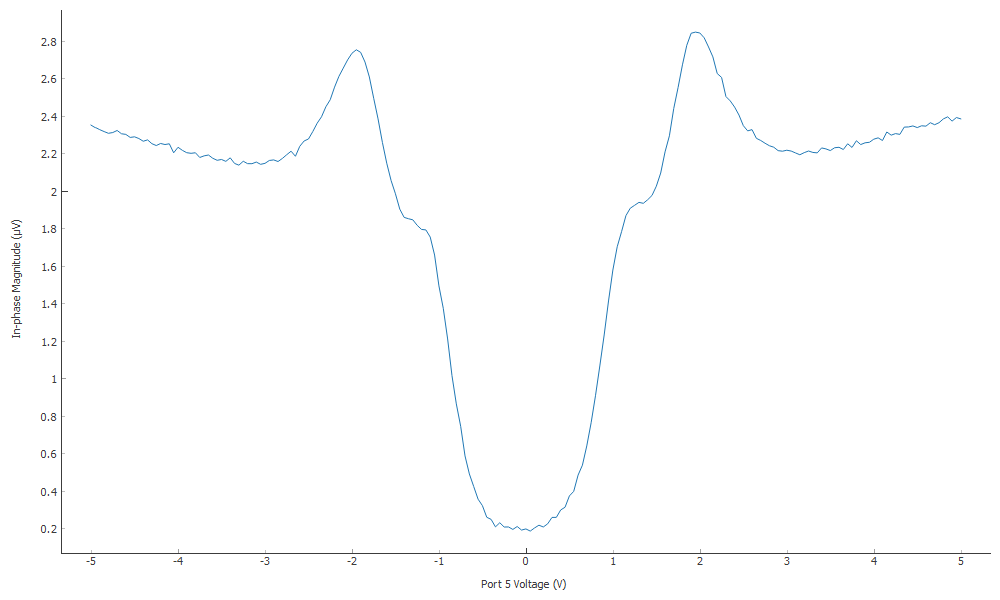

In [339]:
plot41[0]

In [340]:
srframe.volt_p1(-4.5)#830 not grounded
srframe.volt_p5(3)
time.sleep(60)
offvals = np.linspace(3000e-3, -3000e-3, 151)# 865grounded 830 not grounded
gvals = np.linspace(-4.5, -3.5, 21)
data42, plot42 = npd.twod_param_sweep(srframe.volt_p1, gvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.1, DataName='W3_865_48-24_vbgsweep_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)

Started at 2020-02-10 11:23:25
DataSet:
   location = 'data/2020-02-10/#006_W3_865_48-24_vbgsweep_AC0.5nAdvdi_baseT_b=-0.8mT_11-23-23'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (21,)
   Setpoint | srframe_volt_p5_set | volt_p5      | (21, 151)
   Measured | lockin865_X         | X            | (21, 151)
   Measured | lockin865_Y         | Y            | (21, 151)
Finished at 2020-02-10 12:34:12


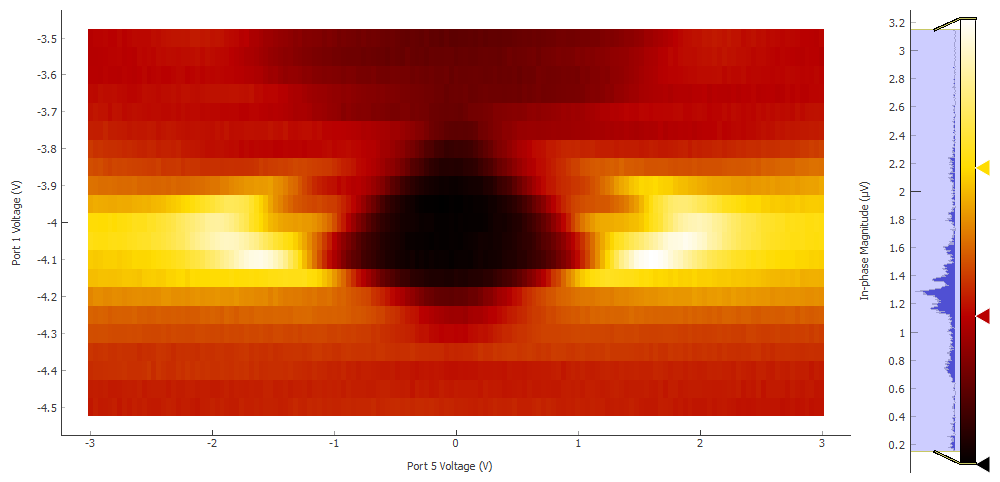

In [341]:
plot42[0]

In [342]:
srframe.volt_p1(-4.05)

In [343]:
srframe.volt_p5(-3)
time.sleep(15)
bvals = np.linspace(-0.020, 0.020, 41)
offvals = np.linspace(-3, 3, 121)
data43, plot43 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='W3_865_48-24_vbg-4p05V_FraunhoferbaseT_0p5nA_course')

Started at 2020-02-10 13:10:18
Please wait 17.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.414 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.396 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.372 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.396 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.396 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.402 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.396 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.396 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.402 seconds for the field sweep, plus the time required for oper

In [345]:
srframe.volt_p5(-3)
time.sleep(15)
bvals = np.linspace(-0.060, 0, 61)
offvals = np.linspace(-3, 3, 121)
data44, plot44 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='W3_865_48-24_vbg-4p05V_FraunhoferbaseT_0p5nA_course')

Started at 2020-02-10 14:36:36
Please wait 18.4 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.402 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-02-10/#009_W3_865_48-24_vbg-4p05V_FraunhoferbaseT_0p5nA_course_14-36-35'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (61,)
   Setpoint | srframe_volt_p5_set         | volt_p5          | (61, 121)
   Measured | lockin865_X                 | X                | (61, 121)
   Measured | lockin865_Y                 | Y                | (61, 121)
Finished at 2020-02-10 14:40:46
Keyboard Interrupt


In [346]:
srframe.volt_p1(0)

In [347]:
srframe.volt_p5(0)

# Low frequency check on M26

In [350]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data45, plot45 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_basetemp_0.2nA_29-28_865_28-2_830_source30_+0.1T')
srframe.volt_p1(0)

Started at 2020-02-10 15:00:55
DataSet:
   location = 'data/2020-02-10/#010_M26_basetemp_0.2nA_29-28_865_28-2_830_source30_+0.1T_15-00-53'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
Finished at 2020-02-10 15:08:09


In [351]:
srframe.volt_p1(-11)
time.sleep(10)
gvals = np.linspace(-11, 13, 241)
data46, plot46 = npd.single_param_sweep(srframe.volt_p1, gvals, 3.05, lockin865.X, lockin865.Y, DataName='M26_basetemp_0.2nA_28-27_865_source30_+0.0T_4.89Hz')
srframe.volt_p1(0)

Started at 2020-02-10 15:26:38
DataSet:
   location = 'data/2020-02-10/#011_M26_basetemp_0.2nA_28-27_865_source30_+0.0T_4.89Hz_15-26-37'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (241,)
   Measured | lockin865_X         | X            | (241,)
   Measured | lockin865_Y         | Y            | (241,)
Finished at 2020-02-10 15:39:58


In [353]:
lockin865.harmonic(2)

In [354]:
srframe.volt_p1(-11)
time.sleep(10)
gvals = np.linspace(-11, 13, 241)
data47, plot47 = npd.single_param_sweep(srframe.volt_p1, gvals, 3.05, lockin865.X, lockin865.Y, DataName='M26_basetemp_0.2nA_28-27_865_source30_+0.0T_4.89Hz_2ndHarm')
srframe.volt_p1(0)

Started at 2020-02-10 15:57:38
DataSet:
   location = 'data/2020-02-10/#012_M26_basetemp_0.2nA_28-27_865_source30_+0.0T_4.89Hz_2ndHarm_15-57-38'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (241,)
   Measured | lockin865_X         | X            | (241,)
   Measured | lockin865_Y         | Y            | (241,)
Finished at 2020-02-10 16:10:58


<IPython.core.display.Javascript object>


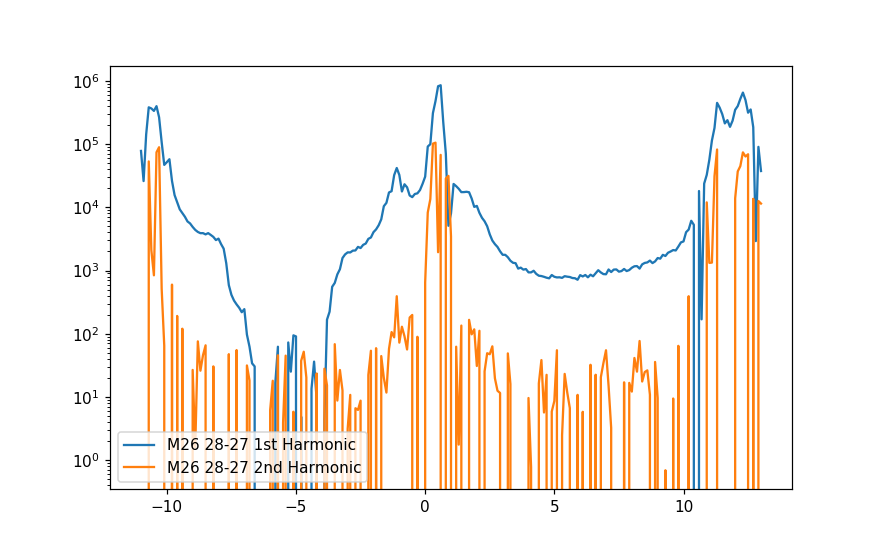

In [361]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, data46.lockin865_X[:]/0.2e-9, label='M26 28-27 1st Harmonic')
plt.semilogy(gvals, data47.lockin865_X[:]/0.2e-9, label='M26 28-27 2nd Harmonic')
plt.legend()

# back to W3

In [365]:
#830 not grounded
srframe.volt_p5(5)
time.sleep(30)
offvals = np.linspace(5000e-3, -5000e-3, 201)
data45, plot45 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.1, lockin865.X, lockin865.Y, DataName='W3_865_48-24_baseT_0.5nA_dvdi_Vg-4p05V_-0.8mT')

Started at 2020-02-10 18:57:26
DataSet:
   location = 'data/2020-02-10/#016_W3_865_48-24_baseT_0.5nA_dvdi_Vg-4p05V_-0.8mT_18-57-25'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
Finished at 2020-02-10 19:01:30


In [366]:
srframe.volt_p5(-3)
time.sleep(30)
bvals = np.linspace(-0.06, 0, 41)
offvals = np.linspace(-3, 3, 121)
data46, plot46 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.1, Param2_SetBetween=0, DataName='W3_865_48-24_vbg-4p05V_FraunhoferbaseT_0p5nA_course')

Started at 2020-02-10 19:02:18
Please wait 33.682 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.642 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.582 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.642 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.588 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.564 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.576 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.606 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.57 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.546 seconds for the field sweep, plus the time required for oper

In [367]:
# same as last fraunhofer but finer
srframe.volt_p5(-3)
time.sleep(30)
bvals = np.linspace(-0.02, 0.02, 161)
offvals = np.linspace(-3, 3, 121)
data47, plot47 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='W3_865_48-24_vbg-4p05V_FraunhoferbaseT_0p5nA')

Started at 2020-02-10 21:02:28
Please wait 17.986 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.114 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.114 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.096 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.108 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.108 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.102 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.09 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.108 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.102 seconds for the field sweep, plus the time required for oper

In [368]:
srframe.volt_p5(0)
srframe.volt_p1(0)

In [369]:
triton.field(-0.0008)

Sweep time approximately 18.328000000000003 seconds


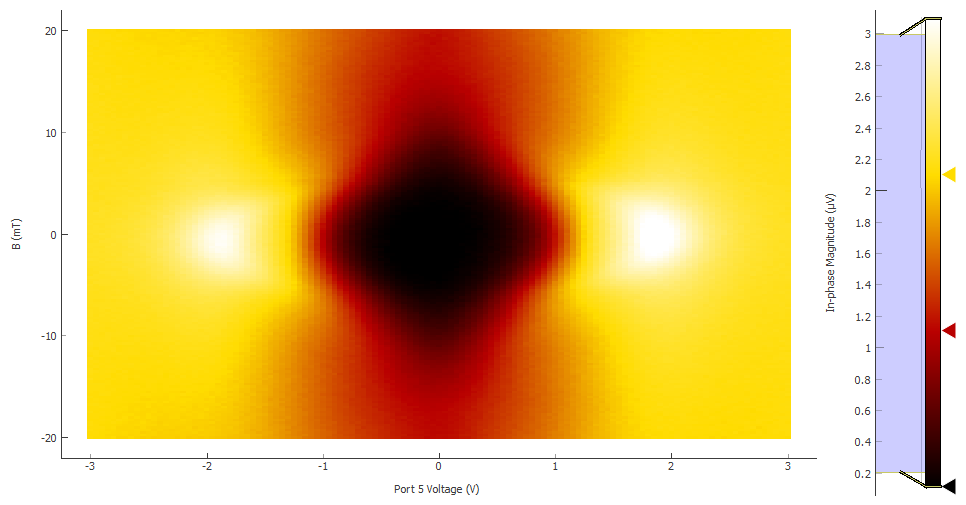

In [370]:
plot47[0]

# W3 fan diagram

In [371]:
srframe.volt_p1(-9)#865 grounded, disconnect 830 ground screw
time.sleep(30)
gvals = np.linspace(-9, 9, 361)
data48, plot48 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_865_48-24_830_21-24_baseT_1nA_gatesweep_-0.8mT')
srframe.volt_p1(0)

Started at 2020-02-11 09:25:01
DataSet:
   location = 'data/2020-02-11/#001_W5_865_48-24_830_21-24_baseT_1nA_gatesweep_-0.8mT_09-24-59'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (361,)
   Measured | lockin865_X         | X            | (361,)
   Measured | lockin865_Y         | Y            | (361,)
   Measured | lockin830_X         | X            | (361,)
   Measured | lockin830_Y         | Y            | (361,)
Finished at 2020-02-11 09:32:45


In [376]:
gvals2 = data48.srframe_volt_p1_set[:]

<IPython.core.display.Javascript object>


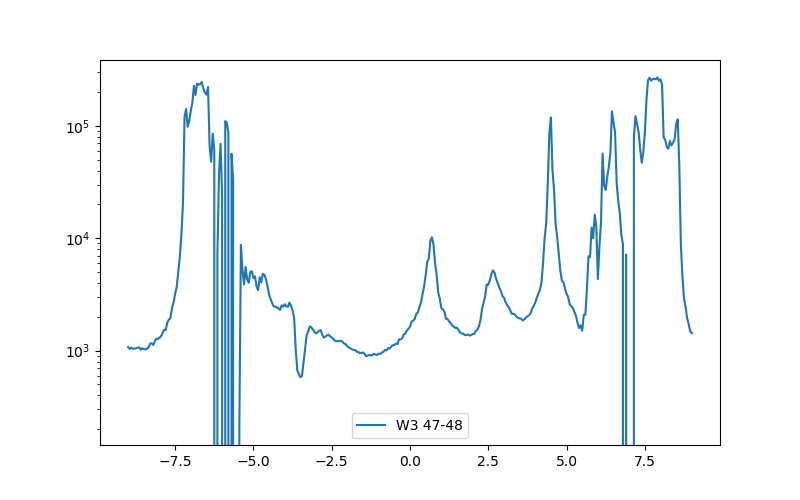

In [377]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals2, data48.lockin865_X[:]/1e-9, label='W3 47-48')
plt.legend()

In [373]:
srframe.volt_p1(-9)
time.sleep(15)
gvals = np.linspace(-9, 10, 761)
bvals = np.linspace(0, 8, 161)
data49, plot49 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=15, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_865_48-24_830_21-24_baseT_1nA_B-Vgsweep')

Started at 2020-02-11 09:37:44
Please wait 10.318 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.003999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.003999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.003999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.003999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.003999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.992 seconds for the field sweep, plus the time required for operating the swit

In [374]:
srframe.volt_p1(0)

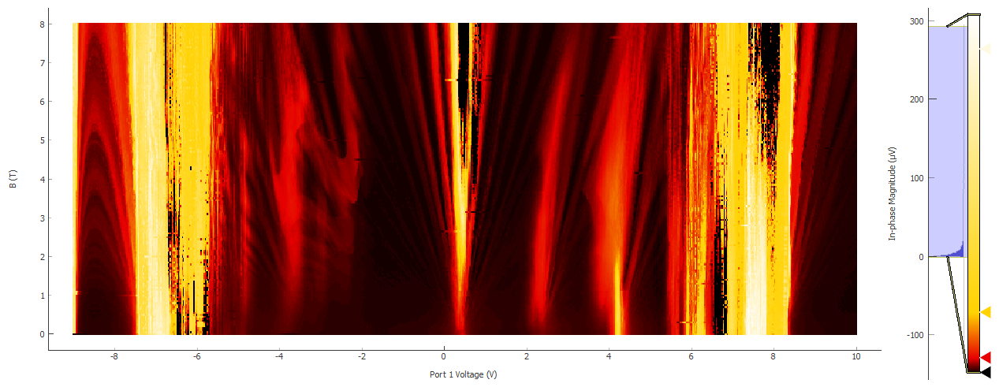

In [378]:
plot49[0]

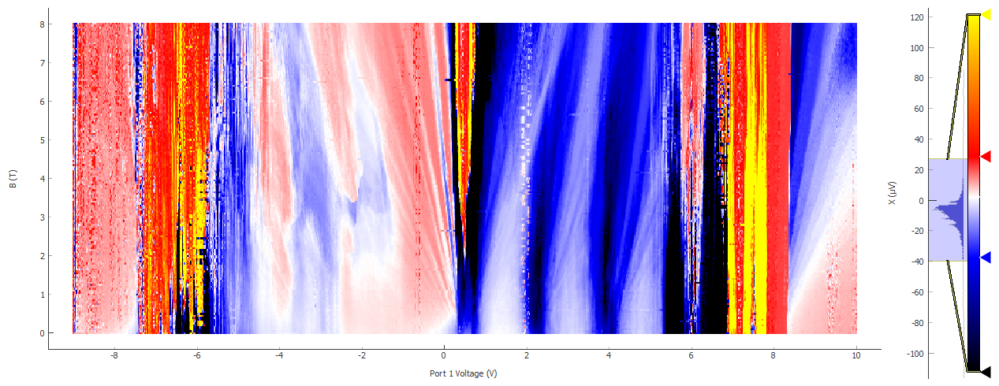

In [379]:
plot49[2]

In [382]:
srframe.volt_p1(-9)
time.sleep(30)
gvals = np.linspace(-9, 9, 361)
data50, plot50 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W3_865_48-47_830_19-47_baseT_1nA_gatesweep_8T')
srframe.volt_p1(0)

Started at 2020-02-13 10:14:32
DataSet:
   location = 'data/2020-02-13/#001_W3_865_48-47_830_19-47_baseT_1nA_gatesweep_8T_10-14-31'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (361,)
   Measured | lockin865_X         | X            | (361,)
   Measured | lockin865_Y         | Y            | (361,)
   Measured | lockin830_X         | X            | (361,)
   Measured | lockin830_Y         | Y            | (361,)
Finished at 2020-02-13 10:22:17


In [383]:
srframe.volt_p1(-9)
time.sleep(30)
gvals = np.linspace(-9, 9, 361)
data51, plot51 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W3_865_48-47_830_20-48_baseT_1nA_gatesweep_8T')
srframe.volt_p1(0)

Started at 2020-02-13 10:45:17
DataSet:
   location = 'data/2020-02-13/#002_W3_865_48-47_830_20-48_baseT_1nA_gatesweep_8T_10-45-15'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (361,)
   Measured | lockin865_X         | X            | (361,)
   Measured | lockin865_Y         | Y            | (361,)
   Measured | lockin830_X         | X            | (361,)
   Measured | lockin830_Y         | Y            | (361,)
Finished at 2020-02-13 10:53:02


In [ ]:
srframe.volt_p1(-9)
time.sleep(30)
gvals = np.linspace(-9, 10, 761)
bvals = np.linspace(8, 0, 161)
data52, plot52 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=30, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_865_47-48_830_20-48_baseT_1nA_B-Vgsweep')

Started at 2020-02-13 11:01:47
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.003999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.01 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.003999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.01 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please w

In [7]:
# the computer restarted itself

In [10]:
triton.field()

1.649998

In [11]:
srframe.volt_p1(-9)
time.sleep(30)
gvals = np.linspace(-9, 10, 761)
bvals = np.linspace(1.7, 0, 35)
data53, plot53 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=30, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_865_47-48_830_20-48_baseT_1nA_B-Vgsweep')

Started at 2020-02-15 10:40:26
Are you sure you want to use the magnet? [y/n]: y
Please wait 30.003999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.003999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.003999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.003999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.003999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.01 seconds for t

In [12]:
srframe.volt_p1(0)

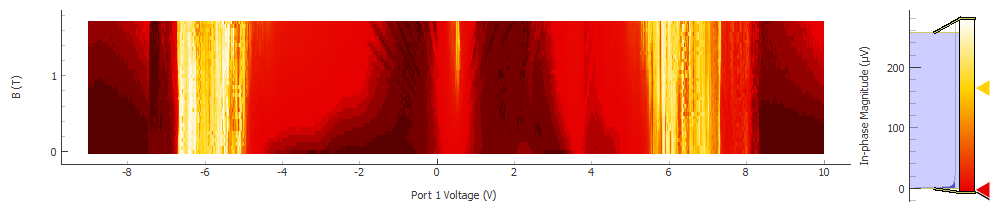

In [14]:
plot53[0]

# M26 fan diagram

In [15]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data54, plot54 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_basetemp_1nA_29-28_865_28-27_830')
srframe.volt_p1(0)

Started at 2020-02-15 21:52:10
DataSet:
   location = 'data/2020-02-15/#002_M26_basetemp_1nA_29-28_865_28-27_830_21-52-08'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
Finished at 2020-02-15 21:59:23


<IPython.core.display.Javascript object>


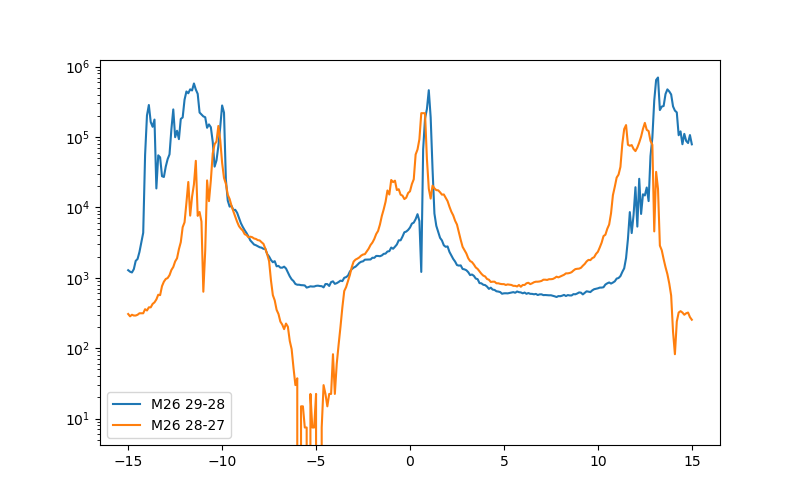

In [19]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, np.abs(data54.lockin865_X[:]/1e-9), label='M26 29-28')
plt.semilogy(gvals, np.abs(data54.lockin830_X[:]/1e-9), label='M26 28-27')
plt.legend()

In [21]:
srframe.volt_p1(-16)#2nA
time.sleep(15)
gvals = np.linspace(-16, 17, 661)
bvals = np.linspace(0, 8, 161)
data55, plot55 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=30, SetDelay2=1.2, Param2_SetBetween=0, DataName='M26_basetemp_1nA_29-28_865_28-27_830_baseT_2nA_B-Vgsweep')

Started at 2020-02-15 22:07:13
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.992 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.992 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.992 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997

In [22]:
srframe.volt_p1(0)

In [23]:
srframe.volt_p1(-15)
time.sleep(10)
gvals = np.linspace(-15, 15, 301)
data56, plot56 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_basetemp_2nA_28-2_865_27-25_830_8T')
srframe.volt_p1(0)

Started at 2020-02-18 10:20:21
DataSet:
   location = 'data/2020-02-18/#001_M26_basetemp_2nA_28-2_865_27-25_830_8T_10-20-20'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
Finished at 2020-02-18 10:27:35


In [24]:
srframe.volt_p1(-16)
time.sleep(15)
gvals = np.linspace(-16, 17, 661)
bvals = np.linspace(8, 0, 161)
data57, plot57 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=30, SetDelay2=1.2, Param2_SetBetween=0, DataName='M26_basetemp_2nA_28-2_865_27-25_830_baseT_2nA_B-Vgsweep')

Started at 2020-02-18 10:30:16
Please wait 10.024 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.018 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.018 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating

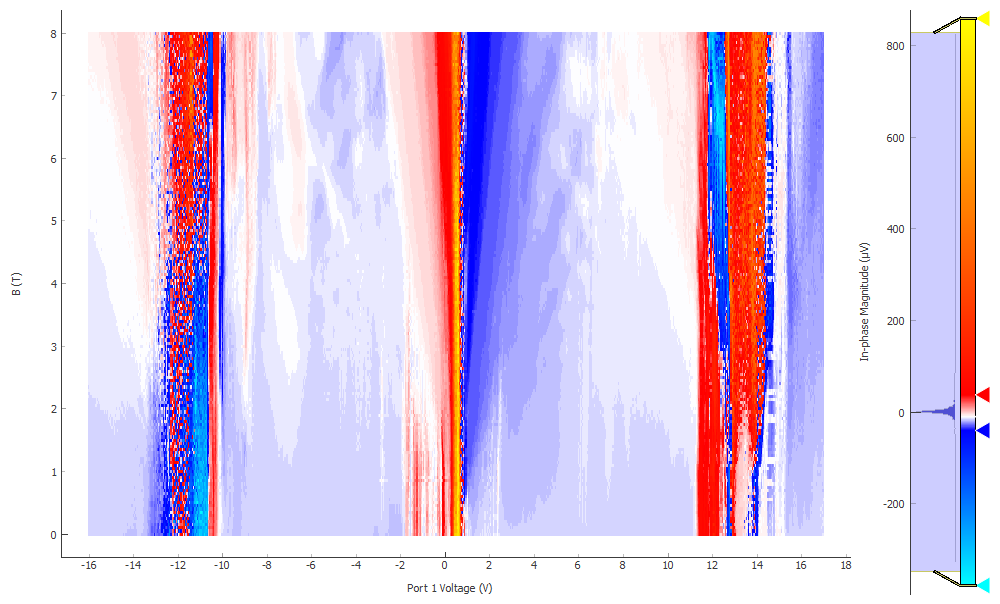

In [25]:
plot57[0]

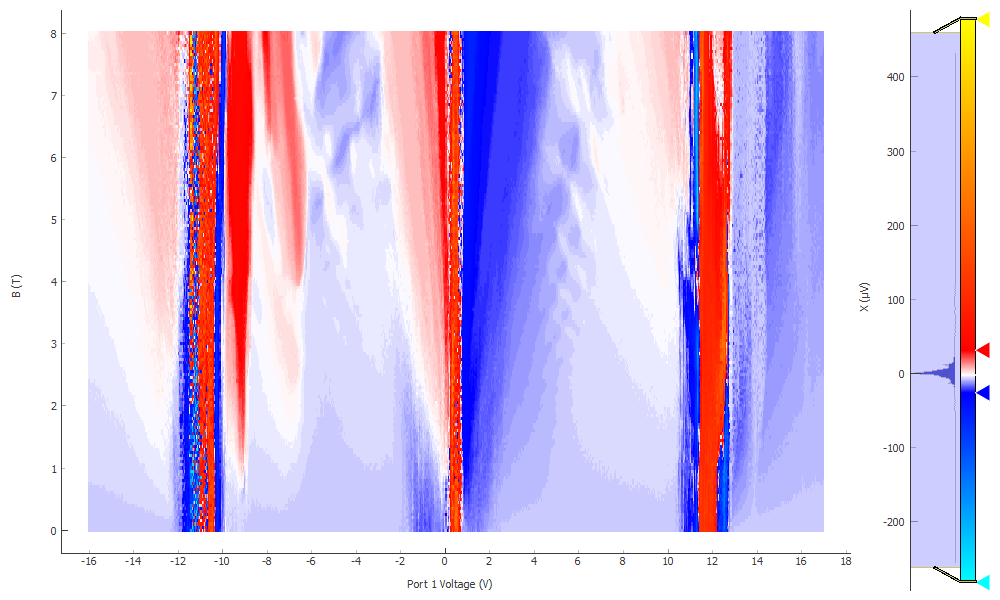

In [26]:
plot57[2]

In [27]:
data57.triton_field_set_stable_set

DataArray[161]: triton_field_set_stable_set
array([8.  , 7.95, 7.9 , 7.85, 7.8 , 7.75, 7.7 , 7.65, 7.6 , 7.55, 7.5 ,
       7.45, 7.4 , 7.35, 7.3 , 7.25, 7.2 , 7.15, 7.1 , 7.05, 7.  , 6.95,
       6.9 , 6.85, 6.8 , 6.75, 6.7 , 6.65, 6.6 , 6.55, 6.5 , 6.45, 6.4 ,
       6.35, 6.3 , 6.25, 6.2 , 6.15, 6.1 , 6.05, 6.  , 5.95, 5.9 , 5.85,
       5.8 , 5.75, 5.7 , 5.65, 5.6 , 5.55, 5.5 , 5.45, 5.4 , 5.35, 5.3 ,
       5.25, 5.2 , 5.15, 5.1 , 5.05, 5.  , 4.95, 4.9 , 4.85, 4.8 , 4.75,
       4.7 , 4.65, 4.6 , 4.55, 4.5 , 4.45, 4.4 , 4.35, 4.3 , 4.25, 4.2 ,
       4.15, 4.1 , 4.05, 4.  , 3.95, 3.9 , 3.85, 3.8 , 3.75, 3.7 , 3.65,
       3.6 , 3.55, 3.5 , 3.45, 3.4 , 3.35, 3.3 , 3.25, 3.2 , 3.15, 3.1 ,
       3.05, 3.  , 2.95, 2.9 , 2.85, 2.8 , 2.75, 2.7 , 2.65, 2.6 , 2.55,
       2.5 , 2.45, 2.4 , 2.35, 2.3 , 2.25, 2.2 , 2.15, 2.1 , 2.05, 2.  ,
       1.95, 1.9 , 1.85, 1.8 , 1.75, 1.7 , 1.65, 1.6 , 1.55, 1.5 , 1.45,
       1.4 , 1.35, 1.3 , 1.25, 1.2 , 1.15, 1.1 , 1.05, 1.  , 0.95, 0.9 ,
       

In [34]:
# get a couple of negative field points for low-field Hall measurements
srframe.volt_p1(-16)
time.sleep(15)
gvals = np.linspace(-16, 17, 661)
bvals = [-0.1, -0.2]
data58, plot58 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=30, SetDelay2=1.2, Param2_SetBetween=0, DataName='M26_basetemp_2nA_28-2_865_27-25_830_baseT_2nA_negB-Vgsweep')

Started at 2020-02-20 17:39:06
Please wait 69.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 70.0 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-02-20/#001_M26_basetemp_2nA_28-2_865_27-25_830_baseT_2nA_negB-Vgsweep_17-39-03'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (2,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (2, 661)
   Measured | lockin865_X                 | X                | (2, 661)
   Measured | lockin865_Y                 | Y                | (2, 661)
   Measured | lockin830_X                 | X                | (2, 661)
   Measured | lockin830_Y                 | Y                | (2, 661)
Finished at 2020-02-20 18:11:14


In [35]:
triton.field_set_stable(0)

Please wait 129.994 seconds for the field sweep, plus the time required for operating the switch...


In [40]:
srframe.volt_p5(0)

In [41]:

bvals = np.linspace(-0.2, 0.2, 161)
offvals = np.linspace(-6, 6, 241)
data59, plot59 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p5, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.1, Param2_SetBetween=0, DataName='M26_865_28-27_vbg-5p2V_FraunhoferbaseT_0p5nA')

Started at 2020-02-21 10:14:38
Please wait 130.01800000000003 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.494 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.494 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.5 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.494 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.488 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.512 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.494 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.5 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.494 seconds for the field sweep, plus the time required

In [42]:
bvals = np.linspace(0.2, -0.2, 161)
offvals = np.linspace(-5, 5, 201)
data60, plot60 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p5, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.1, Param2_SetBetween=0, DataName='M26_865_28-27_vbg-5p4V_FraunhoferbaseT_0p5nA')

Started at 2020-02-23 14:08:34
Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.5 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.506 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.5 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.5 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.5 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.5 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.506 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.506 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.5 seconds for the field sweep, plus the time required for operating the swi

In [43]:
bvals = np.linspace(-0.05, 0.05, 101)
offvals = np.linspace(-5, 5, 201)
data61, plot61 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p5, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.1, Param2_SetBetween=0, DataName='M26_865_28-27_vbg-5p4V_FraunhoferbaseT_0p5nA_finer')

Started at 2020-02-24 02:52:56
Please wait 100.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.606 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.588 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.576 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.612 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.6 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.606 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.612 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.606 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.582 seconds for the field sweep, plus the time required for operat

 # W5 Temperature dependence

In [44]:
srframe.volt_p1(6)
time.sleep(10)
gvals = np.linspace(6, -6, 241)
data62, plot62 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='W5_basetemp_1nA_lockin865_40-39_lockin830_39-38')
srframe.volt_p1(0)

Started at 2020-02-24 11:55:54
DataSet:
   location = 'data/2020-02-24/#002_W5_basetemp_1nA_lockin865_40-39_lockin830_39-38_11-55-53'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (241,)
   Measured | lockin865_X         | X            | (241,)
   Measured | lockin865_Y         | Y            | (241,)
Finished at 2020-02-24 12:00:47


In [45]:
srframe.volt_p1(-6)
time.sleep(10)
gval = np.linspace(-6, 6.5, 626)
data63, plot63 = npd.single_param_sweep(srframe.volt_p1, gval, 1.3, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_basetemp_0p5nA_865_40-39_830_39-38', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-02-24 12:14:52
DataSet:
   location = 'data/2020-02-24/#003_W5_basetemp_0p5nA_865_40-39_830_39-38_12-14-51'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (626,)
   Measured | lockin865_X         | X            | (626,)
   Measured | lockin865_Y         | Y            | (626,)
   Measured | lockin830_X         | X            | (626,)
   Measured | lockin830_Y         | Y            | (626,)
Finished at 2020-02-24 12:29:59


In [46]:
srframe.volt_p1(-6)
time.sleep(10)
gval = np.linspace(-6, 6.5, 626)
data64, plot64 = npd.single_param_sweep(srframe.volt_p1, gval, 1.3, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_basetemp_0p5nA_865_40-39_830_39-38', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-02-24 12:31:18
DataSet:
   location = 'data/2020-02-24/#004_W5_basetemp_0p5nA_865_40-39_830_39-38_12-31-17'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (626,)
   Measured | lockin865_X         | X            | (626,)
   Measured | lockin865_Y         | Y            | (626,)
   Measured | lockin830_X         | X            | (626,)
   Measured | lockin830_Y         | Y            | (626,)
Finished at 2020-02-24 12:46:31


In [47]:
triton.pid_setpoint(0.03)

In [48]:
triton.pid_mode(1)

In [49]:
triton.pid_range(1)

In [50]:
triton.pid_setpoint(0.05)

In [51]:
triton.pid_range(10)

In [52]:
srframe.volt_p1(-6)
time.sleep(10)
Tvals = np.linspace(0.05, 1, 20)
gvals = np.linspace(-6, 6.5, 626)
data65, plot65 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=0, DataName='W5_basetemp_0p5nA_865_40-39_830_39-38_gateTsweepto1K_0p5nA')
srframe.volt_p1(0)

Started at 2020-02-24 16:49:38
DataSet:
   location = 'data/2020-02-24/#005_W5_basetemp_0p5nA_865_40-39_830_39-38_gateTsweepto1K_0p5nA_16-49-36'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 626)
   Measured | lockin865_X             | X            | (20, 626)
   Measured | lockin865_Y             | Y            | (20, 626)
   Measured | lockin830_X             | X            | (20, 626)
   Measured | lockin830_Y             | Y            | (20, 626)
Finished at 2020-02-24 22:50:58


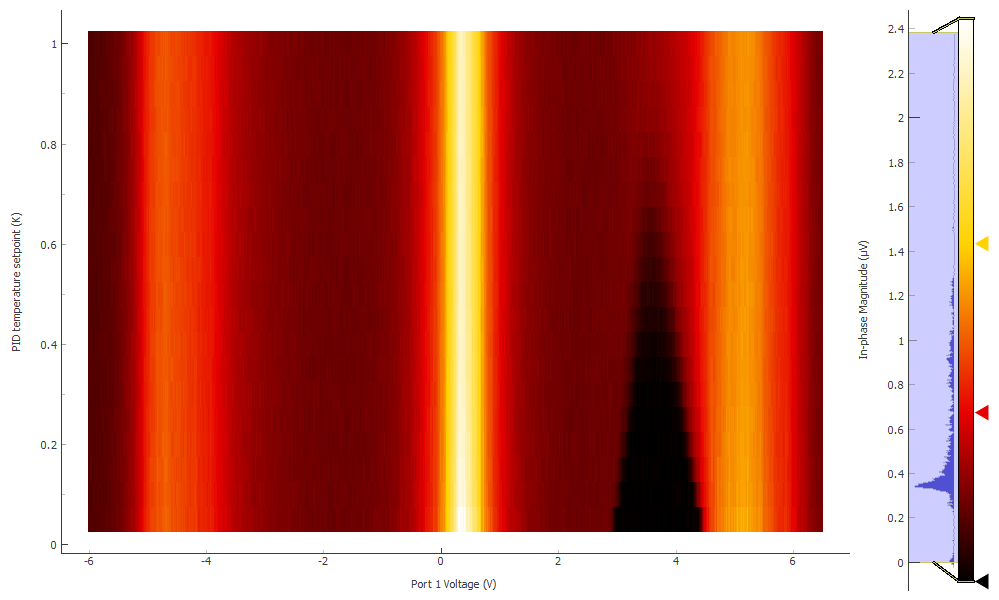

In [53]:
plot65[0]

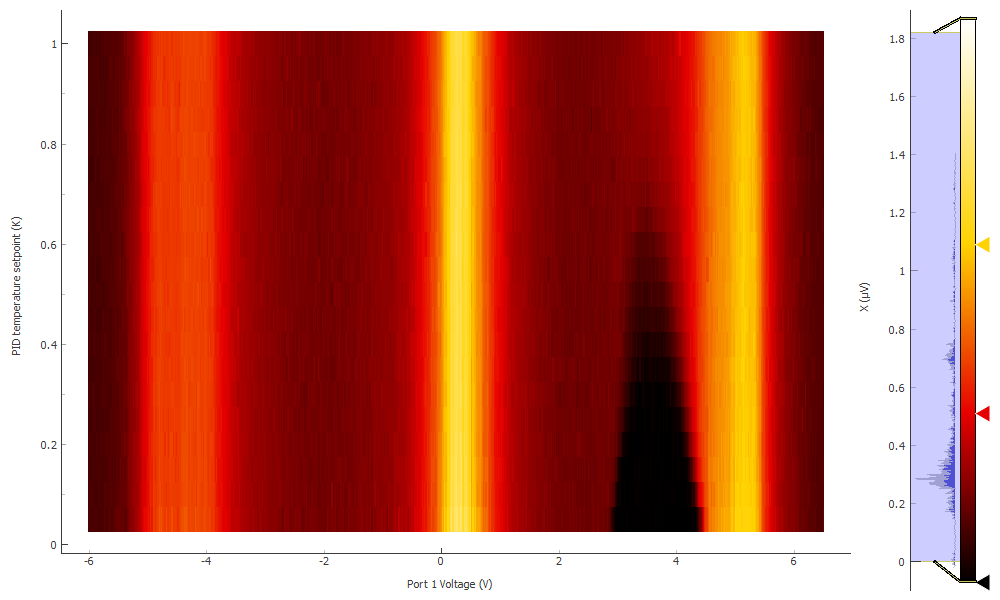

In [54]:
plot65[2]

In [55]:
triton.pid_range(31.6)
time.sleep(3)

In [72]:
triton.pid_setpoint(1.1)

In [73]:
srframe.volt_p1(-6)
time.sleep(10)
Tvals = np.linspace(1.1, 1.4, 4)
gvals = np.linspace(-6, 6.5, 626)
data66, plot66 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=0, DataName='W5_basetemp_865_40-39_830_39-38_gateTsweep1p1to1p4K_0p5nA', ZParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-02-24 22:57:44
DataSet:
   location = 'data/2020-02-24/#006_W5_basetemp_865_40-39_830_39-38_gateTsweep1p1to1p4K_0p5nA_22-57-43'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (4,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (4, 626)
   Measured | lockin865_X             | X            | (4, 626)
   Measured | lockin865_Y             | Y            | (4, 626)
   Measured | lockin830_X             | X            | (4, 626)
   Measured | lockin830_Y             | Y            | (4, 626)
Finished at 2020-02-25 00:09:58


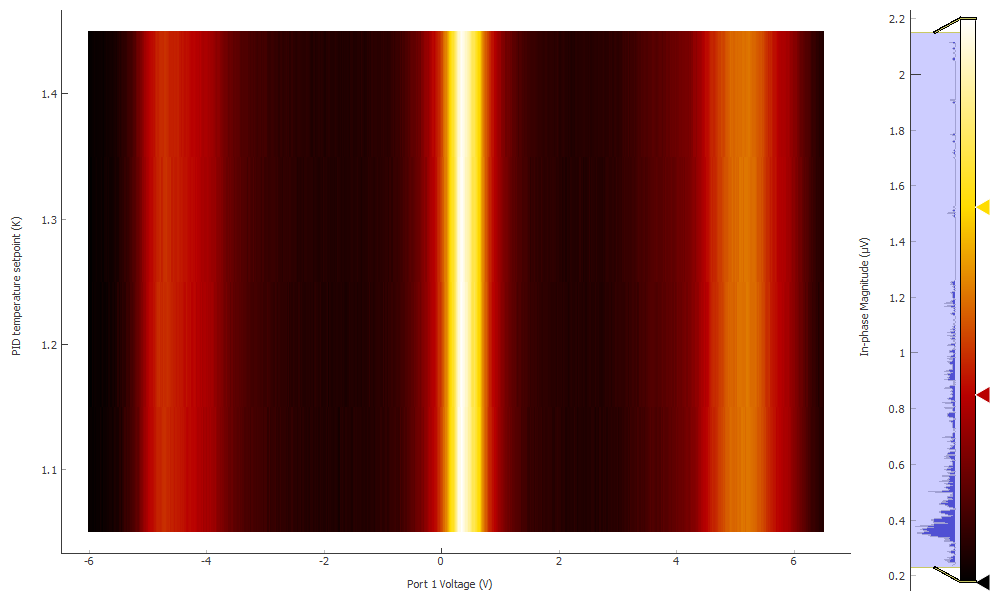

In [78]:
plot66[0]

In [74]:
triton.pid_range(100)
time.sleep(3)

In [80]:
triton.pid_setpoint(1.5)

In [81]:
srframe.volt_p1(-6)
time.sleep(10)
Tvals = np.linspace(1.5, 2, 6)
gvals = np.linspace(-6, 6.5, 626)
data67, plot67 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=0, DataName='W5_basetemp_865_40-39_830_39-38_gateTsweep1p5to2K_0p5nA', ZParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-02-25 00:19:26
DataSet:
   location = 'data/2020-02-25/#001_W5_basetemp_865_40-39_830_39-38_gateTsweep1p5to2K_0p5nA_00-19-25'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (6,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (6, 626)
   Measured | lockin865_X             | X            | (6, 626)
   Measured | lockin865_Y             | Y            | (6, 626)
   Measured | lockin830_X             | X            | (6, 626)
   Measured | lockin830_Y             | Y            | (6, 626)
Finished at 2020-02-25 02:07:57


In [82]:
srframe.volt_p1(0)

In [85]:
triton.pid_mode(0)  # then switch to the cernox sensor by changing 8 to 5 in the pid window, turning off 8 and on 5.

In [84]:
triton.pid_mode(1)

In [86]:
triton.pid_setpoint(2)
triton.pid_range(100)

In [87]:
triton.pid_setpoint(2.1)

In [88]:
srframe.volt_p1(-6)
time.sleep(10)
Tvals = np.linspace(2.1, 10, 80)
gvals = np.linspace(-6, 6.5, 626)
data68, plot68 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=0, DataName='W5_basetemp_865_40-39_830_39-38_gateTsweep2.1Kto10K_0p5nA', ZParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-02-25 09:49:24
DataSet:
   location = 'data/2020-02-25/#002_W5_basetemp_865_40-39_830_39-38_gateTsweep2.1Kto10K_0p5nA_09-49-22'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (80,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (80, 626)
   Measured | lockin865_X             | X            | (80, 626)
   Measured | lockin865_Y             | Y            | (80, 626)
   Measured | lockin830_X             | X            | (80, 626)
   Measured | lockin830_Y             | Y            | (80, 626)
Finished at 2020-02-26 09:56:23


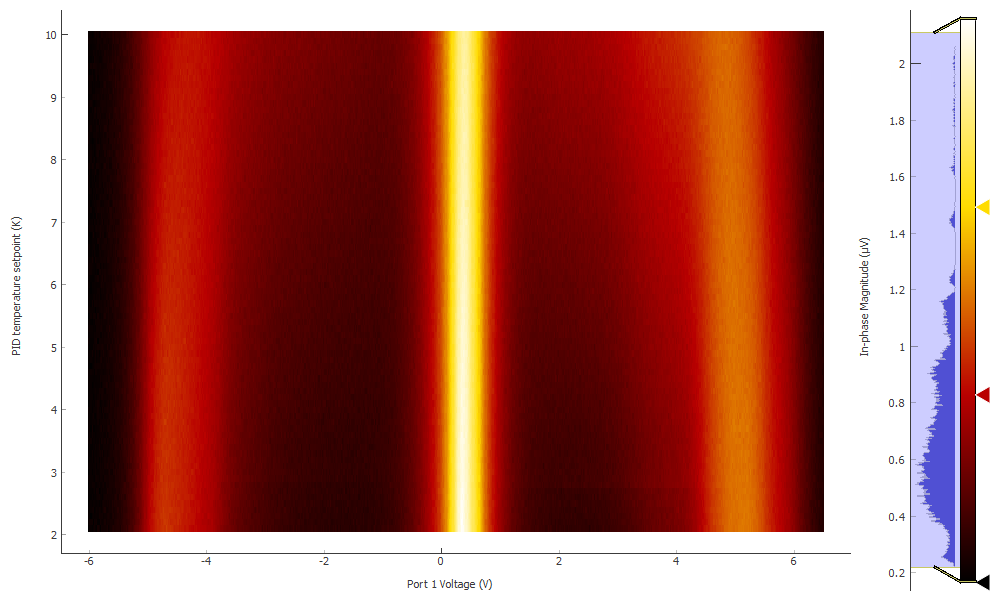

In [97]:
plot68[0]

In [89]:
triton.pid_setpoint(11)

In [91]:
srframe.volt_p1(-6)#0.5nA
time.sleep(10)
Tvals = np.linspace(11, 30, 20)
gvals = np.linspace(-6, 6.5, 626)
data69, plot69 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.05, Param2_SetBetween=0, DataName='W5_865_40-39_830_39-38_gateTsweep11to30K_0p4nA', ZParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-02-26 10:13:40
DataSet:
   location = 'data/2020-02-26/#002_W5_865_40-39_830_39-38_gateTsweep11to30K_0p4nA_10-13-39'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 626)
   Measured | lockin865_X             | X            | (20, 626)
   Measured | lockin865_Y             | Y            | (20, 626)
   Measured | lockin830_X             | X            | (20, 626)
   Measured | lockin830_Y             | Y            | (20, 626)
Finished at 2020-02-26 15:43:17


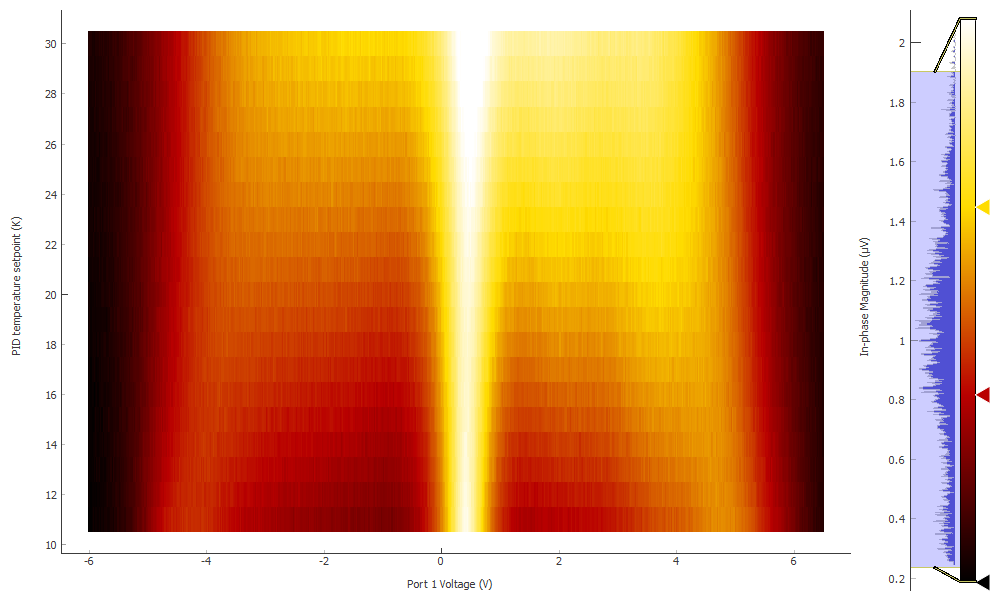

In [96]:
plot69[0]

In [92]:
triton.pid_setpoint(31)

In [93]:
srframe.volt_p1(-6)#0.5nA
time.sleep(10)
Tvals = np.linspace(31, 40, 10)
gvals = np.linspace(-6, 6.5, 626)
data70, plot70 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.05, Param2_SetBetween=0, DataName='W5_865_40-39_830_39-38_gateTsweep31to40K_0p4nA', ZParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-02-26 15:53:49
DataSet:
   location = 'data/2020-02-26/#003_W5_865_40-39_830_39-38_gateTsweep31to40K_0p4nA_15-53-47'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (10,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (10, 626)
   Measured | lockin865_X             | X            | (10, 626)
   Measured | lockin865_Y             | Y            | (10, 626)
   Measured | lockin830_X             | X            | (10, 626)
   Measured | lockin830_Y             | Y            | (10, 626)
Finished at 2020-02-26 18:38:23


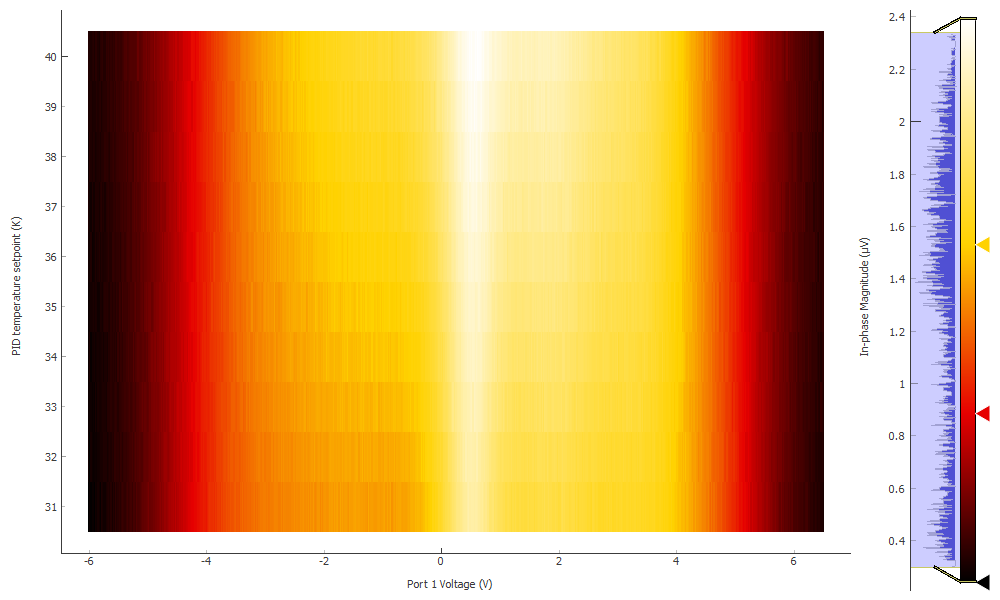

In [94]:
plot70[0]

Full Cooldown again

In [101]:
lockin865.amplitude()

0.0

In [105]:
triton.read_temps()

MC - on:  10.1815 K
MC_cernox - on:  10.1536 K
still - on:  9.63111 K
cold_plate - on:  9.7361 K
magnet - on:  4.02725 K
PT2h - on:  3.31423 K
PT2p - on:  3.56927 K
PT1h - on:  47.4022 K
PT1p - on:  59.6971 K


In [106]:
triton.read_pressures()

P1:  746.825
P2:  760.787
P3:  0.0002
P4:  0.0094
P5:  44.2632
POVC:  0.0003


In [113]:
lockin865.amplitude(0.1)

In [114]:
srframe.volt_p1(6)
time.sleep(10)
gvals = np.linspace(6, -6, 241)
data71, plot71 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, DataName='W5_basetempagain_1nA_lockin865_40-39_lockin830_39-38')
srframe.volt_p1(0)

Started at 2020-02-27 09:34:09
DataSet:
   location = 'data/2020-02-27/#001_W5_basetempagain_1nA_lockin865_40-39_lockin830_39-38_09-34-08'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (241,)
   Measured | lockin865_X         | X            | (241,)
   Measured | lockin865_Y         | Y            | (241,)
Finished at 2020-02-27 09:39:01


In [115]:
srframe.volt_p1(6)
time.sleep(10)
gvals = np.linspace(6, -6, 241)
data72, plot72 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_basetempagain_1nA_lockin865_38-37_lockin830_40-39')
srframe.volt_p1(0)

Started at 2020-02-27 09:43:41
DataSet:
   location = 'data/2020-02-27/#002_W5_basetempagain_1nA_lockin865_38-37_lockin830_40-39_09-43-39'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (241,)
   Measured | lockin865_X         | X            | (241,)
   Measured | lockin865_Y         | Y            | (241,)
   Measured | lockin830_X         | X            | (241,)
   Measured | lockin830_Y         | Y            | (241,)
Finished at 2020-02-27 09:48:51


In [116]:
srframe.volt_p1(-6)
time.sleep(10)
gval = np.linspace(-6, 6.5, 626)
data73, plot73 = npd.single_param_sweep(srframe.volt_p1, gval, 1.3, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_basetemp_0p5nA_865_38-37_830_40-39', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-02-27 09:51:51
DataSet:
   location = 'data/2020-02-27/#003_W5_basetemp_0p5nA_865_38-37_830_40-39_09-51-50'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (626,)
   Measured | lockin865_X         | X            | (626,)
   Measured | lockin865_Y         | Y            | (626,)
   Measured | lockin830_X         | X            | (626,)
   Measured | lockin830_Y         | Y            | (626,)
Finished at 2020-02-27 10:06:56


In [120]:
triton.pid_setpoint(0.1)

In [121]:
triton.pid_mode(1)

In [122]:
triton.pid_range(1)

In [123]:
srframe.volt_p1(-6)
time.sleep(10)
Tvals = np.linspace(0.05, 1, 20)
gvals = np.linspace(-6, 6.5, 626)
data74, plot74 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=0, DataName='W5_0p5nA_865_40-39_gateTsweepto1K_0p5nA')
srframe.volt_p1(0)

Started at 2020-02-27 11:13:44
DataSet:
   location = 'data/2020-02-27/#004_W5_0p5nA_865_40-39_gateTsweepto1K_0p5nA_11-13-42'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 626)
   Measured | lockin865_X             | X            | (20, 626)
   Measured | lockin865_Y             | Y            | (20, 626)
   Measured | lockin830_X             | X            | (20, 626)
   Measured | lockin830_Y             | Y            | (20, 626)
Finished at 2020-02-27 11:34:48
Keyboard Interrupt


In [124]:
lockin865.amplitude(0)

# M26 for magnetism

blown up device? characteristics

In [127]:
srframe.volt_p1(-15)
time.sleep(12)
gvals = np.linspace(-15, 15, 151)
data75, plot75 = npd.single_param_sweep(srframe.volt_p1, gvals, 3.05, lockin865.X, lockin865.Y, DataName='M26_basetemp_0.5nA_7-6_865')
srframe.volt_p1(0)

Started at 2020-02-27 16:12:00
DataSet:
   location = 'data/2020-02-27/#005_M26_basetemp_0.5nA_7-6_865_16-11-59'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
Finished at 2020-02-27 16:20:44


In [128]:
srframe.volt_p1(-15)
time.sleep(12)
gvals = np.linspace(-15, 15, 151)
data75, plot75 = npd.single_param_sweep(srframe.volt_p1, gvals, 3.05, lockin865.X, lockin865.Y, DataName='M26_basetemp_0.5nA_10-7_865')
srframe.volt_p1(0)

Started at 2020-02-27 16:23:28
DataSet:
   location = 'data/2020-02-27/#006_M26_basetemp_0.5nA_10-7_865_16-23-27'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
Finished at 2020-02-27 16:32:13


<IPython.core.display.Javascript object>


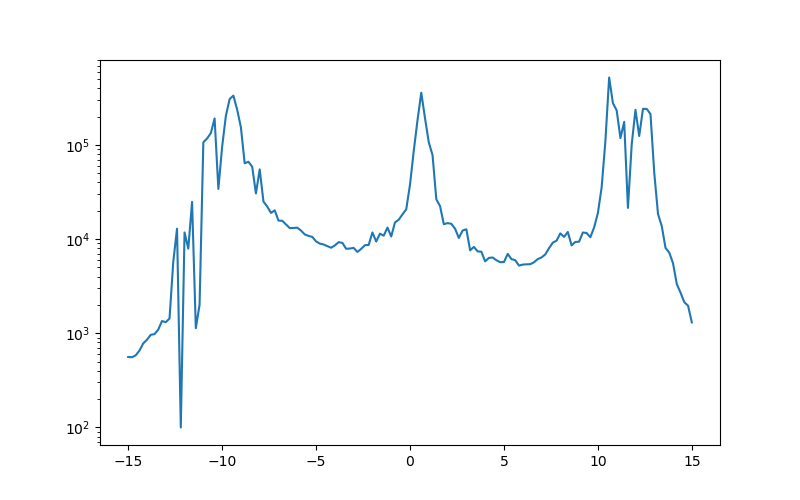

In [129]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, np.abs(data75.lockin865_X[:]/0.5e-9), label='M26 10-7')

In [130]:
srframe.volt_p1(-15)
time.sleep(12)
gvals = np.linspace(-15, 15, 151)
data76, plot76 = npd.single_param_sweep(srframe.volt_p1, gvals, 3.05, lockin865.X, lockin865.Y, DataName='M26_basetemp_1nA_8-7_865')
srframe.volt_p1(0)

Started at 2020-02-27 16:36:37
DataSet:
   location = 'data/2020-02-27/#007_M26_basetemp_1nA_8-7_865_16-36-36'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
Finished at 2020-02-27 16:45:22


<IPython.core.display.Javascript object>


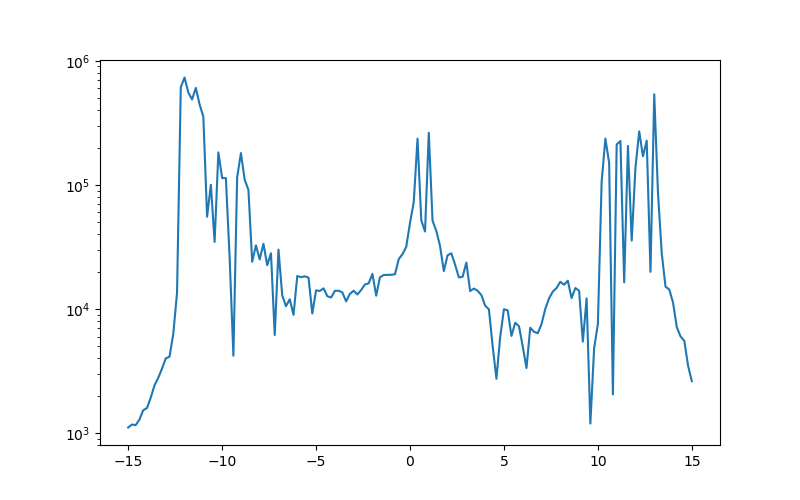

In [131]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, np.abs(data76.lockin865_X[:]/0.5e-9), label='M26 8-7')

In [132]:
srframe.volt_p1(-15)
time.sleep(12)
gvals = np.linspace(-15, 15, 151)
data77, plot77 = npd.single_param_sweep(srframe.volt_p1, gvals, 3.05, lockin865.X, lockin865.Y, DataName='M26_basetemp_1nA_10-4_865')
srframe.volt_p1(0)

Started at 2020-02-27 16:48:55
DataSet:
   location = 'data/2020-02-27/#008_M26_basetemp_1nA_10-4_865_16-48-54'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
Finished at 2020-02-27 16:57:39


<IPython.core.display.Javascript object>


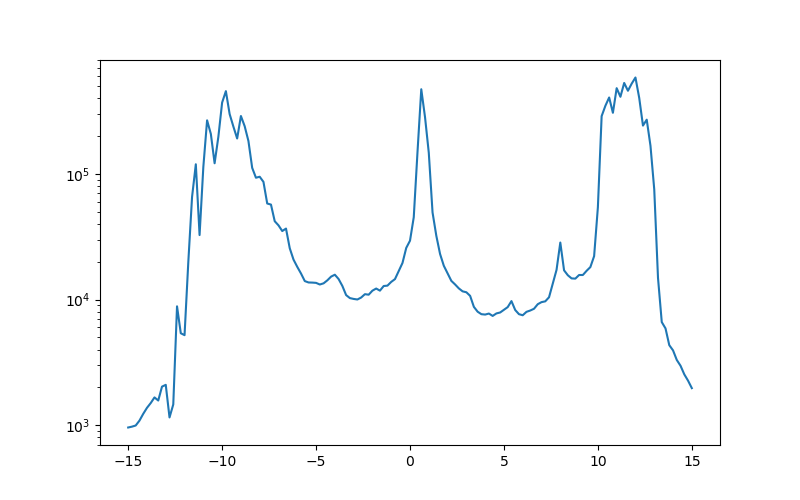

In [133]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, np.abs(data77.lockin865_X[:]/1e-9), label='M26 10-4')

<IPython.core.display.Javascript object>


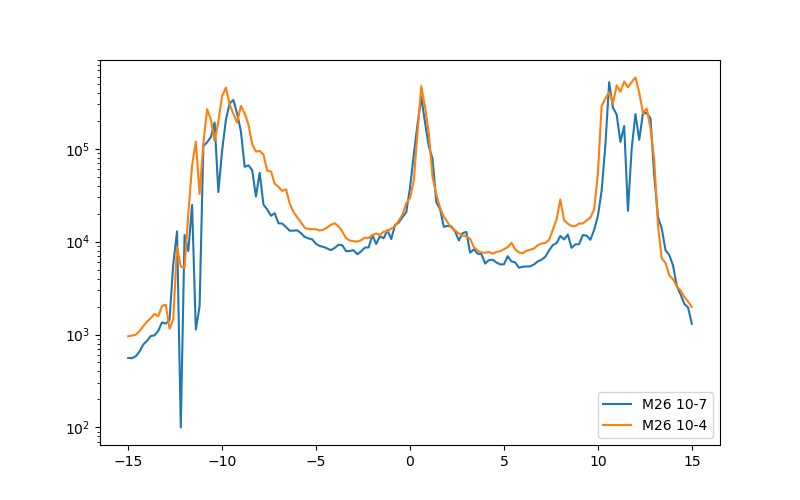

In [134]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, np.abs(data75.lockin865_X[:]/0.5e-9), label='M26 10-7')
plt.semilogy(gvals, np.abs(data77.lockin865_X[:]/1e-9), label='M26 10-4')
plt.legend()

In [135]:
srframe.volt_p1(-15)
time.sleep(12)
gvals = np.linspace(-15, 15, 151)
data78, plot78 = npd.single_param_sweep(srframe.volt_p1, gvals, 3.05, lockin865.X, lockin865.Y, DataName='M26_basetemp_1nA_10-4_865_after-0.5T')
srframe.volt_p1(0)

Started at 2020-02-27 17:17:27
DataSet:
   location = 'data/2020-02-27/#009_M26_basetemp_1nA_10-4_865_after-0.5T_17-17-26'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
Finished at 2020-02-27 17:26:11


<IPython.core.display.Javascript object>


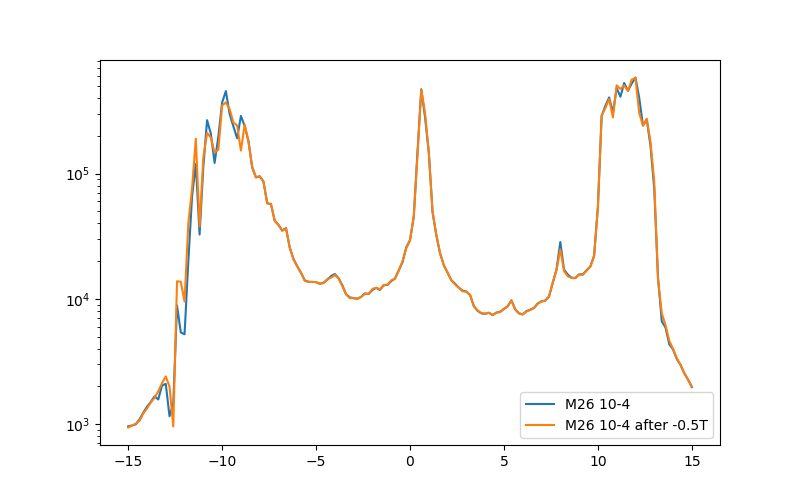

In [137]:
plt.figure(figsize=(8, 5))
plt.semilogy(gvals, np.abs(data77.lockin865_X[:]/1e-9), label='M26 10-4')
plt.semilogy(gvals, np.abs(data78.lockin865_X[:]/1e-9), label='M26 10-4 after -0.5T')
plt.legend()

In [138]:
srframe.volt_p1(-15)
time.sleep(12)
gvals = np.linspace(-15, 15, 151)
data79, plot79 = npd.single_param_sweep(srframe.volt_p1, gvals, 3.05, lockin865.X, lockin865.Y, DataName='M26_basetemp_1nA_10-4_865_after-0.5T_repeat')
srframe.volt_p1(0)

Started at 2020-02-27 17:30:53
DataSet:
   location = 'data/2020-02-27/#010_M26_basetemp_1nA_10-4_865_after-0.5T_repeat_17-30-52'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
Finished at 2020-02-27 17:39:37


<IPython.core.display.Javascript object>


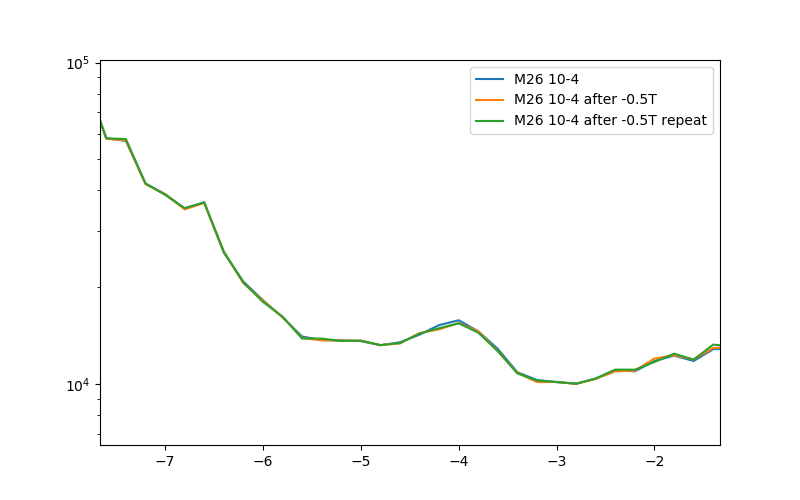

In [546]:
plt.figure(figsize=(8, 5))
gvals = np.linspace(-15, 15, 151)
plt.semilogy(gvals, np.abs(data77.lockin865_X[:]/1e-9), label='M26 10-4')
plt.semilogy(gvals, np.abs(data78.lockin865_X[:]/1e-9), label='M26 10-4 after -0.5T')
plt.semilogy(gvals, np.abs(data79.lockin865_X[:]/1e-9), label='M26 10-4 after -0.5T repeat')
plt.legend()

In [140]:
srframe.volt_p1(8)

In [142]:
triton.magnet_sweeprate(0.05)# come back to this same spot later and do an Rxx measurement. 0.1nA amplitude
triton.field(-0.3)
data80, plot80 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin865.R, breakif=npd.breakat(triton.field, 0.3, -0.3, 60), minutes=24, DataName='M20_865_10-4_fieldsweepdown_7p9bg', XParam=triton.field, YParam=[lockin865.R])

Are you sure you want to use the magnet? [y/n]: y
Sweep time approximately 730.012 seconds
Started at 2020-02-27 17:54:00
DataSet:
   location = 'data/2020-02-27/#012_M20_865_10-4_fieldsweepdown_7p9bg_17-54-00'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1440,)
   Measured | time0        | time0        | (1440,)
   Measured | triton_field | field        | (1440,)
   Measured | lockin865_X  | X            | (1440,)
   Measured | lockin865_Y  | Y            | (1440,)
   Measured | lockin865_R  | R            | (1440,)
Finished at 2020-02-27 18:06:30
Keyboard Interrupt


In [153]:
#triton.magnet_sweeprate(0.05)# come back to this same spot later and do an Rxx measurement. 0.1nA amplitude
data82, plot82 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=24, DataName='M20_865_10-4_fieldsweepup_7p9bg', XParam=triton.field, YParam=[lockin865.R])

Started at 2020-02-27 18:40:05
DataSet:
   location = 'data/2020-02-27/#023_M20_865_10-4_fieldsweepup_7p9bg_18-40-04'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1440,)
   Measured | time0        | time0        | (1440,)
   Measured | triton_field | field        | (1440,)
   Measured | lockin865_X  | X            | (1440,)
   Measured | lockin865_Y  | Y            | (1440,)
   Measured | lockin865_R  | R            | (1440,)
Finished at 2020-02-27 18:58:29
Keyboard Interrupt


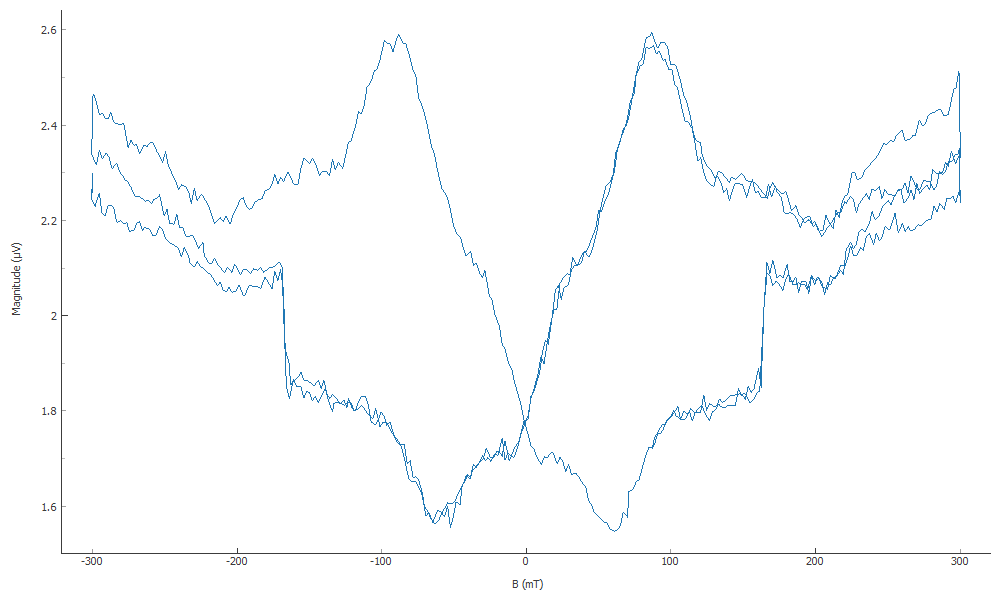

In [154]:
plot82[0]

In [155]:
#triton.magnet_sweeprate(0.05)# come back to this same spot later and do an Rxx measurement. 0.5nA amplitude
data83, plot83 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=24, DataName='M20_865_10-4_fieldsweepup_7p9bg', XParam=triton.field, YParam=[lockin865.R])

Started at 2020-02-27 19:00:04
DataSet:
   location = 'data/2020-02-27/#024_M20_865_10-4_fieldsweepup_7p9bg_19-00-04'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1440,)
   Measured | time0        | time0        | (1440,)
   Measured | triton_field | field        | (1440,)
   Measured | lockin865_X  | X            | (1440,)
   Measured | lockin865_Y  | Y            | (1440,)
   Measured | lockin865_R  | R            | (1440,)
Finished at 2020-02-27 19:24:23
Keyboard Interrupt


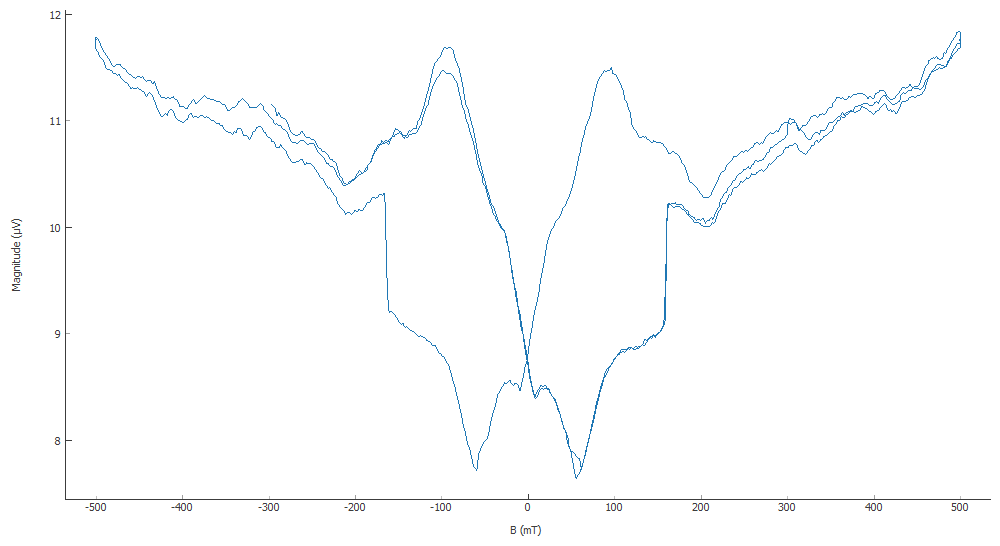

In [156]:
plot83[0]

In [157]:
srframe.volt_p1(0)

In [158]:
lockin865.amplitude(0)

In [160]:
triton.field()

0.499983

In [161]:
# now try different gate voltage

In [162]:
lockin865.amplitude(0.05)

In [163]:
srframe.volt_p1(8)

In [164]:
#triton.magnet_sweeprate(0.05)# come back to this same spot later and do an Rxx measurement. 0.5nA amplitude
data84, plot84 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=24, DataName='M20_865_10-4_fieldsweepup_8p0bg_0.5nA', XParam=triton.field, YParam=[lockin865.R])

Started at 2020-02-28 09:58:58
DataSet:
   location = 'data/2020-02-28/#001_M20_865_10-4_fieldsweepup_8p0bg_0.5nA_09-58-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1440,)
   Measured | time0        | time0        | (1440,)
   Measured | triton_field | field        | (1440,)
   Measured | lockin865_X  | X            | (1440,)
   Measured | lockin865_Y  | Y            | (1440,)
   Measured | lockin865_R  | R            | (1440,)
Finished at 2020-02-28 10:16:14
Keyboard Interrupt


In [165]:
srframe.volt_p1(7.8)

In [166]:
#triton.magnet_sweeprate(0.05)# come back to this same spot later and do an Rxx measurement. 0.5nA amplitude
data85, plot85 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=24, DataName='M20_865_10-4_fieldsweepup_7p8bg_0.5nA', XParam=triton.field, YParam=[lockin865.R])

Started at 2020-02-28 10:16:33
DataSet:
   location = 'data/2020-02-28/#002_M20_865_10-4_fieldsweepup_7p8bg_0.5nA_10-16-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1440,)
   Measured | time0        | time0        | (1440,)
   Measured | triton_field | field        | (1440,)
   Measured | lockin865_X  | X            | (1440,)
   Measured | lockin865_Y  | Y            | (1440,)
   Measured | lockin865_R  | R            | (1440,)
Finished at 2020-02-28 10:33:49
Keyboard Interrupt


In [167]:
srframe.volt_p1(7.6)

In [168]:
data86, plot86 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=24, DataName='M20_865_10-4_fieldsweepup_7p6bg_0.5nA', XParam=triton.field, YParam=[lockin865.R])

Started at 2020-02-28 10:34:50
DataSet:
   location = 'data/2020-02-28/#003_M20_865_10-4_fieldsweepup_7p6bg_0.5nA_10-34-50'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1440,)
   Measured | time0        | time0        | (1440,)
   Measured | triton_field | field        | (1440,)
   Measured | lockin865_X  | X            | (1440,)
   Measured | lockin865_Y  | Y            | (1440,)
   Measured | lockin865_R  | R            | (1440,)
Finished at 2020-02-28 10:52:08
Keyboard Interrupt


In [169]:
srframe.volt_p1(7.3)

In [170]:
data87, plot87 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=24, DataName='M20_865_10-4_fieldsweepup_7p3bg_0.5nA', XParam=triton.field, YParam=[lockin865.R])

Started at 2020-02-28 10:52:52
DataSet:
   location = 'data/2020-02-28/#004_M20_865_10-4_fieldsweepup_7p3bg_0.5nA_10-52-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1440,)
   Measured | time0        | time0        | (1440,)
   Measured | triton_field | field        | (1440,)
   Measured | lockin865_X  | X            | (1440,)
   Measured | lockin865_Y  | Y            | (1440,)
   Measured | lockin865_R  | R            | (1440,)
Finished at 2020-02-28 11:10:45
Keyboard Interrupt


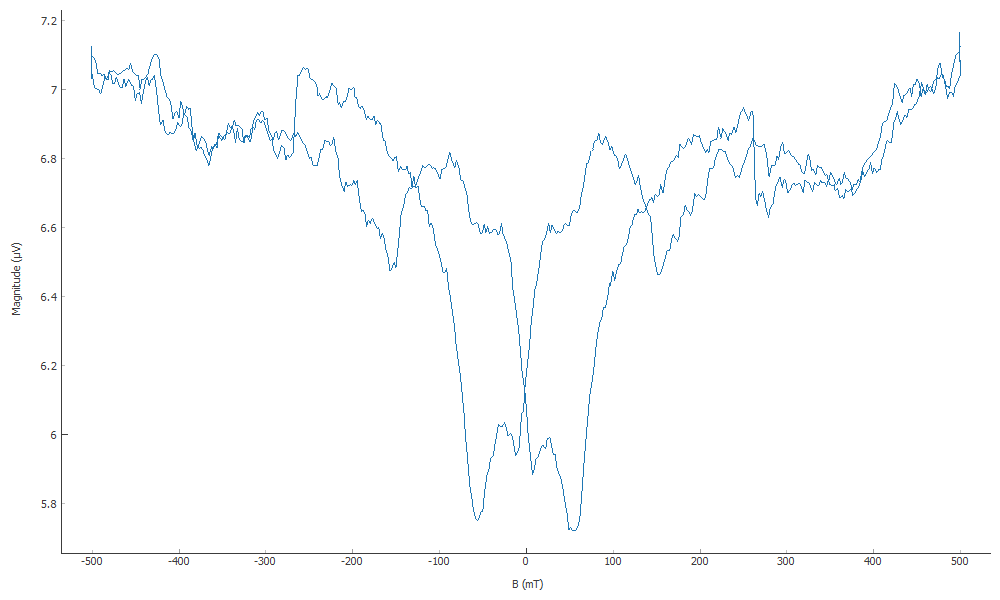

In [172]:
plot87[0]

In [171]:
srframe.volt_p1(-4)

In [173]:
data88, plot88 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=24, DataName='M20_865_10-4_fieldsweepup_-4p0bg_0.5nA', XParam=triton.field, YParam=[lockin865.R])

Started at 2020-02-28 11:12:30
DataSet:
   location = 'data/2020-02-28/#005_M20_865_10-4_fieldsweepup_-4p0bg_0.5nA_11-12-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1440,)
   Measured | time0        | time0        | (1440,)
   Measured | triton_field | field        | (1440,)
   Measured | lockin865_X  | X            | (1440,)
   Measured | lockin865_Y  | Y            | (1440,)
   Measured | lockin865_R  | R            | (1440,)
Finished at 2020-02-28 11:28:38
Keyboard Interrupt


In [174]:
srframe.volt_p1(7.8)

In [176]:
#300ms
data89, plot89 = npd.data_log(3, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=24, DataName='M20_865_10-4_fieldsweepup_7p8bg_0.5nA', XParam=triton.field, YParam=[lockin865.R])

Started at 2020-02-28 11:31:02
DataSet:
   location = 'data/2020-02-28/#007_M20_865_10-4_fieldsweepup_7p8bg_0.5nA_11-31-02'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (480,)
   Measured | time0        | time0        | (480,)
   Measured | triton_field | field        | (480,)
   Measured | lockin865_X  | X            | (480,)
   Measured | lockin865_Y  | Y            | (480,)
   Measured | lockin865_R  | R            | (480,)
Finished at 2020-02-28 11:55:58


In [178]:
srframe.volt_p1(-9)

In [179]:
data90, plot90 = npd.data_log(3, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=600, DataName='M20_865_28-27_fieldsweepdown_-9p7bg_0.2nA', XParam=triton.field, YParam=[lockin865.R])

Started at 2020-02-28 12:04:40
DataSet:
   location = 'data/2020-02-28/#008_M20_865_28-27_fieldsweepdown_-9p7bg_0.2nA_12-04-40'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (12000,)
   Measured | time0        | time0        | (12000,)
   Measured | triton_field | field        | (12000,)
   Measured | lockin865_X  | X            | (12000,)
   Measured | lockin865_Y  | Y            | (12000,)
   Measured | lockin865_R  | R            | (12000,)
Finished at 2020-02-28 12:34:09
Keyboard Interrupt


In [180]:
data91, plot91 = npd.data_log(3, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=600, DataName='M20_865_25-27_fieldsweepdown_-1bg_0.5nA', XParam=triton.field, YParam=[lockin865.X])

Started at 2020-02-28 12:48:37
DataSet:
   location = 'data/2020-02-28/#009_M20_865_25-27_fieldsweepdown_-1bg_0.5nA_12-48-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (12000,)
   Measured | time0        | time0        | (12000,)
   Measured | triton_field | field        | (12000,)
   Measured | lockin865_X  | X            | (12000,)
   Measured | lockin865_Y  | Y            | (12000,)
   Measured | lockin865_R  | R            | (12000,)
Finished at 2020-02-28 12:58:55
Keyboard Interrupt


In [182]:
triton.magnet_sweeprate(0.1)

In [183]:
srframe.volt_p1(-15)

In [184]:
# dispersive band of superconducting device. No hysteresis
data92, plot92 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=150, DataName='M20_865_25-27_fieldsweepdown_-15bg_0.5nA', XParam=triton.field, YParam=[lockin865.X])

Started at 2020-02-28 13:36:13
DataSet:
   location = 'data/2020-02-28/#010_M20_865_25-27_fieldsweepdown_-15bg_0.5nA_13-36-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin865_R  | R            | (4500,)
Finished at 2020-02-28 13:53:11
Keyboard Interrupt


In [185]:
srframe.volt_p1(0)

In [186]:
triton.magnet_sweeprate(0.1)

In [187]:
srframe.volt_p1(7.8)

In [188]:
triton.field(-0.5)
data93, plot93 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=40, DataName='M20_865_25-27_fieldsweepdown_7p8bg_0.5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 550.0 seconds
Started at 2020-02-28 13:57:39
DataSet:
   location = 'data/2020-02-28/#011_M20_865_25-27_fieldsweepdown_7p8bg_0.5nA_13-57-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin865_R  | R            | (1200,)
Finished at 2020-02-28 14:27:45
Keyboard Interrupt


In [201]:
srframe.volt_p1(1.5)

In [202]:
triton.field(-0.4)
data94, plot94 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=40, DataName='M20_865_25-27_fieldsweepdown_1p5bg_0.5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 490.0 seconds
Started at 2020-02-28 14:37:07
DataSet:
   location = 'data/2020-02-28/#012_M20_865_25-27_fieldsweepdown_1p5bg_0.5nA_14-37-06'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin865_R  | R            | (1200,)
Finished at 2020-02-28 14:55:03
Keyboard Interrupt


In [203]:
srframe.volt_p1(-9.7)

In [205]:
triton.field(0.4)
data95, plot95 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=40, DataName='M20_865_25-27_fieldsweepdown_-9p7bg_0.5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 10.0 seconds
Started at 2020-02-28 15:01:47
DataSet:
   location = 'data/2020-02-28/#014_M20_865_25-27_fieldsweepdown_-9p7bg_0.5nA_15-01-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin865_R  | R            | (1200,)
Finished at 2020-02-28 15:18:49
Keyboard Interrupt


In [206]:
srframe.volt_p1(-8.5)

In [207]:
triton.field(0.4)
data96, plot96 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=40, DataName='M20_865_25-27_fieldsweepdown_-8p5bg_0.5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 10.0 seconds
Started at 2020-02-28 15:21:57
DataSet:
   location = 'data/2020-02-28/#015_M20_865_25-27_fieldsweepdown_-8p5bg_0.5nA_15-21-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin865_R  | R            | (1200,)
Finished at 2020-02-28 15:44:40
Keyboard Interrupt


In [208]:
srframe.volt_p1(9.6)

In [209]:
triton.field(0.4)
data97, plot97 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, lockin830.X, lockin830.Y, lockin830.R, minutes=40, DataName='M20_865_25-27_830_28-27_fieldsweepdown_9p6bg_0.5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 10.0 seconds
Started at 2020-02-28 15:51:24
DataSet:
   location = 'data/2020-02-28/#016_M20_865_25-27_830_28-27_fieldsweepdown_9p6bg_0.5nA_15-51-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin865_R  | R            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
   Measured | lockin830_R  | R            | (1200,)
Finished at 2020-02-28 16:09:20
Keyboard Interrupt


In [210]:
srframe.volt_p1(-9.7)

In [211]:
triton.field(0.4)
data98, plot98 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, lockin830.X, lockin830.Y, lockin830.R, minutes=40, DataName='M20_865_25-27_830_28-27_fieldsweepdown_-9p7bg_0.5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 10.006 seconds
Started at 2020-02-28 16:10:57
DataSet:
   location = 'data/2020-02-28/#017_M20_865_25-27_830_28-27_fieldsweepdown_-9p7bg_0.5nA_16-10-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin865_R  | R            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
   Measured | lockin830_R  | R            | (1200,)
Finished at 2020-02-28 16:27:55
Keyboard Interrupt


In [214]:
srframe.volt_p1(-2)

In [215]:
triton.field(0.4)
data99, plot99 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, lockin830.X, lockin830.Y, lockin830.R, minutes=40, DataName='M20_865_25-27_830_28-27_fieldsweepdown_-2p0bg_0.5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 10.006 seconds
Started at 2020-02-28 16:31:51
DataSet:
   location = 'data/2020-02-28/#018_M20_865_25-27_830_28-27_fieldsweepdown_-2p0bg_0.5nA_16-31-50'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin865_R  | R            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
   Measured | lockin830_R  | R            | (1200,)
Finished at 2020-02-28 16:49:31
Keyboard Interrupt


In [217]:
srframe.volt_p1(2.9)

In [218]:
triton.field(0.4)
data100, plot100 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, lockin830.X, lockin830.Y, lockin830.R, minutes=40, DataName='M20_865_25-27_830_28-27_fieldsweepdown_2p9bg_0.5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 10.006 seconds
Started at 2020-02-28 16:53:31
DataSet:
   location = 'data/2020-02-28/#019_M20_865_25-27_830_28-27_fieldsweepdown_2p9bg_0.5nA_16-53-30'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin865_R  | R            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
   Measured | lockin830_R  | R            | (1200,)
Finished at 2020-02-28 17:11:28
Keyboard Interrupt


In [220]:
srframe.volt_p1(8.5)

In [221]:
triton.field(0.4)
data101, plot101 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, lockin830.X, lockin830.Y, lockin830.R, minutes=40, DataName='M20_865_25-27_830_28-27_fieldsweepdown_8p5bg_0.5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 10.006 seconds
Started at 2020-02-28 17:14:45
DataSet:
   location = 'data/2020-02-28/#020_M20_865_25-27_830_28-27_fieldsweepdown_8p5bg_0.5nA_17-14-44'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin865_R  | R            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
   Measured | lockin830_R  | R            | (1200,)
Finished at 2020-02-28 17:33:29
Keyboard Interrupt


In [223]:
srframe.volt_p1(-9.7)

In [224]:
triton.field(0.4)
data102, plot102 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, lockin830.X, lockin830.Y, lockin830.R, minutes=40, DataName='M20_865_25-27_830_28-27_fieldsweepdown_-9p7bg_0.5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 10.006 seconds
Started at 2020-02-28 17:41:54
DataSet:
   location = 'data/2020-02-28/#021_M20_865_25-27_830_28-27_fieldsweepdown_-9p7bg_0.5nA_17-41-53'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin865_R  | R            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
   Measured | lockin830_R  | R            | (1200,)
Finished at 2020-02-28 17:58:42
Keyboard Interrupt


In [225]:
lockin865.amplitude(0)

In [226]:
srframe.volt_p1(0)

In [227]:
#go to W3 a little

In [228]:
triton.field(0.4)
data103, plot103 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, lockin830.X, lockin830.Y, lockin830.R, minutes=40, DataName='W3_865_47-48_830_48-24_fieldsweepdown_3p3bg_0.5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 10.006 seconds
Started at 2020-02-28 18:13:13
DataSet:
   location = 'data/2020-02-28/#022_W3_865_47-48_830_48-24_fieldsweepdown_3p3bg_0.5nA_18-13-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin865_R  | R            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
   Measured | lockin830_R  | R            | (1200,)
Finished at 2020-02-28 18:30:53
Keyboard Interrupt


In [229]:
triton.field(0.4)
data104, plot104 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, lockin830.X, lockin830.Y, lockin830.R, minutes=40, DataName='W3_865_47-48_830_48-24_fieldsweepdown_3p8bg_0.5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 10.0 seconds
Started at 2020-02-28 18:35:27
DataSet:
   location = 'data/2020-02-28/#023_W3_865_47-48_830_48-24_fieldsweepdown_3p8bg_0.5nA_18-35-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin865_R  | R            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
   Measured | lockin830_R  | R            | (1200,)
Finished at 2020-02-28 18:52:06
Keyboard Interrupt


# W5 for BKT

In [260]:
srframe.volt_p1()

3.8

In [261]:
srframe.volt_p1(3.4)

In [262]:
lockin865.amplitude()

0.04999999702

In [263]:
lockin865.time_constant()

0.1

In [264]:
lockin865.filter_slope()

24

In [267]:
# base temp, cables unplugged at first
srframe.volt_p5(-11)
time.sleep(20)
offvals = np.linspace(-11, 11, 441)  # -100 to 100 nA, 1 nA excitation
data105, plot105 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_BTKbasetemp_865_40-39_830_39-38_1nA_3p4vbg')

Started at 2020-03-02 16:01:38
DataSet:
   location = 'data/2020-03-02/#002_W5_BTKbasetemp_865_40-39_830_39-38_1nA_3p4vbg_16-01-37'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (441,)
   Measured | lockin865_X         | X            | (441,)
   Measured | lockin865_Y         | Y            | (441,)
   Measured | lockin830_X         | X            | (441,)
   Measured | lockin830_Y         | Y            | (441,)
Finished at 2020-03-02 16:11:47


In [268]:
srframe.volt_p5(0)

In [269]:
triton.pid_setpoint(0.05)

In [270]:
triton.pid_mode(1)

In [271]:
triton.pid_range(3.16)

In [272]:
triton.pid_range(10)

In [276]:
# now temp cables plugged in. I just realized that the limit for the voltage sum amplifier is 10 V, so +/- 11 may not matter.
srframe.volt_p5(-11)
time.sleep(20)
offvals = np.linspace(-11, 11, 441)  # -110 to 110 nA, 1 nA excitation
Tvals = np.linspace(0.05, 1, 20)
data106, plot106 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_BKT50mKto1K_865_40-39_830_39-38_1nA_3p4vbg')

Started at 2020-03-02 17:40:15
DataSet:
   location = 'data/2020-03-02/#003_W5_BKT50mKto1K_865_40-39_830_39-38_1nA_3p4vbg_17-40-13'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (20, 441)
   Measured | lockin865_X             | X            | (20, 441)
   Measured | lockin865_Y             | Y            | (20, 441)
   Measured | lockin830_X             | X            | (20, 441)
   Measured | lockin830_Y             | Y            | (20, 441)
Finished at 2020-03-02 17:57:51
Keyboard Interrupt


In [279]:
srframe.volt_p5(0)

In [281]:
lockin865.amplitude(10e-3)

We want to make sure that we get to the convergence point for the I-V curves, so we placed a 10 MOhm resistor (instead of 100 MOhm) on the output of the sum amplifier. Thus, we use 10 mV for excitation to get 1 nA and 1V from srframe.volt_p5 corresponds to 100 nA.

Start over at base temp

In [285]:
# base temp, cables unplugged at first
srframe.volt_p5(-1.5)
time.sleep(20)
offvals = np.linspace(-1.5, 1.5, 601)  #-150 to 150 nA, 1 nA excitation
data107, plot107 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_BTKbasetemp_865_40-39_830_39-38_1nA_3p4vbg')

Started at 2020-03-02 18:51:51
DataSet:
   location = 'data/2020-03-02/#004_W5_BTKbasetemp_865_40-39_830_39-38_1nA_3p4vbg_18-51-50'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (601,)
   Measured | lockin865_X         | X            | (601,)
   Measured | lockin865_Y         | Y            | (601,)
   Measured | lockin830_X         | X            | (601,)
   Measured | lockin830_Y         | Y            | (601,)
Finished at 2020-03-02 19:05:43


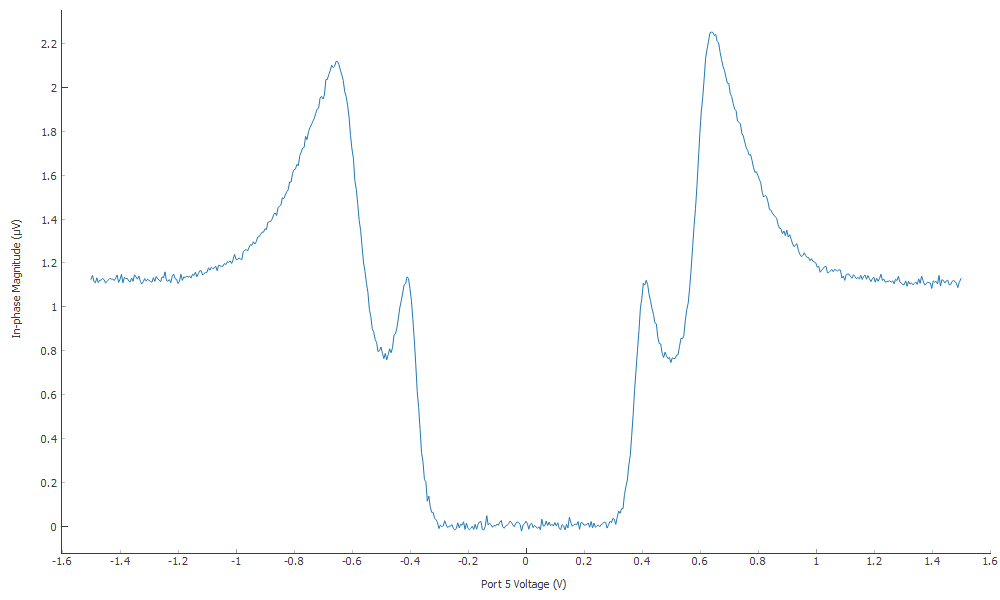

In [465]:
plot107[0]

In [289]:
curr[0]

-1.5000000000000002e-07

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


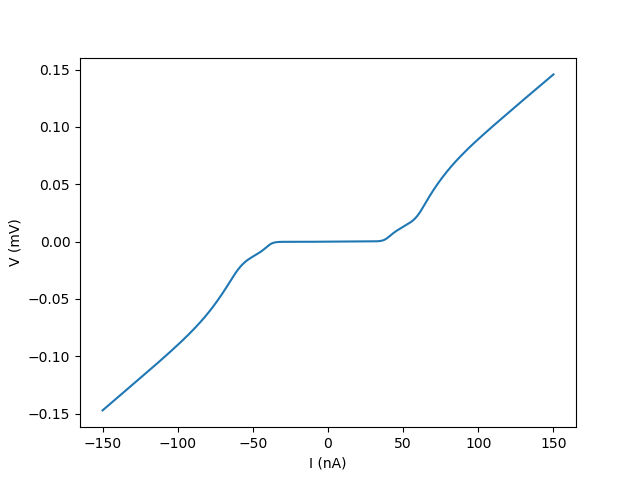

Text(0, 0.5, 'V (mV)')

In [447]:
plt.figure()
curr = data107.srframe_volt_p5_set[:]*100*1e-9
plt.plot(curr/1e-9, npd.iv_from_dvdi(data107.lockin865_X[:]/1e-9, curr)*1000)
plt.xlabel('I (nA)')
plt.ylabel('V (mV)')

In [293]:
triton.pid_setpoint(0.05)

In [294]:
triton.pid_range(1)

In [295]:
triton.pid_mode(1)

In [297]:
triton.pid_range(3.16)

In [298]:
triton.pid_range(10)

In [299]:
# now temp cables plugged in
srframe.volt_p5(-1.5)
time.sleep(20)
offvals = np.linspace(-1.5, 1.5, 601)  #-150 to 150 nA, 1 nA excitation
Tvals = np.linspace(0.05, 1, 20)
data108, plot108 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_BKT50mKto1K_865_40-39_830_39-38_1nA_3p4vbg')

Started at 2020-03-02 19:12:15
DataSet:
   location = 'data/2020-03-02/#005_W5_BKT50mKto1K_865_40-39_830_39-38_1nA_3p4vbg_19-12-12'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (20, 601)
   Measured | lockin865_X             | X            | (20, 601)
   Measured | lockin865_Y             | Y            | (20, 601)
   Measured | lockin830_X             | X            | (20, 601)
   Measured | lockin830_Y             | Y            | (20, 601)
Finished at 2020-03-03 00:56:16


In [300]:
srframe.volt_p5(0)

In [301]:
srframe.volt_p1(0)

In [302]:
triton.MC_temp()

0.0265643

In [303]:
triton.pid_mode()

1

In [304]:
triton.pid_setpoint()

0.95

In [306]:
triton.pid_range(31.6)

In [307]:
srframe.volt_p1(3.4)

In [308]:

srframe.volt_p5(-1.5)
time.sleep(20)
offvals = np.linspace(-1.5, 1.5, 601)  #-150 to 150 nA, 1 nA excitation
Tvals = np.linspace(1.0, 1.4, 5)
data109, plot109 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_BKT1Kto1p4K_865_40-39_830_39-38_1nA_3p4vbg')

Started at 2020-03-03 01:20:31
DataSet:
   location = 'data/2020-03-03/#001_W5_BKT1Kto1p4K_865_40-39_830_39-38_1nA_3p4vbg_01-20-28'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (5,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (5, 601)
   Measured | lockin865_X             | X            | (5, 601)
   Measured | lockin865_Y             | Y            | (5, 601)
   Measured | lockin830_X             | X            | (5, 601)
   Measured | lockin830_Y             | Y            | (5, 601)
Finished at 2020-03-03 02:46:19


In [309]:
triton.pid_range(100)
time.sleep(10)

In [310]:

srframe.volt_p5(-1.5)
time.sleep(20)
offvals = np.linspace(-1.5, 1.5, 601)  #-150 to 150 nA, 1 nA excitation
Tvals = np.linspace(1.5, 2.0, 6)
data110, plot110 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.2, Param2_SetBetween=0, DataName='W5_BKT1p5Kto2K_865_40-39_830_39-38_1nA_3p4vbg')

Started at 2020-03-03 02:46:55
DataSet:
   location = 'data/2020-03-03/#002_W5_BKT1p5Kto2K_865_40-39_830_39-38_1nA_3p4vbg_02-46-52'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (6,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (6, 601)
   Measured | lockin865_X             | X            | (6, 601)
   Measured | lockin865_Y             | Y            | (6, 601)
   Measured | lockin830_X             | X            | (6, 601)
   Measured | lockin830_Y             | Y            | (6, 601)
Finished at 2020-03-03 04:30:01


In [311]:
srframe.volt_p1(0)
srframe.volt_p5(0)
triton.pid_setpoint(0.05)
time.sleep(5)
triton.pid_mode(0)

In [313]:
# now try to get curve with different noise level, resistance 100Mohm

In [315]:
srframe.volt_p1(2)# 1nA, sensitivity 100uV, 100ms, sensor disconnected
time.sleep(15)
gvals = np.linspace(2, 5, 151)
data111, plot111 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_830_40-39_865_39-38_baseT_1nA_gatesweep_-0p8mT_sensitivity_100uV')
srframe.volt_p1(2)

Started at 2020-03-03 10:08:24
DataSet:
   location = 'data/2020-03-03/#004_W5_830_40-39_865_39-38_baseT_1nA_gatesweep_-0p8mT_sensitivity_100uV_10-08-22'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
Finished at 2020-03-03 10:11:38


In [320]:
srframe.volt_p1(2)# 1nA, sensitivity 100uV, 300ms, sensor disconnected
time.sleep(15)
gvals = np.linspace(2, 5, 151)
data112, plot112 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_830_40-39_865_39-38_baseT_1nA_gatesweep_-0p8mT_sensitivity_100uV_300ms')
srframe.volt_p1(2)

Started at 2020-03-03 10:16:04
DataSet:
   location = 'data/2020-03-03/#005_W5_830_40-39_865_39-38_baseT_1nA_gatesweep_-0p8mT_sensitivity_100uV_300ms_10-16-02'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
Finished at 2020-03-03 10:20:17


In [323]:
srframe.volt_p1(2)# 2nA, sensitivity 100uV, 300ms, sensor disconnected
time.sleep(15)
gvals = np.linspace(2, 5, 151)
data113, plot113 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_830_40-39_865_39-38_baseT_2nA_gatesweep_-0p8mT_sensitivity_100uV_300ms')
srframe.volt_p1(2)

Started at 2020-03-03 10:24:12
DataSet:
   location = 'data/2020-03-03/#006_W5_830_40-39_865_39-38_baseT_2nA_gatesweep_-0p8mT_sensitivity_100uV_300ms_10-24-10'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
Finished at 2020-03-03 10:28:26


In [329]:
srframe.volt_p1(2)# 0.5nA, sensitivity 100uV, 300ms, sensor disconnected
time.sleep(15)
gvals = np.linspace(2, 5, 151)
data114, plot114 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_830_40-39_865_39-38_baseT_0p5nA_gatesweep_-0p8mT_sensitivity_100uV_300ms')
srframe.volt_p1(2)

Started at 2020-03-03 10:32:14
DataSet:
   location = 'data/2020-03-03/#007_W5_830_40-39_865_39-38_baseT_0p5nA_gatesweep_-0p8mT_sensitivity_100uV_300ms_10-32-12'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
Finished at 2020-03-03 10:36:27


In [332]:
srframe.volt_p1(2)# 0.5nA, sensitivity 100uV, 300ms, sensor disconnected
time.sleep(15)
gvals = np.linspace(2, 5, 151)
data115, plot115 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_830_40-39_865_39-38_baseT_0p5nA_gatesweep_-0p8mT_sensitivity_100uV_300ms_second')
srframe.volt_p1(2)

Started at 2020-03-03 10:38:16
DataSet:
   location = 'data/2020-03-03/#008_W5_830_40-39_865_39-38_baseT_0p5nA_gatesweep_-0p8mT_sensitivity_100uV_300ms_second_10-38-14'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
Finished at 2020-03-03 10:42:30


In [335]:
srframe.volt_p1(2)# 0.5nA, sensitivity 100uV, 300ms, sensor disconnected
time.sleep(15)
gvals = np.linspace(2, 5, 151)
data116, plot116 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_830_40-39_865_39-38_baseT_0p5nA_gatesweep_-0p8mT_sensitivity_100uV_300ms_third')
srframe.volt_p1(2)

Started at 2020-03-03 10:43:10
DataSet:
   location = 'data/2020-03-03/#009_W5_830_40-39_865_39-38_baseT_0p5nA_gatesweep_-0p8mT_sensitivity_100uV_300ms_third_10-43-08'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
Finished at 2020-03-03 10:47:23


In [346]:
srframe.volt_p1(2)# 0.5nA, sensitivity 20uV, 300ms, sensor disconnected
time.sleep(15)
gvals = np.linspace(2, 5, 151)
data117, plot117 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_830_40-39_865_39-38_baseT_0p5nA_gatesweep_-0p8mT_sensitivity_20uV_300ms')
srframe.volt_p1(2)

Started at 2020-03-03 11:02:20
DataSet:
   location = 'data/2020-03-03/#010_W5_830_40-39_865_39-38_baseT_0p5nA_gatesweep_-0p8mT_sensitivity_20uV_300ms_11-02-18'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
Finished at 2020-03-03 11:06:33


<IPython.core.display.Javascript object>


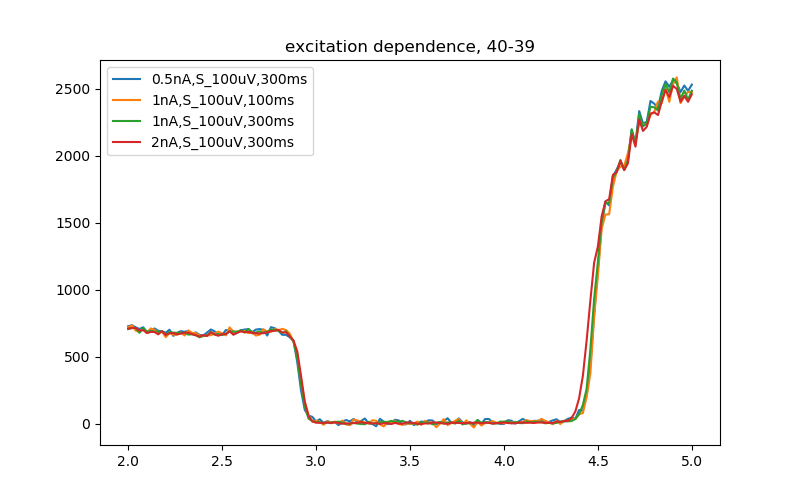

In [439]:
plt.figure(figsize=(8, 5))
plt.plot(data117.srframe_volt_p1_set[:], data114.lockin865_X[:]/0.5e-9, label='0.5nA,S_100uV,300ms')
plt.plot(data117.srframe_volt_p1_set[:], data111.lockin865_X[:]/1e-9, label='1nA,S_100uV,100ms')
plt.plot(data117.srframe_volt_p1_set[:], data112.lockin865_X[:]/1e-9, label='1nA,S_100uV,300ms')
plt.plot(data117.srframe_volt_p1_set[:], data113.lockin865_X[:]/2e-9, label='2nA,S_100uV,300ms')
plt.title('excitation dependence, 40-39')
plt.legend()

<IPython.core.display.Javascript object>


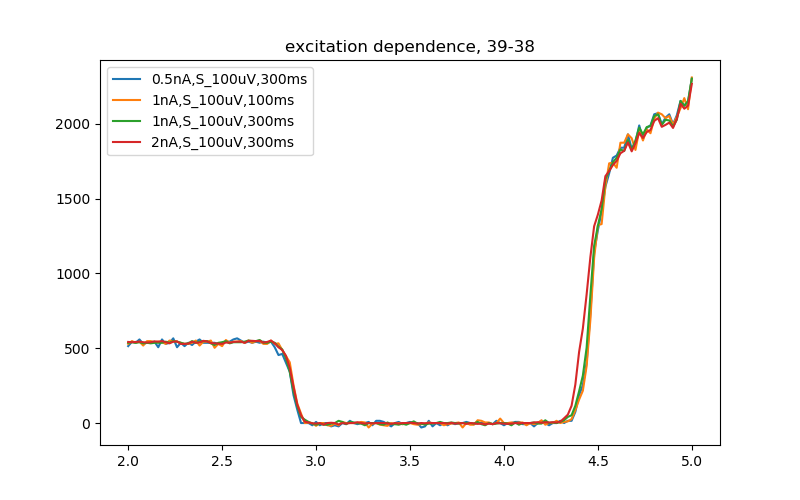

In [440]:
plt.figure(figsize=(8, 5))
plt.plot(data117.srframe_volt_p1_set[:], data114.lockin830_X[:]/0.5e-9, label='0.5nA,S_100uV,300ms')
plt.plot(data117.srframe_volt_p1_set[:], data111.lockin830_X[:]/1e-9, label='1nA,S_100uV,100ms')
plt.plot(data117.srframe_volt_p1_set[:], data112.lockin830_X[:]/1e-9, label='1nA,S_100uV,300ms')
plt.plot(data117.srframe_volt_p1_set[:], data113.lockin830_X[:]/2e-9, label='2nA,S_100uV,300ms')
plt.title('excitation dependence, 39-38')
plt.legend()

<IPython.core.display.Javascript object>


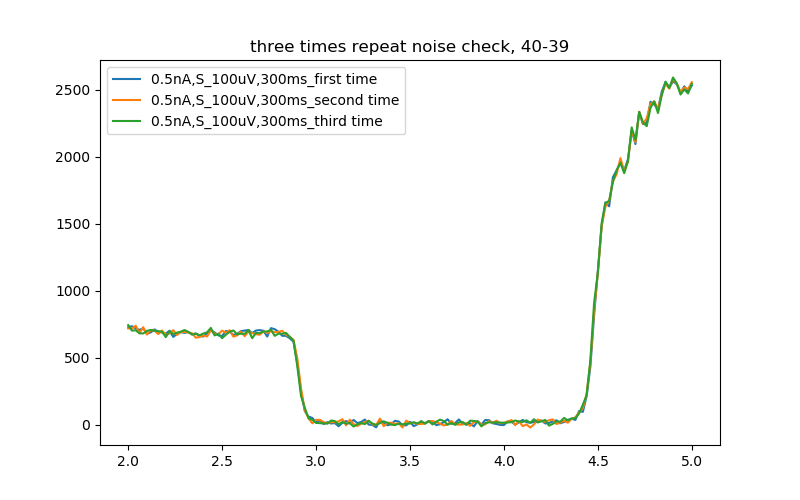

In [444]:
plt.figure(figsize=(8, 5))
plt.plot(data117.srframe_volt_p1_set[:], data114.lockin865_X[:]/0.5e-9, label='0.5nA,S_100uV,300ms_first time')
plt.plot(data117.srframe_volt_p1_set[:], data115.lockin865_X[:]/0.5e-9, label='0.5nA,S_100uV,300ms_second time')
plt.plot(data117.srframe_volt_p1_set[:], data116.lockin865_X[:]/0.5e-9, label='0.5nA,S_100uV,300ms_third time')
plt.title('three times repeat noise check, 40-39')
plt.legend()

<IPython.core.display.Javascript object>


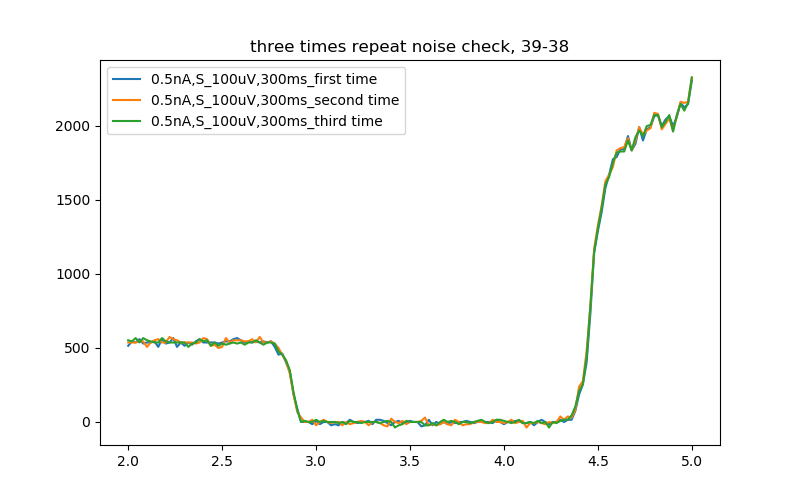

In [443]:
plt.figure(figsize=(8, 5))
plt.plot(data117.srframe_volt_p1_set[:], data114.lockin830_X[:]/0.5e-9, label='0.5nA,S_100uV,300ms_first time')
plt.plot(data117.srframe_volt_p1_set[:], data115.lockin830_X[:]/0.5e-9, label='0.5nA,S_100uV,300ms_second time')
plt.plot(data117.srframe_volt_p1_set[:], data116.lockin830_X[:]/0.5e-9, label='0.5nA,S_100uV,300ms_third time')
plt.title('three times repeat noise check, 39-38')
plt.legend()

<IPython.core.display.Javascript object>


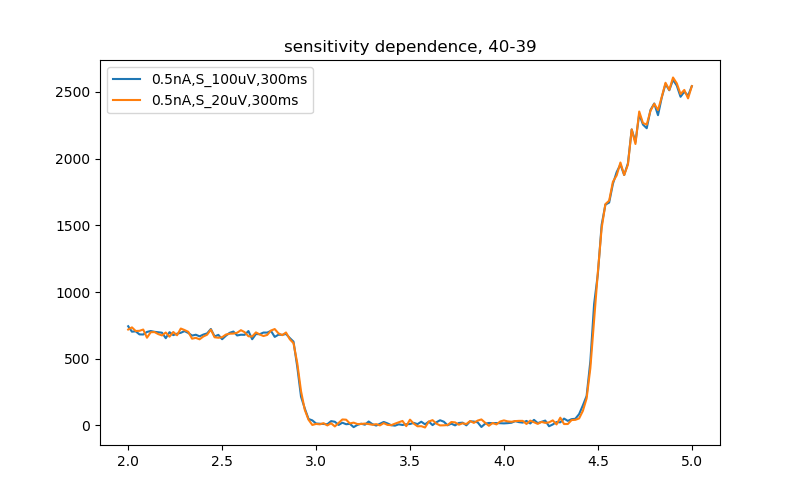

In [441]:
plt.figure(figsize=(8, 5))
plt.plot(data117.srframe_volt_p1_set[:], data116.lockin865_X[:]/0.5e-9, label='0.5nA,S_100uV,300ms')
plt.plot(data117.srframe_volt_p1_set[:], data117.lockin865_X[:]/0.5e-9, label='0.5nA,S_20uV,300ms')
plt.title('sensitivity dependence, 40-39')
plt.legend()

<IPython.core.display.Javascript object>


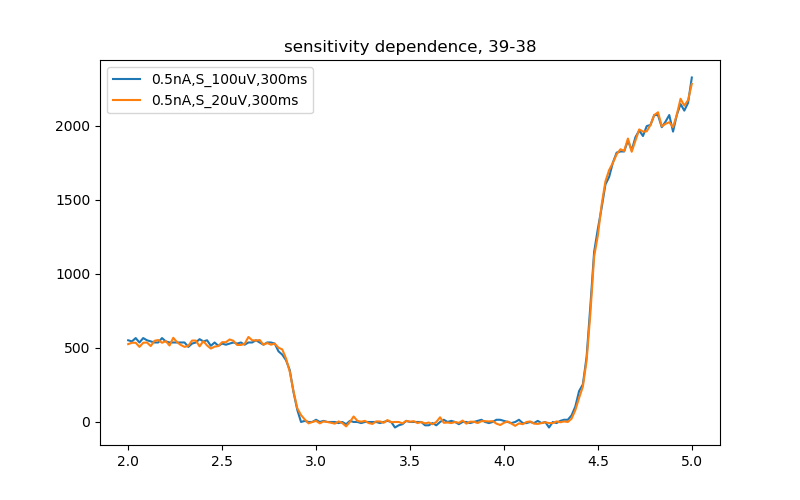

In [442]:
plt.figure(figsize=(8, 5))
plt.plot(data117.srframe_volt_p1_set[:], data116.lockin830_X[:]/0.5e-9, label='0.5nA,S_100uV,300ms')
plt.plot(data117.srframe_volt_p1_set[:], data117.lockin830_X[:]/0.5e-9, label='0.5nA,S_20uV,300ms')
plt.title('sensitivity dependence, 39-38')
plt.legend()

In [349]:
srframe.volt_p1(0)

# M26 hysteresis measurements

Use 9-5 as source/drain. Lockin830 seemed to induce a large offset. Now using pre-amp with lockin865, lockin830 totally off and unplugged

In [352]:
srframe.volt_p1()

7.8

In [353]:
bvals = np.concatenate((np.linspace(-250e-3, 250e-3, 101), np.linspace(250e-3, -250e-3, 101)))

data118, plot118 = npd.single_param_sweep(triton.field_set_stable, bvals, 10, lockin865.X, lockin865.Y, DataName='M26_hysteresisVbg7p8_865_10-3_0p2nA_1000xgain')

Started at 2020-03-03 12:15:52
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.988 seconds for the field sweep, plus the time required for operating the switch...
Please wait 13.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 13.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 13.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 13.0 seconds for the field sweep, plus the time required for operating t

In [355]:
bvals = np.concatenate((np.linspace(-200e-3, 200e-3, 81), np.linspace(200e-3, -200e-3, 81)))

data119, plot119 = npd.single_param_sweep(triton.field_set_stable, bvals, 11, lockin865.X, lockin865.Y, lockin865.R, DataName='M26_hysteresisVbg7p9_865_3-6_4nA_1000xgain')

Started at 2020-03-03 15:15:11
Please wait 34.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.998000000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.992 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.998000000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.004 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.998000000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.998000000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.998000000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.998000000000001 seconds for the field sweep, plus the time required for operating the switch...
Please w

In [356]:
triton.field(0.3)#1000gain 0.3nA
data120, plot120 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin865.R, minutes=40, DataName='M20_865_25-27_fieldsweepdown_0p5bg_0.3nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 10.0 seconds
Started at 2020-03-03 16:46:42
DataSet:
   location = 'data/2020-03-03/#014_M20_865_25-27_fieldsweepdown_0p5bg_0.3nA_16-46-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin865_R  | R            | (1200,)
Finished at 2020-03-03 16:53:54
Keyboard Interrupt


In [357]:
srframe.volt_p1()

0.0

In [358]:
srframe.volt_p1(7.8)

In [359]:
lockin865.frequency()

3.7571

In [360]:
srframe.volt_p1(0)

In [361]:
# quick gate voltage sweep check with 0.3 nA excitation, with the same configuration as we have for the hysteresis check

gvals = np.linspace(0, 10, 101)
data121, plot121 = npd.single_param_sweep(srframe.volt_p1, gvals, 10, lockin865.X, lockin865.Y, DataName='M26_gatsweep_865_10-3_0p3nA_1000xgain')

Started at 2020-03-03 18:16:15
DataSet:
   location = 'data/2020-03-03/#015_M26_gatsweep_865_10-3_0p3nA_1000xgain_18-16-14'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (101,)
   Measured | lockin865_X         | X            | (101,)
   Measured | lockin865_Y         | Y            | (101,)
Finished at 2020-03-03 18:33:33


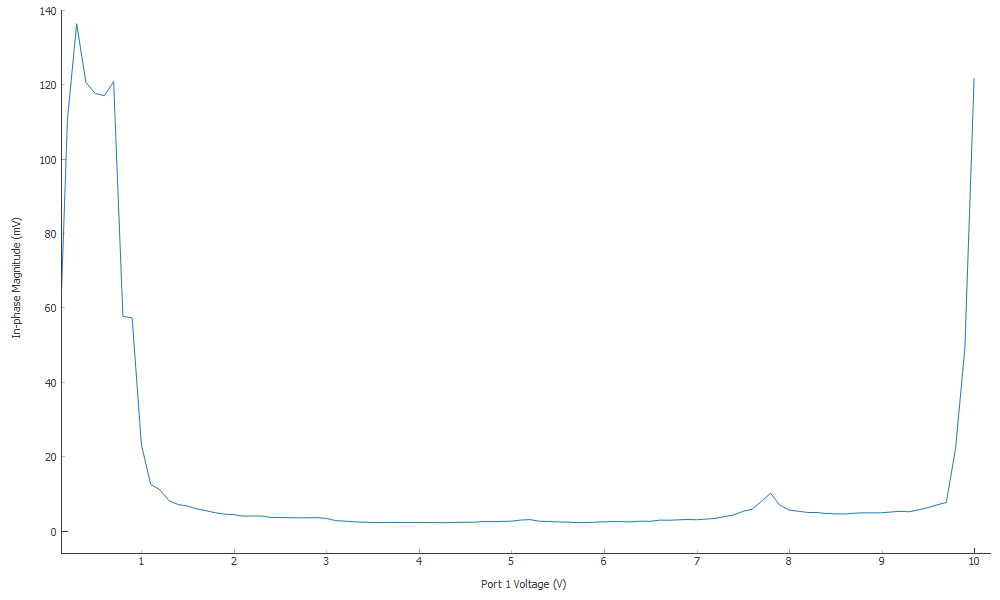

In [362]:
plot121[0]

In [363]:
srframe.volt_p1(7.8)
triton.field_set_stable(-1) # train the magnet by going over the expected value this time
triton.field_set_stable(-0.5)

Please wait 410.00800000000004 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.99200000000002 seconds for the field sweep, plus the time required for operating the switch...


In [364]:
bvals = np.concatenate((np.linspace(-500e-3, 500e-3, 201), np.linspace(500e-3, -500e-3, 201)))

data122, plot122 = npd.single_param_sweep(triton.field_set_stable, bvals, 10, lockin865.X, lockin865.Y, DataName='M26_hysteresisVbg7p8_865_10-3_0p3nA_1000xgain')

Started at 2020-03-03 18:45:41
Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.998000000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.998000000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.998000000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.004 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.998000000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.998000000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.004 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.992 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.004 s

In [365]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data123, plot123 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-03 21:25:49
DataSet:
   location = 'data/2020-03-03/#017_M26_hysteresisupVbg7p8_865_10-3_0p3nA_1000xgain_21-25-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-03 21:36:06


In [366]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data124, plot124 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-03 21:36:12
DataSet:
   location = 'data/2020-03-03/#018_M26_hysteresisdownVbg7p8_865_10-3_0p3nA_1000xgain_21-36-11'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-03 21:46:29


<IPython.core.display.Javascript object>


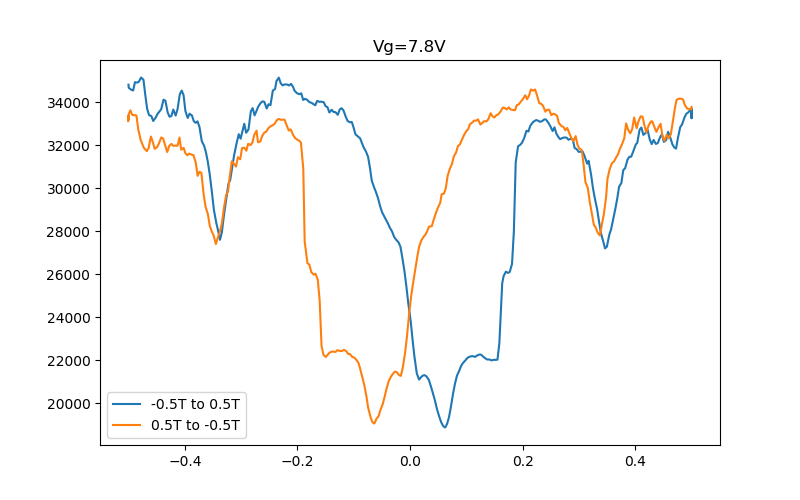

In [389]:
plt.figure(figsize=(8, 5))
plt.plot(data123.triton_field[:], data123.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data124.triton_field[:], data124.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg=7.8V')
plt.legend()

In [367]:
#Try the same on a few gate points. 7.75, 7.7, 7.65, 7.65, 7.85, 7.9, 7.95
srframe.volt_p1(7.75)

In [368]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data125, plot125 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p75_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.976 seconds
Started at 2020-03-04 01:28:45
DataSet:
   location = 'data/2020-03-04/#001_M26_hysteresisupVbg7p75_865_10-3_0p3nA_1000xgain_01-28-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 01:39:02


In [369]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data126, plot126 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p75_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-04 01:39:09
DataSet:
   location = 'data/2020-03-04/#002_M26_hysteresisdownVbg7p75_865_10-3_0p3nA_1000xgain_01-39-09'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 01:49:31


<IPython.core.display.Javascript object>


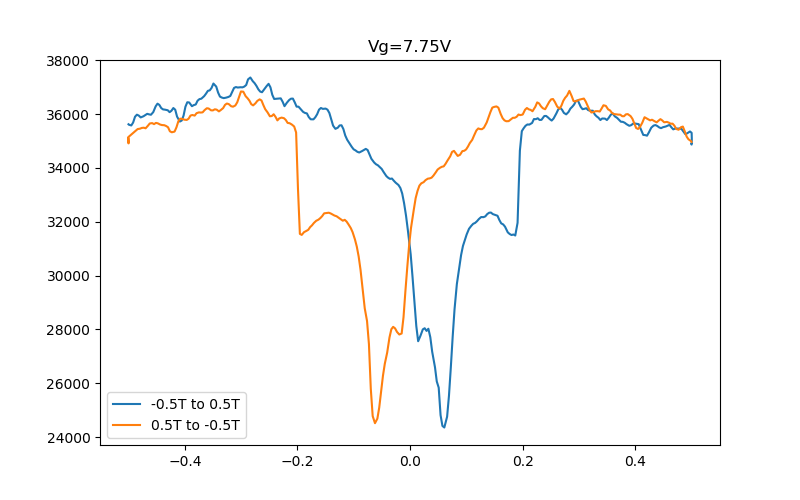

In [390]:
plt.figure(figsize=(8, 5))
plt.plot(data125.triton_field[:], data125.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data126.triton_field[:], data126.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg=7.75V')
plt.legend()

In [370]:
#Try the same on a few gate points.
srframe.volt_p1(7.7)

In [371]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data127, plot127 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p7_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 01:49:38
DataSet:
   location = 'data/2020-03-04/#003_M26_hysteresisupVbg7p7_865_10-3_0p3nA_1000xgain_01-49-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 01:59:55


In [372]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data128, plot128 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p7_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 02:00:01
DataSet:
   location = 'data/2020-03-04/#004_M26_hysteresisdownVbg7p7_865_10-3_0p3nA_1000xgain_02-00-01'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 02:10:18


<IPython.core.display.Javascript object>


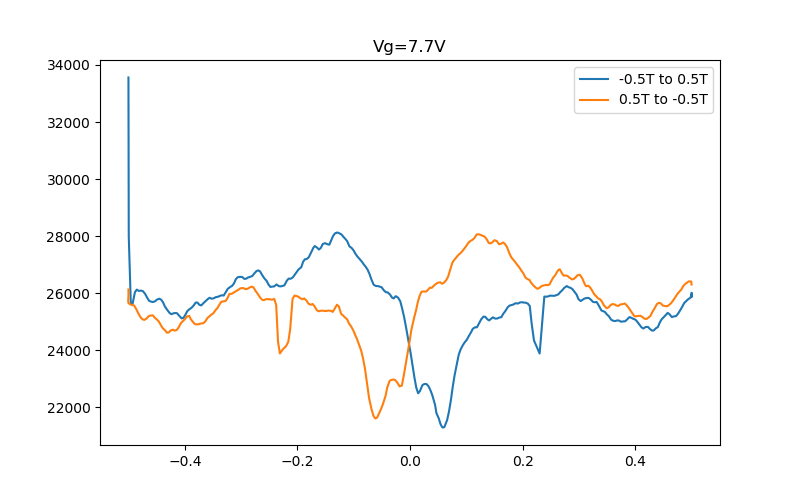

In [392]:
plt.figure(figsize=(8, 5))
plt.plot(data127.triton_field[:], data127.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data128.triton_field[:], data128.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg=7.7V')
plt.legend()

In [373]:
#Try the same on a few gate points.
srframe.volt_p1(7.65)

In [374]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data129, plot129 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p65_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0179999999999 seconds
Started at 2020-03-04 02:10:24
DataSet:
   location = 'data/2020-03-04/#005_M26_hysteresisupVbg7p65_865_10-3_0p3nA_1000xgain_02-10-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 02:20:41


In [375]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data130, plot130 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p65_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0179999999999 seconds
Started at 2020-03-04 02:20:48
DataSet:
   location = 'data/2020-03-04/#006_M26_hysteresisdownVbg7p65_865_10-3_0p3nA_1000xgain_02-20-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 02:31:04


<IPython.core.display.Javascript object>


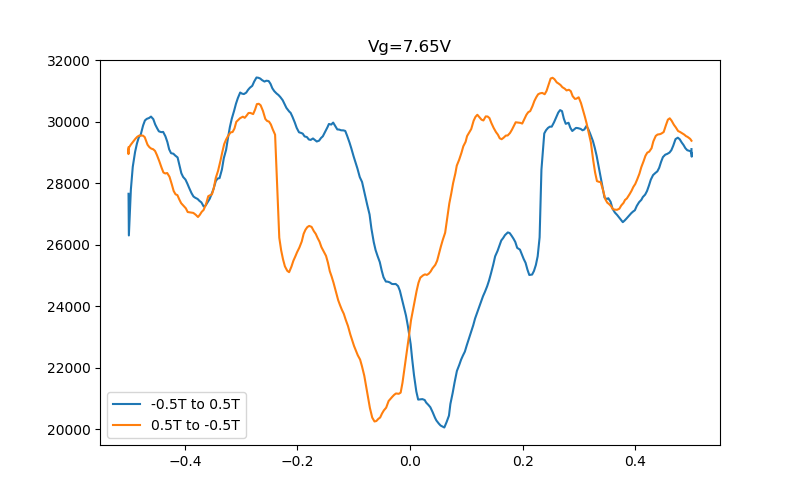

In [393]:
plt.figure(figsize=(8, 5))
plt.plot(data129.triton_field[:], data129.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data130.triton_field[:], data130.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg=7.65V')
plt.legend()

In [376]:
#Try the same on a few gate points. 
srframe.volt_p1(7.6)

In [377]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data131, plot131 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p6_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-04 02:31:10
DataSet:
   location = 'data/2020-03-04/#007_M26_hysteresisupVbg7p6_865_10-3_0p3nA_1000xgain_02-31-09'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 02:41:27


In [378]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data132, plot132 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p6_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 02:41:33
DataSet:
   location = 'data/2020-03-04/#008_M26_hysteresisdownVbg7p6_865_10-3_0p3nA_1000xgain_02-41-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 02:51:49


<IPython.core.display.Javascript object>


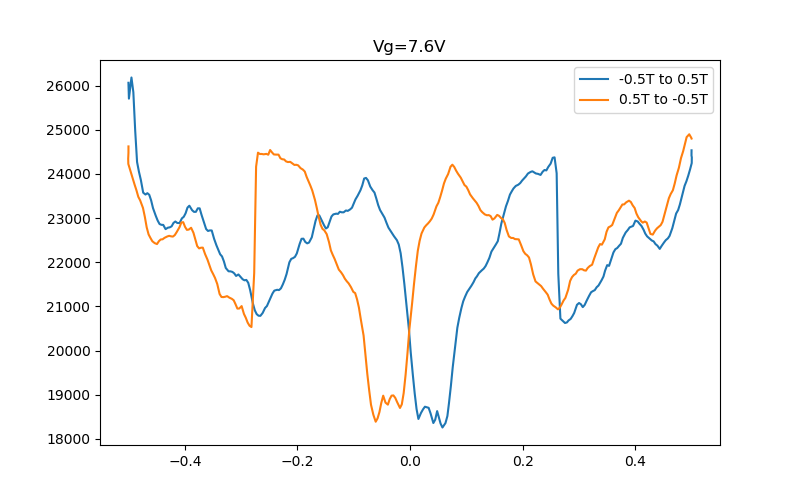

In [394]:
plt.figure(figsize=(8, 5))
plt.plot(data131.triton_field[:], data131.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data132.triton_field[:], data132.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg=7.6V')
plt.legend()

In [379]:
#Try the same on a few gate points.
srframe.volt_p1(7.85)

In [380]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data133, plot133 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 02:51:55
DataSet:
   location = 'data/2020-03-04/#009_M26_hysteresisupVbg7p85_865_10-3_0p3nA_1000xgain_02-51-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 03:02:12


In [381]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data134, plot134 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 03:02:18
DataSet:
   location = 'data/2020-03-04/#010_M26_hysteresisdownVbg7p85_865_10-3_0p3nA_1000xgain_03-02-17'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 03:12:34


<IPython.core.display.Javascript object>


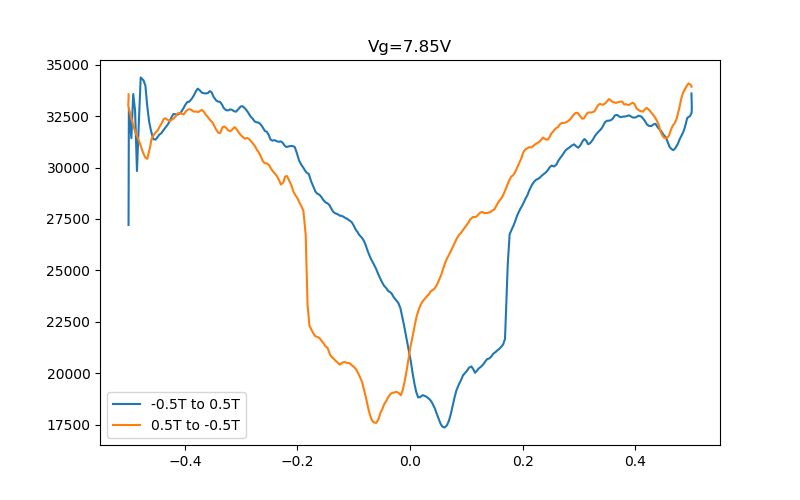

In [395]:
plt.figure(figsize=(8, 5))
plt.plot(data133.triton_field[:], data133.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data134.triton_field[:], data134.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg=7.85V')
plt.legend()

In [382]:
#Try the same on a few gate points.
srframe.volt_p1(7.9)

In [383]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data135, plot135 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p9_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-04 03:12:40
DataSet:
   location = 'data/2020-03-04/#011_M26_hysteresisupVbg7p9_865_10-3_0p3nA_1000xgain_03-12-39'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 03:22:57


In [384]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data136, plot136 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p9_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-04 03:23:04
DataSet:
   location = 'data/2020-03-04/#012_M26_hysteresisdownVbg7p9_865_10-3_0p3nA_1000xgain_03-23-03'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 03:33:21


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


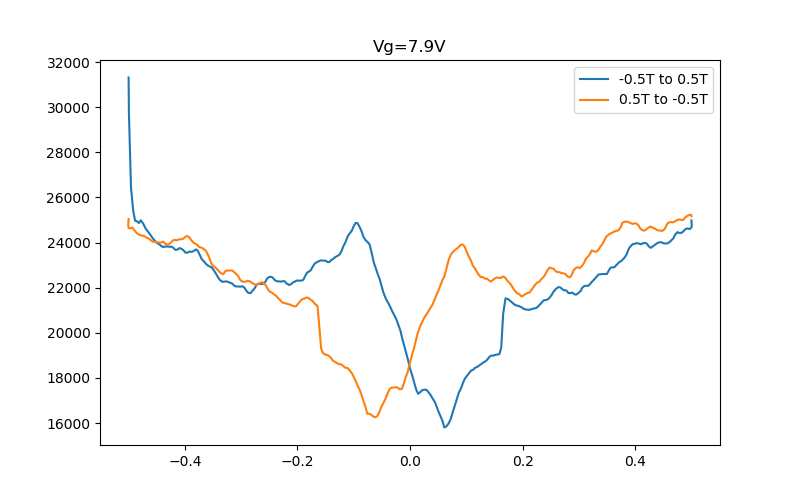

In [396]:
plt.figure(figsize=(8, 5))
plt.plot(data135.triton_field[:], data135.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data136.triton_field[:], data136.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg=7.9V')
plt.legend()

In [385]:
#Try the same on a few gate points.
srframe.volt_p1(7.95)

In [386]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data137, plot137 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p95_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 03:33:29
DataSet:
   location = 'data/2020-03-04/#013_M26_hysteresisupVbg7p95_865_10-3_0p3nA_1000xgain_03-33-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 03:43:47


In [387]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data138, plot138 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p95_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 03:43:53
DataSet:
   location = 'data/2020-03-04/#014_M26_hysteresisdownVbg7p95_865_10-3_0p3nA_1000xgain_03-43-53'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 03:54:11


<IPython.core.display.Javascript object>


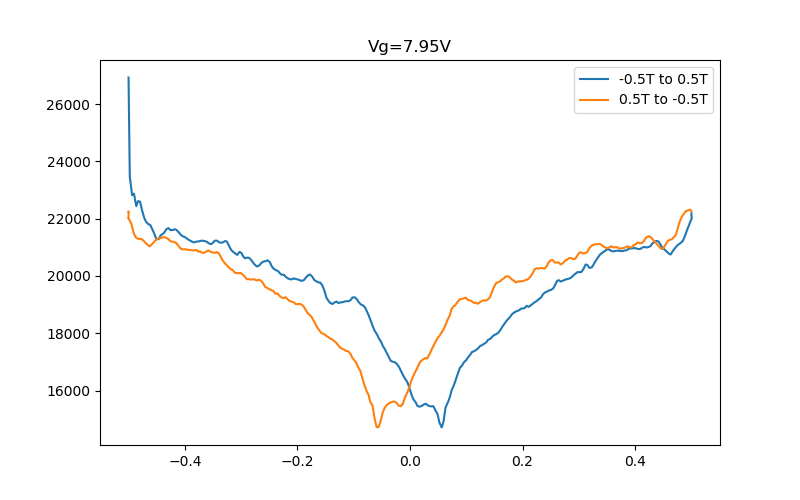

In [397]:
plt.figure(figsize=(8, 5))
plt.plot(data137.triton_field[:], data137.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data138.triton_field[:], data138.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg=7.95V')
plt.legend()

In [398]:
#Try the same on a few gate points.
srframe.volt_p1(8)

In [399]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data139, plot139 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg8p0_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 10:20:13
DataSet:
   location = 'data/2020-03-04/#015_M26_hysteresisupVbg8p0_865_10-3_0p3nA_1000xgain_10-20-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 10:30:30


In [400]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data140, plot140 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg8p0_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-04 10:30:37
DataSet:
   location = 'data/2020-03-04/#016_M26_hysteresisdownVbg8p0_865_10-3_0p3nA_1000xgain_10-30-36'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 10:40:54


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


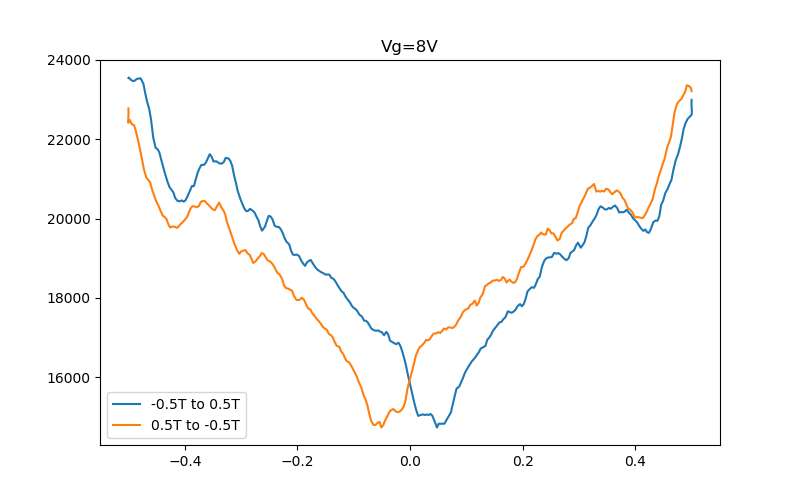

In [407]:
plt.figure(figsize=(8, 5))
plt.plot(data139.triton_field[:], data139.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data140.triton_field[:], data140.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg=8V')
plt.legend()

In [401]:
#Try the same on a few gate points.
srframe.volt_p1(8.05)

In [402]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data141, plot141 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg8p05_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 10:41:00
DataSet:
   location = 'data/2020-03-04/#017_M26_hysteresisupVbg8p05_865_10-3_0p3nA_1000xgain_10-40-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 10:51:17


In [403]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data142, plot142 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg8p0_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-04 10:51:24
DataSet:
   location = 'data/2020-03-04/#018_M26_hysteresisdownVbg8p0_865_10-3_0p3nA_1000xgain_10-51-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 11:01:42


<IPython.core.display.Javascript object>


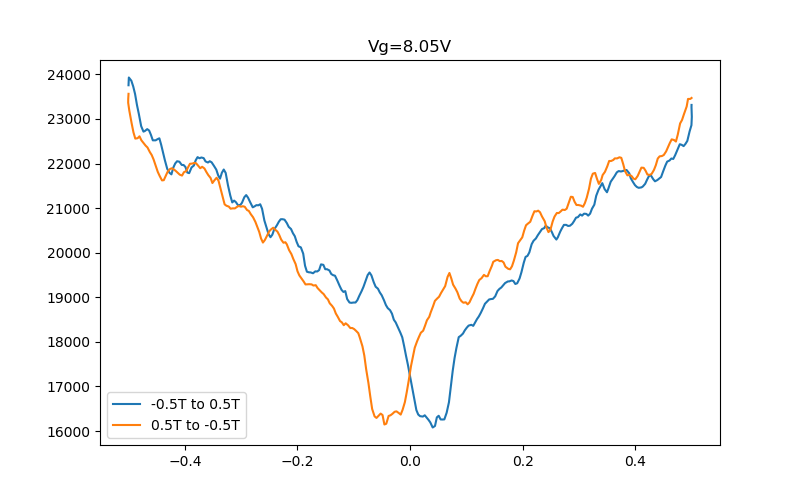

In [408]:
plt.figure(figsize=(8, 5))
plt.plot(data141.triton_field[:], data141.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data142.triton_field[:], data142.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg=8.05V')
plt.legend()

In [404]:
#Try the same on a few gate points.
srframe.volt_p1(8.1)

In [405]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data143, plot143 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg8p1_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-04 11:01:49
DataSet:
   location = 'data/2020-03-04/#019_M26_hysteresisupVbg8p1_865_10-3_0p3nA_1000xgain_11-01-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 11:12:06


In [406]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data144, plot144 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg8p1_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 11:12:12
DataSet:
   location = 'data/2020-03-04/#020_M26_hysteresisdownVbg8p1_865_10-3_0p3nA_1000xgain_11-12-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 11:22:28


<IPython.core.display.Javascript object>


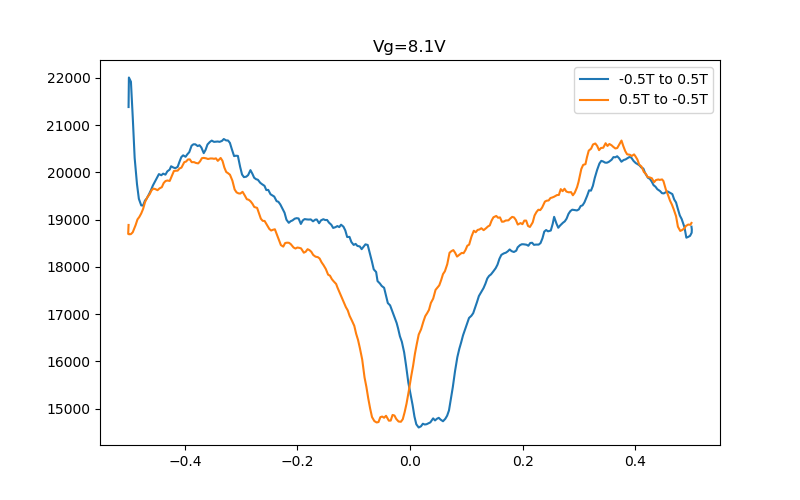

In [409]:
plt.figure(figsize=(8, 5))
plt.plot(data143.triton_field[:], data143.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data144.triton_field[:], data144.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg=8.1V')
plt.legend()

In [410]:
#Try the same on a few gate points.
srframe.volt_p1(7.6)

In [411]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data145, plot145 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p6_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 11:35:00
DataSet:
   location = 'data/2020-03-04/#021_M26_hysteresisupVbg7p6_865_10-3_0p3nA_1000xgain_11-34-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 11:45:16


In [412]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data146, plot146 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p6_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 11:45:22
DataSet:
   location = 'data/2020-03-04/#022_M26_hysteresisdownVbg7p6_865_10-3_0p3nA_1000xgain_11-45-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 11:55:39


<IPython.core.display.Javascript object>


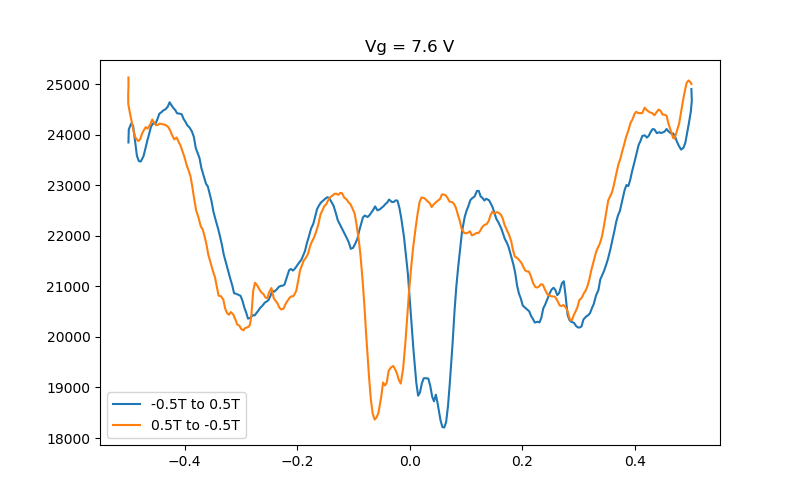

In [580]:
plt.figure(figsize=(8, 5))
plt.plot(data145.triton_field[:], data145.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data146.triton_field[:], data146.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg = 7.6 V')
plt.legend()

In [413]:
#Try the same on a few gate points.
srframe.volt_p1(7.55)

In [414]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data147, plot147 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p55_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 11:55:44
DataSet:
   location = 'data/2020-03-04/#023_M26_hysteresisupVbg7p55_865_10-3_0p3nA_1000xgain_11-55-44'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 12:06:02


In [415]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data148, plot148 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p55_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-04 12:06:09
DataSet:
   location = 'data/2020-03-04/#024_M26_hysteresisdownVbg7p55_865_10-3_0p3nA_1000xgain_12-06-08'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 12:16:26


<IPython.core.display.Javascript object>


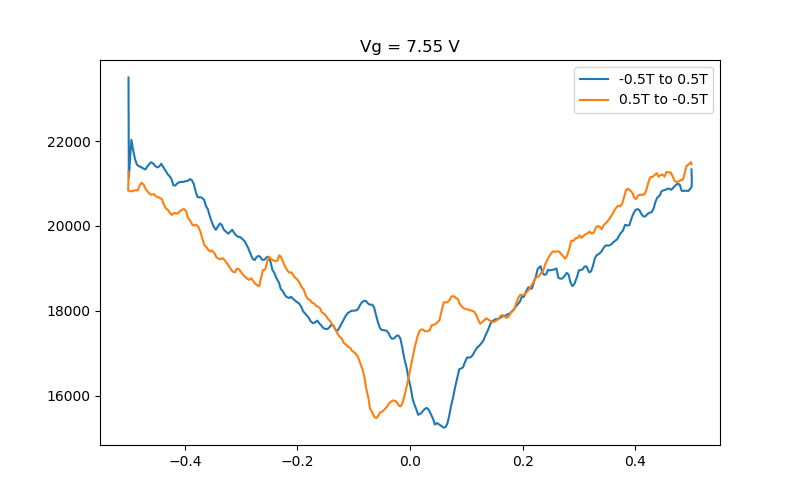

In [581]:
plt.figure(figsize=(8, 5))
plt.plot(data147.triton_field[:], data147.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data148.triton_field[:], data148.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg = 7.55 V')
plt.legend()

In [416]:
#Try the same on a few gate points.
srframe.volt_p1(7.5)

In [417]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data149, plot149 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p5_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-04 12:16:32
DataSet:
   location = 'data/2020-03-04/#025_M26_hysteresisupVbg7p5_865_10-3_0p3nA_1000xgain_12-16-31'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 12:26:48


In [418]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data150, plot150 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p5_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-04 12:26:54
DataSet:
   location = 'data/2020-03-04/#026_M26_hysteresisdownVbg7p5_865_10-3_0p3nA_1000xgain_12-26-53'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 12:37:11


<IPython.core.display.Javascript object>


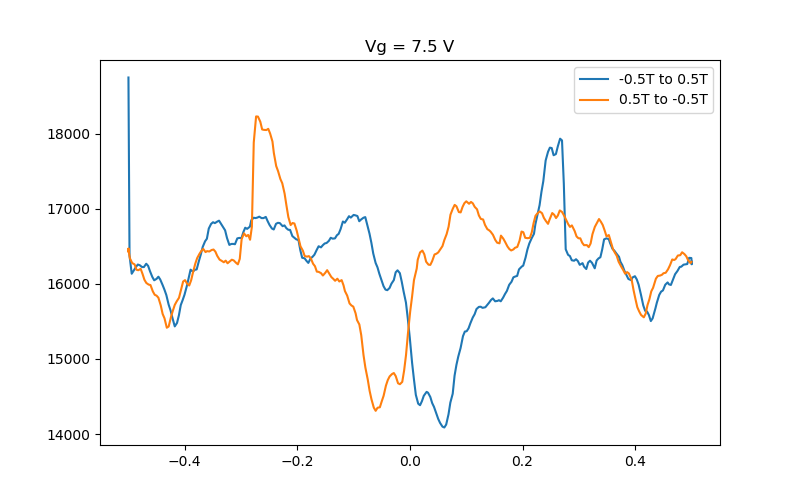

In [582]:
plt.figure(figsize=(8, 5))
plt.plot(data149.triton_field[:], data149.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data150.triton_field[:], data150.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg = 7.5 V')
plt.legend()

In [419]:
#Try the same on a few gate points.
srframe.volt_p1(7.45)

In [420]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data151, plot151 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p45_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 12:37:17
DataSet:
   location = 'data/2020-03-04/#027_M26_hysteresisupVbg7p45_865_10-3_0p3nA_1000xgain_12-37-16'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 12:47:33


In [421]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data152, plot152 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p45_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-04 12:47:39
DataSet:
   location = 'data/2020-03-04/#028_M26_hysteresisdownVbg7p45_865_10-3_0p3nA_1000xgain_12-47-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 12:57:56


<IPython.core.display.Javascript object>


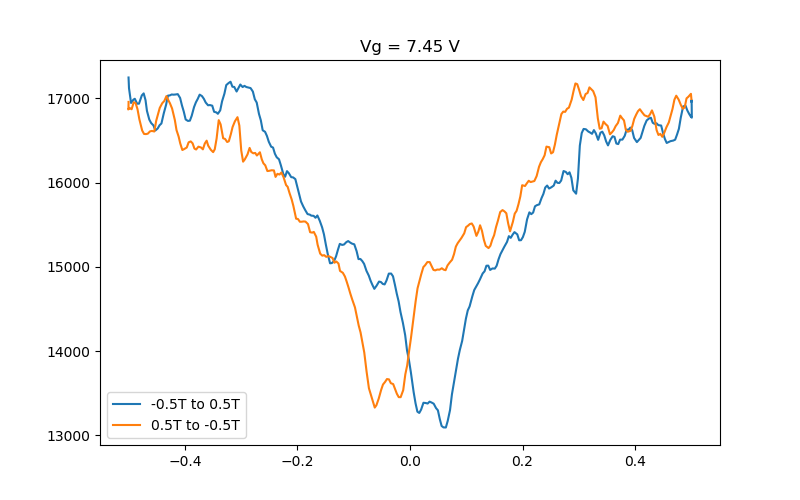

In [583]:
plt.figure(figsize=(8, 5))
plt.plot(data151.triton_field[:], data151.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data152.triton_field[:], data152.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg = 7.45 V')
plt.legend()

In [422]:
#Try the same on a few gate points.
srframe.volt_p1(7.4)

In [423]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data153, plot153 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p45_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-04 12:58:02
DataSet:
   location = 'data/2020-03-04/#029_M26_hysteresisupVbg7p45_865_10-3_0p3nA_1000xgain_12-58-01'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 13:08:20


In [424]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data154, plot154 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p4_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-04 13:08:27
DataSet:
   location = 'data/2020-03-04/#030_M26_hysteresisdownVbg7p4_865_10-3_0p3nA_1000xgain_13-08-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 13:18:44


<IPython.core.display.Javascript object>


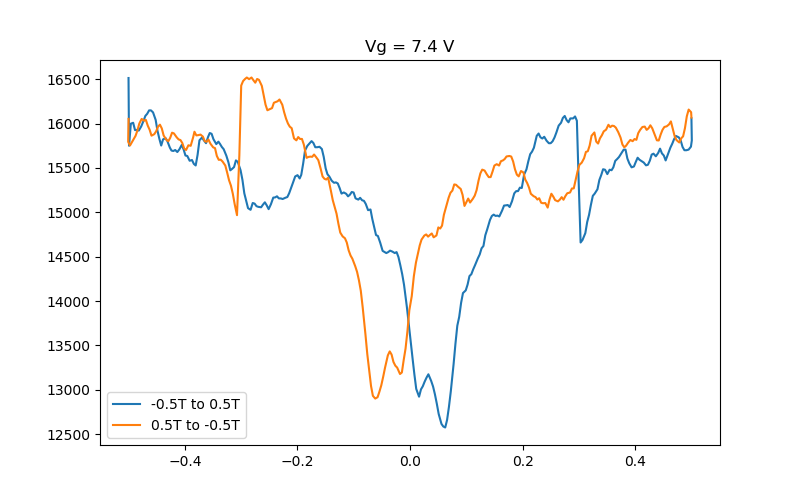

In [584]:
plt.figure(figsize=(8, 5))
plt.plot(data153.triton_field[:], data153.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data154.triton_field[:], data154.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg = 7.4 V')
plt.legend()

In [425]:
#Try the same on a few gate points.
srframe.volt_p1(7.3)

In [426]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data155, plot155 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p3_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-04 13:18:49
DataSet:
   location = 'data/2020-03-04/#031_M26_hysteresisupVbg7p3_865_10-3_0p3nA_1000xgain_13-18-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 13:29:07


In [427]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data156, plot156 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p3_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 13:29:12
DataSet:
   location = 'data/2020-03-04/#032_M26_hysteresisdownVbg7p3_865_10-3_0p3nA_1000xgain_13-29-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 13:39:30


<IPython.core.display.Javascript object>


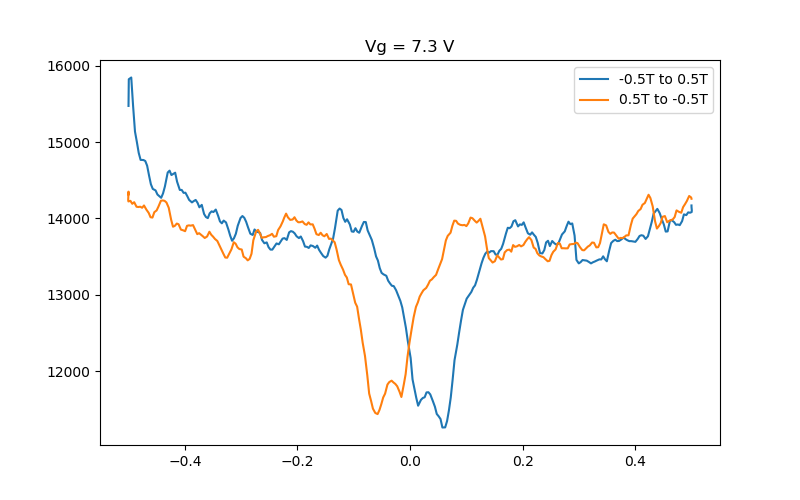

In [585]:
plt.figure(figsize=(8, 5))
plt.plot(data155.triton_field[:], data155.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data156.triton_field[:], data156.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg = 7.3 V')
plt.legend()

In [428]:
#Try the same on a few gate points.
srframe.volt_p1(7.2)

In [429]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data157, plot157 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p2_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-04 13:39:36
DataSet:
   location = 'data/2020-03-04/#033_M26_hysteresisupVbg7p2_865_10-3_0p3nA_1000xgain_13-39-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 13:49:53


In [430]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data158, plot158 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p2_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-04 13:49:59
DataSet:
   location = 'data/2020-03-04/#034_M26_hysteresisdownVbg7p2_865_10-3_0p3nA_1000xgain_13-49-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 14:00:17


<IPython.core.display.Javascript object>


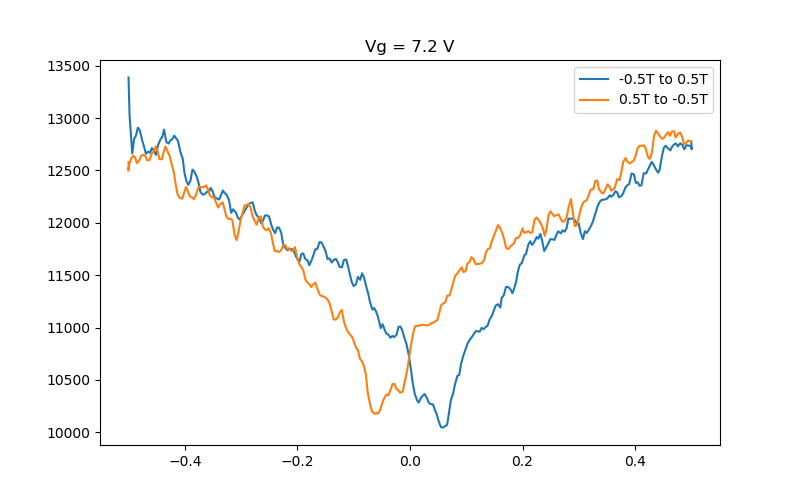

In [586]:
plt.figure(figsize=(8, 5))
plt.plot(data157.triton_field[:], data157.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data158.triton_field[:], data158.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg = 7.2 V')
plt.legend()

In [431]:
#Try the same on a few gate points.
srframe.volt_p1(7.1)

In [432]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data159, plot159 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p1_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-04 14:00:23
DataSet:
   location = 'data/2020-03-04/#035_M26_hysteresisupVbg7p1_865_10-3_0p3nA_1000xgain_14-00-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 14:10:41


In [433]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data160, plot160 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p1_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 14:10:46
DataSet:
   location = 'data/2020-03-04/#036_M26_hysteresisdownVbg7p1_865_10-3_0p3nA_1000xgain_14-10-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 14:21:04


<IPython.core.display.Javascript object>


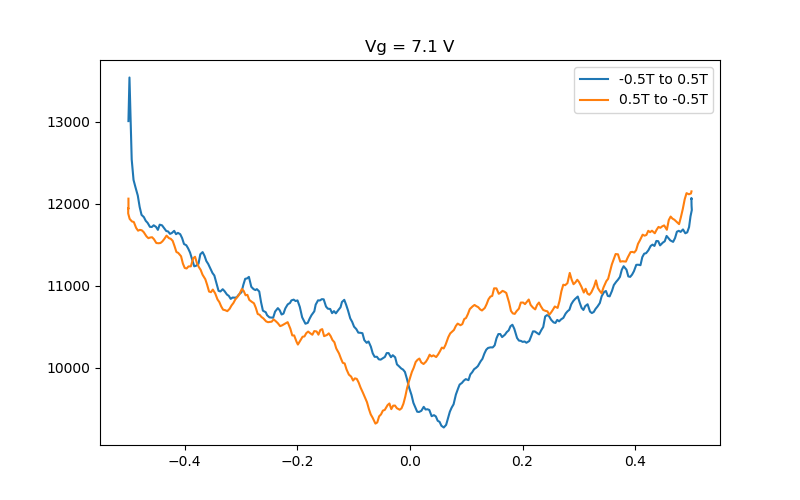

In [587]:
plt.figure(figsize=(8, 5))
plt.plot(data159.triton_field[:], data159.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data160.triton_field[:], data160.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg = 7.1 V')
plt.legend()

In [434]:
#Try the same on a few gate points.
srframe.volt_p1(7)

In [435]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data161, plot161 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p0_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 14:21:09
DataSet:
   location = 'data/2020-03-04/#037_M26_hysteresisupVbg7p0_865_10-3_0p3nA_1000xgain_14-21-09'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 14:31:27


In [436]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data162, plot162 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p0_865_10-3_0p3nA_1000xgain', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-04 14:31:32
DataSet:
   location = 'data/2020-03-04/#038_M26_hysteresisdownVbg7p0_865_10-3_0p3nA_1000xgain_14-31-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
Finished at 2020-03-04 14:41:50


<IPython.core.display.Javascript object>


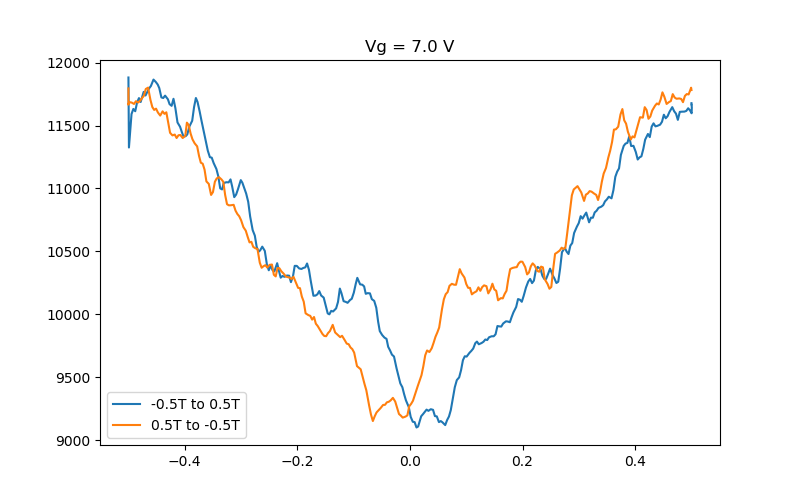

In [588]:
plt.figure(figsize=(8, 5))
plt.plot(data161.triton_field[:], data161.lockin865_X[:]/0.3e-9/1000, label='-0.5T to 0.5T')
plt.plot(data162.triton_field[:], data162.lockin865_X[:]/0.3e-9/1000, label='0.5T to -0.5T')
plt.title('Vg = 7.0 V')
plt.legend()

# W5 BKT again

In [446]:
srframe.volt_p1(2)# 1nA, sensitivity 100uV, 100ms, sensor disconnected
time.sleep(15)
gvals = np.linspace(2, 5, 151)
data163, plot163 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_830_39-38_865_39-40_baseT_1nA_gatesweep_-0p8mT_sensitivity_100uV_100ms')
srframe.volt_p1(2)

Started at 2020-03-04 17:21:22
DataSet:
   location = 'data/2020-03-04/#040_W5_830_39-38_865_39-40_baseT_1nA_gatesweep_-0p8mT_sensitivity_100uV_100ms_17-21-21'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
Finished at 2020-03-04 17:25:37


In [448]:
srframe.volt_p1(3.9)

In [450]:
# base temp, cables unplugged at first
srframe.volt_p5(-10)
time.sleep(20)
offvals = np.linspace(-10, 10, 401)  #-100 to 100 nA, 1 nA excitation
data164, plot164 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_BTKbasetemp_865_40-39_830_39-38_1nA_3p9vbg')

Started at 2020-03-04 17:38:06
DataSet:
   location = 'data/2020-03-04/#041_W5_BTKbasetemp_865_40-39_830_39-38_1nA_3p9vbg_17-38-04'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (401,)
   Measured | lockin865_X         | X            | (401,)
   Measured | lockin865_Y         | Y            | (401,)
   Measured | lockin830_X         | X            | (401,)
   Measured | lockin830_Y         | Y            | (401,)
Finished at 2020-03-04 17:49:34


In [452]:
srframe.volt_p5(0)

In [455]:
srframe.volt_p1(3.8)

In [456]:
# base temp, cables unplugged at first
srframe.volt_p5(-10)
time.sleep(20)
offvals = np.linspace(-10, 10, 201)  #-100 to 100 nA, 1 nA excitation
data165, plot165 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_BTKbasetemp_865_40-39_830_39-38_1nA_3p8vbg')

Started at 2020-03-04 18:06:45
DataSet:
   location = 'data/2020-03-04/#042_W5_BTKbasetemp_865_40-39_830_39-38_1nA_3p8vbg_18-06-43'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-03-04 18:12:54


In [468]:
srframe.volt_p5(0)

In [458]:
srframe.volt_p1(3.5)

In [459]:
srframe.volt_p5(-10)
time.sleep(20)
offvals = np.linspace(-10, 10, 201)  #-100 to 100 nA, 1 nA excitation
data166, plot166 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_BTKbasetemp_865_40-39_830_39-38_1nA_3p5vbg')

Started at 2020-03-04 18:16:45
DataSet:
   location = 'data/2020-03-04/#043_W5_BTKbasetemp_865_40-39_830_39-38_1nA_3p5vbg_18-16-44'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-03-04 18:22:55


In [461]:
srframe.volt_p1(4)

In [462]:
srframe.volt_p5(-10)
time.sleep(20)
offvals = np.linspace(-10, 10, 201)  #-100 to 100 nA, 1 nA excitation
data167, plot167 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_BTKbasetemp_865_40-39_830_39-38_1nA_4vbg')

Started at 2020-03-04 18:25:20
DataSet:
   location = 'data/2020-03-04/#044_W5_BTKbasetemp_865_40-39_830_39-38_1nA_4vbg_18-25-18'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-03-04 18:31:29


In [464]:
#seems Vg=3.9 is the best

In [466]:
srframe.volt_p1(3.9)

In [467]:
srframe.volt_p5(-1.2)
time.sleep(20)
offvals = np.linspace(-1.2, 1.2, 241)  #-120 to 120 nA, 1 nA excitation
data168, plot168 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_BTKbasetemp_865_40-39_830_39-38_1nA_3.9vbg')

Started at 2020-03-04 18:37:53
DataSet:
   location = 'data/2020-03-04/#045_W5_BTKbasetemp_865_40-39_830_39-38_1nA_3.9vbg_18-37-52'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (241,)
   Measured | lockin865_X         | X            | (241,)
   Measured | lockin865_Y         | Y            | (241,)
   Measured | lockin830_X         | X            | (241,)
   Measured | lockin830_Y         | Y            | (241,)
Finished at 2020-03-04 18:44:40


In [469]:
# base temp, cables unplugged at first
srframe.volt_p5(-10)
time.sleep(20)
offvals = np.linspace(-10, 10, 401)  #-100 to 100 nA, 1 nA excitation
data169, plot169 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.6, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_BTKbasetemp_865_40-39_830_39-38_1nA_3p9vbg')

Started at 2020-03-04 18:51:44
DataSet:
   location = 'data/2020-03-04/#046_W5_BTKbasetemp_865_40-39_830_39-38_1nA_3p9vbg_18-51-43'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (401,)
   Measured | lockin865_X         | X            | (401,)
   Measured | lockin865_Y         | Y            | (401,)
   Measured | lockin830_X         | X            | (401,)
   Measured | lockin830_Y         | Y            | (401,)
Finished at 2020-03-04 19:03:40


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


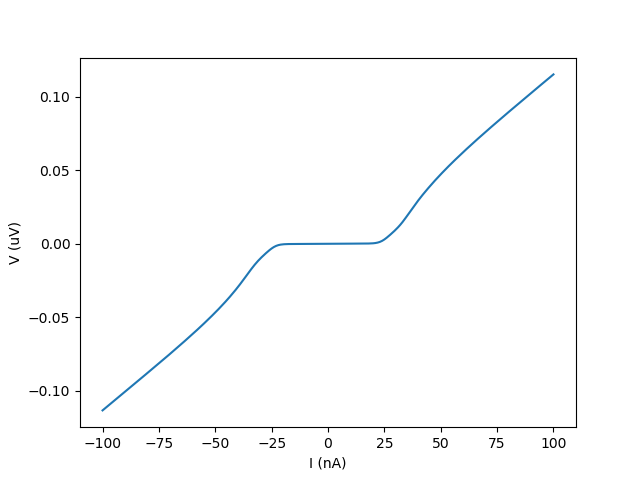

Text(0, 0.5, 'V (uV)')

In [470]:
plt.figure()
curr = data169.srframe_volt_p5_set[:]*100*1e-9
plt.plot(curr/1e-9/10, npd.iv_from_dvdi(data169.lockin865_X[:]/1e-9, curr)*1000/10)
plt.xlabel('I (nA)')
plt.ylabel('V (uV)')

In [471]:
srframe.volt_p5(0)

In [472]:
triton.pid_setpoint(0.05)

In [473]:
triton.pid_range(1)

In [474]:
triton.pid_mode(1)

In [475]:
triton.pid_range(3.16)

In [476]:
triton.pid_range(10)

In [477]:
# now temp cables plugged in
srframe.volt_p5(-10)
time.sleep(20)
offvals = np.linspace(-10, 10, 401)  #-100 to 100 nA, 1 nA excitation
Tvals = np.linspace(0.05, 1, 20)
data170, plot170 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.6, Param2_SetBetween=0, DataName='W5_BKT50mKto1K_865_40-39_830_39-38_1nA_3p9vbg')

Started at 2020-03-04 19:14:42
DataSet:
   location = 'data/2020-03-04/#047_W5_BKT50mKto1K_865_40-39_830_39-38_1nA_3p9vbg_19-14-40'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (20, 401)
   Measured | lockin865_X             | X            | (20, 401)
   Measured | lockin865_Y             | Y            | (20, 401)
   Measured | lockin830_X             | X            | (20, 401)
   Measured | lockin830_Y             | Y            | (20, 401)
Finished at 2020-03-05 00:35:13


In [479]:
srframe.volt_p5(0)

In [484]:
triton.pid_setpoint(1)

In [494]:
triton.MC_temp()

0.0303674

In [495]:
triton.pid_range(31.6)

In [496]:
srframe.volt_p5(-10)
time.sleep(20)
offvals = np.linspace(-10, 10, 401)  #-100 to 100 nA, 1 nA excitation
Tvals = np.linspace(1.0, 1.4, 5)
data171, plot171 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.6, Param2_SetBetween=0, DataName='W5_BKT1Kto1p4K_865_40-39_830_39-38_1nA_3p9vbg')

Started at 2020-03-05 00:39:54
DataSet:
   location = 'data/2020-03-05/#001_W5_BKT1Kto1p4K_865_40-39_830_39-38_1nA_3p9vbg_00-39-52'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (5,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (5, 401)
   Measured | lockin865_X             | X            | (5, 401)
   Measured | lockin865_Y             | Y            | (5, 401)
   Measured | lockin830_X             | X            | (5, 401)
   Measured | lockin830_Y             | Y            | (5, 401)
Finished at 2020-03-05 01:59:55


In [497]:
triton.pid_range(100)
time.sleep(10)

In [498]:
srframe.volt_p5(-10)
time.sleep(20)
offvals = np.linspace(-10, 10, 401)  #-100 to 100 nA, 1 nA excitation
Tvals = np.linspace(1.5, 2.0, 6)
data172, plot172 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.6, Param2_SetBetween=0, DataName='W5_BKT1p5Kto2K_865_40-39_830_39-38_1nA_3p9vbg')

Started at 2020-03-05 02:00:48
DataSet:
   location = 'data/2020-03-05/#002_W5_BKT1p5Kto2K_865_40-39_830_39-38_1nA_3p9vbg_02-00-45'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (6,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (6, 401)
   Measured | lockin865_X             | X            | (6, 401)
   Measured | lockin865_Y             | Y            | (6, 401)
   Measured | lockin830_X             | X            | (6, 401)
   Measured | lockin830_Y             | Y            | (6, 401)
Finished at 2020-03-05 03:36:38


In [499]:
srframe.volt_p1(0)
srframe.volt_p5(0)
triton.pid_setpoint(0.05)
time.sleep(5)
triton.pid_mode(0)

In [500]:
triton.MC_temp()

0.0307576

# M26 more hysteresis sweeps (same point at different rates, dispersive band)

No pre-amp

In [503]:
lockin865.amplitude()

0.0

In [504]:
lockin865.amplitude(0.05)  # 0.5 nA

In [507]:
triton.magnet_POC()

0

In [509]:
triton.magnet_sweeprate(0.1)

In [510]:
triton.field_set_stable(0.5)

Please wait 310.474 seconds for the field sweep, plus the time required for operating the switch...


In [511]:
triton.magnet_sweeprate(0.05)  # use a magnet sweeprate that's slower than before

In [512]:
triton.field(-0.5)  #oops, this was accidentally 0V
data173, plot173 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=80, DataName='M26_hysteresisVbg7p8_865_10-3_0p5nA', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1210.012 seconds
Started at 2020-03-05 14:59:21
DataSet:
   location = 'data/2020-03-05/#003_M26_hysteresisVbg7p8_865_10-3_0p5nA_14-59-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
Finished at 2020-03-05 15:20:02
Keyboard Interrupt


In [513]:
srframe.volt_p1(7.8)

In [514]:
triton.field(0.5)
data174, plot174 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=80, DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1210.006 seconds
Started at 2020-03-05 15:24:45
DataSet:
   location = 'data/2020-03-05/#004_M26_hysteresisupVbg7p8_865_10-3_0p5nA_15-24-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
Finished at 2020-03-05 16:09:45
Keyboard Interrupt


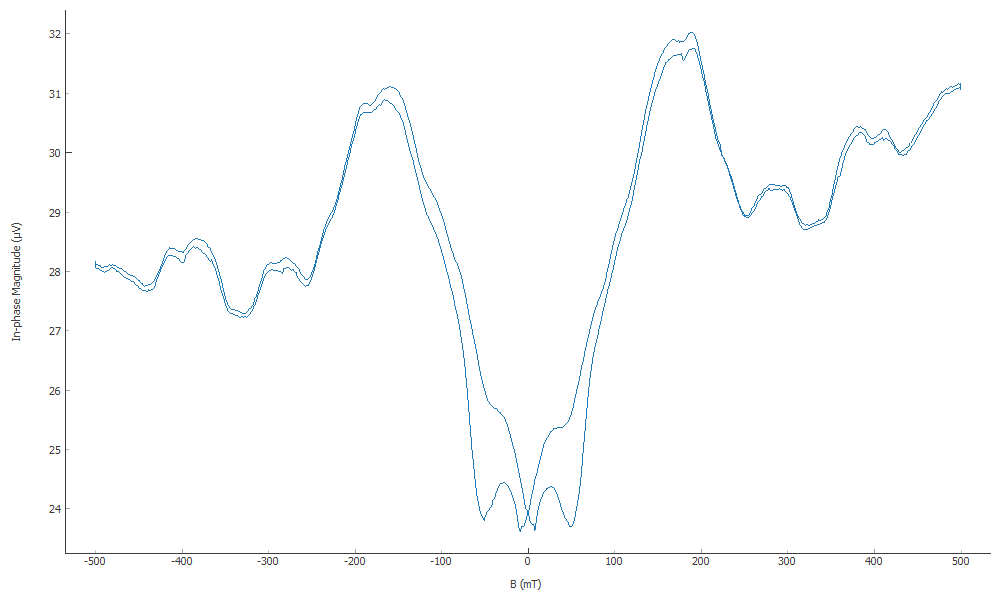

In [589]:
plot174[0]  #CNP slow sweep

In [515]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data175, plot175 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=80, DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-05 16:11:14
DataSet:
   location = 'data/2020-03-05/#005_M26_hysteresisupVbg7p8_865_10-3_0p5nA_16-11-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
Finished at 2020-03-05 17:03:57
Keyboard Interrupt


Disregard the gate voltage on the last two last plots... The gate was shorted to ground the whole time.

In [533]:
lockin865.frequency()

13.6667

In [527]:
lockin865.time_constant(0.3)

In [531]:
lockin865.filter_slope(24)

In [532]:
lockin865.noise_bandwidth()

0.26039999723

In [538]:
srframe.volt_p1(0)

In [539]:
srframe.volt_p1(7.8)

In [540]:
triton.field() # note I also turned off the advanced filter here, the time constant is 0.1, filter slope 24

-0.499997

In [541]:
triton.magnet_sweeprate(0.1)  # fast
triton.field(0.5)
data176, plot176 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=80, DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-05 17:38:41
DataSet:
   location = 'data/2020-03-05/#007_M26_hysteresisupVbg7p8_865_10-3_0p5nA_17-38-40'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
Finished at 2020-03-05 18:03:19
Keyboard Interrupt


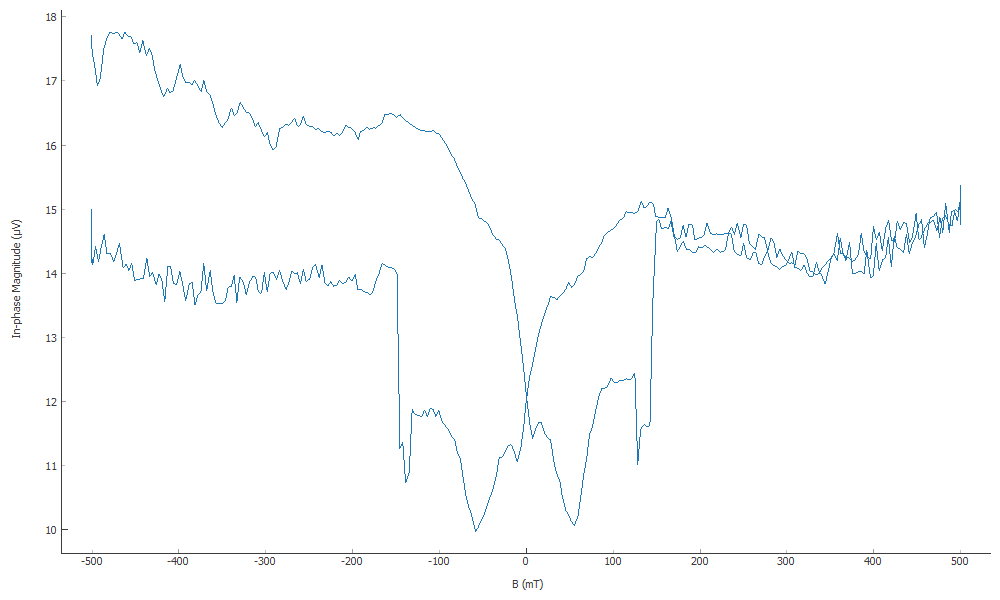

In [543]:
plot176[0]  # not sure why the up and down curves didn't match from -500 to -200 mT

In [542]:
triton.magnet_sweeprate(0.05)  # slow 
triton.field(0.5)
data177, plot177 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=80, DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_0p05rate', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1210.018 seconds
Started at 2020-03-05 18:03:30
DataSet:
   location = 'data/2020-03-05/#008_M26_hysteresisupVbg7p8_865_10-3_0p5nA_0p05rate_18-03-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
Finished at 2020-03-05 18:51:12
Keyboard Interrupt


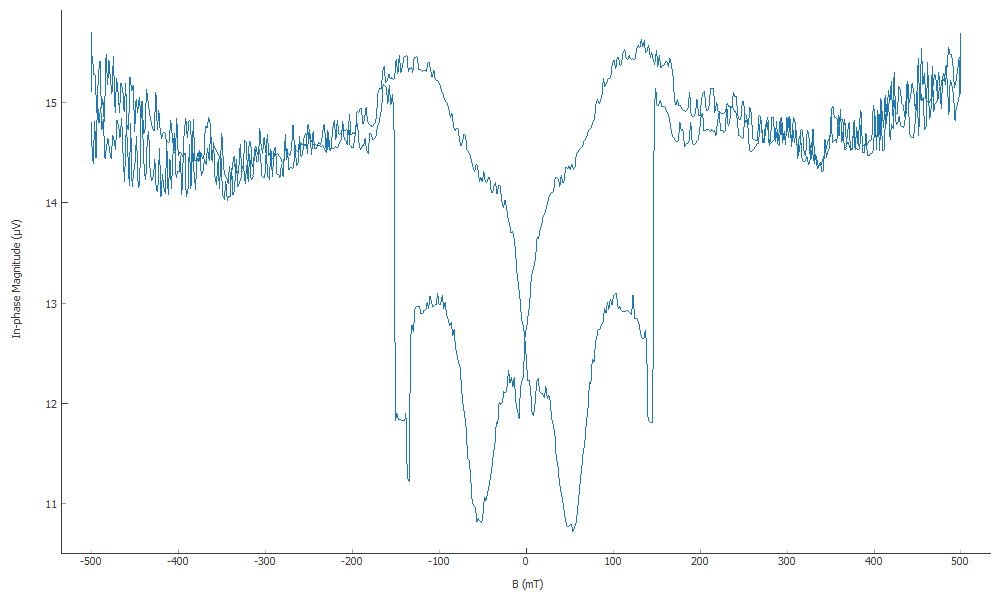

In [544]:
plot177[0]  # this one looks more repeatable... Maybe it's good to use a slower rate. 
# I also noticed that the magnet temp increases to 4.3K instead of 4.4K (at 0.1 T/min)

In [547]:
lockin865.time_constant(0.3)  # increase the time constant to reduce noise a bit

go to a few extra gate points at different places in gate space. Try 9, 3, -3, -4, -15 (dispersive band). Also try the slower rate now.

In [548]:
triton.field()

-0.500003

In [549]:
srframe.volt_p1(9)
time.sleep(20)
triton.field(0.5)
data178, plot178 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg9_865_10-3_0p5nA_baseT', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1209.988 seconds
Started at 2020-03-05 19:00:14
DataSet:
   location = 'data/2020-03-05/#009_M26_hysteresisupVbg9_865_10-3_0p5nA_baseT_19-00-13'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-05 19:20:32


In [550]:
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data179, plot179 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg9_865_10-3_0p5nA_baseT', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1210.006 seconds
Started at 2020-03-05 19:20:39
DataSet:
   location = 'data/2020-03-05/#010_M26_hysteresisdownVbg9_865_10-3_0p5nA_baseT_19-20-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-05 19:40:58


<IPython.core.display.Javascript object>


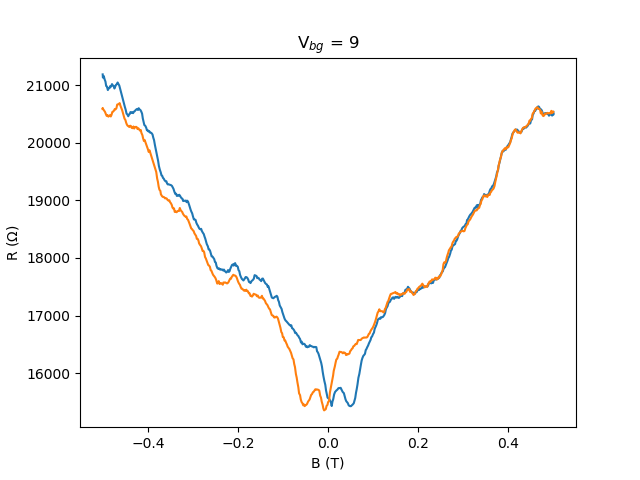

Text(0, 0.5, 'R ($\\Omega$)')

In [552]:
plt.figure()
plt.plot(data178.triton_field, data178.lockin865_X[:]/0.5e-9, label='up')
plt.plot(data179.triton_field, data179.lockin865_X[:]/0.5e-9, label='down')
plt.title('V$_{bg}$ = 9')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [553]:
srframe.volt_p1(3)
time.sleep(20)
triton.field(0.5)
data180, plot180 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg3_865_10-3_0p5nA_baseT', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1209.982 seconds
Started at 2020-03-05 22:30:24
DataSet:
   location = 'data/2020-03-05/#011_M26_hysteresisupVbg3_865_10-3_0p5nA_baseT_22-30-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-05 22:50:43


In [554]:
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data181, plot181 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg3_865_10-3_0p5nA_baseT', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1210.018 seconds
Started at 2020-03-05 22:50:49
DataSet:
   location = 'data/2020-03-05/#012_M26_hysteresisdownVbg3_865_10-3_0p5nA_baseT_22-50-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-05 23:11:07


<IPython.core.display.Javascript object>


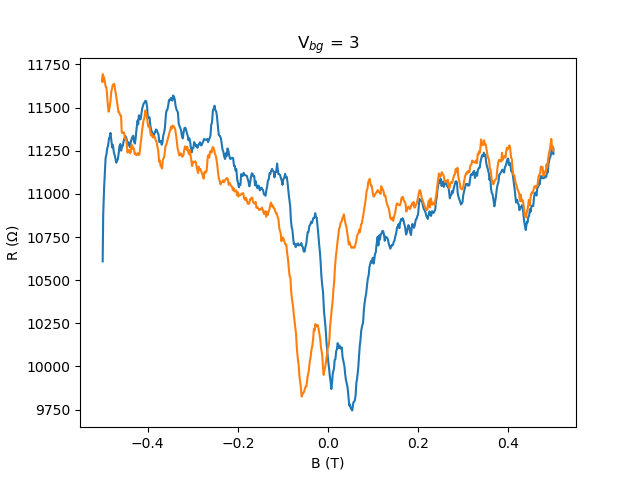

Text(0, 0.5, 'R ($\\Omega$)')

In [569]:
plt.figure()
plt.plot(data180.triton_field, data180.lockin865_X[:]/0.5e-9, label='up')
plt.plot(data181.triton_field, data181.lockin865_X[:]/0.5e-9, label='down')
plt.title('V$_{bg}$ = 3')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [556]:
srframe.volt_p1(-3)
time.sleep(20)
triton.field(0.5)
data182, plot182 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg-3_865_10-3_0p5nA_baseT', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1210.012 seconds
Started at 2020-03-05 23:11:42
DataSet:
   location = 'data/2020-03-05/#013_M26_hysteresisupVbg-3_865_10-3_0p5nA_baseT_23-11-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-05 23:32:02


In [557]:
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data183, plot183 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg-3_865_10-3_0p5nA_baseT', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1209.988 seconds
Started at 2020-03-05 23:32:08
DataSet:
   location = 'data/2020-03-05/#014_M26_hysteresisdownVbg-3_865_10-3_0p5nA_baseT_23-32-08'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-05 23:52:26


<IPython.core.display.Javascript object>


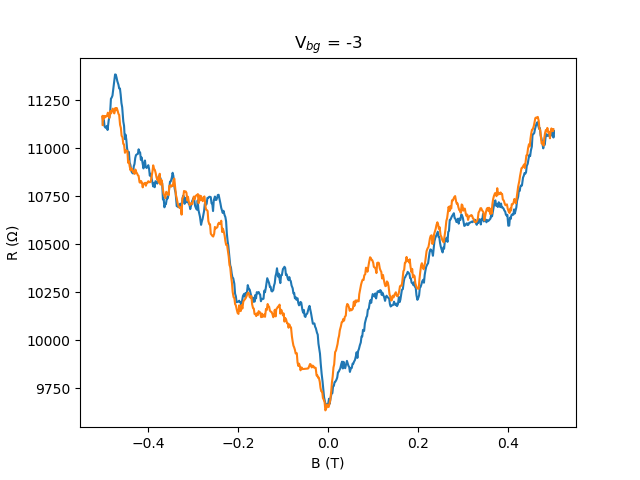

Text(0, 0.5, 'R ($\\Omega$)')

In [570]:
plt.figure()
plt.plot(data182.triton_field, data182.lockin865_X[:]/0.5e-9, label='up')
plt.plot(data183.triton_field, data183.lockin865_X[:]/0.5e-9, label='down')
plt.title('V$_{bg}$ = -3')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [559]:
srframe.volt_p1(-4)
time.sleep(20)
triton.field(0.5)
data184, plot184 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg-4_865_10-3_0p5nA_baseT', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1209.994 seconds
Started at 2020-03-05 23:52:52
DataSet:
   location = 'data/2020-03-05/#015_M26_hysteresisupVbg-4_865_10-3_0p5nA_baseT_23-52-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-06 00:13:10


In [560]:
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data185, plot185 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg-4_865_10-3_0p5nA_baseT', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1209.994 seconds
Started at 2020-03-06 00:13:16
DataSet:
   location = 'data/2020-03-06/#001_M26_hysteresisdownVbg-4_865_10-3_0p5nA_baseT_00-13-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-06 00:33:34


<IPython.core.display.Javascript object>


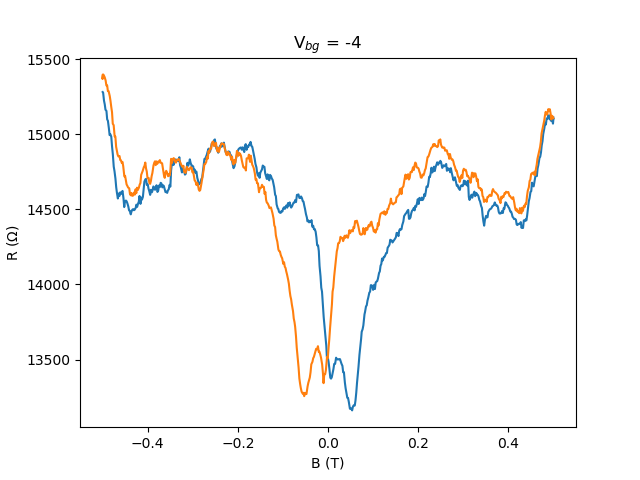

Text(0, 0.5, 'R ($\\Omega$)')

In [571]:
plt.figure()
plt.plot(data184.triton_field, data184.lockin865_X[:]/0.5e-9, label='up')
plt.plot(data185.triton_field, data185.lockin865_X[:]/0.5e-9, label='down')
plt.title('V$_{bg}$ = -4')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [562]:
srframe.volt_p1(-15)  #dispersive
time.sleep(20)
triton.field(0.5)
data186, plot186 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg-15_865_10-3_0p5nA_baseT', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1210.006 seconds
Started at 2020-03-06 00:34:19
DataSet:
   location = 'data/2020-03-06/#002_M26_hysteresisupVbg-15_865_10-3_0p5nA_baseT_00-34-18'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-06 00:54:38


In [563]:
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data187, plot187 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg-15_865_10-3_0p5nA_baseT', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1210.006 seconds
Started at 2020-03-06 00:54:44
DataSet:
   location = 'data/2020-03-06/#003_M26_hysteresisdownVbg-15_865_10-3_0p5nA_baseT_00-54-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-06 01:15:03


<IPython.core.display.Javascript object>


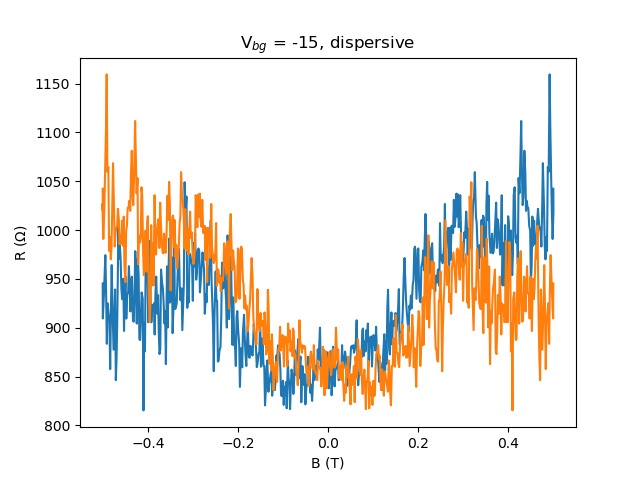

Text(0, 0.5, 'R ($\\Omega$)')

In [572]:
plt.figure()
plt.plot(data186.triton_field, data186.lockin865_X[:]/0.5e-9, label='up')
plt.plot(data187.triton_field, data186.lockin865_X[:]/0.5e-9, label='down')
plt.title('V$_{bg}$ = -15, dispersive')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [565]:
srframe.volt_p1(0)
triton.magnet_sweeprate(0.15)

AttributeError: 'Triton' object and its delegates have no attribute 'field_set_stable_set'

In [567]:
triton.field_set_stable(0)

Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...


In [568]:
srframe.volt_p1(0)

In [ ]:
# maybe later
lockin865.amplitude(0.1)  # 1 nA (base temp but temp cables plugged in)
srframe.volt_p1(-15)
gvals = np.linspace(-15, 15, 1201)
bvals = [0, 1, 2, 3, 4, 5]  # a few gate sweeps at different fields.
data188, plot188 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=25, SetDelay2=3.5, Param2_SetBetween=0, DataName='M26_865_10-3_gatesweep_0to5T_baseTemp_1nA')

In [ ]:
srframe.volt_p1(0)

# W3 48-24 nice fan, high fields, temp dependence

At some point, we should check if the gaps on the nice W3 fan at high field show some non-linear B-dependence or an interesting intercept

We should use a field-gate sweep at each temperature. Only a few field points, taken in persistent mode since there's a higher chance of a magnet quench as the temp raises.

Perhaps 8, 7, 6, 5 T, and we can run this sweep at a less-dense temperature array, starting at 2-300 mK or so, every 200 mK till 2K. Then re-evaluate and perhaps every 0.5K or 1K till somewhere near 30K. This will be a long sweep, so we should save it till after we're done with more immediate things.

Source/drain 23/44, and 24-48 connected to lockin865

In [573]:
lockin865.amplitude(0)

In [574]:
lockin865.time_constant(0.1)

In [575]:
triton.magnet_POC(1)

In [694]:
triton.magnet_sweeprate(0.15)

In [577]:
gvals = np.linspace(-9, 10, 761)
gvals[1] - gvals[0]  # use at least this resolution. Using 0.02

0.025000000000000355

In [601]:
lockin865.amplitude(0.1)  # 1nA

In [602]:
fieldpts = [5, 6, 7, 8]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data188, plot188 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_baseT_1nA')
srframe.volt_p1(0)

Started at 2020-03-06 11:47:44
Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00800000000004 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00800000000004 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-06/#006_W3_865_24-48_couplefields_baseT_1nA_11-47-43'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-06 13:59:49


In [608]:
from scipy.ndimage import gaussian_filter

<IPython.core.display.Javascript object>


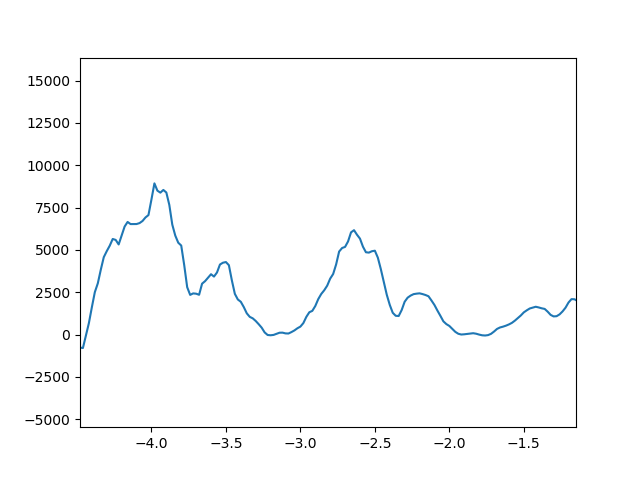

In [612]:
plt.figure()
i = 3
plt.plot(data188.srframe_volt_p1_set[0, :], gaussian_filter(data188.lockin865_X[i, :], 0.7)/1e-9)

Now plug in the temp cables and run it at a few temperatures.

Also made sure that temp channel 1 wasn't running

And temp channel 13 is running (magnet, only turn it on after turning on pid mode)

In [660]:
triton.pid_setpoint(0.05)

In [661]:
triton.pid_mode(1)

In [662]:
triton.pid_range(1)

In [618]:
triton.pid_range(10)

In [620]:
triton.pid_setpoint(0.3)

In [622]:
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data189, plot189 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_300mK_1nA')
srframe.volt_p1(0)

Started at 2020-03-06 15:23:05
Please wait 1210.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00199999999995 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.99 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.6 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-06/#008_W3_865_24-48_couplefields_300mK_1nA_15-23-04'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-06 17:48:37


In [623]:
triton.pid_setpoint(0.5)
time.sleep(360)

In [624]:
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data190, plot190 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_500mK_1nA')
srframe.volt_p1(0)

Started at 2020-03-06 17:54:39
Please wait 1209.5980000000002 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00199999999995 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.59400000000005 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-06/#009_W3_865_24-48_couplefields_500mK_1nA_17-54-38'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-06 20:27:36


In [625]:
triton.pid_setpoint(0.75)
time.sleep(480)
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data191, plot191 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_750mK_1nA')
srframe.volt_p1(0)

Started at 2020-03-06 20:35:39
Please wait 1209.604 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00199999999995 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00800000000004 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.58799999999997 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-06/#010_W3_865_24-48_couplefields_750mK_1nA_20-35-38'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-06 23:08:35


In [627]:
triton.pid_setpoint(1)
time.sleep(480)
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data192, plot192 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_1K_1nA')
srframe.volt_p1(0)

Started at 2020-03-08 15:58:22
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 609.988 seconds for the field sweep, plus the time required for operating the switch...
Please wait 609.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 609.394 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-08/#002_W3_865_24-48_couplefields_1K_1nA_15-58-20'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-08 18:20:25


In [639]:
triton.pid_range(31.6)

In [640]:
triton.pid_setpoint(1.25)

In [641]:
triton.pid_setpoint(1.25)
time.sleep(480)
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data193, plot193 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_1.25K_1nA')
srframe.volt_p1(0)

Started at 2020-03-09 10:39:44
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.67400000000004 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.392 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-09/#001_W3_865_24-48_couplefields_1.25K_1nA_10-39-43'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-09 12:46:24


In [642]:
triton.pid_range(100)
time.sleep(10)

In [643]:
triton.pid_setpoint(1.5)

In [644]:
triton.pid_setpoint(1.5)
time.sleep(480)
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data194, plot194 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_1.5K_1nA')
srframe.volt_p1(0)

Started at 2020-03-09 13:23:12
Please wait 887.758 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.67400000000004 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.386 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-09/#002_W3_865_24-48_couplefields_1.5K_1nA_13-23-11'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-09 15:45:20


In [645]:
triton.pid_setpoint(1.75)
time.sleep(480)
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data195, plot195 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_1.75K_1nA')
srframe.volt_p1(0)

Started at 2020-03-09 15:53:23
Please wait 887.758 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.392 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-09/#003_W3_865_24-48_couplefields_1.75K_1nA_15-53-21'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-09 18:15:37


In [646]:
triton.pid_setpoint(2)
time.sleep(480)
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data196, plot196 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_2K_1nA')
srframe.volt_p1(0)

Started at 2020-03-09 18:23:39
Please wait 887.764 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.686 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.392 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-09/#004_W3_865_24-48_couplefields_2K_1nA_18-23-38'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-09 20:46:03


In [647]:
triton.pid_mode(1)

In [648]:
triton.pid_range(100)

In [649]:
triton.pid_setpoint(3)
time.sleep(480)
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data197, plot197 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_3K_1nA')
srframe.volt_p1(0)

Started at 2020-03-09 21:45:29
Please wait 887.7520000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.392 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-09/#005_W3_865_24-48_couplefields_3K_1nA_21-45-28'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-10 00:07:36


In [650]:
triton.pid_setpoint(5)
time.sleep(480)
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data198, plot198 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_5K_1nA')
srframe.volt_p1(0)

Started at 2020-03-10 00:15:39
Please wait 887.7520000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.392 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-10/#001_W3_865_24-48_couplefields_5K_1nA_00-15-37'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-10 02:37:43


In [651]:
triton.pid_setpoint(7)
time.sleep(480)
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data199, plot199 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_7K_1nA')
srframe.volt_p1(0)

Started at 2020-03-10 02:45:45
Please wait 887.758 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.686 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.392 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-10/#002_W3_865_24-48_couplefields_7K_1nA_02-45-44'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-10 05:07:53


In [652]:
triton.pid_setpoint(10)
time.sleep(480)
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data200, plot200 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_10K_1nA')
srframe.volt_p1(0)

Started at 2020-03-10 05:15:55
Please wait 887.764 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.398 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-10/#003_W3_865_24-48_couplefields_10K_1nA_05-15-54'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-10 07:37:59


In [653]:
triton.pid_setpoint(15)
time.sleep(480)
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data201, plot201 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_15K_1nA')
srframe.volt_p1(0)

Started at 2020-03-10 07:46:02
Please wait 887.746 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.392 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-10/#004_W3_865_24-48_couplefields_15K_1nA_07-46-01'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-10 10:08:11


In [654]:
triton.pid_setpoint(20)
time.sleep(480)
fieldpts = [5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data202, plot202 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_20K_1nA')
srframe.volt_p1(0)

Started at 2020-03-10 10:16:13
Please wait 887.7520000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.386 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-10/#005_W3_865_24-48_couplefields_20K_1nA_10-16-12'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-10 12:38:21


In [693]:
triton.magnet_sweeprate(0.15)

In [656]:
triton.field()

7.999034

In [657]:
triton.field(0)

Sweep time approximately 3209.614 seconds


In [658]:
triton.field()

4.956984

We want to increase the density of temperature points around 2-10K.  
Do 2.5, 3.5, 4, 4.5, 6, 8, 9 K

In [682]:
triton.pid_setpoint(2.5)

In [681]:
triton.pid_range(100)

In [683]:
triton.pid_setpoint(2.5)
time.sleep(480)
fieldpts = [5, 5.5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data203, plot203 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_2.5K_1nA')
srframe.volt_p1(0)

Started at 2020-03-11 11:40:33
Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.99200000000002 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.98000000000002 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 409.6 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-11/#001_W3_865_24-48_couplefields_2.5K_1nA_11-40-31'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (5,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (5, 526)
   Measured | lockin865_X                 | X                | (5, 526)
   Measured | lockin865_Y                 | Y                | (5, 526)
Finished at 2020-03-11 14:19:55


In [684]:
triton.pid_setpoint(3.5)
time.sleep(480)
fieldpts = [5, 5.5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data204, plot204 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_3.5K_1nA')
srframe.volt_p1(0)

Started at 2020-03-11 14:27:57
Please wait 1209.5980000000002 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.99200000000002 seconds for the field sweep, plus the time required for operating the switch...
Please wait 156.334 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.67400000000004 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 302.392 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-11/#002_W3_865_24-48_couplefields_3.5K_1nA_14-27-56'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (5,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (5, 526)
   Measured | lockin865_X                 | X                | (5, 526)
   Measured | lockin865_Y                 | Y                | (5, 526)
Finished at 2020-03-11 17:24:02


In [687]:
 triton.pid_setpoint(4)
time.sleep(480)
fieldpts = [5, 5.5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data205, plot205 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_4K_1nA')
srframe.volt_p1(0)

Started at 2020-03-11 19:10:21
Please wait 156.34 seconds for the field sweep, plus the time required for operating the switch...
Please wait 156.34 seconds for the field sweep, plus the time required for operating the switch...
Please wait 156.346 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 302.386 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-11/#004_W3_865_24-48_couplefields_4K_1nA_19-10-20'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (5,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (5, 526)
   Measured | lockin865_X                 | X                | (5, 526)
   Measured | lockin865_Y                 | Y                | (5, 526)
Finished at 2020-03-11 21:47:09


In [688]:
 triton.pid_setpoint(4.5)
time.sleep(480)
fieldpts = [5, 5.5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data206, plot206 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_4.5K_1nA')
srframe.volt_p1(0)

Started at 2020-03-11 21:55:11
Please wait 887.764 seconds for the field sweep, plus the time required for operating the switch...
Please wait 156.346 seconds for the field sweep, plus the time required for operating the switch...
Please wait 156.352 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.686 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 302.386 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-11/#005_W3_865_24-48_couplefields_4.5K_1nA_21-55-10'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (5,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (5, 526)
   Measured | lockin865_X                 | X                | (5, 526)
   Measured | lockin865_Y                 | Y                | (5, 526)
Finished at 2020-03-12 00:45:00


In [689]:
 triton.pid_setpoint(5.5)
time.sleep(480)
fieldpts = [5, 5.5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data207, plot206 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_4.5K_1nA')
srframe.volt_p1(0)

Started at 2020-03-12 00:53:03
Please wait 887.758 seconds for the field sweep, plus the time required for operating the switch...
Please wait 156.34 seconds for the field sweep, plus the time required for operating the switch...
Please wait 156.334 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 302.392 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-12/#001_W3_865_24-48_couplefields_4.5K_1nA_00-53-01'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (5,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (5, 526)
   Measured | lockin865_X                 | X                | (5, 526)
   Measured | lockin865_Y                 | Y                | (5, 526)
Finished at 2020-03-12 03:42:46


In [690]:
 triton.pid_setpoint(6)
time.sleep(480)
fieldpts = [5, 5.5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data208, plot208 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_6K_1nA')
srframe.volt_p1(0)

Started at 2020-03-12 03:50:48
Please wait 887.7520000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 156.334 seconds for the field sweep, plus the time required for operating the switch...
Please wait 156.334 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 302.37399999999997 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-12/#002_W3_865_24-48_couplefields_6K_1nA_03-50-47'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (5,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (5, 526)
   Measured | lockin865_X                 | X                | (5, 526)
   Measured | lockin865_Y                 | Y                | (5, 526)
Finished at 2020-03-12 06:40:42


In [691]:
 triton.pid_setpoint(8)
time.sleep(480)
fieldpts = [5, 5.5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data209, plot209 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_8K_1nA')
srframe.volt_p1(0)

Started at 2020-03-12 06:48:44
Please wait 887.746 seconds for the field sweep, plus the time required for operating the switch...
Please wait 156.334 seconds for the field sweep, plus the time required for operating the switch...
Please wait 156.34 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 302.38 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-12/#003_W3_865_24-48_couplefields_8K_1nA_06-48-43'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (5,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (5, 526)
   Measured | lockin865_X                 | X                | (5, 526)
   Measured | lockin865_Y                 | Y                | (5, 526)
Finished at 2020-03-12 09:38:29


In [692]:
 triton.pid_setpoint(9)
time.sleep(480)
fieldpts = [5, 5.5, 6, 7, 7.999]  # 7.999 so it doesn't get stuck
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data210, plot210 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_couplefields_9K_1nA')
srframe.volt_p1(0)

Started at 2020-03-12 09:46:32
Please wait 887.764 seconds for the field sweep, plus the time required for operating the switch...
Please wait 156.334 seconds for the field sweep, plus the time required for operating the switch...
Please wait 156.34 seconds for the field sweep, plus the time required for operating the switch...
Please wait 302.68 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 302.392 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-12/#004_W3_865_24-48_couplefields_9K_1nA_09-46-31'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (5,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (5, 526)
   Measured | lockin865_X                 | X                | (5, 526)
   Measured | lockin865_Y                 | Y                | (5, 526)
Finished at 2020-03-12 12:36:13


In [695]:
# low field landau fan sweep

In [696]:
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
# first one at base temp (magnet temp cable plugged in but other cables unplugged)
data211, plot211 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_baseT_1nA')
srframe.volt_p1(0)

Started at 2020-03-12 19:12:03
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-12/#005_W3_865_24-48_2-4T_baseT_1nA_19-12-02'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-12 21:09:46


In [705]:
triton.pid_setpoint(0.05)

In [698]:
triton.pid_mode(1)

In [706]:
triton.pid_range(10)

In [709]:
triton.pid_setpoint(0.25)

In [710]:
triton.pid_setpoint(0.25)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data212, plot212 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_250mK_1nA')
srframe.volt_p1(0)

Started at 2020-03-12 21:46:11
Please wait 810.0039999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00199999999995 seconds for the field sweep, plus the time required for operating the switch...
Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 210.01 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-12/#006_W3_865_24-48_2-4T_250mK_1nA_21-46-10'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-12 23:57:42


In [711]:
triton.pid_setpoint(0.5)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data213, plot213 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_500mK_1nA')
srframe.volt_p1(0)

Started at 2020-03-13 00:05:44
Please wait 810.01 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00199999999995 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.99200000000002 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.99200000000002 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-13/#001_W3_865_24-48_2-4T_500mK_1nA_00-05-43'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-13 02:17:23


In [712]:
triton.pid_setpoint(0.75)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data214, plot214 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_750mK_1nA')
srframe.volt_p1(0)

Started at 2020-03-13 02:25:26
Please wait 809.9979999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.99 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.99200000000002 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.986 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-13/#002_W3_865_24-48_2-4T_750mK_1nA_02-25-24'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-13 04:36:57


In [713]:
triton.pid_setpoint(1)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data215, plot215 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_1K_1nA')
srframe.volt_p1(0)

Started at 2020-03-13 04:45:00
Please wait 810.0160000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.99200000000002 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 210.01 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-13/#003_W3_865_24-48_2-4T_1K_1nA_04-44-58'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-13 06:56:31


In [714]:
triton.pid_range(31.6)

In [715]:
triton.pid_setpoint(1.25)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data216, plot216 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_1.25K_1nA')
srframe.volt_p1(0)

Started at 2020-03-13 07:04:34
Please wait 809.9979999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00199999999995 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.99200000000002 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 210.01 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-13/#004_W3_865_24-48_2-4T_1.25K_1nA_07-04-32'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-13 09:17:25


In [716]:
triton.pid_range(100)
time.sleep(10)

In [717]:
triton.pid_setpoint(1.5)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data217, plot217 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_1.5K_1nA')
srframe.volt_p1(0)

Started at 2020-03-13 09:25:38
Please wait 809.9979999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00199999999995 seconds for the field sweep, plus the time required for operating the switch...
Please wait 210.01 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-13/#005_W3_865_24-48_2-4T_1.5K_1nA_09-25-36'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-13 11:37:08


In [718]:
triton.pid_setpoint(1.75)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data218, plot218 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_1.75K_1nA')
srframe.volt_p1(0)

Started at 2020-03-13 11:45:11
Please wait 809.992 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-13/#006_W3_865_24-48_2-4T_1.75K_1nA_11-45-09'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-13 13:56:44


In [719]:
triton.pid_setpoint(2)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data219, plot219 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_2K_1nA')
srframe.volt_p1(0)

Started at 2020-03-13 14:04:46
Please wait 810.0039999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.99 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.99200000000002 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.986 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-13/#007_W3_865_24-48_2-4T_2K_1nA_14-04-45'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-13 16:16:30


In [720]:
triton.pid_setpoint(2.5)

In [721]:
triton.pid_setpoint(2.5)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data220, plot220 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_2.5K_1nA')
srframe.volt_p1(0)

Started at 2020-03-13 16:48:08
Please wait 810.01 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.99200000000002 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 210.01 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-13/#008_W3_865_24-48_2-4T_2.5K_1nA_16-48-06'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-13 18:59:40


In [724]:
triton.pid_setpoint(3)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data221, plot221 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_3K_1nA')
srframe.volt_p1(0)

Started at 2020-03-13 19:49:07
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00199999999995 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-13/#010_W3_865_24-48_2-4T_3K_1nA_19-49-05'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-13 21:46:37


In [725]:
triton.pid_setpoint(3.5)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data222, plot222 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_3.5K_1nA')
srframe.volt_p1(0)

Started at 2020-03-13 21:54:39
Please wait 810.0039999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-13/#011_W3_865_24-48_2-4T_3.5K_1nA_21-54-38'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-14 00:06:13


In [726]:
triton.pid_setpoint(4)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data223, plot223 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_4K_1nA')
srframe.volt_p1(0)

Started at 2020-03-14 00:14:15
Please wait 809.9979999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00199999999995 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.986 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-14/#001_W3_865_24-48_2-4T_4K_1nA_00-14-14'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-14 02:25:47


In [727]:
triton.pid_setpoint(4.5)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data224, plot224 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_4.5K_1nA')
srframe.volt_p1(0)

Started at 2020-03-14 02:33:50
Please wait 809.9979999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.99200000000002 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-14/#002_W3_865_24-48_2-4T_4.5K_1nA_02-33-48'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-14 04:45:21


In [728]:
triton.pid_setpoint(5)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data225, plot225 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_5K_1nA')
srframe.volt_p1(0)

Started at 2020-03-14 04:53:23
Please wait 810.01 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.99200000000002 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-14/#003_W3_865_24-48_2-4T_5K_1nA_04-53-22'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-14 07:04:54


In [729]:
triton.pid_setpoint(5.5)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data226, plot226 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_5.5K_1nA')
srframe.volt_p1(0)

Started at 2020-03-14 07:12:57
Please wait 810.0039999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 210.01 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-14/#004_W3_865_24-48_2-4T_5.5K_1nA_07-12-56'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-14 09:24:26


In [730]:
triton.pid_setpoint(6)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data227, plot227 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_6K_1nA')
srframe.volt_p1(0)

Started at 2020-03-14 09:32:29
Please wait 810.0039999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00199999999995 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.986 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-14/#005_W3_865_24-48_2-4T_6K_1nA_09-32-28'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-14 11:44:12


In [731]:
triton.pid_setpoint(7)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data228, plot228 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_7K_1nA')
srframe.volt_p1(0)

Started at 2020-03-14 11:52:14
Please wait 809.9979999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00199999999995 seconds for the field sweep, plus the time required for operating the switch...
Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-14/#006_W3_865_24-48_2-4T_7K_1nA_11-52-13'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-14 14:03:46


In [732]:
triton.pid_setpoint(8)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data229, plot229 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_8K_1nA')
srframe.volt_p1(0)

Started at 2020-03-14 14:11:48
Please wait 810.0039999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-14/#007_W3_865_24-48_2-4T_8K_1nA_14-11-47'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-14 16:23:18


In [733]:
triton.pid_setpoint(9)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data230, plot230 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_9K_1nA')
srframe.volt_p1(0)

Started at 2020-03-14 16:31:21
Please wait 810.0039999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 210.01 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 210.01 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-14/#008_W3_865_24-48_2-4T_9K_1nA_16-31-19'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-14 18:43:07


In [734]:
triton.pid_setpoint(10)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data231, plot231 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_10K_1nA')
srframe.volt_p1(0)

Started at 2020-03-14 18:51:09
Please wait 809.9979999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-14/#009_W3_865_24-48_2-4T_10K_1nA_18-51-08'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-14 21:02:40


In [735]:
triton.pid_setpoint(12)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data232, plot232 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_12K_1nA')
srframe.volt_p1(0)

Started at 2020-03-14 21:10:42
Please wait 809.992 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00800000000004 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.99200000000002 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.974 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-14/#010_W3_865_24-48_2-4T_12K_1nA_21-10-41'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-14 23:22:19


In [736]:
triton.pid_setpoint(13)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data233, plot233 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_13K_1nA')
srframe.volt_p1(0)

Started at 2020-03-14 23:30:22
Please wait 810.0039999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00800000000004 seconds for the field sweep, plus the time required for operating the switch...
Please wait 210.01 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-14/#011_W3_865_24-48_2-4T_13K_1nA_23-30-21'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-15 01:42:13


In [737]:
triton.pid_setpoint(15)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data234, plot234 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_15K_1nA')
srframe.volt_p1(0)

Started at 2020-03-15 01:50:15
Please wait 809.9979999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 409.996 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-15/#001_W3_865_24-48_2-4T_15K_1nA_01-50-14'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-15 04:01:46


In [738]:
triton.pid_setpoint(17)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data235, plot235 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_17K_1nA')
srframe.volt_p1(0)

Started at 2020-03-15 04:09:48
Please wait 810.0160000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00199999999995 seconds for the field sweep, plus the time required for operating the switch...
Please wait 209.998 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 209.986 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-15/#002_W3_865_24-48_2-4T_17K_1nA_04-09-47'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-15 06:21:30


In [739]:
triton.pid_setpoint(20)
time.sleep(480)
fieldpts = [2, 3, 3.5, 4]
# just cover the main area between -3/4 and +3/4
gvals = np.linspace(-5, 5.5, 526)
data236, plot236 = npd.twod_param_sweep(triton.field_set_stable, fieldpts, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, SetDelay1=15, SetDelay2=1.4, Param2_SetBetween=0, DataName='W3_865_24-48_2-4T_20K_1nA')
srframe.volt_p1(0)

Started at 2020-03-15 06:29:32
Please wait 810.0039999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 410.00199999999995 seconds for the field sweep, plus the time required for operating the switch...
Please wait 210.01 seconds for the field sweep, plus the time required for operating the switch...


c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '
c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py:409: UserWarning: nonlinear setpoint array passed to pyqtgraph. ignoring, using default scaling.
  warnings.warn('nonlinear setpoint array passed to pyqtgraph. '


Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-03-15/#003_W3_865_24-48_2-4T_20K_1nA_06-29-31'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (4,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (4, 526)
   Measured | lockin865_X                 | X                | (4, 526)
   Measured | lockin865_Y                 | Y                | (4, 526)
Finished at 2020-03-15 08:41:28


In [740]:
triton.magnet_sweeprate(0.15)

In [741]:
triton.field(0)

Sweep time approximately 1610.002 seconds


In [742]:
triton.pid_mode(0)

In [743]:
# full cooldown for M26 hysteresis T dependence

In [766]:
triton.read_temps()

MC - on:  0.0447649 K
MC_cernox - on:  321.181 K
still - on:  0.923302 K
cold_plate - on:  0.10865 K
magnet - on:  3.90458 K
PT2h - on:  3.23959 K
PT2p - on:  3.44068 K
PT1h - on:  47.8904 K
PT1p - on:  61.1009 K


# M26 hysteresis temeprature dependence

In [771]:
#9 and 5 for source and drain, using lockin 865 only, Rxx 10-3, excitation 0.5 nA, frequency 7.7717Hz, excitation 0.3nA, 300ms

In [772]:
# quick gate voltage sweep check with 0.3 nA excitation, with the same configuration as we have for the hysteresis check
gvals = np.linspace(0, 10, 101)
data237, plot237 = npd.single_param_sweep(srframe.volt_p1, gvals, 10, lockin865.X, lockin865.Y, DataName='M26_gatsweep_865_10-3_0p3nA')

Started at 2020-03-15 15:40:12
DataSet:
   location = 'data/2020-03-15/#004_M26_gatsweep_865_10-3_0p3nA_15-40-11'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (101,)
   Measured | lockin865_X         | X            | (101,)
   Measured | lockin865_Y         | Y            | (101,)
Finished at 2020-03-15 15:57:29


In [773]:
srframe.volt_p1(0)

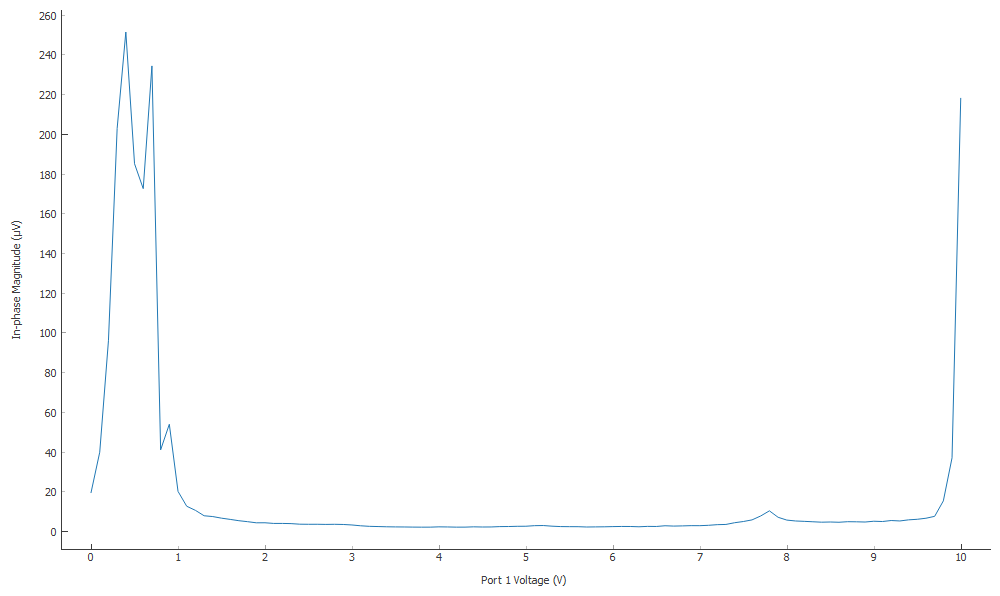

In [775]:
plot237[0] #seems fine

In [776]:
srframe.volt_p1(7.8)
triton.magnet_sweeprate(0.1)
triton.field_set_stable(-1) # train the magnet by going over the expected value this time
triton.field_set_stable(-0.5)

Please wait 610.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 310.0 seconds for the field sweep, plus the time required for operating the switch...


In [778]:
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.05)
triton.field(0.5)
data238, plot238 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p3nA', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1209.994 seconds
Started at 2020-03-15 16:33:58
DataSet:
   location = 'data/2020-03-15/#005_M26_hysteresisupVbg7p8_865_10-3_0p3nA_16-33-57'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 16:54:17


In [779]:
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data239, plot239 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p3nA', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1210.018 seconds
Started at 2020-03-15 16:54:23
DataSet:
   location = 'data/2020-03-15/#006_M26_hysteresisupVbg7p8_865_10-3_0p3nA_16-54-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 17:14:42


<IPython.core.display.Javascript object>


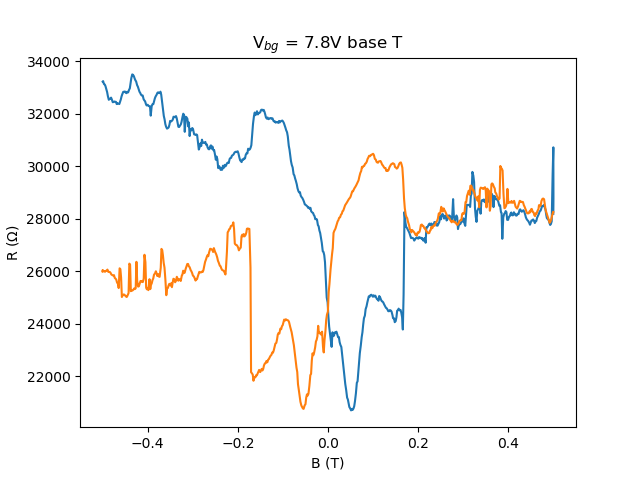

Text(0, 0.5, 'R ($\\Omega$)')

In [781]:
plt.figure()
plt.plot(data238.triton_field, data238.lockin865_X[:]/0.3e-9, label='up')
plt.plot(data239.triton_field, data239.lockin865_X[:]/0.3e-9, label='down')
plt.title('V$_{bg}$ = 7.8V base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [782]:
srframe.volt_p1(7.9)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data240, plot240 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p9_865_10-3_0p3nA_base T', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-15 17:29:48
DataSet:
   location = 'data/2020-03-15/#007_M26_hysteresisupVbg7p9_865_10-3_0p3nA_base T_17-29-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 17:40:05


In [783]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data241, plot241 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p9_865_10-3_0p3nA', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-15 17:40:10
DataSet:
   location = 'data/2020-03-15/#008_M26_hysteresisupVbg7p9_865_10-3_0p3nA_17-40-10'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 17:50:27


<IPython.core.display.Javascript object>


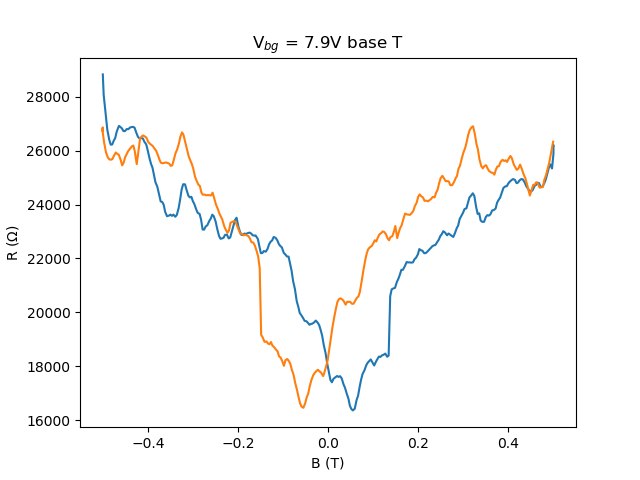

Text(0, 0.5, 'R ($\\Omega$)')

In [784]:
plt.figure()
plt.plot(data240.triton_field, data240.lockin865_X[:]/0.3e-9, label='up')
plt.plot(data241.triton_field, data241.lockin865_X[:]/0.3e-9, label='down')
plt.title('V$_{bg}$ = 7.9V base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [785]:
# try 0.5nA

In [786]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data242, plot242 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_base T', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-15 17:56:14
DataSet:
   location = 'data/2020-03-15/#009_M26_hysteresisupVbg7p85_865_10-3_0p5nA_base T_17-56-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 18:06:33


In [787]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data243, plot243 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-15 18:06:38
DataSet:
   location = 'data/2020-03-15/#010_M26_hysteresisupVbg7p85_865_10-3_0p5nA_18-06-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 18:16:56


<IPython.core.display.Javascript object>


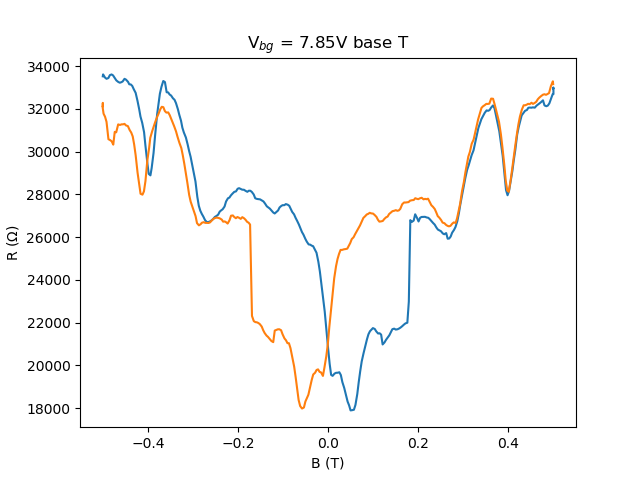

Text(0, 0.5, 'R ($\\Omega$)')

In [788]:
plt.figure()
plt.plot(data242.triton_field, data242.lockin865_X[:]/0.5e-9, label='up')
plt.plot(data243.triton_field, data243.lockin865_X[:]/0.5e-9, label='down')
plt.title('V$_{bg}$ = 7.85V base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [789]:
srframe.volt_p1(7.75)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data244, plot244 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p75_865_10-3_0p5nA_base T', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-15 18:27:57
DataSet:
   location = 'data/2020-03-15/#011_M26_hysteresisupVbg7p75_865_10-3_0p5nA_base T_18-27-57'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 18:38:16
Request timed out: ('callObj', 202081, 0, b'\x80\x03}q\x00(X\x03\x00\x00\x00objq\x01cpyqtgraph.multiprocess.remoteproxy\nunpickleObjectProxy\nq\x02(M\x08\x06J\x11\x9f\x01\x00X>\x00\x00\x00<built-in method save of QPixmap object at 0x000002409E51D048>q\x03)tq\x04Rq\x05X\x04\x00\x00\x00argsq\x06]q\x07(XO\x00\x00\x00data/2020-03-15/#011_M26_hysteresisupVbg7p75_865_10-3_0p5nA_base T_18-27-57.pngq\x08X\x03\x00\x00\x00PNGq\tK\x00eX\x04\x00\x00\x00kwdsq\n}q\x0bX\n\x00\x00\x00retu

  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel\kernelapp.py", line 505, in start
    self.io_loop.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\tornado\platform\asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 438, in run_forever
    self._run_once()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 1451, in _ru

In [790]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data245, plot245 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p75_865_10-3_0p5nA', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-15 18:38:35
DataSet:
   location = 'data/2020-03-15/#012_M26_hysteresisupVbg7p75_865_10-3_0p5nA_18-38-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 18:48:52


<IPython.core.display.Javascript object>


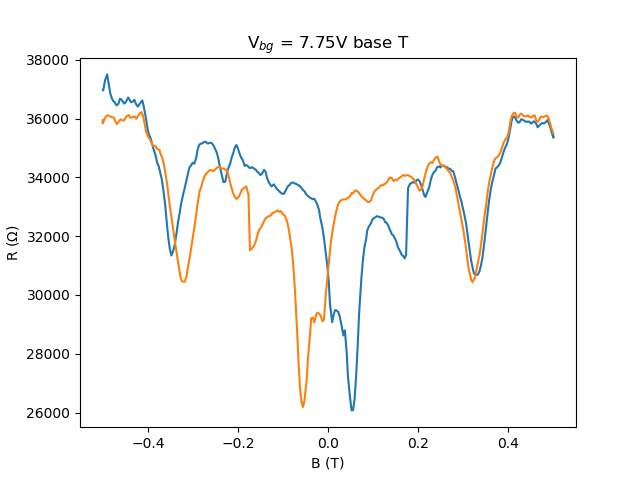

Text(0, 0.5, 'R ($\\Omega$)')

In [791]:
plt.figure()
plt.plot(data244.triton_field, data244.lockin865_X[:]/0.5e-9, label='up')
plt.plot(data245.triton_field, data245.lockin865_X[:]/0.5e-9, label='down')
plt.title('V$_{bg}$ = 7.75V base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [792]:
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data246, plot246 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_base T', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-15 18:56:57
DataSet:
   location = 'data/2020-03-15/#013_M26_hysteresisupVbg7p8_865_10-3_0p5nA_base T_18-56-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 19:07:12


In [793]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data247, plot247 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-15 19:07:19
DataSet:
   location = 'data/2020-03-15/#014_M26_hysteresisupVbg7p8_865_10-3_0p5nA_19-07-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 19:17:37


<IPython.core.display.Javascript object>


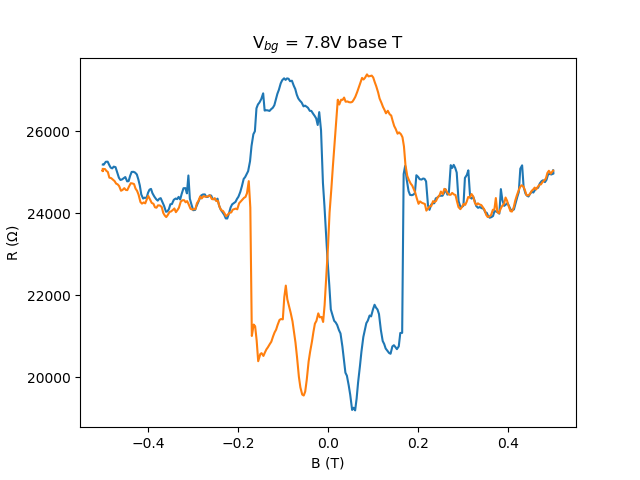

Text(0, 0.5, 'R ($\\Omega$)')

In [794]:
plt.figure()
plt.plot(data246.triton_field, data246.lockin865_X[:]/0.5e-9, label='up')
plt.plot(data247.triton_field, data247.lockin865_X[:]/0.5e-9, label='down')
plt.title('V$_{bg}$ = 7.8V base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [795]:
# try slower field speed

In [796]:
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.05)
triton.field(0.5)
data248, plot248 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_base T', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1210.012 seconds
Started at 2020-03-15 19:23:21
DataSet:
   location = 'data/2020-03-15/#015_M26_hysteresisupVbg7p8_865_10-3_0p5nA_base T_19-23-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 19:43:39


In [797]:
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data249, plot249 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 1209.988 seconds
Started at 2020-03-15 19:43:46
DataSet:
   location = 'data/2020-03-15/#016_M26_hysteresisupVbg7p8_865_10-3_0p5nA_19-43-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 20:04:07


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


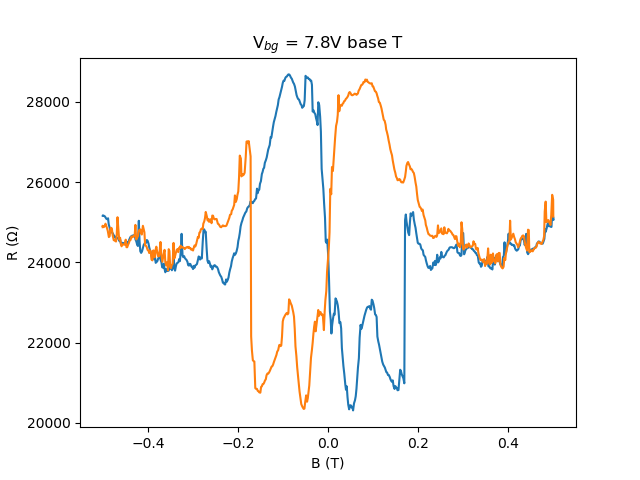

Text(0, 0.5, 'R ($\\Omega$)')

In [798]:
plt.figure()
plt.plot(data248.triton_field, data248.lockin865_X[:]/0.5e-9, label='up')
plt.plot(data249.triton_field, data249.lockin865_X[:]/0.5e-9, label='down')
plt.title('V$_{bg}$ = 7.8V base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [799]:
#data seems better with 0.5nA and quick sweep

In [800]:
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data250, plot250 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_base T', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data251, plot251 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_base T', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-15 20:34:22
DataSet:
   location = 'data/2020-03-15/#017_M26_hysteresisupVbg7p8_865_10-3_0p5nA_base T_20-34-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 20:44:39
Sweep time approximately 610.012 seconds
Started at 2020-03-15 20:44:45
DataSet:
   location = 'data/2020-03-15/#018_M26_hysteresisupVbg7p8_865_10-3_0p5nA_base T_20-44-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y          

In [801]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data252, plot252 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_base T', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data253, plot253 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_base T', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-15 20:55:29
DataSet:
   location = 'data/2020-03-15/#019_M26_hysteresisupVbg7p85_865_10-3_0p5nA_base T_20-55-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 21:05:45
Sweep time approximately 610.006 seconds
Started at 2020-03-15 21:05:52
DataSet:
   location = 'data/2020-03-15/#020_M26_hysteresisupVbg7p85_865_10-3_0p5nA_base T_21-05-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y        

In [805]:
triton.pid_setpoint(0.05)
triton.pid_mode(1)
triton.pid_range(1)

In [806]:
triton.pid_range(10)

In [807]:
triton.pid_setpoint(0.1)

In [808]:
triton.pid_setpoint(0.1)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data254, plot254 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_100mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data255, plot255 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_100mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-15 21:48:20
DataSet:
   location = 'data/2020-03-15/#021_M26_hysteresisupVbg7p8_865_10-3_0p5nA_100mK_21-48-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 21:58:37
Sweep time approximately 610.006 seconds
Started at 2020-03-15 21:58:43
DataSet:
   location = 'data/2020-03-15/#022_M26_hysteresisupVbg7p8_865_10-3_0p5nA_100mK_21-58-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [809]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data256, plot256 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_100mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data257, plot257 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_100mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-15 22:09:27
DataSet:
   location = 'data/2020-03-15/#023_M26_hysteresisupVbg7p85_865_10-3_0p5nA_100mK_22-09-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 22:19:44
Sweep time approximately 610.0 seconds
Started at 2020-03-15 22:19:50
DataSet:
   location = 'data/2020-03-15/#024_M26_hysteresisupVbg7p85_865_10-3_0p5nA_100mK_22-19-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [812]:
triton.pid_setpoint(0.2)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data258, plot258 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_200mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data259, plot259 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_200mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-15 22:39:34
DataSet:
   location = 'data/2020-03-15/#025_M26_hysteresisupVbg7p8_865_10-3_0p5nA_200mK_22-39-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 22:49:51
Sweep time approximately 610.006 seconds
Started at 2020-03-15 22:49:57
DataSet:
   location = 'data/2020-03-15/#026_M26_hysteresisupVbg7p8_865_10-3_0p5nA_200mK_22-49-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [813]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data260, plot260 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_200mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data261, plot261 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_200mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-15 23:00:39
DataSet:
   location = 'data/2020-03-15/#027_M26_hysteresisupVbg7p85_865_10-3_0p5nA_200mK_23-00-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 23:10:57
Sweep time approximately 610.006 seconds
Started at 2020-03-15 23:11:03
DataSet:
   location = 'data/2020-03-15/#028_M26_hysteresisupVbg7p85_865_10-3_0p5nA_200mK_23-11-02'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y          

In [816]:
triton.pid_setpoint(0.3)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data262, plot262 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_300mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data263, plot263 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_300mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-15 23:30:17
DataSet:
   location = 'data/2020-03-15/#029_M26_hysteresisupVbg7p8_865_10-3_0p5nA_300mK_23-30-16'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-15 23:40:34
Sweep time approximately 610.0 seconds
Started at 2020-03-15 23:40:40
DataSet:
   location = 'data/2020-03-15/#030_M26_hysteresisupVbg7p8_865_10-3_0p5nA_300mK_23-40-39'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1

In [817]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data264, plot264 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_300mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data265, plot265 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_300mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-15 23:51:23
DataSet:
   location = 'data/2020-03-15/#031_M26_hysteresisupVbg7p85_865_10-3_0p5nA_300mK_23-51-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 00:01:40
Sweep time approximately 610.0 seconds
Started at 2020-03-16 00:01:47
DataSet:
   location = 'data/2020-03-16/#001_M26_hysteresisupVbg7p85_865_10-3_0p5nA_300mK_00-01-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [820]:
triton.pid_setpoint(0.4)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data266, plot266 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_400mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data267, plot267 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_400mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-16 00:27:56
DataSet:
   location = 'data/2020-03-16/#002_M26_hysteresisupVbg7p8_865_10-3_0p5nA_400mK_00-27-55'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 00:38:14
Sweep time approximately 609.994 seconds
Started at 2020-03-16 00:38:20
DataSet:
   location = 'data/2020-03-16/#003_M26_hysteresisupVbg7p8_865_10-3_0p5nA_400mK_00-38-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [821]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data268, plot268 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_400mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data269, plot269 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_400mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-16 00:49:03
DataSet:
   location = 'data/2020-03-16/#004_M26_hysteresisupVbg7p85_865_10-3_0p5nA_400mK_00-49-02'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 00:59:21
Sweep time approximately 610.012 seconds
Started at 2020-03-16 00:59:27
DataSet:
   location = 'data/2020-03-16/#005_M26_hysteresisupVbg7p85_865_10-3_0p5nA_400mK_00-59-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [18]:
triton.pid_setpoint(0.5)
# time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data270, plot270 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_500mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data271, plot271 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_500mK', XParam=triton.field, YParam=lockin865.X)

Are you sure you want to use the magnet? [y/n]: y
Sweep time approximately 610.0 seconds
Started at 2020-03-16 10:17:30
DataSet:
   location = 'data/2020-03-16/#006_M26_hysteresisupVbg7p8_865_10-3_0p5nA_500mK_10-17-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 10:27:43
Sweep time approximately 610.012 seconds
Started at 2020-03-16 10:27:50
DataSet:
   location = 'data/2020-03-16/#007_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_500mK_10-27-50'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | 

In [19]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data272, plot272 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_500mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data273, plot273 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_500mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-16 10:38:32
DataSet:
   location = 'data/2020-03-16/#008_M26_hysteresisupVbg7p85_865_10-3_0p5nA_500mK_10-38-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 10:48:50
Sweep time approximately 610.0 seconds
Started at 2020-03-16 10:48:56
DataSet:
   location = 'data/2020-03-16/#009_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_500mK_10-48-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y          

In [20]:
triton.pid_setpoint(0.6)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data274, plot274 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_600mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data275, plot275 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_600mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-16 11:07:40
DataSet:
   location = 'data/2020-03-16/#010_M26_hysteresisupVbg7p8_865_10-3_0p5nA_600mK_11-07-40'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 11:17:56
Sweep time approximately 610.012 seconds
Started at 2020-03-16 11:18:02
DataSet:
   location = 'data/2020-03-16/#011_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_600mK_11-18-02'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [21]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data276, plot276 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_600mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data277, plot277 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_600mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-16 11:28:45
DataSet:
   location = 'data/2020-03-16/#012_M26_hysteresisupVbg7p85_865_10-3_0p5nA_600mK_11-28-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 11:39:01
Sweep time approximately 610.006 seconds
Started at 2020-03-16 11:39:08
DataSet:
   location = 'data/2020-03-16/#013_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_600mK_11-39-08'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y        

In [23]:
triton.pid_setpoint(0.7)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data278, plot278 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_700mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data279, plot279 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_700mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-16 11:57:52
DataSet:
   location = 'data/2020-03-16/#014_M26_hysteresisupVbg7p8_865_10-3_0p5nA_700mK_11-57-51'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 12:08:09
Sweep time approximately 610.012 seconds
Started at 2020-03-16 12:08:15
DataSet:
   location = 'data/2020-03-16/#015_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_700mK_12-08-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [24]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data280, plot280 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_700mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data281, plot281 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_700mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-16 12:18:58
DataSet:
   location = 'data/2020-03-16/#016_M26_hysteresisupVbg7p85_865_10-3_0p5nA_700mK_12-18-57'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 12:29:15
Sweep time approximately 610.006 seconds
Started at 2020-03-16 12:29:22
DataSet:
   location = 'data/2020-03-16/#017_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_700mK_12-29-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y          

In [25]:
triton.pid_setpoint(0.8)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data282, plot282 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_800mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data283, plot283 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_800mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-16 12:48:06
DataSet:
   location = 'data/2020-03-16/#018_M26_hysteresisupVbg7p8_865_10-3_0p5nA_800mK_12-48-06'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 12:58:24
Sweep time approximately 610.012 seconds
Started at 2020-03-16 12:58:30
DataSet:
   location = 'data/2020-03-16/#019_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_800mK_12-58-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y          

In [26]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data284, plot284 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_800mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data285, plot285 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_800mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-16 13:09:13
DataSet:
   location = 'data/2020-03-16/#020_M26_hysteresisupVbg7p85_865_10-3_0p5nA_800mK_13-09-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 13:19:30
Sweep time approximately 610.0 seconds
Started at 2020-03-16 13:19:36
DataSet:
   location = 'data/2020-03-16/#021_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_800mK_13-19-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [27]:
triton.pid_setpoint(0.9)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data286, plot286 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_900mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data287, plot287 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_900mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-16 13:38:21
DataSet:
   location = 'data/2020-03-16/#022_M26_hysteresisupVbg7p8_865_10-3_0p5nA_900mK_13-38-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 13:48:38
Sweep time approximately 610.0 seconds
Started at 2020-03-16 13:48:44
DataSet:
   location = 'data/2020-03-16/#023_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_900mK_13-48-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [28]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data288, plot288 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_900mK', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data289, plot289 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_900mK', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-16 13:59:27
DataSet:
   location = 'data/2020-03-16/#024_M26_hysteresisupVbg7p85_865_10-3_0p5nA_900mK_13-59-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 14:09:44
Sweep time approximately 610.006 seconds
Started at 2020-03-16 14:09:50
DataSet:
   location = 'data/2020-03-16/#025_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_900mK_14-09-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y        

In [29]:
triton.pid_setpoint(1)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data290, plot290 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_1K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data291, plot291 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_1K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-16 14:28:34
DataSet:
   location = 'data/2020-03-16/#026_M26_hysteresisupVbg7p8_865_10-3_0p5nA_1K_14-28-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 14:38:50
Sweep time approximately 610.006 seconds
Started at 2020-03-16 14:38:57
DataSet:
   location = 'data/2020-03-16/#027_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_1K_14-38-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1

In [30]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data292, plot292 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_1K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data293, plot293 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_1K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-16 14:49:39
DataSet:
   location = 'data/2020-03-16/#028_M26_hysteresisupVbg7p85_865_10-3_0p5nA_1K_14-49-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 14:59:56
Sweep time approximately 610.0 seconds
Started at 2020-03-16 15:00:01
DataSet:
   location = 'data/2020-03-16/#029_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_1K_15-00-01'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (120

In [32]:
triton.pid_range(31.6)
time.sleep(3)

In [33]:
triton.pid_setpoint(1.1)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data294, plot294 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_1.1K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data295, plot295 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_1.1K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-16 15:21:56
DataSet:
   location = 'data/2020-03-16/#030_M26_hysteresisupVbg7p8_865_10-3_0p5nA_1.1K_15-21-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 15:32:14
Sweep time approximately 610.006 seconds
Started at 2020-03-16 15:32:20
DataSet:
   location = 'data/2020-03-16/#031_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_1.1K_15-32-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [34]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data296, plot296 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_1.1K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data297, plot297 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_1.1K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-16 15:43:04
DataSet:
   location = 'data/2020-03-16/#032_M26_hysteresisupVbg7p85_865_10-3_0p5nA_1.1K_15-43-04'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 15:53:21
Sweep time approximately 610.0 seconds
Started at 2020-03-16 15:53:27
DataSet:
   location = 'data/2020-03-16/#033_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_1.1K_15-53-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [35]:
triton.pid_setpoint(1.2)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data298, plot298 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_1.2K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data299, plot299 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_1.2K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-16 16:12:12
DataSet:
   location = 'data/2020-03-16/#034_M26_hysteresisupVbg7p8_865_10-3_0p5nA_1.2K_16-12-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 16:22:29
Sweep time approximately 610.006 seconds
Started at 2020-03-16 16:22:35
DataSet:
   location = 'data/2020-03-16/#035_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_1.2K_16-22-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [36]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data300, plot300 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_1.2K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data301, plot301 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_1.2K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-16 16:33:17
DataSet:
   location = 'data/2020-03-16/#036_M26_hysteresisupVbg7p85_865_10-3_0p5nA_1.2K_16-33-17'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 16:43:35
Sweep time approximately 610.0 seconds
Started at 2020-03-16 16:43:41
DataSet:
   location = 'data/2020-03-16/#037_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_1.2K_16-43-41'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [37]:
triton.pid_setpoint(1.3)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data302, plot302 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_1.3K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data303, plot303 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_1.3K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-16 17:02:26
DataSet:
   location = 'data/2020-03-16/#038_M26_hysteresisupVbg7p8_865_10-3_0p5nA_1.3K_17-02-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 17:12:42
Sweep time approximately 610.0 seconds
Started at 2020-03-16 17:12:48
DataSet:
   location = 'data/2020-03-16/#039_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_1.3K_17-12-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [38]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data304, plot304 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_1.3K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data305, plot305 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_1.3K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-16 17:23:32
DataSet:
   location = 'data/2020-03-16/#040_M26_hysteresisupVbg7p85_865_10-3_0p5nA_1.3K_17-23-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 17:33:49
Sweep time approximately 610.0 seconds
Started at 2020-03-16 17:33:56
DataSet:
   location = 'data/2020-03-16/#041_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_1.3K_17-33-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [63]:
triton.pid_range(100)
time.sleep(10)

In [64]:
triton.pid_setpoint(1.5)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data306, plot306 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_1.5K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data307, plot307 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_1.5K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-16 18:18:52
DataSet:
   location = 'data/2020-03-16/#042_M26_hysteresisupVbg7p8_865_10-3_0p5nA_1.5K_18-18-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 18:29:09
Sweep time approximately 610.0 seconds
Started at 2020-03-16 18:29:16
DataSet:
   location = 'data/2020-03-16/#043_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_1.5K_18-29-16'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [65]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data308, plot308 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_1.5K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data309, plot309 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_1.5K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-16 18:39:59
DataSet:
   location = 'data/2020-03-16/#044_M26_hysteresisupVbg7p85_865_10-3_0p5nA_1.5K_18-39-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 18:50:15
Sweep time approximately 610.0 seconds
Started at 2020-03-16 18:50:22
DataSet:
   location = 'data/2020-03-16/#045_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_1.5K_18-50-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [66]:
triton.pid_setpoint(1.75)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data310, plot310 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_1.75K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data311, plot311 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_1.75K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-16 19:09:07
DataSet:
   location = 'data/2020-03-16/#046_M26_hysteresisupVbg7p8_865_10-3_0p5nA_1.75K_19-09-06'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 19:19:25
Sweep time approximately 610.012 seconds
Started at 2020-03-16 19:19:31
DataSet:
   location = 'data/2020-03-16/#047_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_1.75K_19-19-30'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [67]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data312, plot312 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_1.75K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data313, plot313 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_1.75K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-16 19:30:14
DataSet:
   location = 'data/2020-03-16/#048_M26_hysteresisupVbg7p85_865_10-3_0p5nA_1.75K_19-30-13'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 19:40:31
Sweep time approximately 610.0 seconds
Started at 2020-03-16 19:40:38
DataSet:
   location = 'data/2020-03-16/#049_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_1.75K_19-40-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y          

In [68]:
triton.pid_setpoint(2)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data314, plot314  = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_2K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data315, plot315 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_2K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-16 19:59:21
DataSet:
   location = 'data/2020-03-16/#050_M26_hysteresisupVbg7p8_865_10-3_0p5nA_2K_19-59-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 20:09:39
Sweep time approximately 610.0 seconds
Started at 2020-03-16 20:09:45
DataSet:
   location = 'data/2020-03-16/#051_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_2K_20-09-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (120

In [69]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data316, plot316 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_2K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data317, plot317 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_2K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-16 20:20:28
DataSet:
   location = 'data/2020-03-16/#052_M26_hysteresisupVbg7p85_865_10-3_0p5nA_2K_20-20-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 20:30:44
Sweep time approximately 610.006 seconds
Started at 2020-03-16 20:30:50
DataSet:
   location = 'data/2020-03-16/#053_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_2K_20-30-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [71]:
# at 2K there is still hysteresis, go above 2K

In [72]:
triton.pid_setpoint(2.25)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data318, plot318  = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_2.25K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data319, plot319 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_2.25K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-16 21:05:15
DataSet:
   location = 'data/2020-03-16/#054_M26_hysteresisupVbg7p8_865_10-3_0p5nA_2.25K_21-05-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 21:15:32
Sweep time approximately 610.0 seconds
Started at 2020-03-16 21:15:38
DataSet:
   location = 'data/2020-03-16/#055_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_2.25K_21-15-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [73]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data320, plot320 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_2.25K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data321, plot321 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_2.25K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-16 21:26:22
DataSet:
   location = 'data/2020-03-16/#056_M26_hysteresisupVbg7p85_865_10-3_0p5nA_2.25K_21-26-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 21:36:40
Sweep time approximately 610.0 seconds
Started at 2020-03-16 21:36:46
DataSet:
   location = 'data/2020-03-16/#057_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_2.25K_21-36-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y          

In [74]:
#also check a little bit other gate point of this temperature

In [75]:
srframe.volt_p1(7.9)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data322, plot322 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p9_865_10-3_0p5nA_2.25K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data323, plot323 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p9_865_10-3_0p5nA_2.25K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-16 22:11:30
DataSet:
   location = 'data/2020-03-16/#058_M26_hysteresisupVbg7p9_865_10-3_0p5nA_2.25K_22-11-30'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 22:21:48
Sweep time approximately 609.994 seconds
Started at 2020-03-16 22:21:54
DataSet:
   location = 'data/2020-03-16/#059_M26_hysteresisdownVbg7p9_865_10-3_0p5nA_2.25K_22-21-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [76]:
srframe.volt_p1(7.7)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data324, plot324 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p7_865_10-3_0p5nA_2.25K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data325, plot325 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p7_865_10-3_0p5nA_2.25K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-16 22:32:38
DataSet:
   location = 'data/2020-03-16/#060_M26_hysteresisupVbg7p7_865_10-3_0p5nA_2.25K_22-32-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 22:42:57
Sweep time approximately 610.0 seconds
Started at 2020-03-16 22:43:02
DataSet:
   location = 'data/2020-03-16/#061_M26_hysteresisdownVbg7p7_865_10-3_0p5nA_2.25K_22-43-02'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [78]:
triton.pid_setpoint(2.5)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data326, plot326  = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_2.5K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data327, plot327 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_2.5K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-16 23:10:40
DataSet:
   location = 'data/2020-03-16/#062_M26_hysteresisupVbg7p8_865_10-3_0p5nA_2.5K_23-10-39'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 23:20:57
Sweep time approximately 610.006 seconds
Started at 2020-03-16 23:21:03
DataSet:
   location = 'data/2020-03-16/#063_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_2.5K_23-21-03'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [79]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data328, plot328 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_2.5K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data329, plot329 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_2.5K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-16 23:31:47
DataSet:
   location = 'data/2020-03-16/#064_M26_hysteresisupVbg7p85_865_10-3_0p5nA_2.5K_23-31-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-16 23:42:04
Sweep time approximately 610.0 seconds
Started at 2020-03-16 23:42:10
DataSet:
   location = 'data/2020-03-16/#065_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_2.5K_23-42-10'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [80]:
triton.pid_setpoint(2.75)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data330, plot330  = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_2.75K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data331, plot331 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_2.75K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-17 00:00:54
DataSet:
   location = 'data/2020-03-17/#001_M26_hysteresisupVbg7p8_865_10-3_0p5nA_2.75K_00-00-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 00:11:10
Sweep time approximately 610.012 seconds
Started at 2020-03-17 00:11:16
DataSet:
   location = 'data/2020-03-17/#002_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_2.75K_00-11-16'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y          

In [81]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data332, plot332 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_2.75K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data333, plot333 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_2.75K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-17 00:22:00
DataSet:
   location = 'data/2020-03-17/#003_M26_hysteresisupVbg7p85_865_10-3_0p5nA_2.75K_00-22-00'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 00:32:17
Sweep time approximately 610.0 seconds
Started at 2020-03-17 00:32:23
DataSet:
   location = 'data/2020-03-17/#004_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_2.75K_00-32-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y          

In [82]:
triton.pid_setpoint(3)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data334, plot334  = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_3K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data335, plot335 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_3K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-17 00:51:07
DataSet:
   location = 'data/2020-03-17/#005_M26_hysteresisupVbg7p8_865_10-3_0p5nA_3K_00-51-07'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 01:01:24
Sweep time approximately 610.0 seconds
Started at 2020-03-17 01:01:30
DataSet:
   location = 'data/2020-03-17/#006_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_3K_01-01-30'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,

In [83]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data336, plot336 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_3K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data337, plot337 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_3K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-17 01:12:13
Request timed out: ('getObjAttr', 41074, 0, b'\x80\x03}q\x00(X\x03\x00\x00\x00objq\x01cpyqtgraph.multiprocess.remoteproxy\nunpickleObjectProxy\nq\x02(M\x1c\x06MrRXP\x00\x00\x00<pyqtgraph.graphicsItems.PlotDataItem.PlotDataItem object at 0x00000266016FF798>q\x03)tq\x04Rq\x05X\x04\x00\x00\x00attrq\x06X\x07\x00\x00\x00setDataq\x07X\n\x00\x00\x00returnTypeq\x08X\x04\x00\x00\x00autoq\tu.')


  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel\kernelapp.py", line 505, in start
    self.io_loop.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\tornado\platform\asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 438, in run_forever
    self._run_once()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 1451, in _ru

DataSet:
   location = 'data/2020-03-17/#007_M26_hysteresisupVbg7p85_865_10-3_0p5nA_3K_01-12-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 01:22:30
Sweep time approximately 610.006 seconds
Started at 2020-03-17 01:22:36
DataSet:
   location = 'data/2020-03-17/#008_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_3K_01-22-36'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 01:32:52


In [84]:
triton.pid_setpoint(3.5)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data338, plot338  = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_3.5K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data339, plot339 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_3.5K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-17 01:41:19
DataSet:
   location = 'data/2020-03-17/#009_M26_hysteresisupVbg7p8_865_10-3_0p5nA_3.5K_01-41-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 01:51:36
Sweep time approximately 610.012 seconds
Started at 2020-03-17 01:51:43
DataSet:
   location = 'data/2020-03-17/#010_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_3.5K_01-51-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [85]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data340, plot340 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_3.5K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data341, plot341 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_3.5K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-17 02:02:26
DataSet:
   location = 'data/2020-03-17/#011_M26_hysteresisupVbg7p85_865_10-3_0p5nA_3.5K_02-02-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 02:12:44
Sweep time approximately 610.0 seconds
Started at 2020-03-17 02:12:50
DataSet:
   location = 'data/2020-03-17/#012_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_3.5K_02-12-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [86]:
triton.pid_setpoint(4)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data342, plot342  = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_4K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data343, plot343 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_4K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-17 02:31:33
DataSet:
   location = 'data/2020-03-17/#013_M26_hysteresisupVbg7p8_865_10-3_0p5nA_4K_02-31-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 02:41:50
Sweep time approximately 610.012 seconds
Started at 2020-03-17 02:41:56
DataSet:
   location = 'data/2020-03-17/#014_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_4K_02-41-55'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1

In [87]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data344, plot344 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_4K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data345, plot345 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_4K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-17 02:52:38
DataSet:
   location = 'data/2020-03-17/#015_M26_hysteresisupVbg7p85_865_10-3_0p5nA_4K_02-52-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 03:02:55
Sweep time approximately 610.0 seconds
Started at 2020-03-17 03:03:01
DataSet:
   location = 'data/2020-03-17/#016_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_4K_03-03-00'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1

In [88]:
triton.pid_setpoint(4.5)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data346, plot346  = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_4.5K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data347, plot347 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_4.5K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-17 03:21:46
DataSet:
   location = 'data/2020-03-17/#017_M26_hysteresisupVbg7p8_865_10-3_0p5nA_4.5K_03-21-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 03:32:03
Sweep time approximately 610.012 seconds
Started at 2020-03-17 03:32:10
DataSet:
   location = 'data/2020-03-17/#018_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_4.5K_03-32-09'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [89]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data348, plot348 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_4.5K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data349, plot349 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_4.5K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-17 03:42:53
DataSet:
   location = 'data/2020-03-17/#019_M26_hysteresisupVbg7p85_865_10-3_0p5nA_4.5K_03-42-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 03:53:10
Sweep time approximately 610.012 seconds
Started at 2020-03-17 03:53:16
DataSet:
   location = 'data/2020-03-17/#020_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_4.5K_03-53-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [90]:
triton.pid_setpoint(5)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data350, plot350  = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_5K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data351, plot351 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_5K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-17 04:12:00
DataSet:
   location = 'data/2020-03-17/#021_M26_hysteresisupVbg7p8_865_10-3_0p5nA_5K_04-11-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 04:22:16
Sweep time approximately 610.012 seconds
Started at 2020-03-17 04:22:23
DataSet:
   location = 'data/2020-03-17/#022_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_5K_04-22-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (120

In [91]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data352, plot352 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_5K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data353, plot353 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_5K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-17 04:33:06
DataSet:
   location = 'data/2020-03-17/#023_M26_hysteresisupVbg7p85_865_10-3_0p5nA_5K_04-33-05'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 04:43:22
Sweep time approximately 610.0 seconds
Started at 2020-03-17 04:43:29
DataSet:
   location = 'data/2020-03-17/#024_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_5K_04-43-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1

In [92]:
triton.pid_setpoint(5.5)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data354, plot354  = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_5.5K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data355, plot355 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_5.5K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-17 05:02:15
DataSet:
   location = 'data/2020-03-17/#025_M26_hysteresisupVbg7p8_865_10-3_0p5nA_5.5K_05-02-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 05:12:32
Sweep time approximately 610.006 seconds
Started at 2020-03-17 05:12:38
DataSet:
   location = 'data/2020-03-17/#026_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_5.5K_05-12-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [93]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data356, plot356 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_5.5K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data357, plot357 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_5.5K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.0 seconds
Started at 2020-03-17 05:23:20
DataSet:
   location = 'data/2020-03-17/#027_M26_hysteresisupVbg7p85_865_10-3_0p5nA_5.5K_05-23-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 05:33:38
Sweep time approximately 610.012 seconds
Started at 2020-03-17 05:33:43
DataSet:
   location = 'data/2020-03-17/#028_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_5.5K_05-33-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

In [94]:
triton.pid_setpoint(6)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data358, plot358  = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_6K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data359, plot359 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_6K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.994 seconds
Started at 2020-03-17 05:52:28
DataSet:
   location = 'data/2020-03-17/#029_M26_hysteresisupVbg7p8_865_10-3_0p5nA_6K_05-52-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 06:02:45
Sweep time approximately 610.0 seconds
Started at 2020-03-17 06:02:51
DataSet:
   location = 'data/2020-03-17/#030_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_6K_06-02-51'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (120

In [95]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data360, plot360 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_6K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data361, plot361 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_6K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.012 seconds
Started at 2020-03-17 06:13:35
DataSet:
   location = 'data/2020-03-17/#031_M26_hysteresisupVbg7p85_865_10-3_0p5nA_6K_06-13-34'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 06:23:52
Sweep time approximately 610.0 seconds
Started at 2020-03-17 06:23:58
DataSet:
   location = 'data/2020-03-17/#032_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_6K_06-23-57'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1

In [96]:
triton.pid_setpoint(7)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data362, plot362  = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_7K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data363, plot363 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_7K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.988 seconds
Started at 2020-03-17 06:42:42
DataSet:
   location = 'data/2020-03-17/#033_M26_hysteresisupVbg7p8_865_10-3_0p5nA_7K_06-42-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 06:53:00
Sweep time approximately 610.0 seconds
Started at 2020-03-17 06:53:06
DataSet:
   location = 'data/2020-03-17/#034_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_7K_06-53-06'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (120

In [97]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data364, plot364 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_7K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data365, plot365 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_7K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 610.006 seconds
Started at 2020-03-17 07:03:49
DataSet:
   location = 'data/2020-03-17/#035_M26_hysteresisupVbg7p85_865_10-3_0p5nA_7K_07-03-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 07:14:05
Sweep time approximately 610.012 seconds
Started at 2020-03-17 07:14:11
DataSet:
   location = 'data/2020-03-17/#036_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_7K_07-14-11'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

In [98]:
triton.pid_setpoint(8)
time.sleep(480)
srframe.volt_p1(7.8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data366, plot366  = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p8_865_10-3_0p5nA_8K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data367, plot367 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p8_865_10-3_0p5nA_8K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.988 seconds
Started at 2020-03-17 07:32:55
DataSet:
   location = 'data/2020-03-17/#037_M26_hysteresisupVbg7p8_865_10-3_0p5nA_8K_07-32-55'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 07:43:12
Sweep time approximately 610.006 seconds
Started at 2020-03-17 07:43:19
DataSet:
   location = 'data/2020-03-17/#038_M26_hysteresisdownVbg7p8_865_10-3_0p5nA_8K_07-43-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1

In [99]:
srframe.volt_p1(7.85)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data368, plot368 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_hysteresisupVbg7p85_865_10-3_0p5nA_8K', XParam=triton.field, YParam=lockin865.X)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data369, plot369 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_hysteresisdownVbg7p85_865_10-3_0p5nA_8K', XParam=triton.field, YParam=lockin865.X)

Sweep time approximately 609.988 seconds
Started at 2020-03-17 07:54:03
DataSet:
   location = 'data/2020-03-17/#039_M26_hysteresisupVbg7p85_865_10-3_0p5nA_8K_07-54-03'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-03-17 08:04:20
Sweep time approximately 610.0 seconds
Started at 2020-03-17 08:04:26
DataSet:
   location = 'data/2020-03-17/#040_M26_hysteresisdownVbg7p85_865_10-3_0p5nA_8K_08-04-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1

In [100]:
# the hysteresis disappear around 2.5-3K, we checked the high temperature 3-8K, there is no hysteresis.
#around 2.25 K, other gate point like 7.6-7.9V there is a little bit hysteresis

In [106]:
srframe.volt_p1(0)

In [9]:
qc.DataSet.default_io.base_location = 'C:\\Users\\NPLAB\\Data\\Triton'

In [50]:
data_other1 = qc.load_data('data/2020-03-15/#017_M26_hysteresisupVbg7p8_865_10-3_0p5nA_base T_20-34-22')
data_other2 = qc.load_data('data/2020-03-15/#018_M26_hysteresisupVbg7p8_865_10-3_0p5nA_base T_20-44-45')
data_other5 = qc.load_data('data/2020-03-15/#021_M26_hysteresisupVbg7p8_865_10-3_0p5nA_100mK_21-48-20')
data_other6 = qc.load_data('data/2020-03-15/#022_M26_hysteresisupVbg7p8_865_10-3_0p5nA_100mK_21-58-42')
data_other9 = qc.load_data('data/2020-03-15/#025_M26_hysteresisupVbg7p8_865_10-3_0p5nA_200mK_22-39-33')
data_other10 = qc.load_data('data/2020-03-15/#026_M26_hysteresisupVbg7p8_865_10-3_0p5nA_200mK_22-49-56')
data_other13 = qc.load_data('data/2020-03-15/#029_M26_hysteresisupVbg7p8_865_10-3_0p5nA_300mK_23-30-16')
data_other14 = qc.load_data('data/2020-03-15/#030_M26_hysteresisupVbg7p8_865_10-3_0p5nA_300mK_23-40-39')
data_other17 = qc.load_data('data/2020-03-16/#002_M26_hysteresisupVbg7p8_865_10-3_0p5nA_400mK_00-27-55')
data_other18 = qc.load_data('data/2020-03-16/#003_M26_hysteresisupVbg7p8_865_10-3_0p5nA_400mK_00-38-19')

In [22]:
data_other3 = qc.load_data('data/2020-03-15/#019_M26_hysteresisupVbg7p85_865_10-3_0p5nA_base T_20-55-29')
data_other4 = qc.load_data('data/2020-03-15/#020_M26_hysteresisupVbg7p85_865_10-3_0p5nA_base T_21-05-52')
data_other7 = qc.load_data('data/2020-03-15/#023_M26_hysteresisupVbg7p85_865_10-3_0p5nA_100mK_22-09-26')
data_other8 = qc.load_data('data/2020-03-15/#024_M26_hysteresisupVbg7p85_865_10-3_0p5nA_100mK_22-19-49')
data_other11 = qc.load_data('data/2020-03-15/#027_M26_hysteresisupVbg7p85_865_10-3_0p5nA_200mK_23-00-38')
data_other12= qc.load_data('data/2020-03-15/#028_M26_hysteresisupVbg7p85_865_10-3_0p5nA_200mK_23-11-02')
data_other15 = qc.load_data('data/2020-03-15/#031_M26_hysteresisupVbg7p85_865_10-3_0p5nA_300mK_23-51-22')
data_other16= qc.load_data('data/2020-03-16/#001_M26_hysteresisupVbg7p85_865_10-3_0p5nA_300mK_00-01-46')

<IPython.core.display.Javascript object>


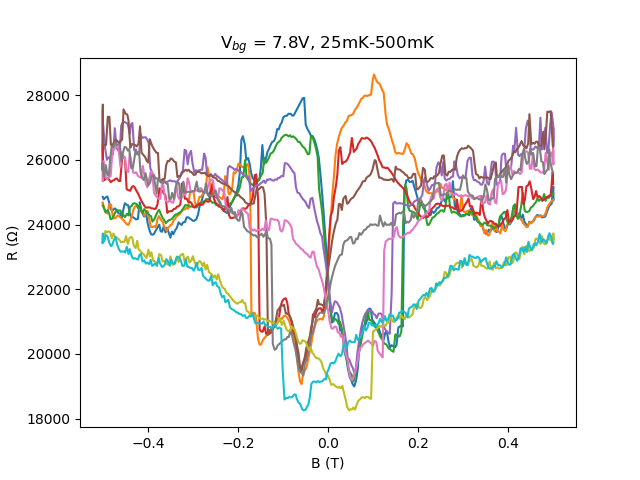

Text(0, 0.5, 'R ($\\Omega$)')

In [104]:
plt.figure()
plt.plot(data_other1.triton_field, data_other1.lockin865_X[:]/0.5e-9)
plt.plot(data_other2.triton_field, data_other2.lockin865_X[:]/0.5e-9)
plt.plot(data_other5.triton_field, data_other5.lockin865_X[:]/0.5e-9)
plt.plot(data_other6.triton_field, data_other6.lockin865_X[:]/0.5e-9)
plt.plot(data_other9.triton_field, data_other9.lockin865_X[:]/0.5e-9)
plt.plot(data_other10.triton_field, data_other10.lockin865_X[:]/0.5e-9)
plt.plot(data_other13.triton_field, data_other13.lockin865_X[:]/0.5e-9)
plt.plot(data_other14.triton_field, data_other14.lockin865_X[:]/0.5e-9)
plt.plot(data270.triton_field, data270.lockin865_X[:]/0.5e-9)
plt.plot(data271.triton_field, data271.lockin865_X[:]/0.5e-9)
plt.title('V$_{bg}$ = 7.8V, 25mK-500mK')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

<IPython.core.display.Javascript object>


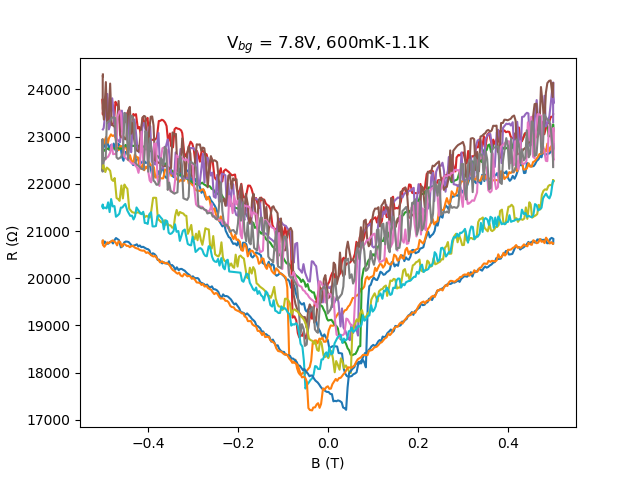

Text(0, 0.5, 'R ($\\Omega$)')

In [122]:
plt.figure()
plt.plot(data274.triton_field, data274.lockin865_X[:]/0.5e-9)
plt.plot(data275.triton_field, data275.lockin865_X[:]/0.5e-9)
plt.plot(data278.triton_field, data278.lockin865_X[:]/0.5e-9)
plt.plot(data279.triton_field, data279.lockin865_X[:]/0.5e-9)
plt.plot(data282.triton_field, data282.lockin865_X[:]/0.5e-9)
plt.plot(data283.triton_field, data283.lockin865_X[:]/0.5e-9)
plt.plot(data286.triton_field, data286.lockin865_X[:]/0.5e-9)
plt.plot(data287.triton_field, data287.lockin865_X[:]/0.5e-9)
plt.plot(data290.triton_field, data290.lockin865_X[:]/0.5e-9)
plt.plot(data291.triton_field, data291.lockin865_X[:]/0.5e-9)
plt.plot(data294.triton_field, data294.lockin865_X[:]/0.5e-9)
plt.plot(data295.triton_field, data295.lockin865_X[:]/0.5e-9)
plt.title('V$_{bg}$ = 7.8V, 600mK-1.1K')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')


<IPython.core.display.Javascript object>


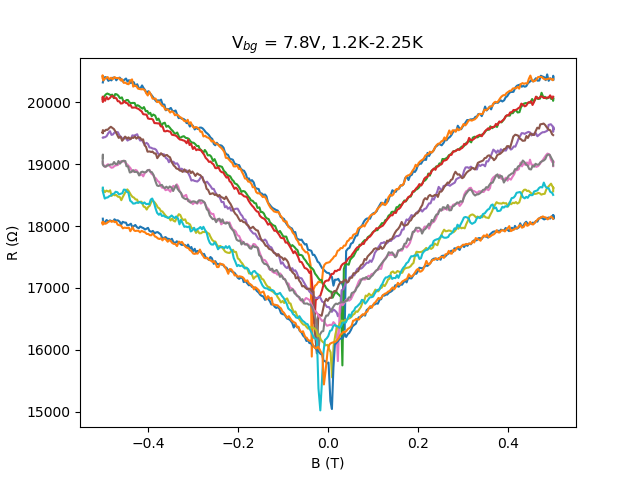

Text(0, 0.5, 'R ($\\Omega$)')

In [213]:
plt.figure()
plt.plot(data298.triton_field, data298.lockin865_X[:]/0.5e-9)
plt.plot(data299.triton_field, data299.lockin865_X[:]/0.5e-9)
plt.plot(data302.triton_field, data302.lockin865_X[:]/0.5e-9)
plt.plot(data303.triton_field, data303.lockin865_X[:]/0.5e-9)
plt.plot(data306.triton_field, data306.lockin865_X[:]/0.5e-9)
plt.plot(data307.triton_field, data307.lockin865_X[:]/0.5e-9)
plt.plot(data310.triton_field, data310.lockin865_X[:]/0.5e-9)
plt.plot(data311.triton_field, data311.lockin865_X[:]/0.5e-9)
plt.plot(data314.triton_field, data314.lockin865_X[:]/0.5e-9)
plt.plot(data315.triton_field, data315.lockin865_X[:]/0.5e-9)
plt.plot(data318.triton_field, data318.lockin865_X[:]/0.5e-9)
plt.plot(data319.triton_field, data319.lockin865_X[:]/0.5e-9)
plt.title('V$_{bg}$ = 7.8V, 1.2K-2.25K')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

<IPython.core.display.Javascript object>


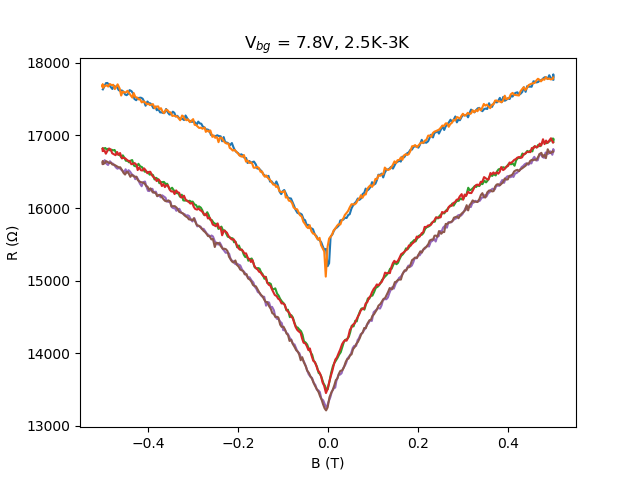

Text(0, 0.5, 'R ($\\Omega$)')

In [223]:
plt.figure()
plt.plot(data326.triton_field, data326.lockin865_X[:]/0.5e-9)
plt.plot(data327.triton_field, data327.lockin865_X[:]/0.5e-9)
plt.plot(data334.triton_field, data334.lockin865_X[:]/0.5e-9)
plt.plot(data335.triton_field, data335.lockin865_X[:]/0.5e-9)
plt.plot(data338.triton_field, data338.lockin865_X[:]/0.5e-9)
plt.plot(data339.triton_field, data339.lockin865_X[:]/0.5e-9)
plt.title('V$_{bg}$ = 7.8V, 2.5K-3K')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

<IPython.core.display.Javascript object>


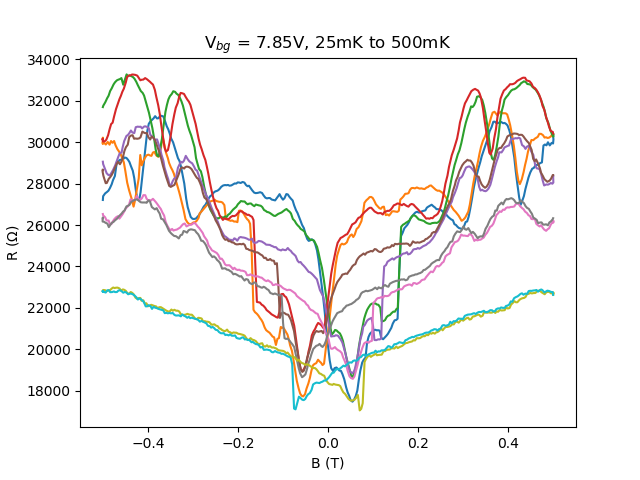

Text(0, 0.5, 'R ($\\Omega$)')

In [105]:
plt.figure()
plt.plot(data_other3.triton_field, data_other3.lockin865_X[:]/0.5e-9)
plt.plot(data_other4.triton_field, data_other4.lockin865_X[:]/0.5e-9)
plt.plot(data_other7.triton_field, data_other7.lockin865_X[:]/0.5e-9)
plt.plot(data_other8.triton_field, data_other8.lockin865_X[:]/0.5e-9)
plt.plot(data_other11.triton_field, data_other11.lockin865_X[:]/0.5e-9)
plt.plot(data_other12.triton_field, data_other12.lockin865_X[:]/0.5e-9)
plt.plot(data_other15.triton_field, data_other15.lockin865_X[:]/0.5e-9)
plt.plot(data_other16.triton_field, data_other16.lockin865_X[:]/0.5e-9)
plt.plot(data272.triton_field, data272.lockin865_X[:]/0.5e-9)
plt.plot(data273.triton_field, data273.lockin865_X[:]/0.5e-9)
plt.title('V$_{bg}$ = 7.85V, 25mK to 500mK')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

<IPython.core.display.Javascript object>


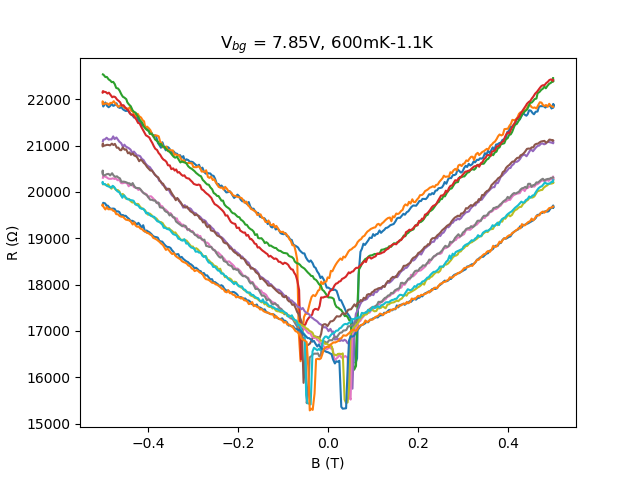

Text(0, 0.5, 'R ($\\Omega$)')

In [121]:
plt.figure()
plt.plot(data276.triton_field, data276.lockin865_X[:]/0.5e-9)
plt.plot(data277.triton_field, data277.lockin865_X[:]/0.5e-9)
plt.plot(data280.triton_field, data280.lockin865_X[:]/0.5e-9)
plt.plot(data281.triton_field, data281.lockin865_X[:]/0.5e-9)
plt.plot(data284.triton_field, data284.lockin865_X[:]/0.5e-9)
plt.plot(data285.triton_field, data285.lockin865_X[:]/0.5e-9)
plt.plot(data288.triton_field, data288.lockin865_X[:]/0.5e-9)
plt.plot(data289.triton_field, data289.lockin865_X[:]/0.5e-9)
plt.plot(data292.triton_field, data292.lockin865_X[:]/0.5e-9)
plt.plot(data293.triton_field, data293.lockin865_X[:]/0.5e-9)
plt.plot(data296.triton_field, data296.lockin865_X[:]/0.5e-9)
plt.plot(data297.triton_field, data297.lockin865_X[:]/0.5e-9)
plt.title('V$_{bg}$ = 7.85V, 600mK-1.1K')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

<IPython.core.display.Javascript object>


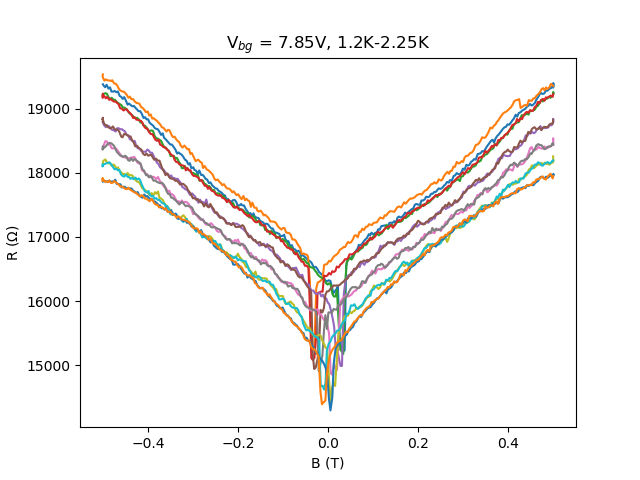

Text(0, 0.5, 'R ($\\Omega$)')

In [214]:
plt.figure()
plt.plot(data300.triton_field, data300.lockin865_X[:]/0.5e-9)
plt.plot(data301.triton_field, data301.lockin865_X[:]/0.5e-9)
plt.plot(data304.triton_field, data304.lockin865_X[:]/0.5e-9)
plt.plot(data305.triton_field, data305.lockin865_X[:]/0.5e-9)
plt.plot(data308.triton_field, data308.lockin865_X[:]/0.5e-9)
plt.plot(data309.triton_field, data309.lockin865_X[:]/0.5e-9)
plt.plot(data312.triton_field, data312.lockin865_X[:]/0.5e-9)
plt.plot(data313.triton_field, data313.lockin865_X[:]/0.5e-9)
plt.plot(data316.triton_field, data316.lockin865_X[:]/0.5e-9)
plt.plot(data317.triton_field, data317.lockin865_X[:]/0.5e-9)
plt.plot(data320.triton_field, data320.lockin865_X[:]/0.5e-9)
plt.plot(data321.triton_field, data321.lockin865_X[:]/0.5e-9)
plt.title('V$_{bg}$ = 7.85V, 1.2K-2.25K')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

<IPython.core.display.Javascript object>


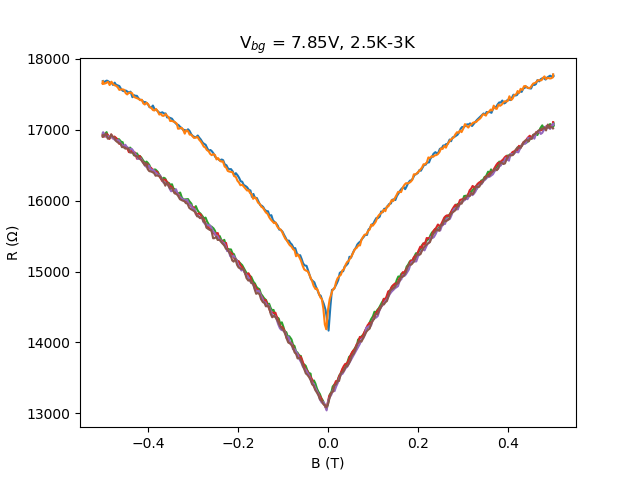

Text(0, 0.5, 'R ($\\Omega$)')

In [222]:
plt.figure()
plt.plot(data328.triton_field, data328.lockin865_X[:]/0.5e-9)
plt.plot(data329.triton_field, data329.lockin865_X[:]/0.5e-9)
plt.plot(data332.triton_field, data332.lockin865_X[:]/0.5e-9)
plt.plot(data333.triton_field, data333.lockin865_X[:]/0.5e-9)
plt.plot(data336.triton_field, data336.lockin865_X[:]/0.5e-9)
plt.plot(data337.triton_field, data337.lockin865_X[:]/0.5e-9)
plt.title('V$_{bg}$ = 7.85V, 2.5K-3K')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

# M26 Superconducting device

Electrodes: Source/drain 30/26, Rxx measured in lockin865 28-27, lockin830 29-28, frequency 13.667 Hz

In [148]:
lockin865.amplitude(0.05) # 0.5 nA

In [152]:
# base temp, cables unplugged
srframe.volt_p1(-14)
time.sleep(30)
gvals = np.linspace(-14, 15, 581)
data370, plot370 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_865_28-27_830_29-28_baseT_0p5nA', YParam=[lockin865.X, lockin830.X])

Started at 2020-03-17 13:47:07
DataSet:
   location = 'data/2020-03-17/#042_M26SC_865_28-27_830_29-28_baseT_0p5nA_13-47-06'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (581,)
   Measured | lockin865_X         | X            | (581,)
   Measured | lockin865_Y         | Y            | (581,)
   Measured | lockin830_X         | X            | (581,)
   Measured | lockin830_Y         | Y            | (581,)
Finished at 2020-03-17 14:00:08


<IPython.core.display.Javascript object>


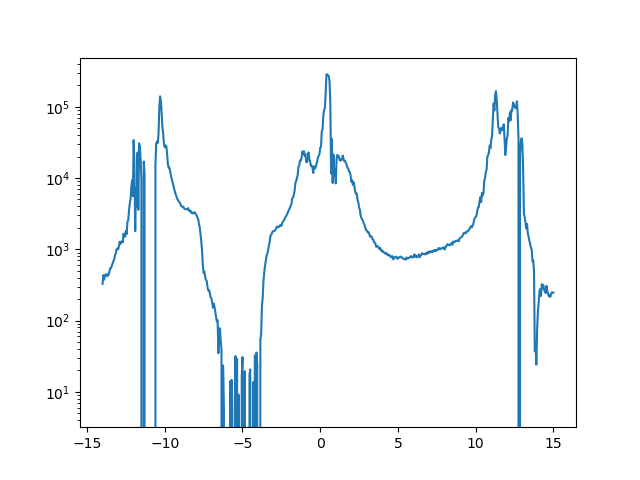

In [154]:
plt.figure()
plt.semilogy(data370.srframe_volt_p1_set, data370.lockin865_X[:]/0.5e-9)


In [153]:
srframe.volt_p1(0)

In [156]:
triton.pid_setpoint(0.05)
triton.pid_mode(1)  # make sure to click on and off #1 temperature sensor after turning PID mode on

In [157]:
triton.pid_setpoint(0.05)
triton.pid_range(1)

In [158]:
triton.pid_range(3.16)

In [159]:
triton.pid_range(10)

In [161]:
Tvals = np.linspace(0.05, 1, 20)
data371, plot371 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.2, Param2_SetBetween=0, DataName='M26SC_865_28-27_830_29-28_50mKto1K_0p5nA')

Started at 2020-03-17 14:55:02
DataSet:
   location = 'data/2020-03-17/#043_M26SC_865_28-27_830_29-28_50mKto1K_0p5nA_14-54-59'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 581)
   Measured | lockin865_X             | X            | (20, 581)
   Measured | lockin865_Y             | Y            | (20, 581)
   Measured | lockin830_X             | X            | (20, 581)
   Measured | lockin830_Y             | Y            | (20, 581)
Finished at 2020-03-17 20:46:54


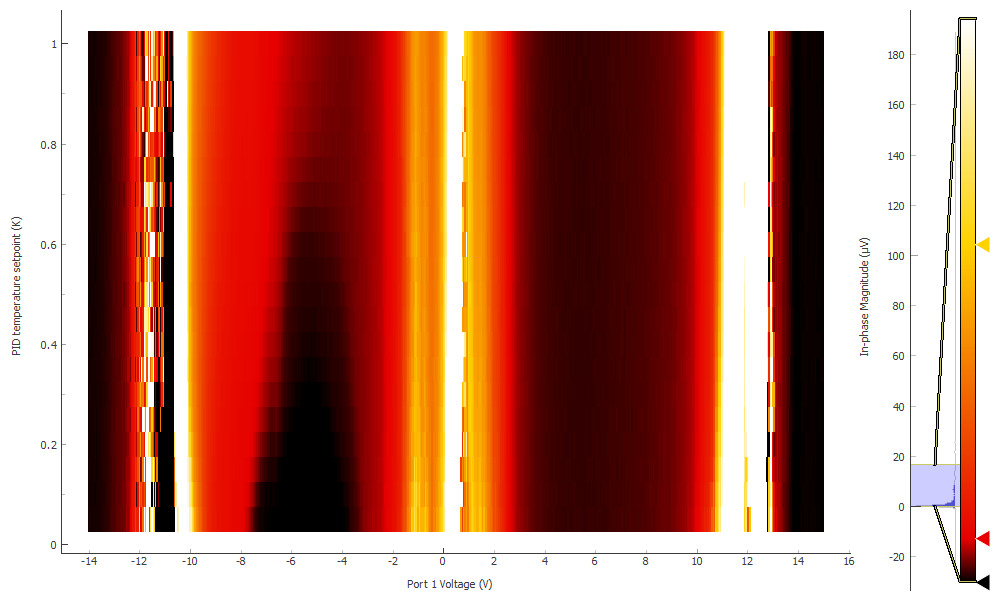

In [190]:
plot371[0]

In [162]:
triton.pid_range(31.6)

In [163]:
Tvals = np.linspace(1.1, 1.4, 4)
data372, plot372 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.2, Param2_SetBetween=0, DataName='M26SC_865_28-27_830_29-28_1to1p4K_0p5nA')

Started at 2020-03-17 20:46:57
DataSet:
   location = 'data/2020-03-17/#044_M26SC_865_28-27_830_29-28_1to1p4K_0p5nA_20-46-54'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (4,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (4, 581)
   Measured | lockin865_X             | X            | (4, 581)
   Measured | lockin865_Y             | Y            | (4, 581)
   Measured | lockin830_X             | X            | (4, 581)
   Measured | lockin830_Y             | Y            | (4, 581)
Finished at 2020-03-17 21:57:31


In [164]:
triton.pid_range(100)

In [165]:
Tvals = np.linspace(1.5, 2, 6)
data373, plot373 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.2, Param2_SetBetween=0, DataName='M26SC_865_28-27_830_29-28_1p5to2K_0p5nA')

Started at 2020-03-17 21:57:34
DataSet:
   location = 'data/2020-03-17/#045_M26SC_865_28-27_830_29-28_1p5to2K_0p5nA_21-57-32'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (6,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (6, 581)
   Measured | lockin865_X             | X            | (6, 581)
   Measured | lockin865_Y             | Y            | (6, 581)
   Measured | lockin830_X             | X            | (6, 581)
   Measured | lockin830_Y             | Y            | (6, 581)
Finished at 2020-03-17 23:43:26


use cernox, shut off V4, turn on V9, shut off turbo

In [166]:
Tvals = np.linspace(2.5, 10, 16)
data374, plot374 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.2, Param2_SetBetween=0, DataName='M26SC_865_28-27_830_29-28_2p5to10K_0p5nA')

Started at 2020-03-18 00:11:10
DataSet:
   location = 'data/2020-03-18/#001_M26SC_865_28-27_830_29-28_2p5to10K_0p5nA_00-11-07'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (16,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (16, 581)
   Measured | lockin865_X             | X            | (16, 581)
   Measured | lockin865_Y             | Y            | (16, 581)
   Measured | lockin830_X             | X            | (16, 581)
   Measured | lockin830_Y             | Y            | (16, 581)
Finished at 2020-03-18 04:53:36


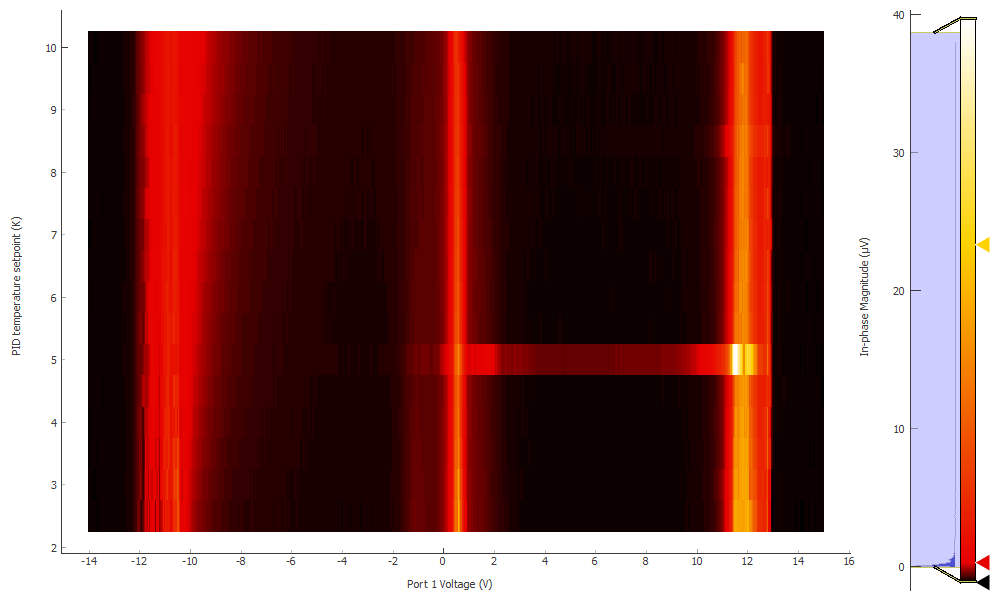

In [191]:
plot374[0]

In [167]:
Tvals = np.linspace(11, 30, 20)
data375, plot375 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.2, Param2_SetBetween=0, DataName='M26SC_865_28-27_830_29-28_11to30K_0p5nA')

Started at 2020-03-18 04:53:39
DataSet:
   location = 'data/2020-03-18/#002_M26SC_865_28-27_830_29-28_11to30K_0p5nA_04-53-36'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 581)
   Measured | lockin865_X             | X            | (20, 581)
   Measured | lockin865_Y             | Y            | (20, 581)
   Measured | lockin830_X             | X            | (20, 581)
   Measured | lockin830_Y             | Y            | (20, 581)
Finished at 2020-03-18 10:45:32


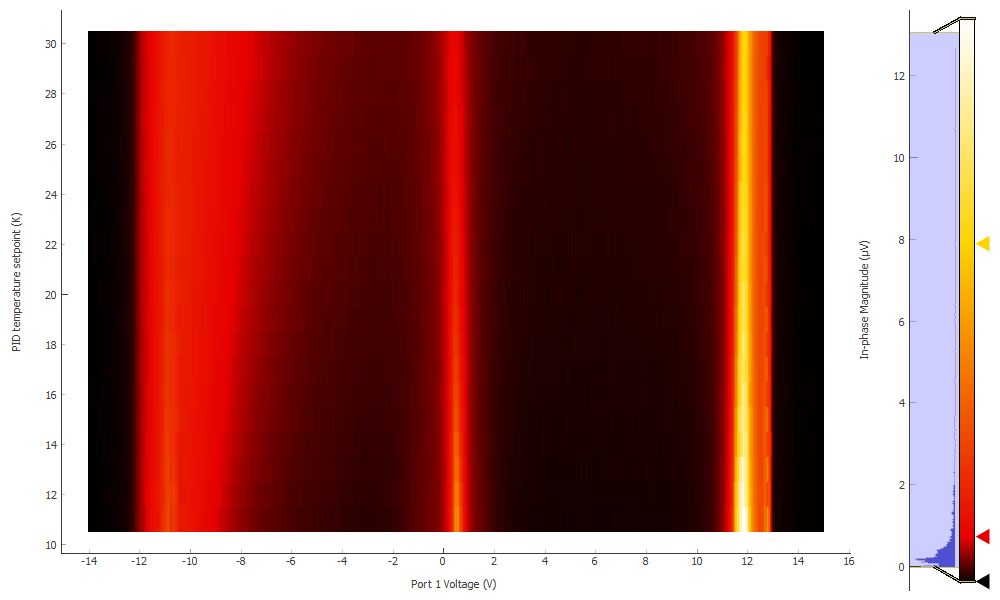

In [192]:
plot375[0]

In [168]:
# Close valve V1, change delay time to 6 or more minutes between temperatures.
Tvals = np.linspace(31, 50, 11)
data376, plot376 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=480, SetDelay2=1.2, Param2_SetBetween=0, DataName='M26SC_865_28-27_830_29-28_31to50K_0p5nA')

Started at 2020-03-18 10:58:04
DataSet:
   location = 'data/2020-03-18/#003_M26SC_865_28-27_830_29-28_31to50K_0p5nA_10-58-01'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (11,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (11, 581)
   Measured | lockin865_X             | X            | (11, 581)
   Measured | lockin865_Y             | Y            | (11, 581)
   Measured | lockin830_X             | X            | (11, 581)
   Measured | lockin830_Y             | Y            | (11, 581)
Finished at 2020-03-18 14:55:26


In [171]:
# full cooldown

In [252]:
triton.read_temps()

MC - on:  10.375 K
MC_cernox - on:  10.3567 K
still - on:  10.1033 K
cold_plate - on:  10.1615 K
magnet - on:  4.09297 K
PT2h - on:  3.33076 K
PT2p - on:  3.58012 K
PT1h - on:  46.9546 K
PT1p - on:  59.3044 K


# hysteresis check on other devices

In [309]:
triton.read_temps()

MC - on:  0.0299489 K
MC_cernox - off:  1.21336 K
still - on:  0.880021 K
cold_plate - on:  0.406733 K
magnet - on:  3.94535 K
PT2h - on:  3.22357 K
PT2p - on:  3.43835 K
PT1h - on:  47.6543 K
PT1p - on:  60.6783 K


In [306]:
triton.read_pressures()

P1:  12.2508
P2:  694.311
P3:  0.0906
P4:  4.4
P5:  119.184
POVC:  0.0003


In [295]:
triton.read_valves()

V1:  OPEN
V2:  CLOSE
V3:  CLOSE
V4:  CLOSE
V5:  OPEN
V6:  CLOSE
V7:  CLOSE
V8:  CLOSE
V9:  CLOSE


In [267]:
triton.write('SET:DEV:V9:VALV:SIG:STATE:CLOSE')

In [271]:
triton.write('SET:DEV:V9:VALV:SIG:STATE:OPEN')

Same setup as before lockin865: 28-27, lockin830: 29-28. Doing hysteresis Rxx measurements now.

In [316]:
triton.pid_setpoint(0.05)

In [315]:
triton.pid_mode(1)

In [318]:
triton.pid_range(3.16)

In [313]:
triton.PT2h_temp_enable(0) # turned on and off the PT2h (channel1)

Look at -8, -5, 8 Vbg

In [319]:
lockin865.amplitude() #0.5 nA

0.04999999702

In [335]:
triton.field()

-0.50038

In [331]:
triton.field(-0.5)

Sweep time approximately 13.21 seconds


In [323]:
triton.magnet_hold()

Try first these 3 gate points at 0.5 nA. Then 1 nA. Then maybe 5 nA

In [326]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data376, plot376 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_0p5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data377, plot377 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_0p5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-03-19 11:17:01
DataSet:
   location = 'data/2020-03-19/#001_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_0p5nA_50mK_11-17-00'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 11:27:17
Sweep time approximately 610.006 seconds
Started at 2020-03-19 11:27:25
DataSet:
   location = 'data/2020-03-19/#002_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_0p5nA_50mK_11-27-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [338]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data378, plot378 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_0p5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data379, plot379 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_0p5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-03-19 11:45:34
DataSet:
   location = 'data/2020-03-19/#003_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_0p5nA_50mK_11-45-34'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 11:55:52
Sweep time approximately 610.012 seconds
Started at 2020-03-19 11:55:59
DataSet:
   location = 'data/2020-03-19/#004_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_0p5nA_50mK_11-55-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [339]:
srframe.volt_p1(8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data380, plot380 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg8_865_28-27_830_29-28_0p5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data381, plot381 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg8_865_28-27_830_29-28_0p5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-19 12:23:54
DataSet:
   location = 'data/2020-03-19/#005_M26SC_hysteresisupVbg8_865_28-27_830_29-28_0p5nA_50mK_12-23-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 12:34:11
Sweep time approximately 610.0 seconds
Started at 2020-03-19 12:34:18
DataSet:
   location = 'data/2020-03-19/#006_M26SC_hysteresisupVbg8_865_28-27_830_29-28_0p5nA_50mK_12-34-18'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [39]:
def concathyst(dataup, datadown, current, instrument='lockin865'):
    nup = np.where(np.isnan(dataup.triton_field))[0][0]
    ndown = np.where(np.isnan(datadown.triton_field))[0][0]
    field = np.concatenate((dataup.triton_field[:nup], datadown.triton_field[:ndown]))
    R = np.concatenate((getattr(dataup, instrument + '_X')[:nup], getattr(datadown, instrument + '_X')[:ndown]))/current
    
    return field, R

In [340]:
lockin865.amplitude(0.1) #1nA

In [341]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data382, plot382 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data383, plot383 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-19 12:45:32
DataSet:
   location = 'data/2020-03-19/#007_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_1nA_50mK_12-45-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 12:55:50
Sweep time approximately 610.012 seconds
Started at 2020-03-19 12:55:57
DataSet:
   location = 'data/2020-03-19/#008_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_1nA_50mK_12-55-57'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [342]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data384, plot384 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data385, plot385 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.006 seconds
Started at 2020-03-19 13:06:49
DataSet:
   location = 'data/2020-03-19/#009_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_1nA_50mK_13-06-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 13:17:08
Sweep time approximately 610.0 seconds
Started at 2020-03-19 13:17:14
DataSet:
   location = 'data/2020-03-19/#010_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_1nA_50mK_13-17-13'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [343]:
srframe.volt_p1(8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data386, plot386 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg8_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data387, plot387 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg8_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.006 seconds
Started at 2020-03-19 13:28:23
DataSet:
   location = 'data/2020-03-19/#011_M26SC_hysteresisupVbg8_865_28-27_830_29-28_1nA_50mK_13-28-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 13:38:40
Sweep time approximately 610.0 seconds
Started at 2020-03-19 13:38:47
DataSet:
   location = 'data/2020-03-19/#012_M26SC_hysteresisupVbg8_865_28-27_830_29-28_1nA_50mK_13-38-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field |

In [344]:
lockin865.amplitude(0.5)  # 5 nA

In [345]:
triton.field()

-0.499997

In [346]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data388, plot388 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data389, plot389 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.006 seconds
Started at 2020-03-19 13:59:25
DataSet:
   location = 'data/2020-03-19/#013_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_50mK_13-59-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 14:09:42
Sweep time approximately 610.012 seconds
Started at 2020-03-19 14:09:49
DataSet:
   location = 'data/2020-03-19/#014_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_50mK_14-09-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [347]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data390, plot390 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data391, plot391 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-19 14:20:38
DataSet:
   location = 'data/2020-03-19/#015_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_50mK_14-20-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 14:30:55
Sweep time approximately 610.006 seconds
Started at 2020-03-19 14:31:02
DataSet:
   location = 'data/2020-03-19/#016_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_50mK_14-31-01'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [348]:
srframe.volt_p1(8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data392, plot392 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg8_865_28-27_830_29-28_5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data393, plot393 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg8_865_28-27_830_29-28_5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-03-19 14:42:11
DataSet:
   location = 'data/2020-03-19/#017_M26SC_hysteresisupVbg8_865_28-27_830_29-28_5nA_50mK_14-42-10'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 14:52:28
Sweep time approximately 610.006 seconds
Started at 2020-03-19 14:52:35
DataSet:
   location = 'data/2020-03-19/#018_M26SC_hysteresisupVbg8_865_28-27_830_29-28_5nA_50mK_14-52-34'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

<IPython.core.display.Javascript object>


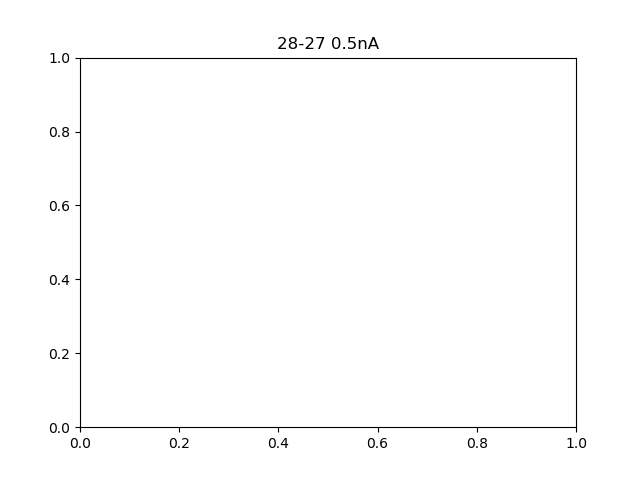

NameError: name 'data376' is not defined

In [169]:
plt.figure()
plt.title('28-27 0.5nA')
plt.plot(*concathyst(data376, data377, 0.5e-9), label='-8Vbg')
plt.plot(*concathyst(data378, data379, 0.5e-9), label='-5Vbg')
plt.plot(*concathyst(data380, data381, 0.5e-9), label='8Vbg')
plt.legend()

<IPython.core.display.Javascript object>


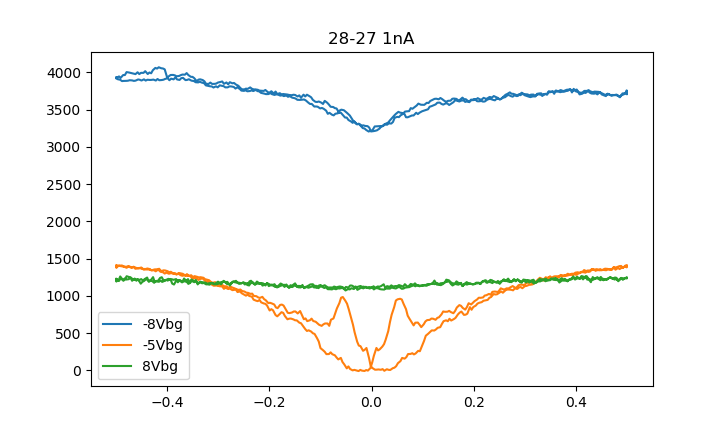

In [359]:
plt.figure()
plt.title('28-27 1nA')
plt.plot(*concathyst(data382, data383, 1e-9), label='-8Vbg')
plt.plot(*concathyst(data384, data385, 1e-9), label='-5Vbg')
plt.plot(*concathyst(data386, data387, 1e-9), label='8Vbg')
plt.legend()

<IPython.core.display.Javascript object>


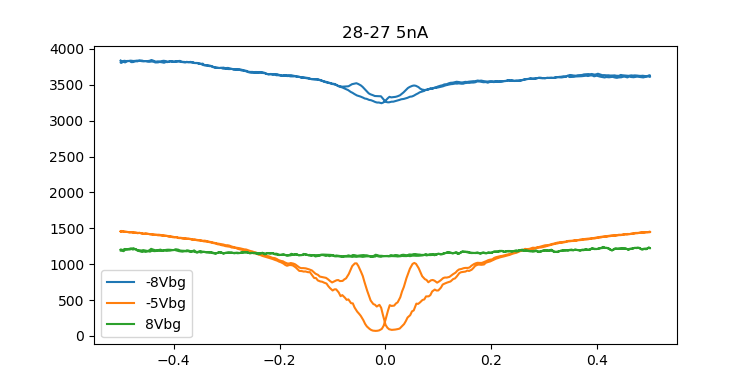

In [361]:
plt.figure()
plt.title('28-27 5nA')
plt.plot(*concathyst(data388, data389, 5e-9), label='-8Vbg')
plt.plot(*concathyst(data390, data391, 5e-9), label='-5Vbg')
plt.plot(*concathyst(data392, data393, 5e-9), label='8Vbg')
plt.legend()

In [362]:
lockin865.amplitude(1) # 10 nA, for just -8 and -5 Vbg

In [363]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data394, plot394 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_10nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data395, plot395 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_10nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-19 15:20:14
DataSet:
   location = 'data/2020-03-19/#019_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_10nA_50mK_15-20-13'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 15:30:31
Sweep time approximately 610.012 seconds
Started at 2020-03-19 15:30:38
DataSet:
   location = 'data/2020-03-19/#020_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_10nA_50mK_15-30-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [364]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data396, plot396 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_10nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data397, plot397 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_10nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-03-19 15:41:26
DataSet:
   location = 'data/2020-03-19/#021_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_10nA_50mK_15-41-25'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 15:51:43
Sweep time approximately 610.012 seconds
Started at 2020-03-19 15:51:50
DataSet:
   location = 'data/2020-03-19/#022_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_10nA_50mK_15-51-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

In [365]:
lockin865.amplitude(2) # 20 nA, for just -8 and -5 Vbg

In [366]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data398, plot398 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_20nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data399, plot399 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_20nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-03-19 16:02:40
DataSet:
   location = 'data/2020-03-19/#023_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_20nA_50mK_16-02-39'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 16:12:57
Sweep time approximately 610.006 seconds
Started at 2020-03-19 16:13:03
DataSet:
   location = 'data/2020-03-19/#024_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_20nA_50mK_16-13-02'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

In [367]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data400, plot400 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_20nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data401, plot401 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_20nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-19 16:23:53
DataSet:
   location = 'data/2020-03-19/#025_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_20nA_50mK_16-23-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 16:34:10
Sweep time approximately 610.006 seconds
Started at 2020-03-19 16:34:17
DataSet:
   location = 'data/2020-03-19/#026_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_20nA_50mK_16-34-16'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [369]:
lockin865.amplitude(0.2)  # 2 nA

<IPython.core.display.Javascript object>


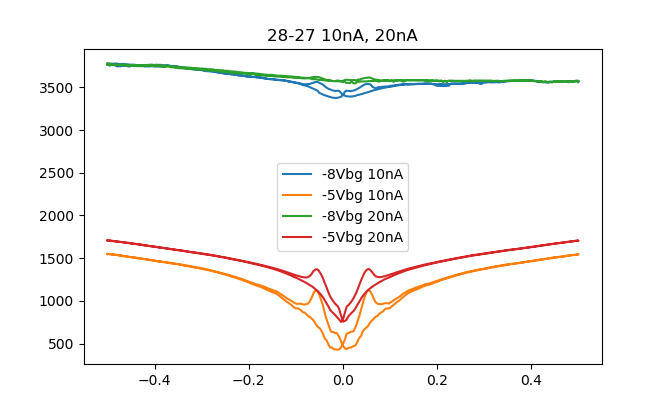

In [371]:
plt.figure()
plt.title('28-27 10nA, 20nA')
plt.plot(*concathyst(data394, data395, 10e-9), label='-8Vbg 10nA')
plt.plot(*concathyst(data396, data397, 10e-9), label='-5Vbg 10nA')
plt.plot(*concathyst(data398, data399, 20e-9), label='-8Vbg 20nA')
plt.plot(*concathyst(data400, data401, 20e-9), label='-5Vbg 20nA')
plt.legend()

With 2 nA, try different gate points: -1, 2, 10

In [372]:
srframe.volt_p1(-1)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data402, plot402 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-1_865_28-27_830_29-28_2nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data403, plot403 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-1_865_28-27_830_29-28_2nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-03-19 17:26:20
DataSet:
   location = 'data/2020-03-19/#027_M26SC_hysteresisupVbg-1_865_28-27_830_29-28_2nA_50mK_17-26-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 17:36:37
Sweep time approximately 610.0 seconds
Started at 2020-03-19 17:36:44
DataSet:
   location = 'data/2020-03-19/#028_M26SC_hysteresisupVbg-1_865_28-27_830_29-28_2nA_50mK_17-36-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [373]:
srframe.volt_p1(2)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data404, plot404 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg2_865_28-27_830_29-28_2nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data405, plot405 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg2_865_28-27_830_29-28_2nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-19 17:47:33
DataSet:
   location = 'data/2020-03-19/#029_M26SC_hysteresisupVbg2_865_28-27_830_29-28_2nA_50mK_17-47-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 17:57:50
Sweep time approximately 610.006 seconds
Started at 2020-03-19 17:57:56
DataSet:
   location = 'data/2020-03-19/#030_M26SC_hysteresisupVbg2_865_28-27_830_29-28_2nA_50mK_17-57-55'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field |

In [374]:
srframe.volt_p1(10)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data406, plot406 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg10_865_28-27_830_29-28_2nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data407, plot407 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg10_865_28-27_830_29-28_2nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-19 18:08:55
DataSet:
   location = 'data/2020-03-19/#031_M26SC_hysteresisupVbg10_865_28-27_830_29-28_2nA_50mK_18-08-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 18:19:11
Sweep time approximately 610.0 seconds
Started at 2020-03-19 18:19:18
DataSet:
   location = 'data/2020-03-19/#032_M26SC_hysteresisupVbg10_865_28-27_830_29-28_2nA_50mK_18-19-17'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field |

In [375]:
srframe.volt_p1(0)

<IPython.core.display.Javascript object>


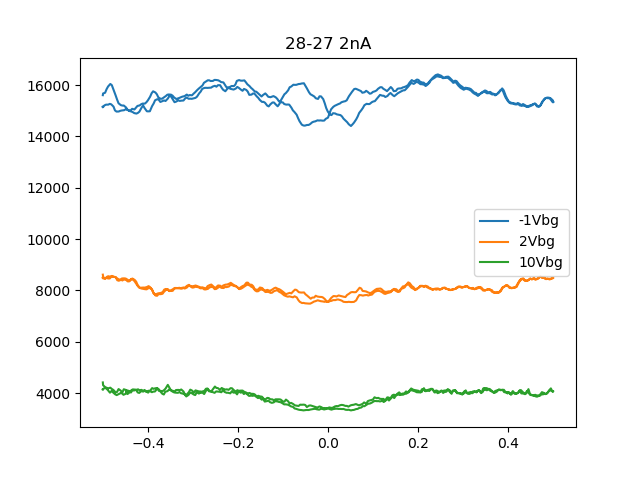

In [380]:
plt.figure()
plt.title('28-27 2nA')
plt.plot(*concathyst(data402, data403, 2e-9), label='-1Vbg')
plt.plot(*concathyst(data404, data405, 2e-9), label='2Vbg')
plt.plot(*concathyst(data406, data407, 2e-9), label='10Vbg')
plt.legend()

In [377]:
lockin865.amplitude(1)  # try 10 nA at -1Vbg

In [378]:
srframe.volt_p1(-1)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data408, plot408 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-1_865_28-27_830_29-28_10nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data409, plot409 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-1_865_28-27_830_29-28_10nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.988 seconds
Started at 2020-03-19 18:34:46
DataSet:
   location = 'data/2020-03-19/#033_M26SC_hysteresisupVbg-1_865_28-27_830_29-28_10nA_50mK_18-34-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 18:45:02
Sweep time approximately 610.012 seconds
Started at 2020-03-19 18:45:10
DataSet:
   location = 'data/2020-03-19/#034_M26SC_hysteresisupVbg-1_865_28-27_830_29-28_10nA_50mK_18-45-09'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

In [382]:
lockin865.amplitude(0.5)  # try 5 nA at -1Vbg

In [383]:
srframe.volt_p1(-1)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data410, plot410 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-1_865_28-27_830_29-28_5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data411, plot411 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-1_865_28-27_830_29-28_5nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-19 18:57:05
DataSet:
   location = 'data/2020-03-19/#035_M26SC_hysteresisupVbg-1_865_28-27_830_29-28_5nA_50mK_18-57-04'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 19:07:23
Sweep time approximately 610.0 seconds
Started at 2020-03-19 19:07:30
DataSet:
   location = 'data/2020-03-19/#036_M26SC_hysteresisupVbg-1_865_28-27_830_29-28_5nA_50mK_19-07-30'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field |

<IPython.core.display.Javascript object>


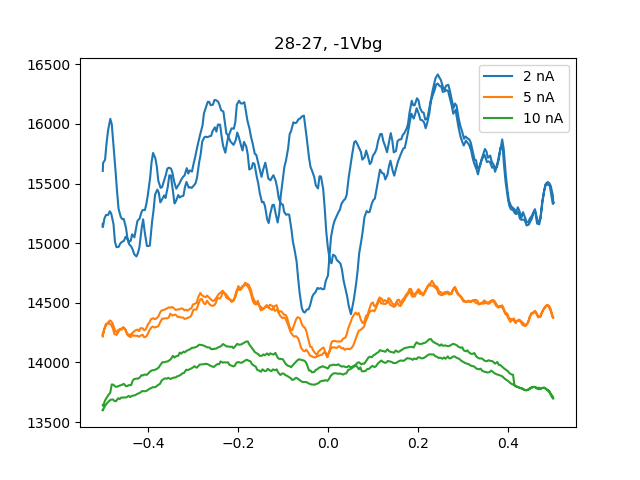

In [387]:
plt.figure()
plt.title('28-27, -1Vbg')
plt.plot(*concathyst(data402, data403, 2e-9), label='2 nA')
plt.plot(*concathyst(data410, data411, 5e-9), label='5 nA')
plt.plot(*concathyst(data408, data409, 10e-9), label='10 nA')
plt.legend()

Keep it at 1 nA amplitude, but let's see where the SC ends for Vbg = -5. First run dvdi. Then use a value where it looks like normal resistance

In [385]:
lockin865.amplitude(0.1)  # 1 nA amplitude
srframe.volt_p1(-5)

In [388]:
srframe.volt_p5(-10)  # Oh, this is at -0.5 T
time.sleep(25)
offvals = np.linspace(-10, 10, 201)  # -100 to 100 nA
data412, plot412 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_50mK')
srframe.volt_p1(0)
srframe.volt_p5(0)

Started at 2020-03-19 19:21:52
DataSet:
   location = 'data/2020-03-19/#038_M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_50mK_19-21-50'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-03-19 19:27:41


In [389]:
lockin865.amplitude()

0.10000000149

In [390]:
triton.field_set_stable(0)
srframe.volt_p1(-5)

Please wait 310.0 seconds for the field sweep, plus the time required for operating the switch...


In [391]:
srframe.volt_p5(-10)  # Try again at 0T
time.sleep(25)
offvals = np.linspace(-10, 10, 201)  # -100 to 100 nA
data413, plot413 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_50mK_0T')
srframe.volt_p1(0)
srframe.volt_p5(0)

Started at 2020-03-19 19:34:19
DataSet:
   location = 'data/2020-03-19/#039_M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_50mK_0T_19-34-17'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-03-19 19:40:09


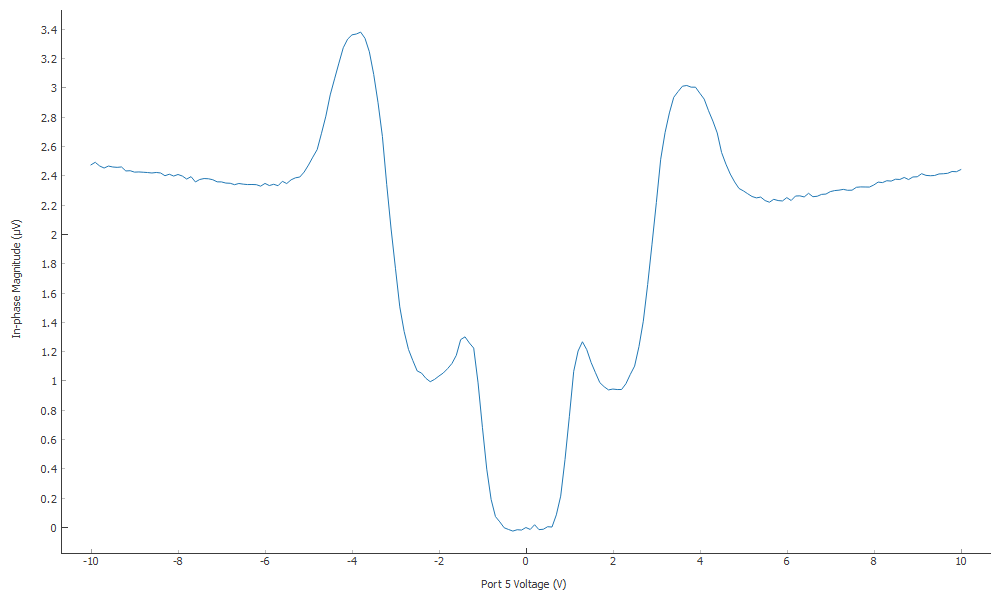

In [393]:
plot413[0]

In [394]:
triton.field_set_stable(-1)

Please wait 609.994 seconds for the field sweep, plus the time required for operating the switch...


In [395]:
srframe.volt_p5(6)  # 60 nA offset to get out of the SC pocket.
time.sleep(25)
triton.magnet_sweeprate(0.1)
triton.field(1)
data414, plot414 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 1, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-1)
data415, plot415 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=40, breakif=npd.breakat(triton.field, -1, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)

Sweep time approximately 1209.994 seconds
Started at 2020-03-19 22:18:17
DataSet:
   location = 'data/2020-03-19/#040_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_1nA_50mK_22-18-16'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-19 22:38:36
Sweep time approximately 1209.988 seconds
Started at 2020-03-19 22:38:42
DataSet:
   location = 'data/2020-03-19/#041_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_1nA_50mK_22-38-41'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

<IPython.core.display.Javascript object>


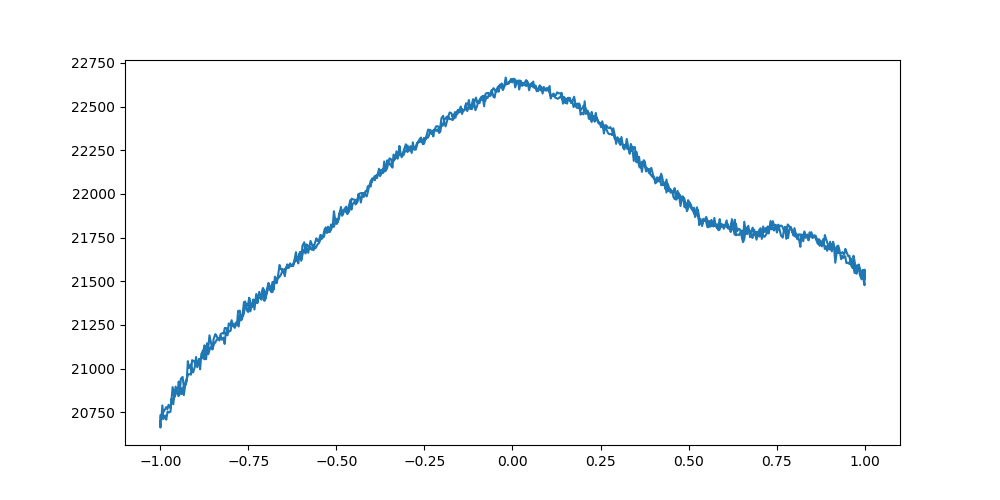

In [397]:
plt.figure(figsize=(10, 5))
plt.plot(*concathyst(data414, data415, 1e-9))

In [406]:
lockin865.amplitude()

0.10000000149

In [407]:
lockin865.time_constant(0.3)  # just to hopefully smooth it out

In [408]:
srframe.volt_p1(-1)
time.sleep(25)
triton.magnet_sweeprate(0.1)
triton.field(1)
data416, plot416 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 1, 0.001, 10), DataName='M26SC_hysteresisupVbg-1_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-1)
data417, plot417 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=40, breakif=npd.breakat(triton.field, -1, 0.001, 10), DataName='M26SC_hysteresisupVbg-1_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)

Sweep time approximately 1210.0 seconds
Started at 2020-03-19 23:48:43
DataSet:
   location = 'data/2020-03-19/#042_M26SC_hysteresisupVbg-1_865_28-27_830_29-28_1nA_50mK_23-48-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-20 00:09:02
Sweep time approximately 1210.006 seconds
Started at 2020-03-20 00:09:08
DataSet:
   location = 'data/2020-03-20/#001_M26SC_hysteresisupVbg-1_865_28-27_830_29-28_1nA_50mK_00-09-07'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [409]:
srframe.volt_p1(-0.5)
time.sleep(25)
triton.magnet_sweeprate(0.1)
triton.field(1)
data418, plot418 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 1, 0.001, 10), DataName='M26SC_hysteresisupVbg-0p5_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-1)
data419, plot419 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=40, breakif=npd.breakat(triton.field, -1, 0.001, 10), DataName='M26SC_hysteresisupVbg-0p5_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)

Sweep time approximately 1209.994 seconds
Started at 2020-03-20 00:29:59
DataSet:
   location = 'data/2020-03-20/#002_M26SC_hysteresisupVbg-0p5_865_28-27_830_29-28_1nA_50mK_00-29-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-20 00:50:18
Sweep time approximately 1210.006 seconds
Started at 2020-03-20 00:50:25
DataSet:
   location = 'data/2020-03-20/#003_M26SC_hysteresisupVbg-0p5_865_28-27_830_29-28_1nA_50mK_00-50-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | trit

In [410]:
srframe.volt_p1(1.5)
time.sleep(25)
triton.magnet_sweeprate(0.1)
triton.field(1)
data420, plot420 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 1, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-1)
data421, plot421 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=40, breakif=npd.breakat(triton.field, -1, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_50mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)

Sweep time approximately 1210.0 seconds
Started at 2020-03-20 01:11:16
DataSet:
   location = 'data/2020-03-20/#004_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_50mK_01-11-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-20 01:31:35
Sweep time approximately 1210.0 seconds
Started at 2020-03-20 01:31:41
DataSet:
   location = 'data/2020-03-20/#005_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_50mK_01-31-40'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

<IPython.core.display.Javascript object>


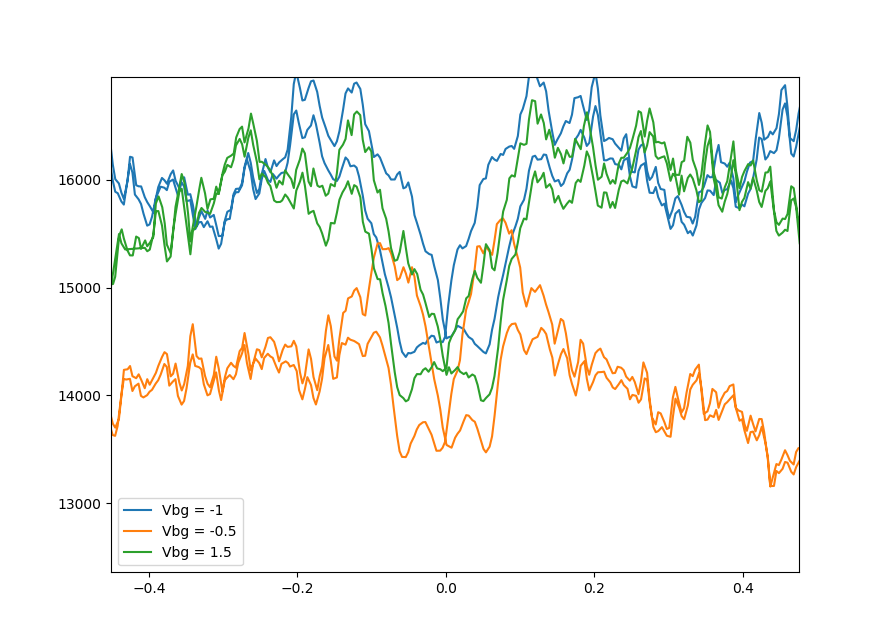

In [428]:
plt.figure()
plt.plot(*concathyst(data416, data417, 1e-9), label='Vbg = -1')
plt.plot(*concathyst(data418, data419, 1e-9), label='Vbg = -0.5')
plt.plot(*concathyst(data420, data421, 1e-9), label='Vbg = 1.5')
plt.legend()

Do the same at a few temperatures to see if it disappears

In [413]:
triton.pid_range(10)

In [415]:
triton.pid_setpoint(0.25)

In [417]:
triton.field_set_stable(-0.5)

Please wait 309.988 seconds for the field sweep, plus the time required for operating the switch...


In [418]:
srframe.volt_p1(1.5)
time.sleep(300)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data422, plot422 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=25, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_250mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data423, plot423 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=25, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_250mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)

Sweep time approximately 610.0 seconds
Started at 2020-03-20 10:05:04
DataSet:
   location = 'data/2020-03-20/#006_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_250mK_10-05-03'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | field        | (750,)
   Measured | lockin865_X  | X            | (750,)
   Measured | lockin865_Y  | Y            | (750,)
   Measured | lockin830_X  | X            | (750,)
   Measured | lockin830_Y  | Y            | (750,)
Finished at 2020-03-20 10:15:22
Sweep time approximately 610.0 seconds
Started at 2020-03-20 10:15:29
DataSet:
   location = 'data/2020-03-20/#007_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_250mK_10-15-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | fiel

In [419]:
triton.pid_setpoint(0.5)
time.sleep(480)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data424, plot424 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=25, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_500mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data425, plot425 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=25, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_500mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-03-20 10:33:54
DataSet:
   location = 'data/2020-03-20/#008_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_500mK_10-33-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | field        | (750,)
   Measured | lockin865_X  | X            | (750,)
   Measured | lockin865_Y  | Y            | (750,)
   Measured | lockin830_X  | X            | (750,)
   Measured | lockin830_Y  | Y            | (750,)
Finished at 2020-03-20 10:44:11
Sweep time approximately 610.0 seconds
Started at 2020-03-20 10:44:18
DataSet:
   location = 'data/2020-03-20/#009_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_500mK_10-44-18'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | fi

In [420]:
triton.pid_setpoint(0.75)
time.sleep(480)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data426, plot426 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=25, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_750mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data427, plot427 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=25, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_750mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-03-20 11:02:43
DataSet:
   location = 'data/2020-03-20/#010_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_750mK_11-02-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | field        | (750,)
   Measured | lockin865_X  | X            | (750,)
   Measured | lockin865_Y  | Y            | (750,)
   Measured | lockin830_X  | X            | (750,)
   Measured | lockin830_Y  | Y            | (750,)
Finished at 2020-03-20 11:13:00
Sweep time approximately 610.006 seconds
Started at 2020-03-20 11:13:07
DataSet:
   location = 'data/2020-03-20/#011_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_750mK_11-13-07'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | 

In [421]:
triton.pid_setpoint(1)
time.sleep(480)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data428, plot428 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=25, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data429, plot429 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=25, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-20 11:31:32
DataSet:
   location = 'data/2020-03-20/#012_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1K_11-31-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | field        | (750,)
   Measured | lockin865_X  | X            | (750,)
   Measured | lockin865_Y  | Y            | (750,)
   Measured | lockin830_X  | X            | (750,)
   Measured | lockin830_Y  | Y            | (750,)
Finished at 2020-03-20 11:41:50
Sweep time approximately 609.994 seconds
Started at 2020-03-20 11:41:57
DataSet:
   location = 'data/2020-03-20/#013_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1K_11-41-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | field   

In [422]:
triton.pid_setpoint(1.25)
time.sleep(2)
triton.pid_range(31.6)
time.sleep(480)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data430, plot430 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=25, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data431, plot431 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=25, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-20 12:00:24
DataSet:
   location = 'data/2020-03-20/#014_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1p25K_12-00-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | field        | (750,)
   Measured | lockin865_X  | X            | (750,)
   Measured | lockin865_Y  | Y            | (750,)
   Measured | lockin830_X  | X            | (750,)
   Measured | lockin830_Y  | Y            | (750,)
Finished at 2020-03-20 12:10:41
Sweep time approximately 610.006 seconds
Started at 2020-03-20 12:10:48
DataSet:
   location = 'data/2020-03-20/#015_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1p25K_12-10-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | fi

In [423]:
triton.pid_setpoint(1.5)
time.sleep(2)
triton.pid_range(100)
time.sleep(480)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data432, plot432 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=25, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data433, plot433 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=25, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-20 12:29:15
DataSet:
   location = 'data/2020-03-20/#016_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1p5K_12-29-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | field        | (750,)
   Measured | lockin865_X  | X            | (750,)
   Measured | lockin865_Y  | Y            | (750,)
   Measured | lockin830_X  | X            | (750,)
   Measured | lockin830_Y  | Y            | (750,)
Finished at 2020-03-20 12:39:32
Sweep time approximately 610.0 seconds
Started at 2020-03-20 12:39:39
DataSet:
   location = 'data/2020-03-20/#017_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1p5K_12-39-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | field 

In [424]:
triton.pid_setpoint(1.75)
time.sleep(480)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data434, plot434 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=25, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data435, plot435 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=25, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-20 12:58:04
DataSet:
   location = 'data/2020-03-20/#018_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1p75K_12-58-03'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | field        | (750,)
   Measured | lockin865_X  | X            | (750,)
   Measured | lockin865_Y  | Y            | (750,)
   Measured | lockin830_X  | X            | (750,)
   Measured | lockin830_Y  | Y            | (750,)
Finished at 2020-03-20 13:08:21
Sweep time approximately 610.0 seconds
Started at 2020-03-20 13:08:28
DataSet:
   location = 'data/2020-03-20/#019_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_1p75K_13-08-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | fiel

In [425]:
triton.pid_setpoint(2)
time.sleep(480)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data436, plot436 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=25, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data437, plot437 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y,  minutes=25, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.006 seconds
Started at 2020-03-20 13:26:52
DataSet:
   location = 'data/2020-03-20/#020_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_2K_13-26-51'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | field        | (750,)
   Measured | lockin865_X  | X            | (750,)
   Measured | lockin865_Y  | Y            | (750,)
   Measured | lockin830_X  | X            | (750,)
   Measured | lockin830_Y  | Y            | (750,)
Finished at 2020-03-20 13:37:09
Sweep time approximately 610.0 seconds
Started at 2020-03-20 13:37:15
DataSet:
   location = 'data/2020-03-20/#021_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_1nA_2K_13-37-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (750,)
   Measured | time0        | time0        | (750,)
   Measured | triton_field | field   

In [426]:
triton.pid_mode(0)  # cool down again

In [193]:
triton.read_temps()

MC - on:  0.0376327 K
MC_cernox - off:  1.21336 K
still - off:  0.766062 K
cold_plate - off:  0.260684 K
magnet - off:  3.90164 K
PT2h - off:  3.2002 K
PT2p - off:  3.42827 K
PT1h - off:  47.0749 K
PT1p - off:  59.1463 K


M26 superconducting region fine temperature dependence sweep

In [443]:
lockin865.amplitude()#1nA

0.10000000149

In [444]:
triton.field()

-0.000795

In [438]:
lockin865.time_constant(0.1)

In [446]:
lockin830.time_constant(0.1)

In [447]:
lockin865.frequency(13.6667)

In [448]:
# base temp, cables plugged
srframe.volt_p1(-9)
time.sleep(30)
gvals = np.linspace(-9, -2, 281)
data438, plot438 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_865_28-27_830_29-28_baseT_1nA', YParam=[lockin865.X, lockin830.X])

Started at 2020-03-20 20:23:27
DataSet:
   location = 'data/2020-03-20/#022_M26SC_865_28-27_830_29-28_baseT_1nA_20-23-26'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (281,)
   Measured | lockin865_X         | X            | (281,)
   Measured | lockin865_Y         | Y            | (281,)
   Measured | lockin830_X         | X            | (281,)
   Measured | lockin830_Y         | Y            | (281,)
Finished at 2020-03-20 20:29:45


In [452]:
triton.pid_setpoint(0.05)

In [453]:
triton.pid_mode(1)

In [454]:
triton.pid_range(3.16)

In [459]:
triton.PT2h_temp_enable(0)# turn on off channel 1

In [460]:
triton.pid_range(10)

In [466]:
srframe.volt_p1(-9)
time.sleep(30)
gvals = np.linspace(-9, -2, 281)
Tvals = np.linspace(0.05, 1, 39)
data439, plot439 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.2, Param2_SetBetween=0, DataName='M26SC_865_28-27_830_29-28_50mKto1K_1nA')

Started at 2020-03-20 20:43:30
DataSet:
   location = 'data/2020-03-20/#023_M26SC_865_28-27_830_29-28_50mKto1K_1nA_20-43-27'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (39,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (39, 281)
   Measured | lockin865_X             | X            | (39, 281)
   Measured | lockin865_Y             | Y            | (39, 281)
   Measured | lockin830_X             | X            | (39, 281)
   Measured | lockin830_Y             | Y            | (39, 281)
Finished at 2020-03-21 03:18:43


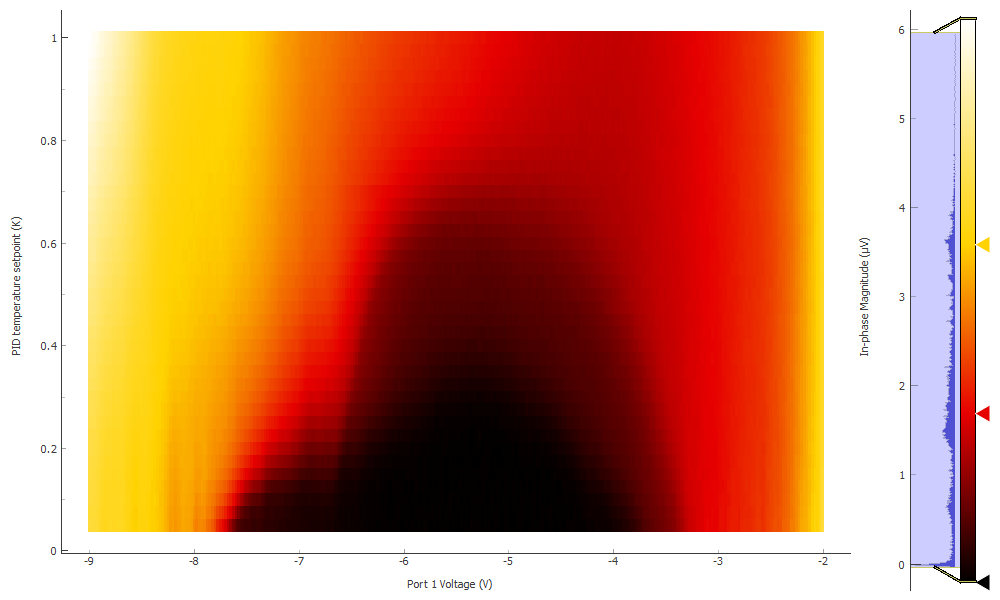

In [467]:
plot439[0]

In [468]:
triton.pid_range(31.6)

In [469]:
srframe.volt_p1(-9)
time.sleep(30)
gvals = np.linspace(-9, -2, 281)
Tvals = np.linspace(1.05, 1.4, 8)
data440, plot440 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.2, Param2_SetBetween=0, DataName='M26SC_865_28-27_830_29-28_1p05Kto1p4K_1nA')

Started at 2020-03-21 03:19:17
DataSet:
   location = 'data/2020-03-21/#001_M26SC_865_28-27_830_29-28_1p05Kto1p4K_1nA_03-19-15'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (8,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (8, 281)
   Measured | lockin865_X             | X            | (8, 281)
   Measured | lockin865_Y             | Y            | (8, 281)
   Measured | lockin830_X             | X            | (8, 281)
   Measured | lockin830_Y             | Y            | (8, 281)
Finished at 2020-03-21 04:41:14


In [470]:
triton.pid_range(100)

In [471]:
srframe.volt_p1(-9)
time.sleep(30)
gvals = np.linspace(-9, -2, 281)
Tvals = np.linspace(1.45, 2, 12)
data441, plot441 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.2, Param2_SetBetween=0, DataName='M26SC_865_28-27_830_29-28_1p45Kto2K_1nA')

Started at 2020-03-21 04:41:47
DataSet:
   location = 'data/2020-03-21/#002_M26SC_865_28-27_830_29-28_1p45Kto2K_1nA_04-41-44'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (12,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (12, 281)
   Measured | lockin865_X             | X            | (12, 281)
   Measured | lockin865_Y             | Y            | (12, 281)
   Measured | lockin830_X             | X            | (12, 281)
   Measured | lockin830_Y             | Y            | (12, 281)
Finished at 2020-03-21 06:43:41


In [475]:
triton.pid_mode()  # cool down again

0

In [474]:
srframe.volt_p1()

0.0

In [482]:
triton.read_temps()

MC - on:  0.0285804 K
MC_cernox - off:  1.21336 K
still - off:  0.766062 K
cold_plate - off:  0.260684 K
magnet - off:  3.90164 K
PT2h - off:  3.2002 K
PT2p - off:  3.42827 K
PT1h - off:  47.0749 K
PT1p - off:  59.1463 K


In [483]:
lockin865.time_constant(0.3)

In [484]:
lockin830.time_constant(0.3)

In [485]:
lockin865.frequency(7.7717)

In [486]:
triton.field_set_stable(-0.5)

Please wait 309.514 seconds for the field sweep, plus the time required for operating the switch...


In [487]:
lockin865.amplitude(0.5)#5nA

In [489]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data442, plot442 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data443, plot443 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-21 11:25:05
DataSet:
   location = 'data/2020-03-21/#003_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_11-25-04'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 11:35:22
Sweep time approximately 610.012 seconds
Started at 2020-03-21 11:35:29
DataSet:
   location = 'data/2020-03-21/#004_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_11-35-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [491]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data444, plot444 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data445, plot445 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-21 11:46:16
DataSet:
   location = 'data/2020-03-21/#005_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_baseT_11-46-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 11:56:33
Sweep time approximately 610.0 seconds
Started at 2020-03-21 11:56:40
DataSet:
   location = 'data/2020-03-21/#006_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_baseT_11-56-39'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [494]:
srframe.volt_p1(-6)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data446, plot446 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data447, plot447 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-21 12:12:09
DataSet:
   location = 'data/2020-03-21/#007_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_baseT_12-12-08'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 12:22:26
Sweep time approximately 610.0 seconds
Started at 2020-03-21 12:22:33
DataSet:
   location = 'data/2020-03-21/#008_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_baseT_12-22-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [495]:
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data448, plot448 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data449, plot449 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-21 12:33:17
DataSet:
   location = 'data/2020-03-21/#009_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_baseT_12-33-16'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 12:43:34
Sweep time approximately 610.012 seconds
Started at 2020-03-21 12:43:41
DataSet:
   location = 'data/2020-03-21/#010_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_baseT_12-43-40'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [496]:
srframe.volt_p1(-3)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data450, plot450 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-3_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data451, plot451 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-3_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-21 12:54:25
DataSet:
   location = 'data/2020-03-21/#011_M26SC_hysteresisupVbg-3_865_28-27_830_29-28_5nA_baseT_12-54-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 13:04:42
Sweep time approximately 610.012 seconds
Started at 2020-03-21 13:04:48
DataSet:
   location = 'data/2020-03-21/#012_M26SC_hysteresisupVbg-3_865_28-27_830_29-28_5nA_baseT_13-04-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

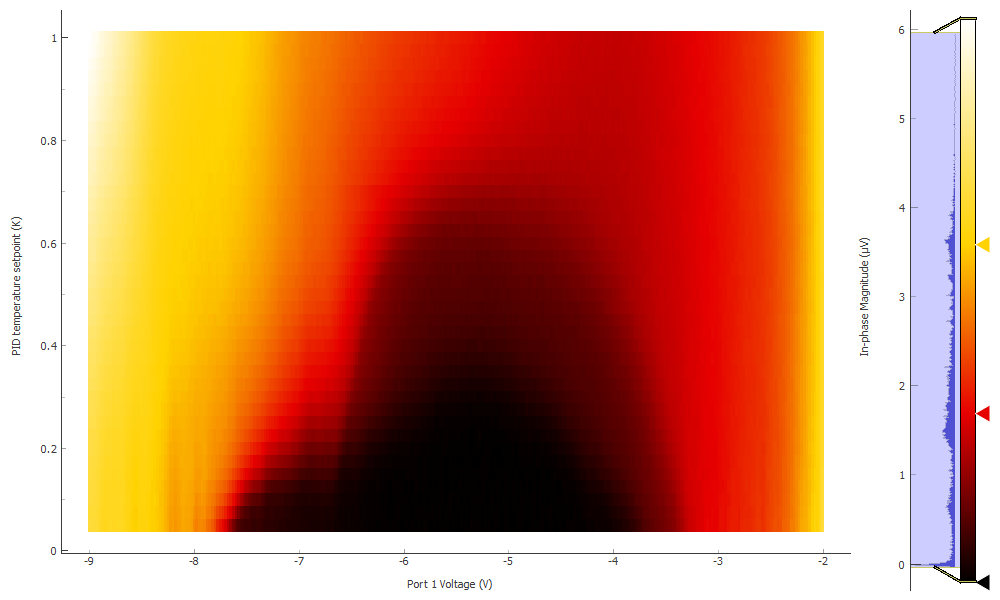

In [498]:
plot439[0]

<IPython.core.display.Javascript object>


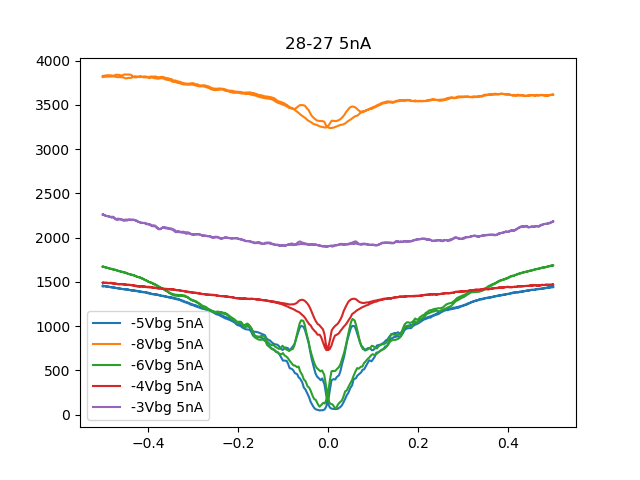

In [497]:
plt.figure()
plt.title('28-27 5nA')
plt.plot(*concathyst(data442, data443, 5e-9), label='-5Vbg 5nA')
plt.plot(*concathyst(data444, data445, 5e-9), label='-8Vbg 5nA')
plt.plot(*concathyst(data446, data447, 5e-9), label='-6Vbg 5nA')
plt.plot(*concathyst(data448, data449, 5e-9), label='-4Vbg 5nA')
plt.plot(*concathyst(data450, data451, 5e-9), label='-3Vbg 5nA')
plt.legend()

In [499]:
# -3Vg outside SC region, -4,-5,-6Vg in the SC region, -8Vg just a little outside SC region
# Check the -4, -5 and -8Vg hysteresis T dependence and compare them

In [500]:
triton.pid_setpoint(0.05)

In [116]:
triton.pid_mode(1)

In [115]:
triton.pid_range(3.16)

In [120]:
triton.PT2h_temp_enable(0)# turn on off channel 1

In [121]:
triton.pid_range(10)

In [508]:
triton.pid_setpoint(0.1)

In [509]:
triton.pid_setpoint(0.1)
time.sleep(360)
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data452, plot452 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_100mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data453, plot453 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_100mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-21 14:02:05
DataSet:
   location = 'data/2020-03-21/#013_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_100mK_14-02-04'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 14:12:22
Sweep time approximately 610.0 seconds
Started at 2020-03-21 14:12:29
DataSet:
   location = 'data/2020-03-21/#014_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_100mK_14-12-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [510]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data454, plot454 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_100mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data455, plot455 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_100mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-21 14:23:13
DataSet:
   location = 'data/2020-03-21/#015_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_100mK_14-23-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 14:33:30
Sweep time approximately 610.0 seconds
Started at 2020-03-21 14:33:36
DataSet:
   location = 'data/2020-03-21/#016_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_100mK_14-33-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [511]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data456, plot456 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_100mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data457, plot457 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_100mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-21 14:44:20
DataSet:
   location = 'data/2020-03-21/#017_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_100mK_14-44-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 14:54:36
Sweep time approximately 610.012 seconds
Started at 2020-03-21 14:54:44
DataSet:
   location = 'data/2020-03-21/#018_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_100mK_14-54-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [515]:
triton.pid_setpoint(0.25)
time.sleep(360)
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data458, plot458 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_250mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data459, plot459 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_250mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.006 seconds
Started at 2020-03-21 15:34:14
DataSet:
   location = 'data/2020-03-21/#019_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_250mK_15-34-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 15:44:31
Sweep time approximately 610.012 seconds
Started at 2020-03-21 15:44:37
DataSet:
   location = 'data/2020-03-21/#020_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_250mK_15-44-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

In [516]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data460, plot460 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_250mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data461, plot461 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_250mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-21 15:55:21
DataSet:
   location = 'data/2020-03-21/#021_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_250mK_15-55-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 16:05:38
Sweep time approximately 610.006 seconds
Started at 2020-03-21 16:05:44
DataSet:
   location = 'data/2020-03-21/#022_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_250mK_16-05-44'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [517]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data462, plot462 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_250mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data463, plot463 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_250mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-03-21 16:16:28
DataSet:
   location = 'data/2020-03-21/#023_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_250mK_16-16-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 16:26:45
Sweep time approximately 610.0 seconds
Started at 2020-03-21 16:26:52
DataSet:
   location = 'data/2020-03-21/#024_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_250mK_16-26-51'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [524]:
triton.pid_setpoint(0.4)
time.sleep(360)
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data464, plot464 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_400mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data465, plot465 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_400mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-21 16:47:41
DataSet:
   location = 'data/2020-03-21/#025_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_400mK_16-47-40'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 16:57:58
Sweep time approximately 610.012 seconds
Started at 2020-03-21 16:58:05
DataSet:
   location = 'data/2020-03-21/#026_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_400mK_16-58-04'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [525]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data466, plot466 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_400mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data467, plot467 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_400mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-21 17:08:49
DataSet:
   location = 'data/2020-03-21/#027_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_400mK_17-08-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 17:19:06
Sweep time approximately 610.0179999999999 seconds
Started at 2020-03-21 17:19:13
DataSet:
   location = 'data/2020-03-21/#028_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_400mK_17-19-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | 

In [526]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data468, plot468 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_400mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data469, plot469 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_400mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.006 seconds
Started at 2020-03-21 17:29:57
DataSet:
   location = 'data/2020-03-21/#029_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_400mK_17-29-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 17:40:14
Sweep time approximately 610.0 seconds
Started at 2020-03-21 17:40:21
DataSet:
   location = 'data/2020-03-21/#030_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_400mK_17-40-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [530]:
triton.pid_setpoint(0.5)
time.sleep(360)
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data470, plot470 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_500mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data471, plot471 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_500mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-21 17:59:28
DataSet:
   location = 'data/2020-03-21/#031_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_500mK_17-59-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 18:09:45
Sweep time approximately 610.012 seconds
Started at 2020-03-21 18:09:52
DataSet:
   location = 'data/2020-03-21/#032_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_500mK_18-09-51'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [ ]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data472, plot472 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_500mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data473, plot473 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_500mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-21 18:20:36
DataSet:
   location = 'data/2020-03-21/#033_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_500mK_18-20-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 18:30:53
Sweep time approximately 610.006 seconds
Started at 2020-03-21 18:30:59


In [ ]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data474, plot474 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_500mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data475, plot475 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_500mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

In [ ]:
# after restart the notebook, somehow the data between 500mK to 1K don't show here, but they are in the data folder
#try to get the data 1-2K first

In [12]:
triton.pid_range(31.6)

In [13]:
triton.pid_setpoint(1.2)
time.sleep(360)
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data600, plot600 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data601, plot601 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Are you sure you want to use the magnet? [y/n]: y
Sweep time approximately 610.012 seconds
Started at 2020-03-21 23:47:07
DataSet:
   location = 'data/2020-03-21/#055_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.2K_23-47-03'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-21 23:57:22
Sweep time approximately 610.006 seconds
Started at 2020-03-21 23:57:29
DataSet:
   location = 'data/2020-03-21/#056_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.2K_23-57-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0       

In [14]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data603, plot603 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data604, plot604 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 00:08:14
DataSet:
   location = 'data/2020-03-22/#001_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.2K_00-08-13'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 00:18:31
Sweep time approximately 610.0 seconds
Started at 2020-03-22 00:18:38
DataSet:
   location = 'data/2020-03-22/#002_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.2K_00-18-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field |

In [15]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data605, plot605 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data606, plot606 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.012 seconds
Started at 2020-03-22 00:29:27
DataSet:
   location = 'data/2020-03-22/#003_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.2K_00-29-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 00:39:44
Sweep time approximately 610.012 seconds
Started at 2020-03-22 00:39:51
DataSet:
   location = 'data/2020-03-22/#004_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.2K_00-39-50'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [16]:
triton.pid_setpoint(1.4)
time.sleep(360)
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data607, plot607 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data608, plot608 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 00:56:43
DataSet:
   location = 'data/2020-03-22/#005_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.4K_00-56-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 01:07:00
Sweep time approximately 610.006 seconds
Started at 2020-03-22 01:07:06
DataSet:
   location = 'data/2020-03-22/#006_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.4K_01-07-05'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [17]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data609, plot609 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data610, plot610 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.006 seconds
Started at 2020-03-22 01:17:52
DataSet:
   location = 'data/2020-03-22/#007_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.4K_01-17-51'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 01:28:09
Sweep time approximately 610.006 seconds
Started at 2020-03-22 01:28:16
DataSet:
   location = 'data/2020-03-22/#008_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.4K_01-28-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [18]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data611, plot611 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data612, plot612 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 01:39:07
DataSet:
   location = 'data/2020-03-22/#009_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.4K_01-39-06'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 01:49:24
Sweep time approximately 610.0 seconds
Started at 2020-03-22 01:49:31
DataSet:
   location = 'data/2020-03-22/#010_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.4K_01-49-30'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field |

In [19]:
triton.pid_range(100)

In [20]:
triton.pid_setpoint(1.6)
time.sleep(360)
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data613, plot613 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data614, plot614 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 02:06:23
DataSet:
   location = 'data/2020-03-22/#011_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K_02-06-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 02:16:40
Sweep time approximately 609.994 seconds
Started at 2020-03-22 02:16:46
DataSet:
   location = 'data/2020-03-22/#012_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K_02-16-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [21]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data615, plot615 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data616, plot616 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 02:27:31
DataSet:
   location = 'data/2020-03-22/#013_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.6K_02-27-30'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 02:37:48
Sweep time approximately 610.006 seconds
Started at 2020-03-22 02:37:55
DataSet:
   location = 'data/2020-03-22/#014_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.6K_02-37-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [22]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data617, plot617 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data618, plot618 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 02:48:44
DataSet:
   location = 'data/2020-03-22/#015_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.6K_02-48-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 02:59:01
Sweep time approximately 610.012 seconds
Started at 2020-03-22 02:59:08
DataSet:
   location = 'data/2020-03-22/#016_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.6K_02-59-07'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [23]:
triton.pid_setpoint(1.8)
time.sleep(360)
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data619, plot619 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.8K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data620, plot620 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.8K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.988 seconds
Started at 2020-03-22 03:16:00
DataSet:
   location = 'data/2020-03-22/#017_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.8K_03-15-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 03:26:17
Sweep time approximately 610.006 seconds
Started at 2020-03-22 03:26:24
DataSet:
   location = 'data/2020-03-22/#018_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.8K_03-26-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [24]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data621, plot621 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.8K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data622, plot622 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.8K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 03:37:12
DataSet:
   location = 'data/2020-03-22/#019_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.8K_03-37-11'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 03:47:29
Sweep time approximately 610.0 seconds
Started at 2020-03-22 03:47:35
DataSet:
   location = 'data/2020-03-22/#020_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.8K_03-47-34'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field |

In [25]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data623, plot623 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.8K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data624, plot624 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.8K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-03-22 03:58:23
DataSet:
   location = 'data/2020-03-22/#021_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.8K_03-58-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 04:08:40
Sweep time approximately 610.0 seconds
Started at 2020-03-22 04:08:47
DataSet:
   location = 'data/2020-03-22/#022_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.8K_04-08-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [26]:
triton.pid_setpoint(2)
time.sleep(360)
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data625, plot625 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data626, plot626 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.006 seconds
Started at 2020-03-22 04:25:39
DataSet:
   location = 'data/2020-03-22/#023_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_2K_04-25-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 04:35:56
Sweep time approximately 610.0 seconds
Started at 2020-03-22 04:36:03
DataSet:
   location = 'data/2020-03-22/#024_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_2K_04-36-02'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | f

In [27]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data627, plot627 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data628, plot628 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.012 seconds
Started at 2020-03-22 04:46:50
DataSet:
   location = 'data/2020-03-22/#025_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_2K_04-46-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 04:57:07
Sweep time approximately 610.0 seconds
Started at 2020-03-22 04:57:14
DataSet:
   location = 'data/2020-03-22/#026_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_2K_04-57-13'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | f

In [28]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data629, plot629 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data630, plot630 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.012 seconds
Started at 2020-03-22 05:08:03
DataSet:
   location = 'data/2020-03-22/#027_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_2K_05-08-02'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 05:18:19
Sweep time approximately 610.012 seconds
Started at 2020-03-22 05:18:26
DataSet:
   location = 'data/2020-03-22/#028_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_2K_05-18-25'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field |

In [76]:
# the data above 1.2K is super weird, measure them again

In [77]:
triton.pid_setpoint(1.3)
time.sleep(360)
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data631, plot631 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.3K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data632, plot632 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.3K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.024 seconds
Started at 2020-03-22 13:09:47
DataSet:
   location = 'data/2020-03-22/#029_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.3K_13-09-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 13:20:04
Sweep time approximately 610.0 seconds
Started at 2020-03-22 13:20:11
DataSet:
   location = 'data/2020-03-22/#030_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.3K_13-20-11'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [78]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data633, plot633 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.3K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data634, plot634 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.3K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.006 seconds
Started at 2020-03-22 13:30:56
DataSet:
   location = 'data/2020-03-22/#031_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.3K_13-30-55'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 13:41:12
Sweep time approximately 610.0 seconds
Started at 2020-03-22 13:41:19
DataSet:
   location = 'data/2020-03-22/#032_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.3K_13-41-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [79]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data635, plot635 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.3K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data636, plot636 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.3K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 13:52:08
DataSet:
   location = 'data/2020-03-22/#033_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.3K_13-52-08'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 14:02:25
Sweep time approximately 610.012 seconds
Started at 2020-03-22 14:02:32
DataSet:
   location = 'data/2020-03-22/#034_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.3K_14-02-31'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [80]:
triton.pid_setpoint(1.4)
time.sleep(360)
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data637, plot637 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data638, plot638 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.012 seconds
Started at 2020-03-22 14:19:24
DataSet:
   location = 'data/2020-03-22/#035_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.4K_14-19-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 14:29:41
Sweep time approximately 610.012 seconds
Started at 2020-03-22 14:29:48
DataSet:
   location = 'data/2020-03-22/#036_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.4K_14-29-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [81]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data639, plot639 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data640, plot640 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 14:40:33
DataSet:
   location = 'data/2020-03-22/#037_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.4K_14-40-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 14:50:51
Sweep time approximately 610.0179999999999 seconds
Started at 2020-03-22 14:50:58
DataSet:
   location = 'data/2020-03-22/#038_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.4K_14-50-57'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | tr

In [82]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data641, plot641 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data642, plot642 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 15:01:47
DataSet:
   location = 'data/2020-03-22/#039_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.4K_15-01-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 15:12:04
Sweep time approximately 610.006 seconds
Started at 2020-03-22 15:12:11
DataSet:
   location = 'data/2020-03-22/#040_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.4K_15-12-10'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [90]:
triton.pid_setpoint(1.6)
time.sleep(360)
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data643, plot643 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data644, plot644 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 15:43:06
DataSet:
   location = 'data/2020-03-22/#041_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K_15-43-05'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 15:53:23
Sweep time approximately 610.0 seconds
Started at 2020-03-22 15:53:29
DataSet:
   location = 'data/2020-03-22/#042_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K_15-53-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field |

In [91]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data645, plot645 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data646, plot646 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 16:04:15
DataSet:
   location = 'data/2020-03-22/#043_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.6K_16-04-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 16:14:32
Sweep time approximately 610.0 seconds
Started at 2020-03-22 16:14:39
DataSet:
   location = 'data/2020-03-22/#044_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.6K_16-14-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field |

In [92]:
srframe.volt_p1(-8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data647, plot647 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data648, plot648 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.006 seconds
Started at 2020-03-22 16:25:29
DataSet:
   location = 'data/2020-03-22/#045_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.6K_16-25-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 16:35:46
Sweep time approximately 610.0 seconds
Started at 2020-03-22 16:35:52
DataSet:
   location = 'data/2020-03-22/#046_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.6K_16-35-51'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [69]:
data_other1 = qc.load_data('data/2020-03-21/#013_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_100mK_14-02-04')
data_other2 = qc.load_data('data/2020-03-21/#014_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_100mK_14-12-28')
data_other3 = qc.load_data('data/2020-03-21/#015_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_100mK_14-23-12')
data_other4 = qc.load_data('data/2020-03-21/#016_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_100mK_14-33-35')
data_other5 = qc.load_data('data/2020-03-21/#017_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_100mK_14-44-19')
data_other6 = qc.load_data('data/2020-03-21/#018_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_100mK_14-54-43')
data_other7 = qc.load_data('data/2020-03-21/#019_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_250mK_15-34-14')
data_other8 = qc.load_data('data/2020-03-21/#020_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_250mK_15-44-37')
data_other9 = qc.load_data('data/2020-03-21/#021_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_250mK_15-55-21')
data_other10 = qc.load_data('data/2020-03-21/#022_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_250mK_16-05-44')
data_other11 = qc.load_data('data/2020-03-21/#023_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_250mK_16-16-28')
data_other12 = qc.load_data('data/2020-03-21/#024_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_250mK_16-26-51')
data_other13 = qc.load_data('data/2020-03-21/#025_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_400mK_16-47-40')
data_other14 = qc.load_data('data/2020-03-21/#026_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_400mK_16-58-04')
data_other15 = qc.load_data('data/2020-03-21/#027_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_400mK_17-08-48')
data_other16 = qc.load_data('data/2020-03-21/#028_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_400mK_17-19-12')
data_other17 = qc.load_data('data/2020-03-21/#029_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_400mK_17-29-56')
data_other18 = qc.load_data('data/2020-03-21/#030_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_400mK_17-40-20')
data_other19 = qc.load_data('data/2020-03-21/#031_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_500mK_17-59-27')
data_other20 = qc.load_data('data/2020-03-21/#032_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_500mK_18-09-51')
data_other21 = qc.load_data('data/2020-03-21/#033_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_500mK_18-20-35')
data_other22 = qc.load_data('data/2020-03-21/#034_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_500mK_18-30-58')
data_other23 = qc.load_data('data/2020-03-21/#035_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_500mK_18-41-43')
data_other24 = qc.load_data('data/2020-03-21/#036_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_500mK_18-52-06')
data_other25 = qc.load_data('data/2020-03-21/#037_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_650mK_19-12-07')
data_other26 = qc.load_data('data/2020-03-21/#038_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_650mK_19-22-31')
data_other27 = qc.load_data('data/2020-03-21/#039_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_650mK_19-33-15')
data_other28 = qc.load_data('data/2020-03-21/#040_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_650mK_19-43-39')
data_other29 = qc.load_data('data/2020-03-21/#041_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_650mK_19-54-23')
data_other30 = qc.load_data('data/2020-03-21/#042_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_650mK_20-04-47')
data_other31 = qc.load_data('data/2020-03-21/#043_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_800mK_20-27-47')
data_other32 = qc.load_data('data/2020-03-21/#044_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_800mK_20-38-20')
data_other33 = qc.load_data('data/2020-03-21/#045_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_800mK_20-49-04')
data_other34 = qc.load_data('data/2020-03-21/#046_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_800mK_20-59-28')
data_other35 = qc.load_data('data/2020-03-21/#047_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_800mK_21-10-13')
data_other36 = qc.load_data('data/2020-03-21/#048_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_800mK_21-20-37')
data_other37 = qc.load_data('data/2020-03-21/#049_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1K_21-43-05')
data_other38 = qc.load_data('data/2020-03-21/#050_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1K_21-53-28')
data_other39 = qc.load_data('data/2020-03-21/#051_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1K_22-04-12')
data_other40 = qc.load_data('data/2020-03-21/#052_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1K_22-14-36')
data_other41 = qc.load_data('data/2020-03-21/#053_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1K_22-25-20')
data_other42 = qc.load_data('data/2020-03-21/#054_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1K_22-35-44')
data_other43 = qc.load_data('data/2020-03-21/#055_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.2K_23-47-03')
data_other44 = qc.load_data('data/2020-03-21/#056_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.2K_23-57-28')
data_other45 = qc.load_data('data/2020-03-22/#001_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.2K_00-08-13')
data_other46 = qc.load_data('data/2020-03-22/#002_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.2K_00-18-37')
data_other47 = qc.load_data('data/2020-03-22/#003_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.2K_00-29-26')
data_other48 = qc.load_data('data/2020-03-22/#004_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.2K_00-39-50')
data_other49 = qc.load_data('data/2020-03-22/#005_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.4K_00-56-42')
data_other50 = qc.load_data('data/2020-03-22/#006_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.4K_01-07-05')
data_other51 = qc.load_data('data/2020-03-22/#007_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.4K_01-17-51')
data_other52 = qc.load_data('data/2020-03-22/#008_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_1.4K_01-28-15')
data_other53 = qc.load_data('data/2020-03-22/#009_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.4K_01-39-06')
data_other54 = qc.load_data('data/2020-03-22/#010_M26SC_hysteresisupVbg-8_865_28-27_830_29-28_5nA_1.4K_01-49-30')

<IPython.core.display.Javascript object>


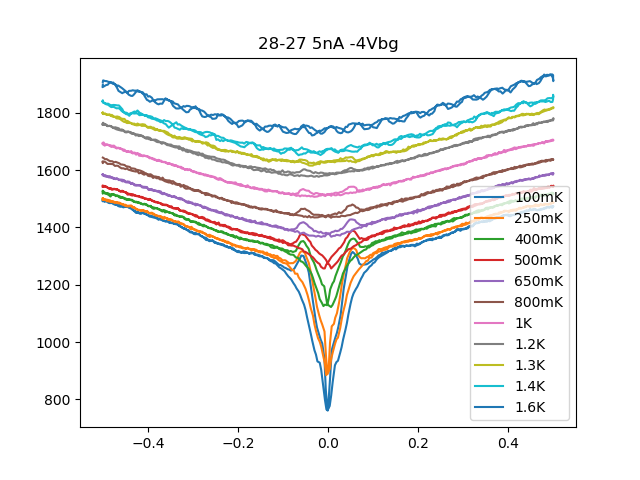

In [99]:
plt.figure()
plt.title('28-27 5nA -4Vbg')
plt.plot(*concathyst(data_other1, data_other2, 5e-9), label='100mK')
plt.plot(*concathyst(data_other7, data_other8, 5e-9), label='250mK')
plt.plot(*concathyst(data_other13, data_other14, 5e-9), label='400mK')
plt.plot(*concathyst(data_other19, data_other20, 5e-9), label='500mK')
plt.plot(*concathyst(data_other25, data_other26, 5e-9), label='650mK')
plt.plot(*concathyst(data_other31, data_other32, 5e-9), label='800mK')
plt.plot(*concathyst(data_other37, data_other38, 5e-9), label='1K')
plt.plot(*concathyst(data_other43, data_other44, 5e-9), label='1.2K')
plt.plot(*concathyst(data631, data632, 5e-9), label='1.3K')
plt.plot(*concathyst(data637, data638, 5e-9), label='1.4K')
plt.plot(*concathyst(data643, data644, 5e-9), label='1.6K')
plt.legend()

<IPython.core.display.Javascript object>


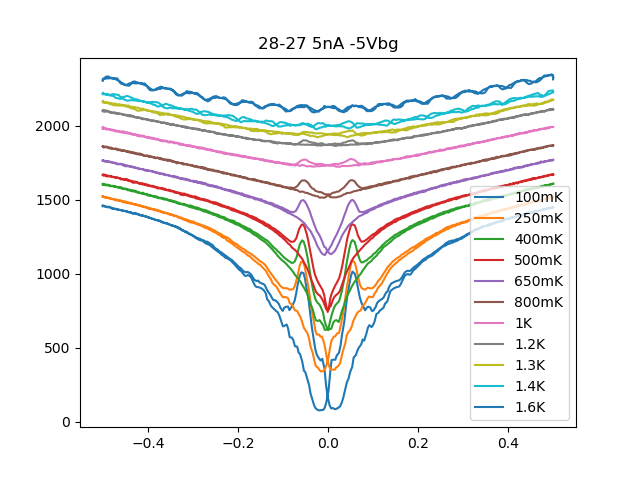

In [98]:
plt.figure()
plt.title('28-27 5nA -5Vbg')
plt.plot(*concathyst(data_other3, data_other4, 5e-9), label='100mK')
plt.plot(*concathyst(data_other9, data_other10, 5e-9), label='250mK')
plt.plot(*concathyst(data_other15, data_other16, 5e-9), label='400mK')
plt.plot(*concathyst(data_other21, data_other22, 5e-9), label='500mK')
plt.plot(*concathyst(data_other27, data_other28, 5e-9), label='650mK')
plt.plot(*concathyst(data_other33, data_other34, 5e-9), label='800mK')
plt.plot(*concathyst(data_other39, data_other40, 5e-9), label='1K')
plt.plot(*concathyst(data_other45, data_other46, 5e-9), label='1.2K')
plt.plot(*concathyst(data633, data634, 5e-9), label='1.3K')
plt.plot(*concathyst(data639, data640, 5e-9), label='1.4K')
plt.plot(*concathyst(data645, data646, 5e-9), label='1.6K')
plt.legend()

<IPython.core.display.Javascript object>


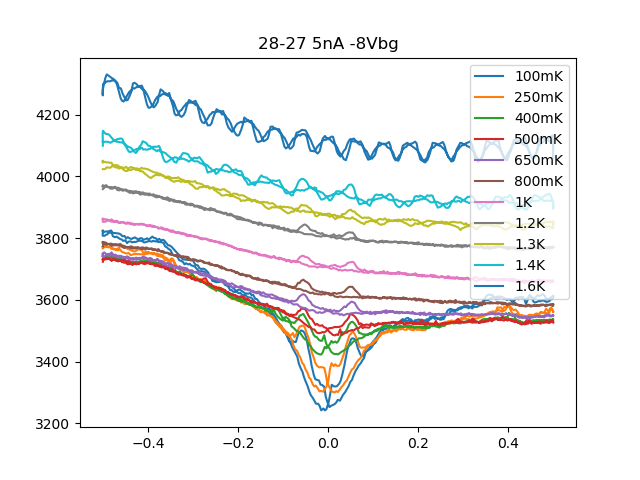

In [97]:
plt.figure()
plt.title('28-27 5nA -8Vbg')
plt.plot(*concathyst(data_other5, data_other6, 5e-9), label='100mK')
plt.plot(*concathyst(data_other11, data_other12, 5e-9), label='250mK')
plt.plot(*concathyst(data_other17, data_other18, 5e-9), label='400mK')
plt.plot(*concathyst(data_other23, data_other24, 5e-9), label='500mK')
plt.plot(*concathyst(data_other29, data_other30, 5e-9), label='650mK')
plt.plot(*concathyst(data_other35, data_other36, 5e-9), label='800mK')
plt.plot(*concathyst(data_other41, data_other42, 5e-9), label='1K')
plt.plot(*concathyst(data_other47, data_other48, 5e-9), label='1.2K')
plt.plot(*concathyst(data635, data636, 5e-9), label='1.3K')
plt.plot(*concathyst(data641, data642, 5e-9), label='1.4K')
plt.plot(*concathyst(data647, data648, 5e-9), label='1.6K')
plt.legend()

In [75]:
# the hysteresis in M26 SC device is around SC gate region, and the hysteresis disappear around 1.2K, however above 1.2K
# the sweep shows weird waggles

In [100]:
# at 1.6K check the sweep at other gate point to see if there is this waggle

In [101]:
srframe.volt_p1(-1)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data649, plot649 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-1_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data650, plot650 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-1_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 17:15:23
DataSet:
   location = 'data/2020-03-22/#047_M26SC_hysteresisupVbg-1_865_28-27_830_29-28_5nA_1.6K_17-15-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 17:25:40
Sweep time approximately 610.012 seconds
Started at 2020-03-22 17:25:47
DataSet:
   location = 'data/2020-03-22/#048_M26SC_hysteresisupVbg-1_865_28-27_830_29-28_5nA_1.6K_17-25-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [102]:
srframe.volt_p1(2)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data651, plot651 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg2_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data652, plot652 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg2_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 17:36:36
DataSet:
   location = 'data/2020-03-22/#049_M26SC_hysteresisupVbg2_865_28-27_830_29-28_5nA_1.6K_17-36-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 17:46:53
Sweep time approximately 610.006 seconds
Started at 2020-03-22 17:47:00
DataSet:
   location = 'data/2020-03-22/#050_M26SC_hysteresisupVbg2_865_28-27_830_29-28_5nA_1.6K_17-46-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field |

In [103]:
srframe.volt_p1(8)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data653, plot653 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg8_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data654, plot654 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg8_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-22 17:57:55
DataSet:
   location = 'data/2020-03-22/#051_M26SC_hysteresisupVbg8_865_28-27_830_29-28_5nA_1.6K_17-57-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 18:08:14
Sweep time approximately 610.006 seconds
Started at 2020-03-22 18:08:21
DataSet:
   location = 'data/2020-03-22/#052_M26SC_hysteresisupVbg8_865_28-27_830_29-28_5nA_1.6K_18-08-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field |

In [105]:
srframe.volt_p1(-0.5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data655, plot655 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-0p5_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data656, plot656 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-0p5_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.012 seconds
Started at 2020-03-22 21:23:44
DataSet:
   location = 'data/2020-03-22/#053_M26SC_hysteresisupVbg-0p5_865_28-27_830_29-28_5nA_1.6K_21-23-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 21:34:01
Sweep time approximately 610.0 seconds
Started at 2020-03-22 21:34:07
DataSet:
   location = 'data/2020-03-22/#054_M26SC_hysteresisupVbg-0p5_865_28-27_830_29-28_5nA_1.6K_21-34-06'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

In [106]:
srframe.volt_p1(1.5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data657, plot657 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data658, plot658 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.006 seconds
Started at 2020-03-22 21:44:54
DataSet:
   location = 'data/2020-03-22/#055_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_5nA_1.6K_21-44-53'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-22 21:55:11
Sweep time approximately 610.0 seconds
Started at 2020-03-22 21:55:17
DataSet:
   location = 'data/2020-03-22/#056_M26SC_hysteresisupVbg1p5_865_28-27_830_29-28_5nA_1.6K_21-55-16'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

<IPython.core.display.Javascript object>


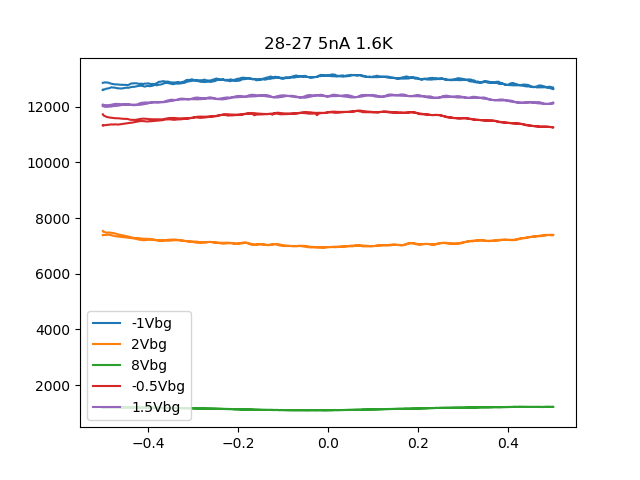

In [109]:
plt.figure()
plt.title('28-27 5nA 1.6K')
plt.plot(*concathyst(data649, data650, 5e-9), label='-1Vbg')
plt.plot(*concathyst(data651, data652, 5e-9), label='2Vbg')
plt.plot(*concathyst(data653, data654, 5e-9), label='8Vbg')
plt.plot(*concathyst(data655, data656, 5e-9), label='-0.5Vbg')
plt.plot(*concathyst(data657, data658, 5e-9), label='1.5Vbg')
plt.legend()

In [111]:
srframe.volt_p1(0)

In [133]:
triton.pid_mode()

1

In [131]:
triton.pid_setpoint(1.6)

In [134]:
triton.pid_setpoint(1.6)
time.sleep(360)
srframe.volt_p1(-4)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data659, plot659 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data660, plot660 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-03-23 10:03:29
DataSet:
   location = 'data/2020-03-23/#001_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K_10-03-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-23 10:13:45
Sweep time approximately 610.012 seconds
Started at 2020-03-23 10:13:52
DataSet:
   location = 'data/2020-03-23/#002_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K_10-13-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [141]:
triton.pid_setpoint(1.6)

In [142]:
triton.magnet_sweeprate(0.05)#slower scan rate
triton.field(0.5)
data661, plot661 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data662, plot662 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1210.012 seconds
Started at 2020-03-23 11:22:55
DataSet:
   location = 'data/2020-03-23/#003_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K_11-22-55'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-23 11:43:14
Sweep time approximately 1210.018 seconds
Started at 2020-03-23 11:43:21
DataSet:
   location = 'data/2020-03-23/#004_M26SC_hysteresisupVbg-4_865_28-27_830_29-28_5nA_1.6K_11-43-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

<IPython.core.display.Javascript object>


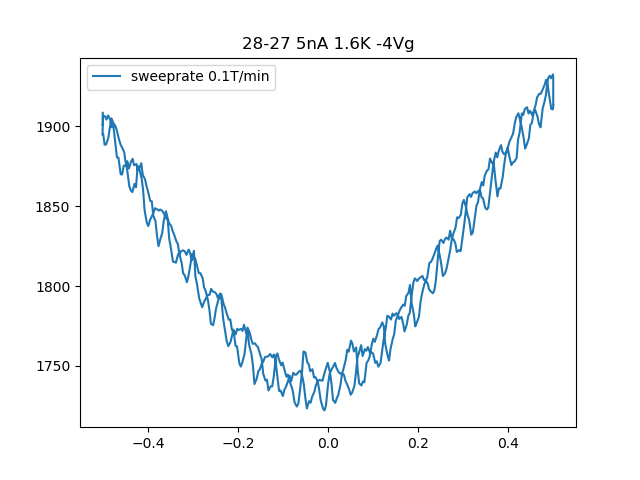

In [146]:
plt.figure()
plt.title('28-27 5nA 1.6K -4Vg')
plt.plot(*concathyst(data659, data660, 5e-9), label='sweeprate 0.1T/min')
plt.legend()

<IPython.core.display.Javascript object>


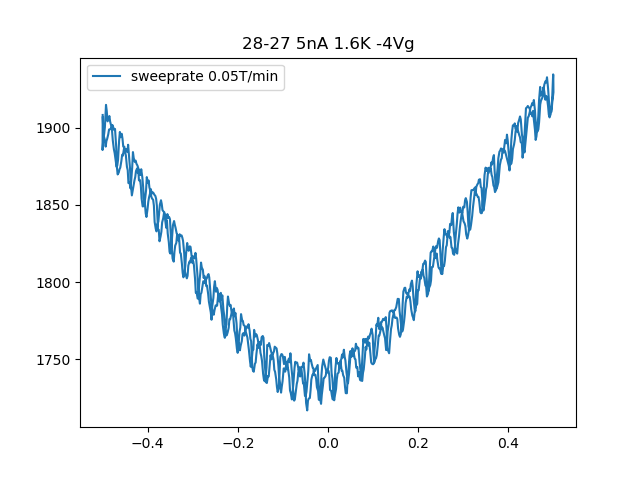

In [147]:
plt.figure()
plt.title('28-27 5nA 1.6K -4Vg')
plt.plot(*concathyst(data661, data662, 5e-9), label='sweeprate 0.05T/min')
plt.legend()

In [ ]:
# the waggling may due to T pid control not stable because even without sweep the field, the lockin screen also shows
#those oscillations, the temperature is fluctuating when setting in the range of 1.2-2K

In [ ]:
#next maybe try dV/dI at different temperature

In [165]:
triton.field()

0.0

In [155]:
lockin865.amplitude(0.1)

In [156]:
lockin865.frequency(13.6667)

In [157]:
lockin865.time_constant(0.1)

In [166]:
triton.pid_setpoint(1.6)
time.sleep(360)
srframe.volt_p5(-4)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data663, plot663 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_1.6K_0T')
srframe.volt_p5(0)

Started at 2020-03-23 13:13:42
DataSet:
   location = 'data/2020-03-23/#005_M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_1.6K_0T_13-13-40'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
Finished at 2020-03-23 13:18:29


In [167]:
srframe.volt_p5(-5)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data664, plot664 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_1.6K_0T')
srframe.volt_p5(0)

Started at 2020-03-23 13:21:22
DataSet:
   location = 'data/2020-03-23/#006_M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_1.6K_0T_13-21-20'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
Finished at 2020-03-23 13:26:07


In [168]:
srframe.volt_p5(-8)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data665, plot665 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-8_865_28-27_830_29-28_1nA_1.6K_0T')
srframe.volt_p5(0)

Started at 2020-03-23 13:27:05
DataSet:
   location = 'data/2020-03-23/#007_M26SC_dvdiVbg-8_865_28-27_830_29-28_1nA_1.6K_0T_13-27-03'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
Finished at 2020-03-23 13:31:45


In [170]:
triton.pid_setpoint(1.4)
time.sleep(360)
srframe.volt_p5(-4)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data666, plot666 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_1.4K_0T')
srframe.volt_p5(0)

srframe.volt_p5(-5)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data667, plot667 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_1.4K_0T')
srframe.volt_p5(0)

srframe.volt_p5(-8)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data668, plot668 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-8_865_28-27_830_29-28_1nA_1.4K_0T')
srframe.volt_p5(0)

Started at 2020-03-23 15:15:31
DataSet:
   location = 'data/2020-03-23/#008_M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_1.4K_0T_15-15-29'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
Finished at 2020-03-23 15:20:18
Started at 2020-03-23 15:21:10
DataSet:
   location = 'data/2020-03-23/#009_M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_1.4K_0T_15-21-09'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y           

In [171]:
triton.pid_setpoint(1.2)
time.sleep(360)
srframe.volt_p5(-4)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data669, plot669 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_1.2K_0T')
srframe.volt_p5(0)

srframe.volt_p5(-5)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data670, plot670 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_1.2K_0T')
srframe.volt_p5(0)

srframe.volt_p5(-8)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data671, plot671 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-8_865_28-27_830_29-28_1nA_1.2K_0T')
srframe.volt_p5(0)

Started at 2020-03-23 15:49:15
DataSet:
   location = 'data/2020-03-23/#011_M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_1.2K_0T_15-49-13'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
Finished at 2020-03-23 15:54:02
Started at 2020-03-23 15:54:55
DataSet:
   location = 'data/2020-03-23/#012_M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_1.2K_0T_15-54-53'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y           

In [172]:
triton.pid_setpoint(1)
time.sleep(360)
srframe.volt_p5(-4)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data672, plot672 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_1K_0T')
srframe.volt_p5(0)

srframe.volt_p5(-5)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data673, plot673 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_1K_0T')
srframe.volt_p5(0)

srframe.volt_p5(-8)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data674, plot674 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-8_865_28-27_830_29-28_1nA_1K_0T')
srframe.volt_p5(0)

Started at 2020-03-23 16:14:20
DataSet:
   location = 'data/2020-03-23/#014_M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_1K_0T_16-14-18'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
Finished at 2020-03-23 16:19:07
Started at 2020-03-23 16:20:00
DataSet:
   location = 'data/2020-03-23/#015_M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_1K_0T_16-19-58'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (

In [173]:
triton.pid_setpoint(0.8)

In [174]:
triton.pid_range(10)

In [175]:
triton.pid_setpoint(0.8)
time.sleep(360)
srframe.volt_p5(-4)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data675, plot675 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_800mK_0T')
srframe.volt_p5(0)

srframe.volt_p5(-5)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data676, plot676 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_800mK_0T')
srframe.volt_p5(0)

srframe.volt_p5(-8)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data677, plot677 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-8_865_28-27_830_29-28_1nA_800mK_0T')
srframe.volt_p5(0)

Started at 2020-03-23 17:03:29
DataSet:
   location = 'data/2020-03-23/#017_M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_800mK_0T_17-03-27'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
Finished at 2020-03-23 17:08:16
Started at 2020-03-23 17:09:09
DataSet:
   location = 'data/2020-03-23/#018_M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_800mK_0T_17-09-07'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y         

In [176]:
triton.pid_setpoint(0.65)

In [177]:
triton.pid_setpoint(0.65)
time.sleep(360)
srframe.volt_p5(-4)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data678, plot678 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_650mK_0T')
srframe.volt_p5(0)

srframe.volt_p5(-5)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data679, plot679 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_650mK_0T')
srframe.volt_p5(0)

srframe.volt_p5(-8)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data680, plot680 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-8_865_28-27_830_29-28_1nA_650mK_0T')
srframe.volt_p5(0)

Started at 2020-03-23 17:55:48
DataSet:
   location = 'data/2020-03-23/#020_M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_650mK_0T_17-55-46'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
Finished at 2020-03-23 18:00:36
Started at 2020-03-23 18:01:28
DataSet:
   location = 'data/2020-03-23/#021_M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_650mK_0T_18-01-26'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y         

In [178]:
triton.pid_setpoint(0.5)

In [179]:
triton.pid_setpoint(0.5)
time.sleep(360)
srframe.volt_p5(-4)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data681, plot681 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_500mK_0T')
srframe.volt_p5(0)

srframe.volt_p5(-5)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data682, plot682 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_500mK_0T')
srframe.volt_p5(0)

srframe.volt_p5(-8)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data683, plot683 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-8_865_28-27_830_29-28_1nA_500mK_0T')
srframe.volt_p5(0)

Started at 2020-03-23 19:00:19
DataSet:
   location = 'data/2020-03-23/#023_M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_500mK_0T_19-00-17'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
Finished at 2020-03-23 19:05:06
Started at 2020-03-23 19:05:58
DataSet:
   location = 'data/2020-03-23/#024_M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_500mK_0T_19-05-57'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y         

In [180]:
triton.pid_setpoint(0.4)
time.sleep(360)
srframe.volt_p5(-4)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data684, plot684 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_400mK_0T')
srframe.volt_p5(0)

srframe.volt_p5(-5)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data685, plot685 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_400mK_0T')
srframe.volt_p5(0)

srframe.volt_p5(-8)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data686, plot686 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-8_865_28-27_830_29-28_1nA_400mK_0T')
srframe.volt_p5(0)

Started at 2020-03-23 19:26:52
DataSet:
   location = 'data/2020-03-23/#026_M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_400mK_0T_19-26-50'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
Finished at 2020-03-23 19:31:39
Started at 2020-03-23 19:32:31
DataSet:
   location = 'data/2020-03-23/#027_M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_400mK_0T_19-32-30'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y         

In [181]:
triton.pid_setpoint(0.25)

In [182]:
triton.pid_setpoint(0.25)
time.sleep(360)
srframe.volt_p5(-4)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data687, plot687 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_250mK_0T')
srframe.volt_p5(0)

srframe.volt_p5(-5)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data688, plot688 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_250mK_0T')
srframe.volt_p5(0)

srframe.volt_p5(-8)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data689, plot689 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-8_865_28-27_830_29-28_1nA_250mK_0T')
srframe.volt_p5(0)

Started at 2020-03-23 20:05:27
DataSet:
   location = 'data/2020-03-23/#029_M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_250mK_0T_20-05-26'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
Finished at 2020-03-23 20:10:15
Started at 2020-03-23 20:11:07
DataSet:
   location = 'data/2020-03-23/#030_M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_250mK_0T_20-11-05'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y         

In [183]:
triton.pid_setpoint(0.1)

In [184]:
triton.pid_setpoint(0.1)
time.sleep(360)
srframe.volt_p5(-4)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data690, plot690 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_100mK_0T')
srframe.volt_p5(0)

srframe.volt_p5(-5)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data691, plot691 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_100mK_0T')
srframe.volt_p5(0)

srframe.volt_p5(-8)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data692, plot692 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-8_865_28-27_830_29-28_1nA_100mK_0T')
srframe.volt_p5(0)

Started at 2020-03-23 20:37:11
DataSet:
   location = 'data/2020-03-23/#032_M26SC_dvdiVbg-4_865_28-27_830_29-28_1nA_100mK_0T_20-37-09'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
Finished at 2020-03-23 20:41:58
Started at 2020-03-23 20:42:50
DataSet:
   location = 'data/2020-03-23/#033_M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_100mK_0T_20-42-49'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y         

In [214]:
# the above dvdi measurment is wrong because I actrually didn't change the gate voltage, if needed, must measure again..

In [186]:
triton.pid_mode(0)

In [215]:
lockin865.amplitude()

0.10000000149

In [12]:
srframe.volt_p1()

-5.0

In [13]:
srframe.volt_p5(-8)
time.sleep(25)
offvals = np.linspace(-8, 8, 161)  # -80 to 80 nA
data693, plot693 = npd.single_param_sweep(srframe.volt_p5, offvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_baseT_0T')
srframe.volt_p5(0)

Started at 2020-03-23 21:30:34
DataSet:
   location = 'data/2020-03-23/#035_M26SC_dvdiVbg-5_865_28-27_830_29-28_1nA_baseT_0T_21-30-30'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
Finished at 2020-03-23 21:35:14


In [15]:
lockin865.frequency(7.7717)

In [16]:
lockin865.amplitude(0.5)

In [21]:
lockin865.time_constant(0.3)

In [28]:
triton.field(-0.5)

Are you sure you want to use the magnet? [y/n]: y
Sweep time approximately 610.006 seconds


In [29]:
triton.magnet_sweeprate()

0.05

In [99]:
triton.field()

0.323896

In [38]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data694, plot695 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data695, plot695 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-03-23 21:54:16
DataSet:
   location = 'data/2020-03-23/#036_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_21-54-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-23 22:04:33
Sweep time approximately 610.006 seconds
Started at 2020-03-23 22:04:40
DataSet:
   location = 'data/2020-03-23/#037_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_22-04-39'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [ ]:
srframe.volt_p1(-5)
time.sleep(20)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data694, plot695 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data695, plot695 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

<IPython.core.display.Javascript object>


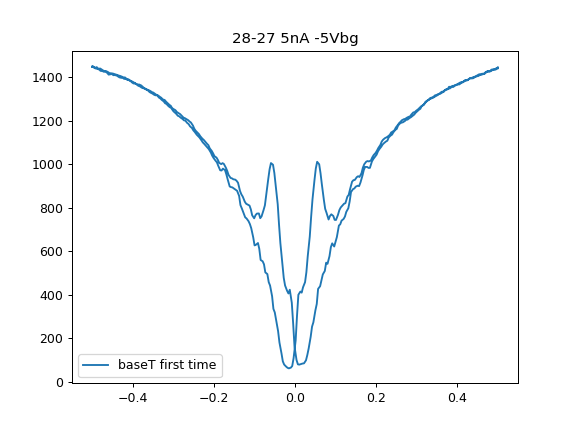

In [40]:
plt.figure()
plt.title('28-27 5nA -5Vbg')
plt.plot(*concathyst(data694, data695, 5e-9), label='baseT first time')
plt.legend()

In [69]:
triton.field()

-0.495851

In [56]:
triton.magnet_sweeprate(0.1)#stop at 60mT for 1min to see
triton.field(0.06)
data696, plot696 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.06, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data697, plot697 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 346.012 seconds
Started at 2020-03-23 23:07:23
DataSet:
   location = 'data/2020-03-23/#040_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_23-07-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-23 23:13:14
Sweep time approximately 273.988 seconds
Started at 2020-03-23 23:14:21
DataSet:
   location = 'data/2020-03-23/#041_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_23-14-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

In [70]:
triton.magnet_sweeprate(0.1)#stop at 35mT for 1min to see
triton.field(0.035)
data698, plot698 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.035, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data699, plot699 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 331.0 seconds
Started at 2020-03-23 23:35:20
DataSet:
   location = 'data/2020-03-23/#042_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_23-35-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-23 23:40:57
Sweep time approximately 289.0 seconds
Started at 2020-03-23 23:42:07
DataSet:
   location = 'data/2020-03-23/#043_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_23-42-03'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

In [87]:
triton.magnet_sweeprate(0.1)#stop at -60mT for 1min to see
triton.field(-0.06)
data700, plot700 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.06, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data701, plot701 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 274.00600000000003 seconds
Started at 2020-03-24 00:37:30
DataSet:
   location = 'data/2020-03-24/#004_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_00-37-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-24 00:42:09
Sweep time approximately 346.0 seconds
Started at 2020-03-24 00:43:15
DataSet:
   location = 'data/2020-03-24/#005_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_00-43-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured |

In [96]:
triton.magnet_sweeprate(0.1)#stop at 67mT for 1min to see
triton.field(0.067)
data702, plot702 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.067, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data703, plot703 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 350.21200000000005 seconds
Started at 2020-03-24 01:01:27
DataSet:
   location = 'data/2020-03-24/#007_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_01-01-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-24 01:07:25
Sweep time approximately 269.79400000000004 seconds
Started at 2020-03-24 01:08:32
DataSet:
   location = 'data/2020-03-24/#008_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_01-08-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)


In [101]:
triton.magnet_sweeprate(0.05)#slower rate
triton.field(0.5)
data704, plot704 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
time.sleep(60)
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data705, plot705 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1210.012 seconds
Started at 2020-03-24 01:25:40
Request timed out: ('getObjAttr', 12894, 0, b'\x80\x03}q\x00(X\x03\x00\x00\x00objq\x01cpyqtgraph.multiprocess.remoteproxy\nunpickleObjectProxy\nq\x02(M\xc80Mm\x19XP\x00\x00\x00<pyqtgraph.graphicsItems.PlotDataItem.PlotDataItem object at 0x000002761EAB4F78>q\x03)tq\x04Rq\x05X\x04\x00\x00\x00attrq\x06X\x07\x00\x00\x00setDataq\x07X\n\x00\x00\x00returnTypeq\x08X\x04\x00\x00\x00autoq\tu.')


  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel\kernelapp.py", line 505, in start
    self.io_loop.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\tornado\platform\asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 438, in run_forever
    self._run_once()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 1451, in _ru

DataSet:
   location = 'data/2020-03-24/#009_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_01-25-40'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-24 01:46:00
Sweep time approximately 1209.994 seconds
Started at 2020-03-24 01:47:11
DataSet:
   location = 'data/2020-03-24/#010_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_01-47-11'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X           

In [104]:
triton.field()

-0.499997

In [105]:
triton.magnet_sweeprate(0.1)#stop at 60mT then go back
triton.field(0.06)
data706, plot706 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.06, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data707, plot707 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 345.99399999999997 seconds
Started at 2020-03-24 09:52:34
DataSet:
   location = 'data/2020-03-24/#011_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_09-52-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-24 09:58:27
Sweep time approximately 346.0 seconds
Started at 2020-03-24 09:58:34
DataSet:
   location = 'data/2020-03-24/#012_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_09-58-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured |

In [107]:
triton.magnet_sweeprate(0.1)#stop at 35mT then go back
triton.field(0.035)
data708, plot708 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.035, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data709, plot709 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 331.012 seconds
Started at 2020-03-24 10:13:25
DataSet:
   location = 'data/2020-03-24/#013_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_10-13-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-03-24 10:19:02
Sweep time approximately 331.0 seconds
Started at 2020-03-24 10:19:09
DataSet:
   location = 'data/2020-03-24/#014_M26SC_hysteresisupVbg-5_865_28-27_830_29-28_5nA_baseT_10-19-08'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_fie

In [100]:
triton.field()

-0.499997

<IPython.core.display.Javascript object>


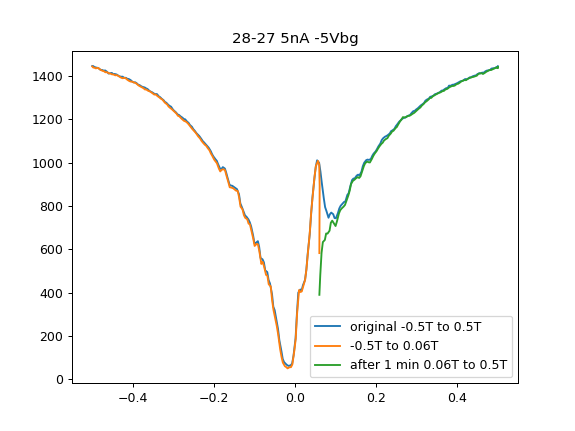

In [60]:
plt.figure()
plt.title('28-27 5nA -5Vbg')
plt.plot(data694.triton_field, data694.lockin865_X[:]/5e-9, label='original -0.5T to 0.5T')
plt.plot(data696.triton_field, data696.lockin865_X[:]/5e-9, label='-0.5T to 0.06T')
plt.plot(data697.triton_field, data697.lockin865_X[:]/5e-9, label='after 1 min 0.06T to 0.5T')
plt.legend()

<IPython.core.display.Javascript object>


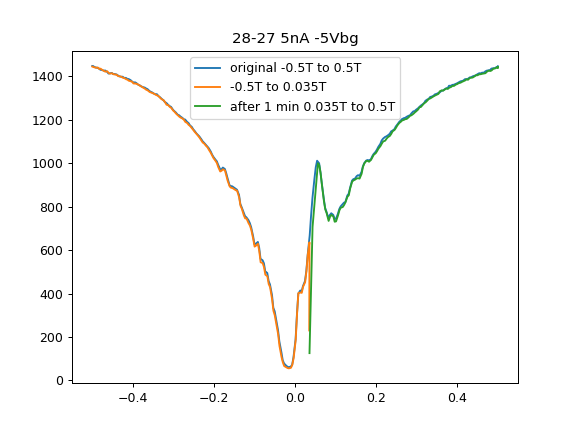

In [71]:
plt.figure()
plt.title('28-27 5nA -5Vbg')
plt.plot(data694.triton_field, data694.lockin865_X[:]/5e-9, label='original -0.5T to 0.5T')
plt.plot(data698.triton_field, data698.lockin865_X[:]/5e-9, label='-0.5T to 0.035T')
plt.plot(data699.triton_field, data699.lockin865_X[:]/5e-9, label='after 1 min 0.035T to 0.5T')
plt.legend()

<IPython.core.display.Javascript object>


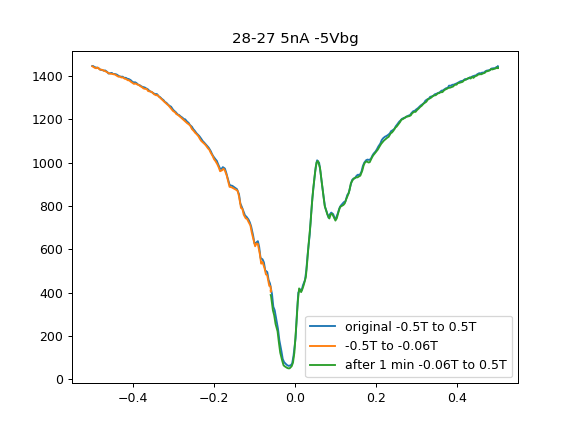

In [88]:
plt.figure()
plt.title('28-27 5nA -5Vbg')
plt.plot(data694.triton_field, data694.lockin865_X[:]/5e-9, label='original -0.5T to 0.5T')
plt.plot(data700.triton_field, data700.lockin865_X[:]/5e-9, label='-0.5T to -0.06T')
plt.plot(data701.triton_field, data701.lockin865_X[:]/5e-9, label='after 1 min -0.06T to 0.5T')
plt.legend()

<IPython.core.display.Javascript object>


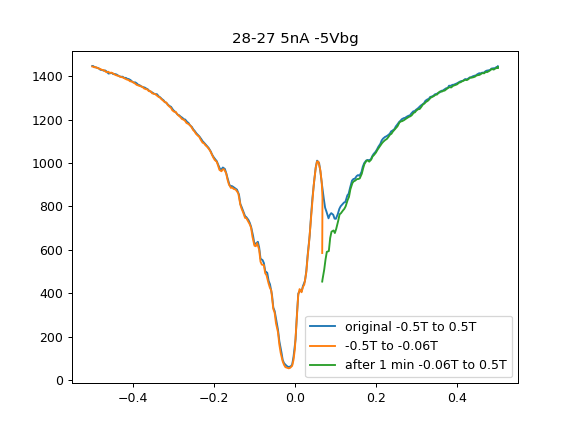

In [97]:
plt.figure()
plt.title('28-27 5nA -5Vbg')
plt.plot(data694.triton_field, data694.lockin865_X[:]/5e-9, label='original -0.5T to 0.5T')
plt.plot(data702.triton_field, data702.lockin865_X[:]/5e-9, label='-0.5T to -0.06T')
plt.plot(data703.triton_field, data703.lockin865_X[:]/5e-9, label='after 1 min -0.06T to 0.5T')
plt.legend()

<IPython.core.display.Javascript object>


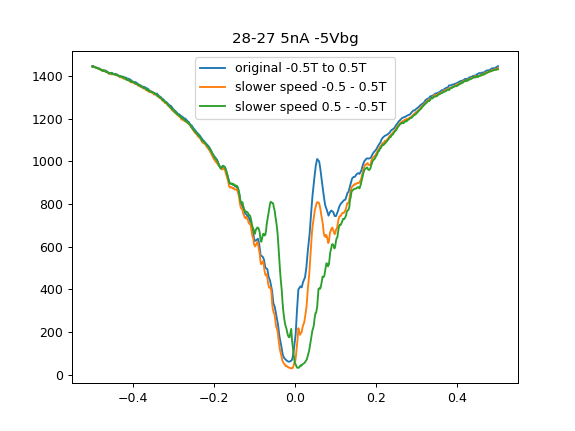

In [103]:
plt.figure()
plt.title('28-27 5nA -5Vbg')
plt.plot(data694.triton_field, data694.lockin865_X[:]/5e-9, label='original -0.5T to 0.5T')
plt.plot(data704.triton_field, data704.lockin865_X[:]/5e-9, label='slower speed -0.5 - 0.5T')
plt.plot(data705.triton_field, data705.lockin865_X[:]/5e-9, label='slower speed 0.5 - -0.5T ')
plt.legend()

<IPython.core.display.Javascript object>


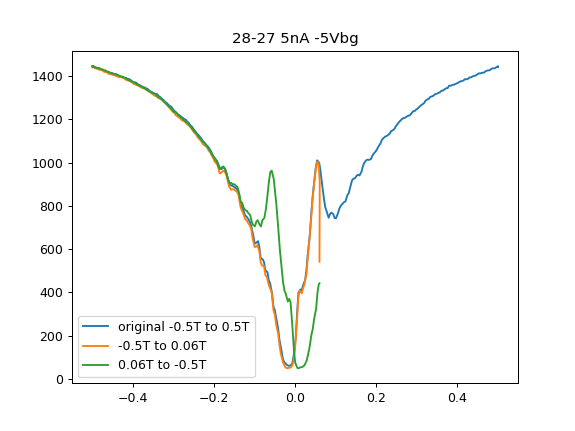

In [106]:
plt.figure()
plt.title('28-27 5nA -5Vbg')
plt.plot(data694.triton_field, data694.lockin865_X[:]/5e-9, label='original -0.5T to 0.5T')
plt.plot(data706.triton_field, data706.lockin865_X[:]/5e-9, label='-0.5T to 0.06T')
plt.plot(data707.triton_field, data707.lockin865_X[:]/5e-9, label='0.06T to -0.5T ')
plt.legend()

<IPython.core.display.Javascript object>


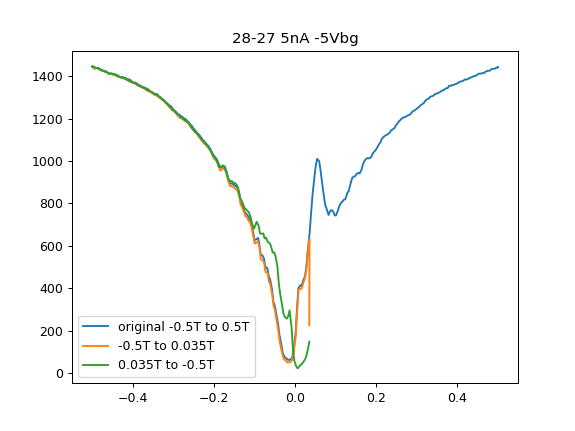

In [108]:
plt.figure()
plt.title('28-27 5nA -5Vbg')
plt.plot(data694.triton_field, data694.lockin865_X[:]/5e-9, label='original -0.5T to 0.5T')
plt.plot(data708.triton_field, data708.lockin865_X[:]/5e-9, label='-0.5T to 0.035T')
plt.plot(data709.triton_field, data709.lockin865_X[:]/5e-9, label='0.035T to -0.5T ')
plt.legend()

# W5 weak antilocalization and quantum oscillations

In [109]:
lockin865.frequency(13.6667)

In [110]:
lockin865.time_constant(0.1)

In [111]:
lockin830.time_constant(0.1)

In [115]:
lockin865.amplitude()

0.10000000149

In [113]:
#lockin 865 to 40-39 lockin 830 to 39-38

In [112]:
# base temp, cables plugged
srframe.volt_p1(-6)
time.sleep(30)
gvals = np.linspace(-6, 6, 241)
data710, plot710 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_865_40-39_830_39-38_baseT_1nA', YParam=[lockin865.X, lockin830.X])

Started at 2020-03-24 14:10:13
DataSet:
   location = 'data/2020-03-24/#015_W5_865_40-39_830_39-38_baseT_1nA_14-10-12'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (241,)
   Measured | lockin865_X         | X            | (241,)
   Measured | lockin865_Y         | Y            | (241,)
   Measured | lockin830_X         | X            | (241,)
   Measured | lockin830_Y         | Y            | (241,)
Finished at 2020-03-24 14:15:37


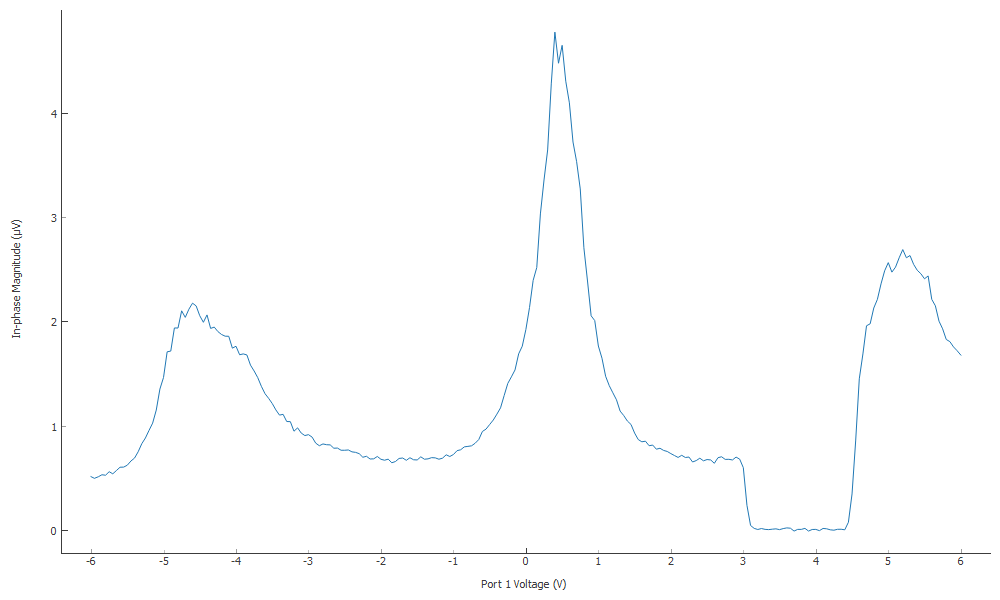

In [125]:
plot710[0]

In [114]:
srframe.volt_p1(0)

Pick a few gate points and run field sweeps on them: 2, -1, -2, -3, -7

In [116]:
triton.field()

7e-06

In [117]:
triton.magnet_swh()

1

In [118]:
triton.magnet_sweeprate()

0.1

In [135]:
triton.magnet_hold()

In [136]:
triton.field(-0.5)

Sweep time approximately 43.24 seconds


In [120]:
srframe.volt_p1(2)

In [123]:
lockin865.frequency()

13.6667

In [122]:
lockin830.time_constant()

0.1

In [124]:
lockin865.amplitude()

0.10000000149

In [139]:
triton.field()

-0.499983

In [140]:
# take a couple slow plots to 6T, just to get good sdH across the whole range
triton.magnet_sweeprate(0.05)
triton.field(6)
data711, plot711 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_2Vbg_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7810.018000000001 seconds
Started at 2020-03-24 15:02:39
DataSet:
   location = 'data/2020-03-24/#017_W5_865_40-39_830_39-38_fieldsweep_2Vbg_baseT_1nA_15-02-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-03-24 17:13:24


In [141]:
srframe.volt_p1(-1)
time.sleep(15)
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data712, plot712 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_-1Vbg_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7810.006 seconds
Started at 2020-03-24 17:13:51
DataSet:
   location = 'data/2020-03-24/#018_W5_865_40-39_830_39-38_fieldsweep_-1Vbg_baseT_1nA_17-13-50'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-03-24 19:24:37


In [142]:
srframe.volt_p1(-2)
time.sleep(15)
triton.magnet_sweeprate(0.05)
triton.field(6)
data713, plot713 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_-2Vbg_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7810.006 seconds
Started at 2020-03-24 19:25:01
DataSet:
   location = 'data/2020-03-24/#019_W5_865_40-39_830_39-38_fieldsweep_-2Vbg_baseT_1nA_19-25-00'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-03-24 21:35:47


In [143]:
srframe.volt_p1(-3)
time.sleep(15)
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data714, plot714 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_-3Vbg_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7810.006 seconds
Started at 2020-03-24 21:36:11
DataSet:
   location = 'data/2020-03-24/#020_W5_865_40-39_830_39-38_fieldsweep_-3Vbg_baseT_1nA_21-36-10'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-03-24 23:46:56


In [144]:
srframe.volt_p1(-6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data715, plot715 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_-6Vbg_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7810.006 seconds
Started at 2020-03-24 23:47:38
DataSet:
   location = 'data/2020-03-24/#021_W5_865_40-39_830_39-38_fieldsweep_-6Vbg_baseT_1nA_23-47-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-03-25 01:58:23


In [145]:
srframe.volt_p1(7)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data716, plot716 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_7Vbg_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7809.994 seconds
Started at 2020-03-25 01:59:25
DataSet:
   location = 'data/2020-03-25/#001_W5_865_40-39_830_39-38_fieldsweep_7Vbg_baseT_1nA_01-59-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-03-25 04:10:12


In [146]:
srframe.volt_p1(-1)
triton.field_set_stable(-0.25)
time.sleep(30)
triton.magnet_sweeprate(0.01)
triton.field(0.25)
data717, plot717 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=80, breakif=npd.breakat(triton.field, 0.25, 0.002, 10), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-1Vbg_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Please wait 309.988 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 3009.946 seconds
Started at 2020-03-25 04:16:16
DataSet:
   location = 'data/2020-03-25/#002_W5_865_40-39_830_39-38_smallfieldsweep_-1Vbg_baseT_1nA_04-16-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
   Measured | lockin830_X  | X            | (2400,)
   Measured | lockin830_Y  | Y            | (2400,)
Finished at 2020-03-25 05:06:34


In [147]:
triton.magnet_sweeprate(0.01)
triton.field(-0.25)
data718, plot718 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=80, breakif=npd.breakat(triton.field, -0.25, 0.002, 10), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-1Vbg_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 3009.946 seconds
Started at 2020-03-25 05:06:41
DataSet:
   location = 'data/2020-03-25/#003_W5_865_40-39_830_39-38_smallfieldsweep_-1Vbg_baseT_1nA_05-06-40'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
   Measured | lockin830_X  | X            | (2400,)
   Measured | lockin830_Y  | Y            | (2400,)
Finished at 2020-03-25 05:56:57


In [ ]:
plot718[0]

In [148]:
srframe.volt_p1(2)
time.sleep(30)
triton.magnet_sweeprate(0.01)
triton.field(0.25)
data719, plot719 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=80, breakif=npd.breakat(triton.field, 0.25, 0.002, 10), DataName='W5_865_40-39_830_39-38_smallfieldsweep_2Vbg_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 3009.946 seconds
Started at 2020-03-25 05:57:40
DataSet:
   location = 'data/2020-03-25/#004_W5_865_40-39_830_39-38_smallfieldsweep_2Vbg_baseT_1nA_05-57-39'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
   Measured | lockin830_X  | X            | (2400,)
   Measured | lockin830_Y  | Y            | (2400,)
Finished at 2020-03-25 06:47:55


In [149]:
triton.magnet_sweeprate(0.01)
triton.field(-0.25)
data720, plot720 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=80, breakif=npd.breakat(triton.field, -0.25, 0.002, 10), DataName='W5_865_40-39_830_39-38_smallfieldsweep_2Vbg_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 3010.114 seconds
Started at 2020-03-25 06:48:03
DataSet:
   location = 'data/2020-03-25/#005_W5_865_40-39_830_39-38_smallfieldsweep_2Vbg_baseT_1nA_06-48-02'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
   Measured | lockin830_X  | X            | (2400,)
   Measured | lockin830_Y  | Y            | (2400,)
Finished at 2020-03-25 07:38:18


In [150]:
srframe.volt_p1(7)
time.sleep(30)
triton.magnet_sweeprate(0.01)
triton.field(0.25)
data721, plot721 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=80, breakif=npd.breakat(triton.field, 0.25, 0.002, 10), DataName='W5_865_40-39_830_39-38_smallfieldsweep_7Vbg_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 3009.946 seconds
Started at 2020-03-25 07:39:03
DataSet:
   location = 'data/2020-03-25/#006_W5_865_40-39_830_39-38_smallfieldsweep_7Vbg_baseT_1nA_07-39-03'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
   Measured | lockin830_X  | X            | (2400,)
   Measured | lockin830_Y  | Y            | (2400,)
Finished at 2020-03-25 08:29:19


<IPython.core.display.Javascript object>


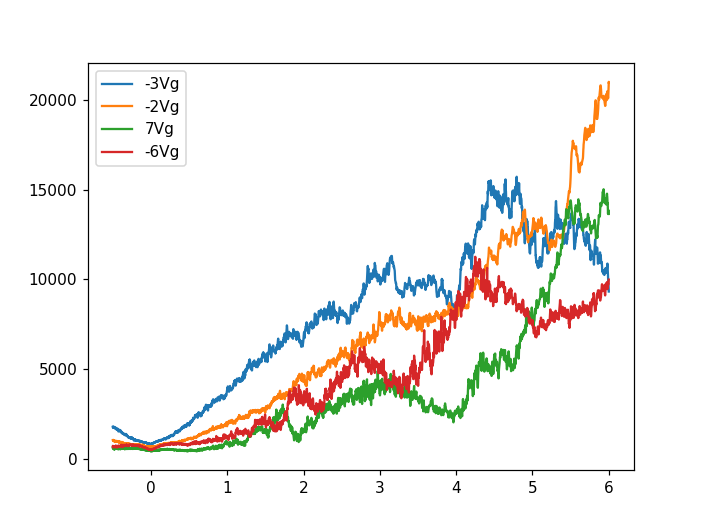

In [303]:
plt.figure()
plt.plot(data714.triton_field, data714.lockin865_X[:]/1e-9, label='-3Vg')
plt.plot(data713.triton_field, data713.lockin865_X[:]/1e-9, label='-2Vg')
plt.plot(data716.triton_field, data716.lockin865_X[:]/1e-9, label='7Vg')
plt.plot(data715.triton_field, data715.lockin865_X[:]/1e-9, label='-6Vg')
plt.legend()

In [299]:
plot721 = qc.QtPlot(x=data721.triton_field, y=data721.lockin830_X)

In [151]:
triton.magnet_sweeprate(0.01)
triton.field(-0.25)
data722, plot722 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=80, breakif=npd.breakat(triton.field, -0.25, 0.002, 10), DataName='W5_865_40-39_830_39-38_smallfieldsweep_7Vbg_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 3010.03 seconds
Started at 2020-03-25 08:29:26
DataSet:
   location = 'data/2020-03-25/#007_W5_865_40-39_830_39-38_smallfieldsweep_7Vbg_baseT_1nA_08-29-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
   Measured | lockin830_X  | X            | (2400,)
   Measured | lockin830_Y  | Y            | (2400,)
Finished at 2020-03-25 09:19:42


In [152]:
srframe.volt_p1(0)

In [166]:
from scipy.ndimage import gaussian_filter

<IPython.core.display.Javascript object>


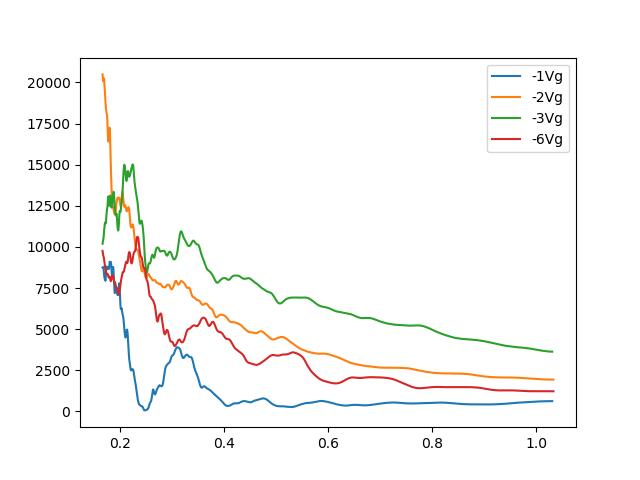

0.00 is not a value in the array
Plotted 0.00 instead
0.00 is not a value in the array
Plotted -0.00 instead
0.00 is not a value in the array
Plotted 0.00 instead
0.00 is not a value in the array
Plotted -0.00 instead


In [309]:
plt.figure()
Nmin = 500
data = data712  # down
dlast = np.where(np.isnan(data.triton_field[:]))[0][0]
dneg = npd.val_to_index([0], data.triton_field[:dlast])[0] - Nmin
plt.plot(1/data.triton_field[:dneg], gaussian_filter(data.lockin830_X[:dneg]/1e-9, 12), label='-1Vg')
data = data713
dlast = np.where(np.isnan(data.triton_field[:]))[0][0]
dneg = npd.val_to_index([0], data.triton_field[:dlast])[0] + Nmin
plt.plot(1/data.triton_field[dneg:dlast], gaussian_filter(data713.lockin865_X[dneg:dlast]/1e-9, 12), label='-2Vg')
data = data714
dlast = np.where(np.isnan(data.triton_field[:]))[0][0]
dneg = npd.val_to_index([0], data.triton_field[:dlast])[0] - Nmin
plt.plot(1/data.triton_field[:dneg], gaussian_filter(data.lockin865_X[:dneg]/1e-9, 12), label='-3Vg')
data = data715
dlast = np.where(np.isnan(data.triton_field[:]))[0][0]
dneg = npd.val_to_index([0], data.triton_field[:dlast])[0] + Nmin
plt.plot(1/data.triton_field[dneg:dlast], gaussian_filter(data715.lockin865_X[dneg:dlast]/1e-9, 12), label='-6Vg')
plt.legend()

In [214]:
lockin865.amplitude(0.5)  # 5 nA

In [216]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)

Sweep time approximately 160.012 seconds


In [222]:
triton.field()

-0.49999

In [234]:
lockin865.amplitude()

0.5

In [223]:
srframe.volt_p1(-1)  # do one at higher current. Then probably at higher temperatures.
time.sleep(15)
triton.magnet_sweeprate(0.05)
triton.field(6)
data723, plot723 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_-1Vbg_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7809.987999999999 seconds
Started at 2020-03-25 14:08:35


Failed to execute bg task
Traceback (most recent call last):
  File "c:\users\nplab\documents\qcodes\qcodes\loops.py", line 903, in _run_loop
    self.bg_task()
  File "c:\users\nplab\documents\qcodes\qcodes\instrument_drivers\nplab_drivers\common_commands.py", line 274, in _plot_update
    p.update()
  File "c:\users\nplab\documents\qcodes\qcodes\plots\base.py", line 280, in update
    self.update_plot()
  File "c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py", line 468, in update_plot
    plot_object.setData(*self._line_data(config['x'], config['y']))
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\pyqtgraph\multiprocess\remoteproxy.py", line 897, in __getattr__
    return self._handler.getObjAttr(self, attr, **opts)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\pyqtgraph\multiprocess\remoteproxy.py", line 532, in getObjAttr
    return self.send(request='getObjAttr', opts=dict(obj=obj, attr=attr), **kwds)
  File "C:\Users\NPLAB\Anaconda3\envs

DataSet:
   location = 'data/2020-03-25/#008_W5_865_40-39_830_39-38_fieldsweep_-1Vbg_baseT_5nA_14-08-34'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-03-25 16:19:20


ClosedError: 

In [232]:
data723 = qc.load_data('data/2020-03-25/#008_W5_865_40-39_830_39-38_fieldsweep_-1Vbg_baseT_5nA_14-08-34')

In [233]:
plot723 = qc.QtPlot(data723.lockin865_X)

Remote plot responded with  
Restarting remote plot


In [235]:
lockin865.amplitude(1)  # try 10 nA from now on

In [228]:
triton.magnet_sweeprate(0.15)

In [229]:
triton.field(-0.5)

Sweep time approximately 2610.004 seconds


In [230]:
triton.field()

5.347747

<IPython.core.display.Javascript object>


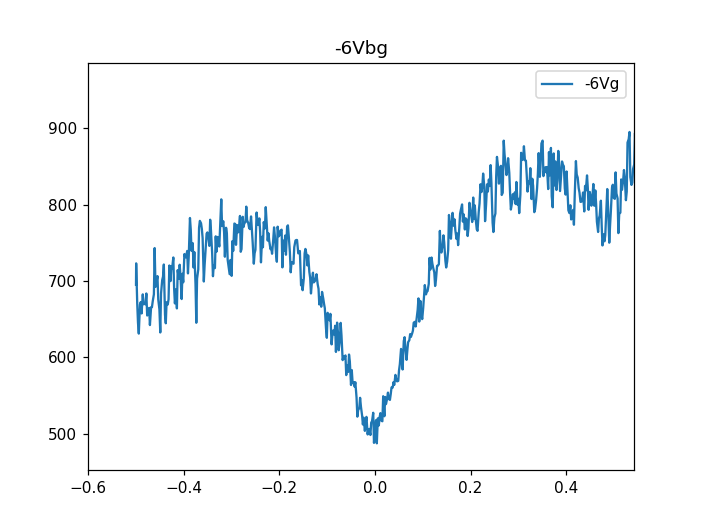

In [237]:
srframe.volt_p1(-6)

In [255]:
triton.field()

-0.500003

In [256]:
triton.magnet_sweeprate(0.15)
bvals = np.linspace(-0.5, 0.5, 201)
data724, plot724 = npd.single_param_sweep(triton.field_set_stable, bvals, 1.4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_865_40-39_830_39-38_fieldsweep_-6Vbg_baseT_10nA')

Started at 2020-03-25 17:16:01
Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.992 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.004 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.998000000000001 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.992 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.004 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.01 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.004 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.01 seconds for the field sweep, plus the time required for operating the switch...
Please wait 12.01 seconds for the field sweep, plus the time required 

In [257]:
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data725, plot725 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=80, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-6Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1210.006 seconds
Started at 2020-03-25 18:12:47
DataSet:
   location = 'data/2020-03-25/#010_W5_865_40-39_830_39-38_smallfieldsweep_-6Vbg_baseT_10nA_18-12-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
   Measured | lockin830_X  | X            | (2400,)
   Measured | lockin830_Y  | Y            | (2400,)
Finished at 2020-03-25 18:33:06


In [270]:
triton.pid_setpoint(0.7)

In [266]:
triton.pid_range(10)

In [261]:
triton.pid_mode(1)

In [265]:
triton.PT2h_temp_enable(0)# turn on off channel 1

In [271]:
triton.pid_setpoint(0.9)
time.sleep(360)
triton.magnet_sweeprate(0.05)
triton.field(0.5)
data726, plot726 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=80, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-6Vbg_0.9K_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1209.994 seconds
Started at 2020-03-25 18:52:34
DataSet:
   location = 'data/2020-03-25/#011_W5_865_40-39_830_39-38_smallfieldsweep_-6Vbg_0.9K_10nA_18-52-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
   Measured | lockin830_X  | X            | (2400,)
   Measured | lockin830_Y  | Y            | (2400,)
Finished at 2020-03-25 19:12:53


In [272]:
triton.field(-0.5)

Sweep time approximately 1210.018 seconds


In [274]:
triton.pid_range(100)

In [279]:
triton.pid_setpoint(5)

In [280]:
triton.pid_setpoint(5)
time.sleep(360)
triton.magnet_sweeprate(0.05)
triton.field(0.5)
data727, plot727 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=80, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-6Vbg_5K_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1210.018 seconds
Started at 2020-03-25 20:04:19
DataSet:
   location = 'data/2020-03-25/#012_W5_865_40-39_830_39-38_smallfieldsweep_-6Vbg_5K_10nA_20-04-18'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
   Measured | lockin830_X  | X            | (2400,)
   Measured | lockin830_Y  | Y            | (2400,)
Finished at 2020-03-25 20:24:38


In [282]:
triton.pid_setpoint(10)

In [283]:
triton.pid_setpoint(10)
time.sleep(360)
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data728, plot728 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=80, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-6Vbg_10K_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1210.012 seconds
Started at 2020-03-25 20:32:00
DataSet:
   location = 'data/2020-03-25/#013_W5_865_40-39_830_39-38_smallfieldsweep_-6Vbg_10K_10nA_20-31-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (2400,)
   Measured | time0        | time0        | (2400,)
   Measured | triton_field | field        | (2400,)
   Measured | lockin865_X  | X            | (2400,)
   Measured | lockin865_Y  | Y            | (2400,)
   Measured | lockin830_X  | X            | (2400,)
   Measured | lockin830_Y  | Y            | (2400,)
Finished at 2020-03-25 20:52:19


<IPython.core.display.Javascript object>


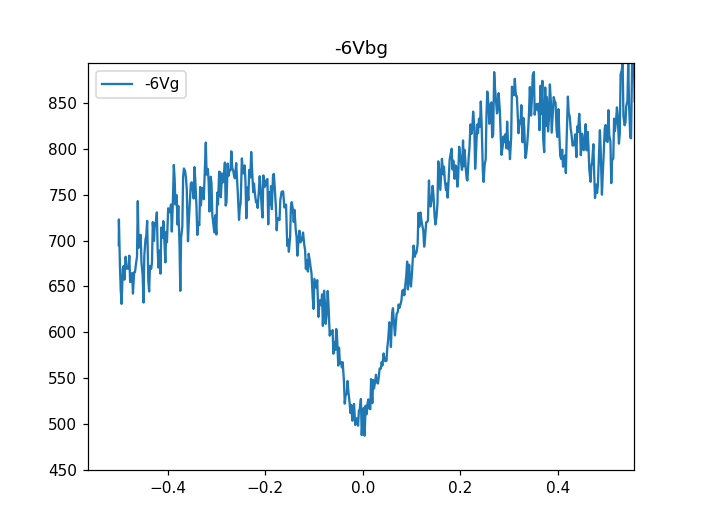

In [251]:
plt.figure()
plt.title('-6Vbg')
plt.plot(data715.triton_field, data715.lockin865_X[:]/1e-9, label='-6Vg')
plt.legend()

In [288]:
triton.pid_mode(1)

In [293]:
triton.pid_setpoint(3)

In [292]:
triton.pid_range(100)

AttributeError: 'list' object has no attribute 'close'